In [1]:
# Importing Libraries

# Data Analysis and Visualization libraries
import os, sys
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()
from tqdm import tqdm
import missingno as msno
from collections import Counter
import random as rn
from functools import reduce 


pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


# Stats Framework
from scipy import stats
from scipy.stats import ttest_ind
from statsmodels.stats import weightstats as stests 
from scipy.stats import chi2_contingency
from scipy.stats import chi2

# Scikit Learn Framework
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from feature_engine.encoding import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score, log_loss
from sklearn.metrics import roc_curve
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.calibration import CalibratedClassifierCV
from prettytable import PrettyTable


# Import and suppress warnings
import warnings
warnings.filterwarnings("ignore")

# Loading Dataset

In [2]:
data = pd.read_csv("Data.csv")

###### Print top 5 rows in the dataframe.

In [3]:
data.head().style.set_properties(**{'background-color': '#E9F6E2','color': 'black','border-color': '#8b8c8c'})

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,education,occupation,income,car,Bar,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
0,No Urgent Place,Alone,Sunny,55,Restaurant(<20),1d,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,nan,never,never,nan,4~8,1~3,1,0,0,0,1,1
1,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,nan,never,never,nan,4~8,1~3,1,0,0,0,1,0
2,No Urgent Place,Friend(s),Sunny,80,Carry out & Take away,2h,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,nan,never,never,nan,4~8,1~3,1,1,0,0,1,1
3,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,nan,never,never,nan,4~8,1~3,1,1,0,0,1,0
4,No Urgent Place,Friend(s),Sunny,80,Coffee House,1d,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,nan,never,never,nan,4~8,1~3,1,1,0,0,1,0


###### Print bottom 5 rows in the dataframe.

In [4]:
data.head().style.set_properties(**{'background-color': '#E9F6E2','color': 'black','border-color': '#8b8c8c'})

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,education,occupation,income,car,Bar,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
0,No Urgent Place,Alone,Sunny,55,Restaurant(<20),1d,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,nan,never,never,nan,4~8,1~3,1,0,0,0,1,1
1,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,nan,never,never,nan,4~8,1~3,1,0,0,0,1,0
2,No Urgent Place,Friend(s),Sunny,80,Carry out & Take away,2h,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,nan,never,never,nan,4~8,1~3,1,1,0,0,1,1
3,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,nan,never,never,nan,4~8,1~3,1,1,0,0,1,0
4,No Urgent Place,Friend(s),Sunny,80,Coffee House,1d,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,nan,never,never,nan,4~8,1~3,1,1,0,0,1,0


In [5]:
# copying data for EDA purpose
data1 = data.copy()
data2 = data.copy()
data3 = data.copy()

# Attribute Information

destination          : No Urgent Place, Home, Work
    
passanger            : Alone, Friend(s), Kid(s), Partner (who are the passengers in the car)
    
weather              : Sunny, Rainy, Snowy

temperature          : temperature in Fahrenheit when user is driving (55, 80, 30)

coupon               : coupon type offered by company (Restaurant(<20$), Coffee House, Carry out & Take away, Bar, 
                                                       Restaurant($20-50))
                       Here, <20$ is the average pay per user in a not too expensive restaurant, 
                       Restaurant($20-50) means the average pay per user is between 20$-50$ which little bit expensive 
                       restaurant.
                       
expiration           : coupon expires in 1 day or in 2 hours (1d, 2h)

gender               : Female, Male

age                  : 21, 46, 26, 31, 41, 50plus, 36, below21

maritalStatus        : Unmarried partner, Single, Married partner, Divorced, Widowed

has_children         : 1: has children, 0: No children

education            : Some college — no degree, Bachelors degree, Associates degree, High School 
                       Graduate, Graduate degree (Masters or Doctorate), Some High School
                       
occupation           : unique 25 number of occupation of users (Unemployed, Architecture & Engineering,                Student,Education&Training&Library, Healthcare Support,Healthcare Practitioners & Technical, Sales & Related,                                    Management,Arts Design Entertainment Sports & Media, Computer &                                  Mathematical,Life Physical Social Science, Personal Care & Service,                              Community & Social Services, Office & Administrative Support, Construction                        & Extraction, Legal, Retired, Installation Maintenance & Repair,                                  Transportation & Material Moving, Business & Financial, Protective                                Service, Food Preparation & Serving Related, Production Occupations,                              Building & Grounds Cleaning & Maintenance, Farming Fishing & Forestry)

income               : income of user (Less than 12500,12500 — 24999,25000 — 37499,37500 — 49999,50000 — 62499,62500 — 74999,75000 — 87499,87500 —                                          99999,100000 or More) in $

car                  : Description of vehicle which driven by user (Scooter and motorcycle, crossover, Mazda5) (99% of values are missing in this feature)

Bar                  : how many times does the user go to a bar every month? (never, less1, 1~3, 4~8, gt8, nan)

CoffeeHouse          : how many times does the user go to a coffeehouse every month? (never, less1, 1~3, 4~8, gt8, nan)

CarryAway            : how many times does the user get take-away food every month? (never,                              less1, 1~3, 4~8, gt8, nan) 

RestaurantLessThan20 : how many times does the user go to a restaurant with an average expense                          per person of less than $20 every month? (never, less1, 1~3, 4~8, gt8,                            nan)

Restaurant20To50     : how many times does the user go to a restaurant with average expense per                          person of $20 — $50 every month? (never, less1, 1~3, 4~8, gt8, nan)  

toCoupon_GEQ5min     : driving distance to the restaurant/cafe/bar for using the coupon is                              greater than 5 minutes (0,1) 

toCoupon_GEQ15min    : driving distance to the restaurant/cafe/bar for using the coupon is                              greater than 15 minutes (0,1)

toCoupon_GEQ25min    : driving distance to the restaurant/cafe/bar for using the coupon is                              greater than 25 minutes (0,1)

direction_same       : whether the restaurant/cafe/bar is in the same direction as user’s current                        destination (0,1) 

direction_opp        : whether the restaurant/cafe/bar is in the opposite direction as user’s                            current destination (0,1)

Accept(Y/N?)         : whether the coupon is accepted or rejected, 1:accepted, 0:rejected

#  Data Wrangling

a) Computing the size of DataFrame

b) Enlist the Column Labels

c) Generating Basic Information of Attributes

d) Enlisting Numerical Features

e )Enlisting Categorical Features

f) Checking for Missing Values

g) Descriptive Analysis on Numerical Attributes

h) Drop Unnecessary Columns

i) Descriptive Analysis on Categorical Attributes

j) Checking Unique Values on Categorical Attributes

k) Checking Duplicate values

### a) Computing the size of DataFrame


In [6]:
print(f"The shape of the Dataset : {data.shape}")
print(f"Attrition Dataset: Rows= {data.shape[0]}, Columns= {data.shape[1]}")

The shape of the Dataset : (12684, 25)
Attrition Dataset: Rows= 12684, Columns= 25


### b) Enlist the Column Labels


In [7]:
print("Column labels in the dataset in column order:")
print("*"*50)
for column in data.columns:
    print(column)

Column labels in the dataset in column order:
**************************************************
destination
passanger
weather
temperature
coupon
expiration
gender
age
maritalStatus
has_children
education
occupation
income
car
Bar
CoffeeHouse
CarryAway
RestaurantLessThan20
Restaurant20To50
toCoupon_GEQ5min
toCoupon_GEQ15min
toCoupon_GEQ25min
direction_same
direction_opp
Accept(Y/N?)


### c) Generating Basic Information of Attributes



In [8]:
# Print the Long summary of the dataframe by setting verbose = True
# Check for Non-Null or Nan Nalues in the dataset.
print(data.info(verbose = True))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12684 entries, 0 to 12683
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   destination           12684 non-null  object
 1   passanger             12684 non-null  object
 2   weather               12684 non-null  object
 3   temperature           12684 non-null  int64 
 4   coupon                12684 non-null  object
 5   expiration            12684 non-null  object
 6   gender                12684 non-null  object
 7   age                   12684 non-null  object
 8   maritalStatus         12684 non-null  object
 9   has_children          12684 non-null  int64 
 10  education             12684 non-null  object
 11  occupation            12684 non-null  object
 12  income                12684 non-null  object
 13  car                   108 non-null    object
 14  Bar                   12577 non-null  object
 15  CoffeeHouse           12467 non-null

* There are only 6 Numerical Attributes in the dataset.
* On the other hand we have 18 Categorical Attributes.

### d) Enlisting Numerical Features

In [9]:
data.select_dtypes(np.number).sample(5).style.set_properties(**{"background-color":"#E9F6E2", "color":"black",
                                                               "border-color":"#8b8c8c"})

,temperature,has_children,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
7887,80,1,1,1,0,0,1,0
1624,55,0,1,0,0,1,0,1
7936,30,0,1,1,0,0,1,1
11279,80,0,1,1,0,0,1,1
4137,80,1,1,0,0,0,1,1


* Some of the numerical features are storing cateegories labelled in numbers.
* So for better analysis we will replace those labelled numerical values with appropriate categorical values.

### e )Enlisting Categorical Features

In [10]:
data.select_dtypes(include="O").sample(5).style.set_properties(**{'background-color': '#E9F6E2',
                                                                'color': 'black','border-color': '#8b8c8c'})


,destination,passanger,weather,coupon,expiration,gender,age,maritalStatus,education,occupation,income,car,Bar,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50
274,Home,Alone,Sunny,Coffee House,2h,Female,31,Married partner,Graduate degree (Masters or Doctorate),Unemployed,$62500 - $74999,nan,never,less1,1~3,less1,less1
2725,Home,Alone,Sunny,Bar,1d,Male,21,Single,Bachelors degree,Computer & Mathematical,$87500 - $99999,nan,1~3,1~3,1~3,4~8,1~3
9677,Home,Alone,Rainy,Bar,1d,Male,21,Single,Some college - no degree,Student,$62500 - $74999,nan,never,never,4~8,1~3,1~3
5533,Home,Alone,Sunny,Coffee House,2h,Female,50plus,Single,High School Graduate,Management,$37500 - $49999,nan,less1,less1,less1,less1,1~3
5201,No Urgent Place,Kid(s),Sunny,Restaurant(<20),2h,Female,50plus,Unmarried partner,Some college - no degree,Management,$37500 - $49999,nan,never,never,4~8,1~3,less1


### f) Checking for Missing Values



In [11]:
print("Is there any missing value present or not ?", data1.isnull().values.any())
print("*"*50)
#  Calculate the number of missing values in each column    
missing_df = data.isnull().sum().to_frame().rename(columns={0:"Total No. of Missing Values"})
missing_df["% of Missing Values"] = round((missing_df["Total No. of Missing Values"]/len(data))*100,2)
missing_df

Is there any missing value present or not ? True
**************************************************


,Total No. of Missing Values,% of Missing Values
destination,0,0.00
passanger,0,0.00
weather,0,0.00
temperature,0,0.00
coupon,0,0.00
expiration,0,0.00
gender,0,0.00
age,0,0.00
maritalStatus,0,0.00
has_children,0,0.00


<AxesSubplot:>

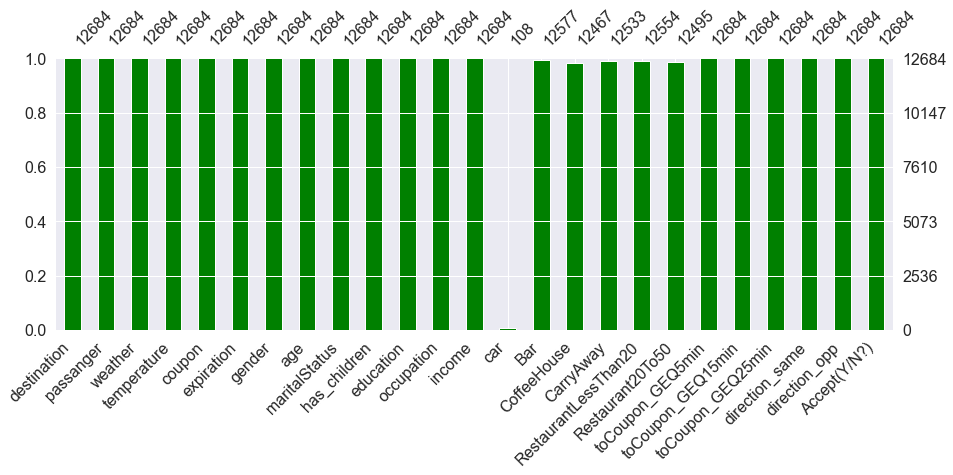

In [12]:
# Visualizing the missing values
msno.bar(data,figsize=(15,5), color="green")

### g) Descriptive Analysis on Numerical Attributes



In [13]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
temperature,12684.0,63.301798,19.154486,30.0,55.0,80.0,80.0,80.0
has_children,12684.0,0.414144,0.492593,0.0,0.0,0.0,1.0,1.0
toCoupon_GEQ5min,12684.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
toCoupon_GEQ15min,12684.0,0.561495,0.496224,0.0,0.0,1.0,1.0,1.0
toCoupon_GEQ25min,12684.0,0.119126,0.323950,0.0,0.0,0.0,0.0,1.0
direction_same,12684.0,0.214759,0.410671,0.0,0.0,0.0,0.0,1.0
direction_opp,12684.0,0.785241,0.410671,0.0,1.0,1.0,1.0,1.0
Accept(Y/N?),12684.0,0.568433,0.495314,0.0,0.0,1.0,1.0,1.0


### h) Descriptive Analysis on Categorical Attributes

In [14]:
data.describe(include="O").T

,count,unique,top,freq
destination,12684,3,No Urgent Place,6283
passanger,12684,4,Alone,7305
weather,12684,3,Sunny,10069
coupon,12684,5,Coffee House,3996
expiration,12684,2,1d,7091
gender,12684,2,Female,6511
age,12684,8,21,2653
maritalStatus,12684,5,Married partner,5100
education,12684,6,Some college - no degree,4351
occupation,12684,25,Unemployed,1870


### i) Checking Unique Values on Categorical Attributes



In [15]:
# Calculate the number of unique values in each column
for column in data.columns:
    print(f"{column} - Number of unique values : {data[column].nunique()}")
    print("=============================================================")

destination - Number of unique values : 3
passanger - Number of unique values : 4
weather - Number of unique values : 3
temperature - Number of unique values : 3
coupon - Number of unique values : 5
expiration - Number of unique values : 2
gender - Number of unique values : 2
age - Number of unique values : 8
maritalStatus - Number of unique values : 5
has_children - Number of unique values : 2
education - Number of unique values : 6
occupation - Number of unique values : 25
income - Number of unique values : 9
car - Number of unique values : 5
Bar - Number of unique values : 5
CoffeeHouse - Number of unique values : 5
CarryAway - Number of unique values : 5
RestaurantLessThan20 - Number of unique values : 5
Restaurant20To50 - Number of unique values : 5
toCoupon_GEQ5min - Number of unique values : 1
toCoupon_GEQ15min - Number of unique values : 2
toCoupon_GEQ25min - Number of unique values : 2
direction_same - Number of unique values : 2
direction_opp - Number of unique values : 2
Acc

In [16]:
categorical_features = []
for column in data.columns:
    if data[column].dtype == object and len(data[column].unique()) <= 30:
        categorical_features.append(column)
        print(f"{column} : {data[column].unique()}")
        print(data[column].value_counts())
        print("====================================================================================")
# categorical_features.remove('Accept(Y/N?)')

destination : ['No Urgent Place' 'Home' 'Work']
No Urgent Place    6283
Home               3237
Work               3164
Name: destination, dtype: int64
passanger : ['Alone' 'Friend(s)' 'Kid(s)' 'Partner']
Alone        7305
Friend(s)    3298
Partner      1075
Kid(s)       1006
Name: passanger, dtype: int64
weather : ['Sunny' 'Rainy' 'Snowy']
Sunny    10069
Snowy     1405
Rainy     1210
Name: weather, dtype: int64
coupon : ['Restaurant(<20)' 'Coffee House' 'Carry out & Take away' 'Bar'
 'Restaurant(20-50)']
Coffee House             3996
Restaurant(<20)          2786
Carry out & Take away    2393
Bar                      2017
Restaurant(20-50)        1492
Name: coupon, dtype: int64
expiration : ['1d' '2h']
1d    7091
2h    5593
Name: expiration, dtype: int64
gender : ['Female' 'Male']
Female    6511
Male      6173
Name: gender, dtype: int64
age : ['21' '46' '26' '31' '41' '50plus' '36' 'below21']
21         2653
26         2559
31         2039
50plus     1788
36         1319
41         10

### k) Checking Duplicate values

In [17]:
dups = data.duplicated()
print("No of duplicate rows = %d" %(dups.sum()))
data1[dups]

No of duplicate rows = 291


,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,education,occupation,income,car,Bar,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
30,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,21,Single,0,Bachelors degree,Architecture & Engineering,$62500 - $74999,NaN,never,less1,4~8,4~8,less1,1,0,0,0,1,0
96,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,21,Single,0,Associates degree,Student,$12500 - $24999,NaN,1~3,less1,1~3,less1,1~3,1,0,0,0,1,1
162,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,26,Single,0,Some college - no degree,Healthcare Support,$37500 - $49999,NaN,gt8,gt8,gt8,gt8,gt8,1,0,0,0,1,0
184,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,26,Single,1,Associates degree,Healthcare Practitioners & Technical,$25000 - $37499,NaN,never,1~3,4~8,1~3,less1,1,0,0,0,1,1
201,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,21,Single,0,Some college - no degree,Sales & Related,$100000 or More,NaN,less1,never,gt8,1~3,less1,1,0,0,0,1,0
395,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Single,0,Bachelors degree,Student,$100000 or More,NaN,1~3,never,1~3,1~3,4~8,1,0,0,0,1,0
460,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,31,Single,1,High School Graduate,Management,$50000 - $62499,NaN,gt8,gt8,gt8,gt8,gt8,1,0,0,0,1,0
481,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,26,Single,0,Some college - no degree,Unemployed,$87500 - $99999,NaN,never,1~3,4~8,less1,never,1,0,0,0,1,1
575,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,31,Single,0,Some college - no degree,Sales & Related,$37500 - $49999,NaN,4~8,gt8,gt8,1~3,less1,1,0,0,0,1,1
597,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,26,Single,0,Bachelors degree,Office & Administrative Support,$50000 - $62499,NaN,4~8,never,4~8,1~3,less1,1,0,0,0,1,0


# Explaratory Data Analysis

In [18]:
# Remove duplicates
duplicate = data1[data1.duplicated(keep = 'last')]

data1 = data1.drop_duplicates()
print(data1.shape)

(12393, 25)


In [19]:
# missing values
print('Is there any missing value present or not?',data1.isnull().values.any())
missing_percentage = data1.isnull().sum()/len(data1)*100
missing_value_df = pd.DataFrame({'missing_count': data1.isnull().sum(),
                                 'missing_percentage': missing_percentage})
missing_value_df[missing_value_df.missing_count != 0]

Is there any missing value present or not? True


,missing_count,missing_percentage
car,12287,99.144678
Bar,106,0.855322
CoffeeHouse,215,1.734850
CarryAway,148,1.194223
RestaurantLessThan20,128,1.032841
Restaurant20To50,188,1.516985


In [20]:
# # Dropping "car" as it contains more than 99 percentage missing values
# data1 = data1.drop(["car"], axis=1)
# print(data1.shape)

In [21]:
data1[pd.isnull(data1["Bar"])]

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,education,occupation,income,car,Bar,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
517,No Urgent Place,Friend(s),Sunny,80,Bar,1d,Male,50plus,Divorced,1,Some college - no degree,Management,$62500 - $74999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,0
518,No Urgent Place,Friend(s),Sunny,80,Coffee House,1d,Male,50plus,Divorced,1,Some college - no degree,Management,$62500 - $74999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,0
519,No Urgent Place,Friend(s),Sunny,80,Restaurant(<20),1d,Male,50plus,Divorced,1,Some college - no degree,Management,$62500 - $74999,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,0,1,1
520,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,50plus,Divorced,1,Some college - no degree,Management,$62500 - $74999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,0
521,No Urgent Place,Friend(s),Sunny,55,Coffee House,2h,Male,50plus,Divorced,1,Some college - no degree,Management,$62500 - $74999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,1
522,No Urgent Place,Alone,Sunny,55,Coffee House,2h,Male,50plus,Divorced,1,Some college - no degree,Management,$62500 - $74999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,1
852,No Urgent Place,Partner,Sunny,80,Coffee House,2h,Male,41,Married partner,0,Bachelors degree,Unemployed,$87500 - $99999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,1
853,No Urgent Place,Partner,Sunny,80,Restaurant(20-50),1d,Male,41,Married partner,0,Bachelors degree,Unemployed,$87500 - $99999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,1
854,No Urgent Place,Partner,Sunny,80,Bar,2h,Male,41,Married partner,0,Bachelors degree,Unemployed,$87500 - $99999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,0
855,No Urgent Place,Partner,Sunny,80,Coffee House,2h,Male,41,Married partner,0,Bachelors degree,Unemployed,$87500 - $99999,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,0,1,1


In [22]:
data1[pd.isnull(data1["CoffeeHouse"])]

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,education,occupation,income,car,Bar,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
495,No Urgent Place,Alone,Sunny,55,Restaurant(<20),1d,Male,26,Unmarried partner,0,Bachelors degree,Community & Social Services,$12500 - $24999,NaN,never,NaN,less1,less1,less1,1,0,0,0,1,1
496,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,26,Unmarried partner,0,Bachelors degree,Community & Social Services,$12500 - $24999,NaN,never,NaN,less1,less1,less1,1,0,0,0,1,1
497,No Urgent Place,Friend(s),Sunny,80,Carry out & Take away,2h,Male,26,Unmarried partner,0,Bachelors degree,Community & Social Services,$12500 - $24999,NaN,never,NaN,less1,less1,less1,1,1,0,0,1,0
498,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,26,Unmarried partner,0,Bachelors degree,Community & Social Services,$12500 - $24999,NaN,never,NaN,less1,less1,less1,1,1,0,0,1,0
499,No Urgent Place,Friend(s),Sunny,80,Coffee House,1d,Male,26,Unmarried partner,0,Bachelors degree,Community & Social Services,$12500 - $24999,NaN,never,NaN,less1,less1,less1,1,1,0,0,1,0
500,No Urgent Place,Friend(s),Sunny,80,Restaurant(<20),2h,Male,26,Unmarried partner,0,Bachelors degree,Community & Social Services,$12500 - $24999,NaN,never,NaN,less1,less1,less1,1,1,0,0,1,1
501,No Urgent Place,Friend(s),Sunny,55,Carry out & Take away,1d,Male,26,Unmarried partner,0,Bachelors degree,Community & Social Services,$12500 - $24999,NaN,never,NaN,less1,less1,less1,1,1,0,0,1,1
502,No Urgent Place,Partner,Sunny,80,Coffee House,2h,Male,26,Unmarried partner,0,Bachelors degree,Community & Social Services,$12500 - $24999,NaN,never,NaN,less1,less1,less1,1,0,0,0,1,0
503,No Urgent Place,Partner,Sunny,80,Restaurant(20-50),1d,Male,26,Unmarried partner,0,Bachelors degree,Community & Social Services,$12500 - $24999,NaN,never,NaN,less1,less1,less1,1,0,0,0,1,1
504,No Urgent Place,Partner,Sunny,80,Bar,2h,Male,26,Unmarried partner,0,Bachelors degree,Community & Social Services,$12500 - $24999,NaN,never,NaN,less1,less1,less1,1,0,0,0,1,0


In [23]:
data1[pd.isnull(data1["CarryAway"])]

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,education,occupation,income,car,Bar,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
0,No Urgent Place,Alone,Sunny,55,Restaurant(<20),1d,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,NaN,never,never,NaN,4~8,1~3,1,0,0,0,1,1
1,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,NaN,never,never,NaN,4~8,1~3,1,0,0,0,1,0
2,No Urgent Place,Friend(s),Sunny,80,Carry out & Take away,2h,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,NaN,never,never,NaN,4~8,1~3,1,1,0,0,1,1
3,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,NaN,never,never,NaN,4~8,1~3,1,1,0,0,1,0
4,No Urgent Place,Friend(s),Sunny,80,Coffee House,1d,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,NaN,never,never,NaN,4~8,1~3,1,1,0,0,1,0
5,No Urgent Place,Friend(s),Sunny,80,Restaurant(<20),2h,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,NaN,never,never,NaN,4~8,1~3,1,1,0,0,1,1
6,No Urgent Place,Friend(s),Sunny,55,Carry out & Take away,1d,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,NaN,never,never,NaN,4~8,1~3,1,1,0,0,1,1
7,No Urgent Place,Kid(s),Sunny,80,Restaurant(<20),2h,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,NaN,never,never,NaN,4~8,1~3,1,1,0,0,1,1
8,No Urgent Place,Kid(s),Sunny,80,Carry out & Take away,2h,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,NaN,never,never,NaN,4~8,1~3,1,1,0,0,1,1
9,No Urgent Place,Kid(s),Sunny,80,Bar,1d,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,NaN,never,never,NaN,4~8,1~3,1,1,0,0,1,0


In [24]:
data1[pd.isnull(data1["RestaurantLessThan20"])]

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,education,occupation,income,car,Bar,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
517,No Urgent Place,Friend(s),Sunny,80,Bar,1d,Male,50plus,Divorced,1,Some college - no degree,Management,$62500 - $74999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,0
518,No Urgent Place,Friend(s),Sunny,80,Coffee House,1d,Male,50plus,Divorced,1,Some college - no degree,Management,$62500 - $74999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,0
519,No Urgent Place,Friend(s),Sunny,80,Restaurant(<20),1d,Male,50plus,Divorced,1,Some college - no degree,Management,$62500 - $74999,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,0,1,1
520,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,50plus,Divorced,1,Some college - no degree,Management,$62500 - $74999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,0
521,No Urgent Place,Friend(s),Sunny,55,Coffee House,2h,Male,50plus,Divorced,1,Some college - no degree,Management,$62500 - $74999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,1
522,No Urgent Place,Alone,Sunny,55,Coffee House,2h,Male,50plus,Divorced,1,Some college - no degree,Management,$62500 - $74999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,1
852,No Urgent Place,Partner,Sunny,80,Coffee House,2h,Male,41,Married partner,0,Bachelors degree,Unemployed,$87500 - $99999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,1
853,No Urgent Place,Partner,Sunny,80,Restaurant(20-50),1d,Male,41,Married partner,0,Bachelors degree,Unemployed,$87500 - $99999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,1
854,No Urgent Place,Partner,Sunny,80,Bar,2h,Male,41,Married partner,0,Bachelors degree,Unemployed,$87500 - $99999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,0
855,No Urgent Place,Partner,Sunny,80,Coffee House,2h,Male,41,Married partner,0,Bachelors degree,Unemployed,$87500 - $99999,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,0,1,1


In [25]:
data1[pd.isnull(data1["Restaurant20To50"])]

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,education,occupation,income,car,Bar,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
517,No Urgent Place,Friend(s),Sunny,80,Bar,1d,Male,50plus,Divorced,1,Some college - no degree,Management,$62500 - $74999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,0
518,No Urgent Place,Friend(s),Sunny,80,Coffee House,1d,Male,50plus,Divorced,1,Some college - no degree,Management,$62500 - $74999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,0
519,No Urgent Place,Friend(s),Sunny,80,Restaurant(<20),1d,Male,50plus,Divorced,1,Some college - no degree,Management,$62500 - $74999,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,0,1,1
520,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,50plus,Divorced,1,Some college - no degree,Management,$62500 - $74999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,0
521,No Urgent Place,Friend(s),Sunny,55,Coffee House,2h,Male,50plus,Divorced,1,Some college - no degree,Management,$62500 - $74999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,1
522,No Urgent Place,Alone,Sunny,55,Coffee House,2h,Male,50plus,Divorced,1,Some college - no degree,Management,$62500 - $74999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,1
852,No Urgent Place,Partner,Sunny,80,Coffee House,2h,Male,41,Married partner,0,Bachelors degree,Unemployed,$87500 - $99999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,1
853,No Urgent Place,Partner,Sunny,80,Restaurant(20-50),1d,Male,41,Married partner,0,Bachelors degree,Unemployed,$87500 - $99999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,1
854,No Urgent Place,Partner,Sunny,80,Bar,2h,Male,41,Married partner,0,Bachelors degree,Unemployed,$87500 - $99999,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,1,0
855,No Urgent Place,Partner,Sunny,80,Coffee House,2h,Male,41,Married partner,0,Bachelors degree,Unemployed,$87500 - $99999,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,0,1,1


In [26]:
missing_features = ["Bar", "CoffeeHouse", "CarryAway", "RestaurantLessThan20", "Restaurant20To50"]
for i in data1.columns:
    if i in missing_features:
        print(f"{i} : {data1[i].unique()}")
        print(data1[i].value_counts())
        print(f"most frequent in {i} is : {data1[i].mode()}")
        print("="*100)

Bar : ['never' 'less1' '1~3' 'gt8' nan '4~8']
never    5089
less1    3383
1~3      2432
4~8      1045
gt8       338
Name: Bar, dtype: int64
most frequent in Bar is : 0    never
Name: Bar, dtype: object
CoffeeHouse : ['never' 'less1' '4~8' '1~3' 'gt8' nan]
less1    3310
1~3      3138
never    2895
4~8      1752
gt8      1083
Name: CoffeeHouse, dtype: int64
most frequent in CoffeeHouse is : 0    less1
Name: CoffeeHouse, dtype: object
CarryAway : [nan '4~8' '1~3' 'gt8' 'less1' 'never']
1~3      4571
4~8      4171
less1    1819
gt8      1535
never     149
Name: CarryAway, dtype: int64
most frequent in CarryAway is : 0    1~3
Name: CarryAway, dtype: object
RestaurantLessThan20 : ['4~8' '1~3' 'less1' 'gt8' nan 'never']
1~3      5269
4~8      3493
less1    2034
gt8      1253
never     216
Name: RestaurantLessThan20, dtype: int64
most frequent in RestaurantLessThan20 is : 0    1~3
Name: RestaurantLessThan20, dtype: object
Restaurant20To50 : ['1~3' 'less1' 'never' 'gt8' '4~8' nan]
less1    5946

In [27]:
print(f"Most frequent in Bar : {data1.Bar.mode()}")
print("*"*100)
print(f"Most frequent in CoffeeHouse : {data1.CoffeeHouse.mode()}")
print("*"*100)
print(f"Most frequent in CarryAway : {data1.CarryAway.mode()}")
print("*"*100)
print(f"Most frequent in RestaurantLessThan20 : {data1.RestaurantLessThan20.mode()}")
print("*"*100)
print(f"Most frequent in Restaurant20To50 : {data1.Restaurant20To50.mode()}")


Most frequent in Bar : 0    never
Name: Bar, dtype: object
****************************************************************************************************
Most frequent in CoffeeHouse : 0    less1
Name: CoffeeHouse, dtype: object
****************************************************************************************************
Most frequent in CarryAway : 0    1~3
Name: CarryAway, dtype: object
****************************************************************************************************
Most frequent in RestaurantLessThan20 : 0    1~3
Name: RestaurantLessThan20, dtype: object
****************************************************************************************************
Most frequent in Restaurant20To50 : 0    less1
Name: Restaurant20To50, dtype: object


In [28]:
# mode before impution
features_bf_imp = ["Bar", "CoffeeHouse", "CarryAway", "RestaurantLessThan20", "Restaurant20To50"]
mode = ["never", "less1", "1~3", "1~3", "less1"]
df_data = {"features" : features_bf_imp, "mode" : mode}
df_bf_clt = pd.DataFrame(df_data)
df_bf_clt

,features,mode
0,Bar,never
1,CoffeeHouse,less1
2,CarryAway,1~3
3,RestaurantLessThan20,1~3
4,Restaurant20To50,less1


##### mode impution for missing values

In [30]:
# mode imputation for missing values
data1['Bar'] = data1['Bar'].fillna(data1['Bar'].value_counts().index[0])
data1['CoffeeHouse'] = data1['CoffeeHouse'].fillna(data1['CoffeeHouse'].value_counts().index[0])
data1['CarryAway'] = data1['CarryAway'].fillna(data1['CarryAway'].value_counts().index[0])
data1['RestaurantLessThan20'] = data1['RestaurantLessThan20'].fillna(data1['RestaurantLessThan20']
                                                                     .value_counts().index[0])
data1['Restaurant20To50'] = data1['Restaurant20To50'].fillna(data1['Restaurant20To50']
                                                             .value_counts().index[0])

In [31]:
# missing values
print('Is there any missing value present or not?',data1.isnull().values.any())
missing_percentage = data1.isnull().sum()/len(data1)*100
missing_value_df = pd.DataFrame({'missing_count': data1.isnull().sum(),
                                 'missing_percentage': missing_percentage})
missing_value_df[missing_value_df.missing_count != 0]

Is there any missing value present or not? True


,missing_count,missing_percentage
car,12287,99.144678


##### Function for Univariate Analysis

In [32]:
# Function for Univariate Analysis
def Univariate_Analysis(column_name):
    df_EDA = pd.DataFrame(sorted(list(data[column_name].unique())),columns=[column_name])
    df_EDA['Total_Count'] = list(data.groupby(column_name)["Accept(Y/N?)"].count())
    df_EDA["% of Total"] = list(data[column_name].value_counts()/data.shape[0]*100)
    df_EDA['Accepted'] = list(data[data["Accept(Y/N?)"]==1].groupby(column_name)
                              ["Accept(Y/N?)"].count())
    df_EDA['Rejected'] = list(data[data["Accept(Y/N?)"]==0].groupby(column_name)
                              ["Accept(Y/N?)"].count())
    df_EDA['%Accepted'] = round(df_EDA['Accepted']/df_EDA['Total_Count']*100,3)
    df_EDA['%Rejected'] = round(df_EDA['Rejected']/df_EDA['Total_Count']*100,3)
    df_EDA = df_EDA.sort_values(by='Total_Count', ascending=False)
    
    fig = plt.subplots(figsize =(8, 4))
    plt.barh(df_EDA[column_name],df_EDA['Total_Count'])
    plt.barh(df_EDA[column_name],df_EDA['Accepted'])
    plt.legend(labels=['Total','Accepted'])
    plt.xlabel('Counts')
    plt.title(column_name+' wise accepted coupons')
    plt.show()
    
    

    return df_EDA

In [33]:
# Function for Univariate Analysis
def Univariate_Analysis1(column_name):
    df_EDA = pd.DataFrame(sorted(list(data1[column_name].unique())),columns=[column_name])
    df_EDA['Total_Count'] = list(data1.groupby(column_name)["Accept(Y/N?)"].count())
    df_EDA["% of Total"] = list(data1[column_name].value_counts()/data1.shape[0]*100)
    df_EDA['Accepted'] = list(data1[data1["Accept(Y/N?)"]==1].groupby(column_name)
                              ["Accept(Y/N?)"].count())
    df_EDA['Rejected'] = list(data1[data1["Accept(Y/N?)"]==0].groupby(column_name)
                              ["Accept(Y/N?)"].count())
    df_EDA['%Accepted'] = round(df_EDA['Accepted']/df_EDA['Total_Count']*100,3)
    df_EDA['%Rejected'] = round(df_EDA['Rejected']/df_EDA['Total_Count']*100,3)
    df_EDA = df_EDA.sort_values(by='Total_Count', ascending=False)
    
    fig = plt.subplots(figsize =(8, 6))
    plt.barh(df_EDA[column_name],df_EDA['Total_Count'])
    plt.barh(df_EDA[column_name],df_EDA['Accepted'])
    plt.legend(labels=['Total','Accepted'])
    plt.xlabel('Counts')
    plt.title(column_name+' wise accepted coupons')
    plt.show()
    
    

    return df_EDA

In [34]:
def CategoricalVariables_targetPlots(df, segment_by,invert_axis = False, target_var = "Accept(Y/N?)"):
    
    """A function for Plotting the effect of variables(categorical data) on attrition """
    
    fig, ax = plt.subplots(ncols= 2, figsize = (14,6))
    
    #countplot for distribution along with target variable
    #invert axis variable helps to inter change the axis so that names of categories doesn't overlap
    if invert_axis == False:
        sns.countplot(x = segment_by, data=df,hue="Accept(Y/N?)",ax=ax[0])
    else:
        sns.countplot(y = segment_by, data=df,hue="Accept(Y/N?)",ax=ax[0])
        
    ax[0].set_title("Comparision of " + segment_by + " vs " + "Accept(Y/N?)")
    
    #plot the effect of variable on attrition
    if invert_axis == False:
        sns.barplot(x = segment_by, y = target_var ,data=df,ci=None)
    else:
        sns.barplot(y = segment_by, x = target_var ,data=df,ci=None)
        
    ax[1].set_title("Accept(Y/N?) rate by {}".format(segment_by))
    ax[1].set_ylabel("Average(Accept(Y/N?))")
    plt.tight_layout()

    plt.show()

##### Function for chi-square test on categorical variables

In [35]:
# function for chi suqared test for 2 categorical  variables

def chi_sqred_ind_test(df, col1, col2, alpha=0.05, debug=True, print_result=True):
    contigency_table =  pd.crosstab(df[col1],df[col2],margins = False)
    
    if debug:
        print("Contigency table: \n" , contigency_table)
    stat, p_val, dof, expected_val = chi2_contingency(contigency_table)
    if debug:
        print("Statistic:", stat)
        print("P-value:", p_val)
        print("DOF:", dof)
    critical = chi2.ppf(1-alpha, dof)
    
    if print_result:
        if debug:
            print('probability=%.3f, critical=%.3f, stat=%.3f' % (1-alpha, critical, stat))
        if abs(stat) >= critical:
            print("Dependent (reject Null Hypothesis(H0))")
        else:
            print('Independent (fail to reject Null Hypothesis(H0))')
        if p_val <= alpha:
            print("Dependent (reject Null Hypothesis(H0))")
        else:
            print('Independent (fail to reject Null Hypothesis(H0))')
    return stat, p_val, dof

## Visualizing coupon Accept(Y/N?)

##### Distribution of Classes

In [36]:
class_count = data1["Accept(Y/N?)"].value_counts()
print(class_count)
print(f"0 : {class_count[0]}, {round(class_count[0]/data1.shape[0]*100,3)}%")
print(f"1 : {class_count[1]}, {round(class_count[1]/data1.shape[0]*100,3)}%")

1    7012
0    5381
Name: Accept(Y/N?), dtype: int64
0 : 5381, 43.42%
1 : 7012, 56.58%


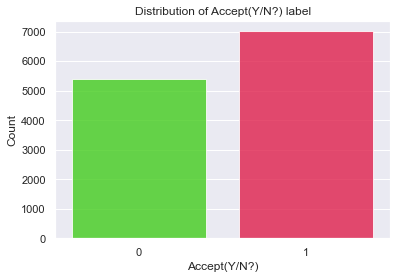

In [37]:
count = data1["Accept(Y/N?)"].value_counts()
plt.figure(figsize=(6,4))
sns.barplot(count.index, count.values, alpha=0.8, palette="prism")
plt.ylabel("Count", fontsize=12)
plt.xlabel("Accept(Y/N?)", fontsize=12)
plt.title("Distribution of Accept(Y/N?) label")
plt.show()

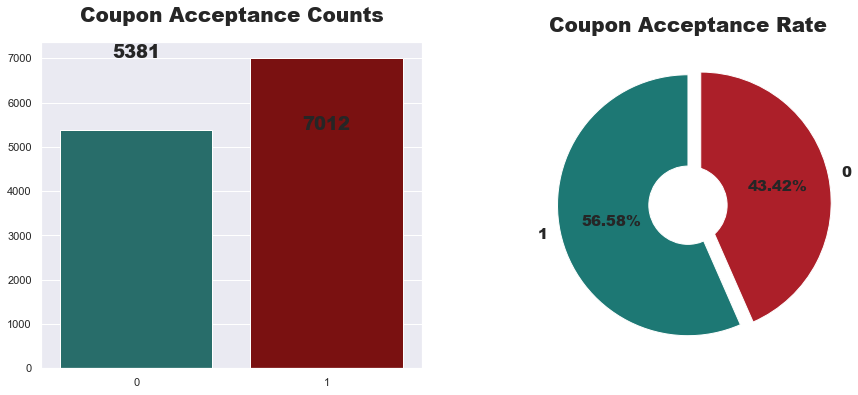

In [38]:
#Visualization to show Employee Attrition in Counts.
plt.figure(figsize=(15,6))
plt.subplot(1,2,1)
accptance_rate = data1["Accept(Y/N?)"].value_counts()
sns.barplot(x=accptance_rate.index, y=accptance_rate.values, palette=["#1d7874","#8B0000"])
plt.title("Coupon Acceptance Counts",fontweight="black",size=20,pad=20)
# for i, v in enumerate(accptance_rate.values):
#     plt.text(i, v, v,ha="center", fontweight='black', fontsize=18)
plt.text(0, accptance_rate.values[0], 5381, ha="center", fontweight='black', fontsize=18)
plt.text(1, accptance_rate.values[1], 7012, ha="center", fontweight='black', fontsize=18)

#Visualization to show Employee Attrition in Percentage.
plt.subplot(1,2,2)
plt.pie(accptance_rate, labels=["1","0"], autopct="%.2f%%", textprops={"fontweight":"black","size":15},
        colors = ["#1d7874","#AC1F29"],explode=[0,0.1],startangle=90)
center_circle = plt.Circle((0, 0), 0.3, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)
plt.title("Coupon Acceptance Rate",fontweight="black",size=20,pad=10)
plt.show()


**Inference:**
* Coupon Acceptance rate is 56.58% and Rejection rate is 43.42%.
* Target variable is partially balanced.

## Visualizing  destination

In [39]:
data1["destination"].value_counts()

No Urgent Place    6118
Home               3161
Work               3114
Name: destination, dtype: int64

No Urgent Place    6118
Home               3161
Work               3114
Name: destination, dtype: int64
AxesSubplot(0.547727,0.208939;0.352273x0.587121)


Text(0.5, 1.0, 'destination ratio Proposanate')

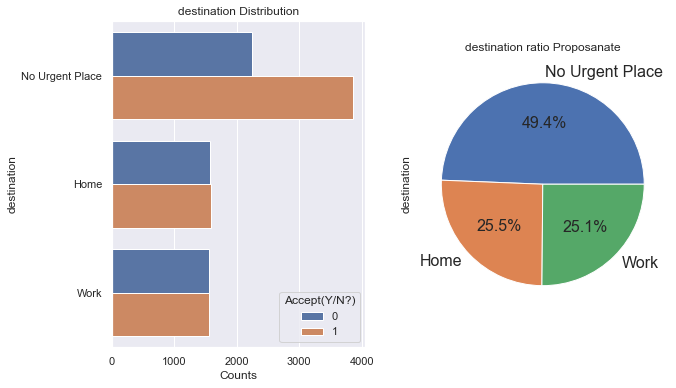

In [40]:
#  Distribution of "destination"
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="destination", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('destination')
plt.title('destination Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['destination'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('destination ratio Proposanate')

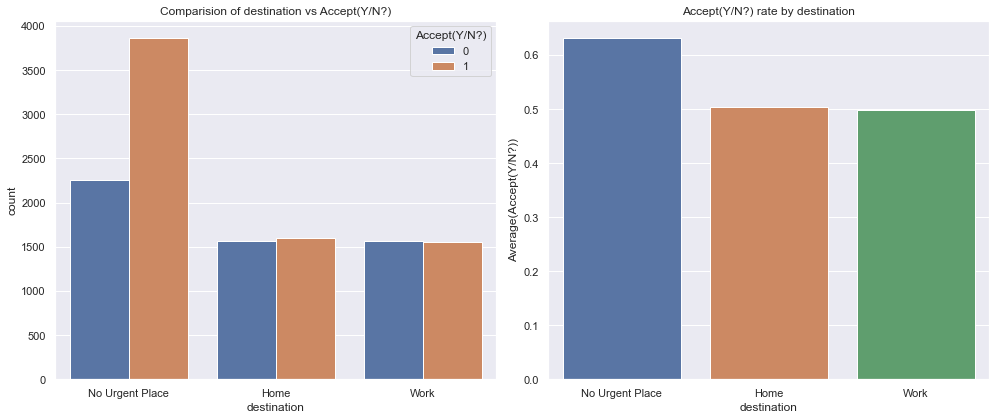

In [41]:
CategoricalVariables_targetPlots(data1,"destination")

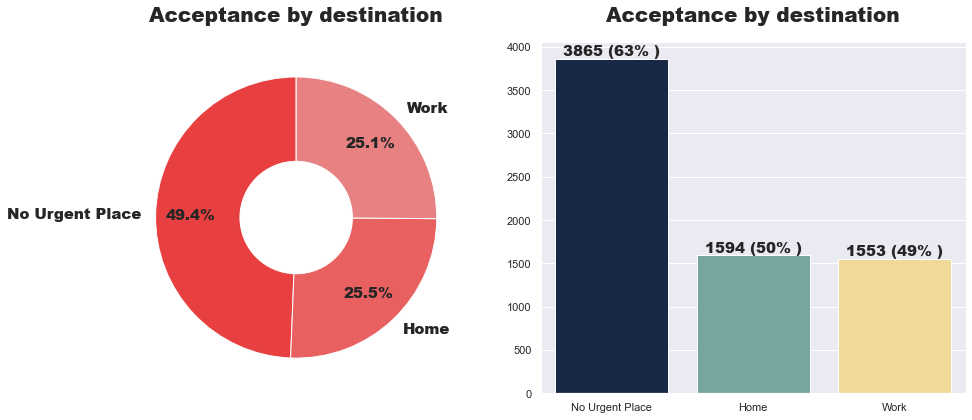

In [42]:
#Visualization to show Total Employees by Businees Travel.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = data1["destination"].value_counts()
plt.title("Acceptance by destination", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Attrition Rate by Businees Travel.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["destination"].value_counts()
acceptance_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Acceptance by destination",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


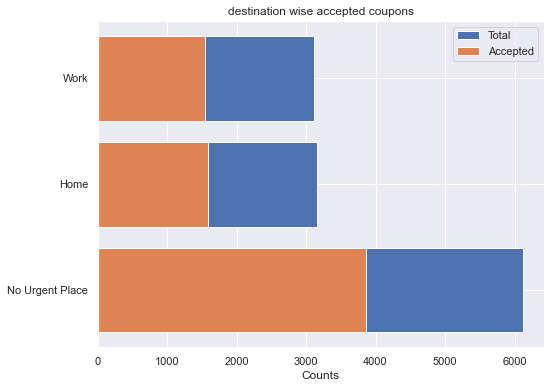

,destination,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
1,No Urgent Place,6118,25.506334,3865,2253,63.174,36.826
0,Home,3161,49.366578,1594,1567,50.427,49.573
2,Work,3114,25.127088,1553,1561,49.872,50.128


In [43]:
Univariate_Analysis1("destination")

,Accept(Y/N?),destination,count,count_norm
0,0,Home,1567,0.495729
1,0,No Urgent Place,2253,0.368258
2,0,Work,1561,0.501285
3,1,Home,1594,0.504271
4,1,No Urgent Place,3865,0.631742
5,1,Work,1553,0.498715


<AxesSubplot:xlabel='destination'>

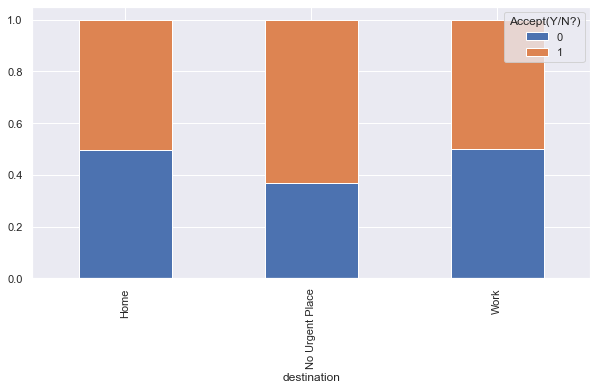

In [44]:
tmp = data1[["Accept(Y/N?)", "destination"]]
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "destination"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "destination==\""+row["destination"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="destination", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [45]:
# Hypothesis testing on "destination" column
stat, p_val, dof = chi_sqred_ind_test(data, "destination", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)        0     1
destination                
Home             1598  1639
No Urgent Place  2301  3982
Work             1575  1589
Statistic: 216.79107304896826
P-value: 8.402656780457869e-48
DOF: 2
probability=0.950, critical=5.991, stat=216.791
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [46]:
# Hypothesis testing on "destination" column
stat, p_val, dof = chi_sqred_ind_test(data1, "destination", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)        0     1
destination                
Home             1567  1594
No Urgent Place  2253  3865
Work             1561  1553
Statistic: 214.04571776523488
P-value: 3.315606251130289e-47
DOF: 2
probability=0.950, critical=5.991, stat=214.046
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [47]:
t = pd.crosstab(data1.destination, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=214.04571776523488, pvalue=3.315606251130289e-47, dof=2, expected_freq=array([[1372.49584443, 1788.50415557],
       [2656.41555717, 3461.58444283],
       [1352.0885984 , 1761.9114016 ]]))

#### Observation on "destination" column
* Most of the users go to No Urgent Place.
* The uders who have destination No Urgent Place have Accepted more coupons than others.
* The users who have destination Home and Work are almost simillar coupon Acceptance ratio.

In [48]:
data1.columns

Index(['destination', 'passanger', 'weather', 'temperature', 'coupon',
       'expiration', 'gender', 'age', 'maritalStatus', 'has_children',
       'education', 'occupation', 'income', 'car', 'Bar', 'CoffeeHouse',
       'CarryAway', 'RestaurantLessThan20', 'Restaurant20To50',
       'toCoupon_GEQ5min', 'toCoupon_GEQ15min', 'toCoupon_GEQ25min',
       'direction_same', 'direction_opp', 'Accept(Y/N?)'],
      dtype='object')

## Visualizing passanger

In [49]:
data1["passanger"].value_counts()

Alone        7178
Friend(s)    3166
Partner      1068
Kid(s)        981
Name: passanger, dtype: int64

Alone        7178
Friend(s)    3166
Partner      1068
Kid(s)        981
Name: passanger, dtype: int64
AxesSubplot(0.547727,0.208939;0.352273x0.587121)


Text(0.5, 1.0, 'passanger ratio Proposanate')

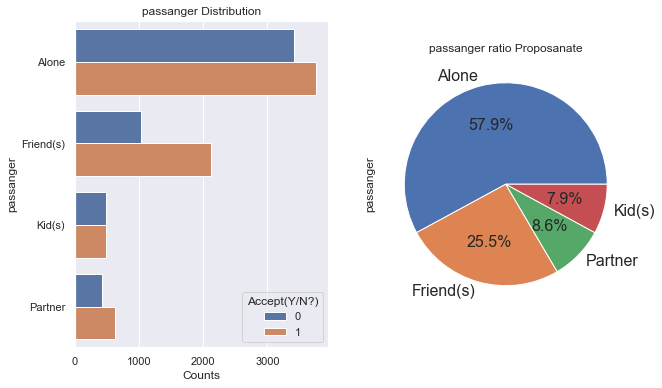

In [50]:
#  Distribution of "destination"
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="passanger", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('passanger')
plt.title('passanger Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['passanger'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('passanger ratio Proposanate')

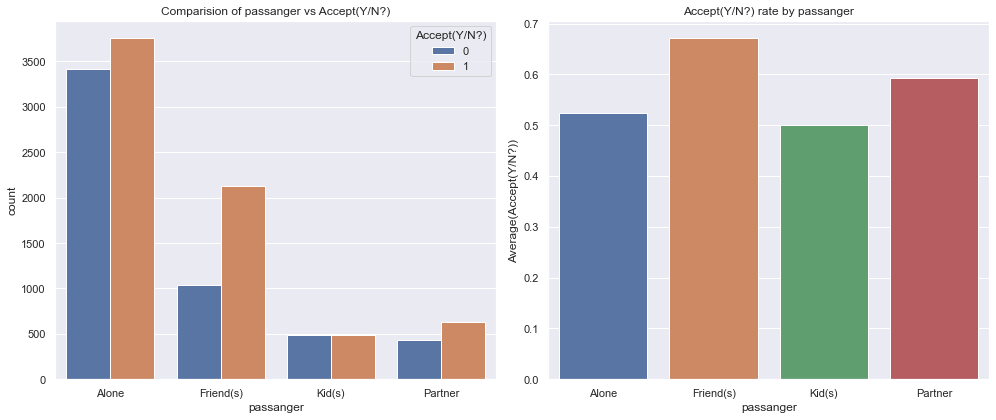

In [51]:
CategoricalVariables_targetPlots(data1,"passanger")

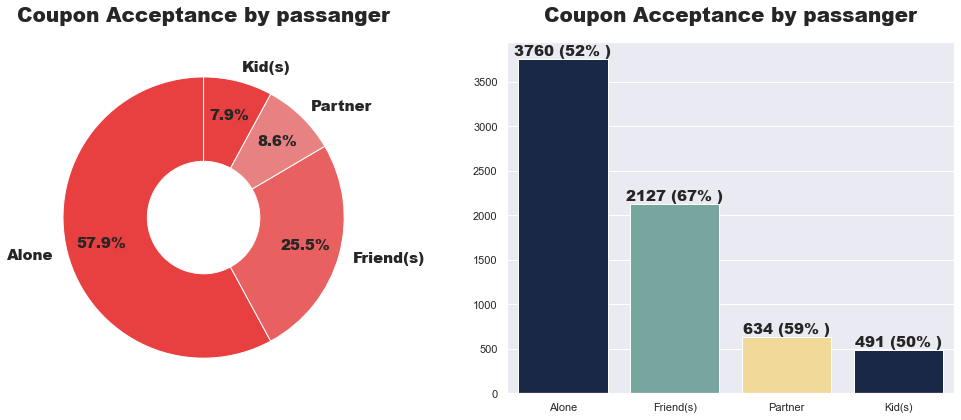

In [52]:
#Visualization to show Total Employees by Businees Travel.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = data1["passanger"].value_counts()
plt.title("Coupon Acceptance by passanger", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Attrition Rate by Businees Travel.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["passanger"].value_counts()
acceptance_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by passanger",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


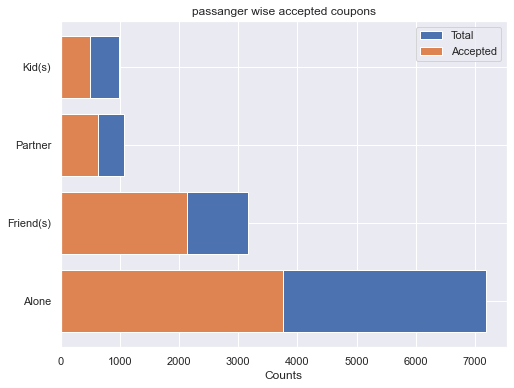

,passanger,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
0,Alone,7178,57.919793,3760,3418,52.382,47.618
1,Friend(s),3166,25.546680,2127,1039,67.183,32.817
3,Partner,1068,7.915759,634,434,59.363,40.637
2,Kid(s),981,8.617768,491,490,50.051,49.949


In [53]:
Univariate_Analysis1("passanger")

,Accept(Y/N?),passanger,count,count_norm
0,0,Alone,3418,0.476177
1,0,Friend(s),1039,0.328174
2,0,Kid(s),490,0.499490
3,0,Partner,434,0.406367
4,1,Alone,3760,0.523823
5,1,Friend(s),2127,0.671826
6,1,Kid(s),491,0.500510
7,1,Partner,634,0.593633


<AxesSubplot:xlabel='passanger'>

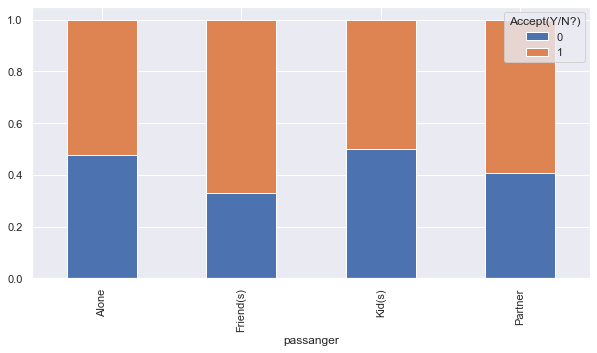

In [54]:
tmp = data1[["Accept(Y/N?)", "passanger"]]
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "passanger"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "passanger==\""+row["passanger"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="passanger", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [55]:
# Hypothesis testing on "passanger" column
stat, p_val, dof = chi_sqred_ind_test(data, "passanger", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
passanger               
Alone         3464  3841
Friend(s)     1077  2221
Kid(s)         498   508
Partner        435   640
Statistic: 222.0369844004433
P-value: 7.284119805592145e-48
DOF: 3
probability=0.950, critical=7.815, stat=222.037
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [56]:
# Hypothesis testing on "passanger" column
stat, p_val, dof = chi_sqred_ind_test(data1, "passanger", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
passanger               
Alone         3418  3760
Friend(s)     1039  2127
Kid(s)         490   491
Partner        434   634
Statistic: 216.74540716936377
P-value: 1.0144668957924846e-46
DOF: 3
probability=0.950, critical=7.815, stat=216.745
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [57]:
t = pd.crosstab(data1.passanger, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=216.74540716936377, pvalue=1.0144668957924846e-46, dof=3, expected_freq=array([[3116.66408456, 4061.33591544],
       [1374.66682805, 1791.33317195],
       [ 425.9469862 ,  555.0530138 ],
       [ 463.72210119,  604.27789881]]))

#### Observation on "passanger" column
* Most of users go out alone.
* The users who go out with Friends Accepting more coupon than other co-passangers.
* The users go out with Friends and Partner have more coupon Acceptance ratio than Alone and Kid(s) users.
* Travellers with kid(s) have lowest rate of coupon acceptance.

In [58]:
data1.columns

Index(['destination', 'passanger', 'weather', 'temperature', 'coupon',
       'expiration', 'gender', 'age', 'maritalStatus', 'has_children',
       'education', 'occupation', 'income', 'car', 'Bar', 'CoffeeHouse',
       'CarryAway', 'RestaurantLessThan20', 'Restaurant20To50',
       'toCoupon_GEQ5min', 'toCoupon_GEQ15min', 'toCoupon_GEQ25min',
       'direction_same', 'direction_opp', 'Accept(Y/N?)'],
      dtype='object')

## Visualizing weather

In [59]:
data1["weather"].value_counts()

Sunny    9862
Snowy    1329
Rainy    1202
Name: weather, dtype: int64

Sunny    9862
Snowy    1329
Rainy    1202
Name: weather, dtype: int64
AxesSubplot(0.547727,0.208939;0.352273x0.587121)


Text(0.5, 1.0, 'weather ratio Proposanate')

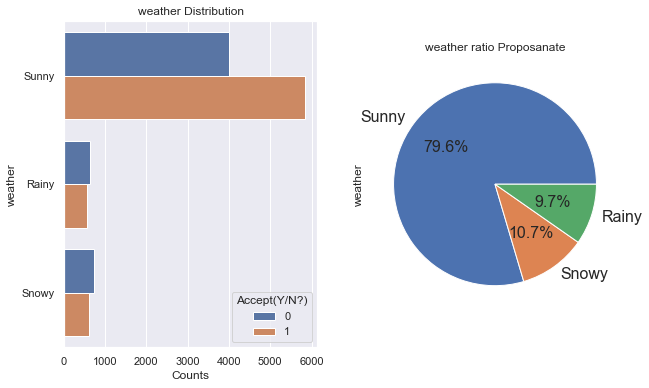

In [60]:
#  Distribution of "destination"
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="weather", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('weather')
plt.title('weather Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['weather'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('weather ratio Proposanate')

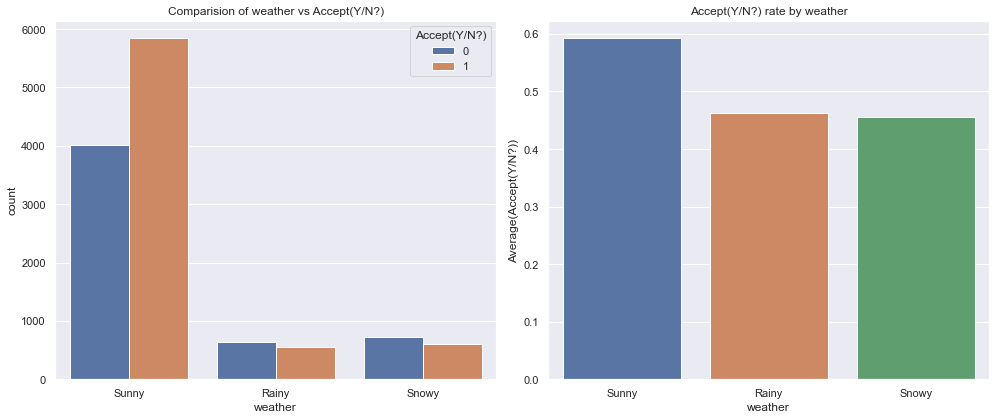

In [61]:
CategoricalVariables_targetPlots(data1,"weather")

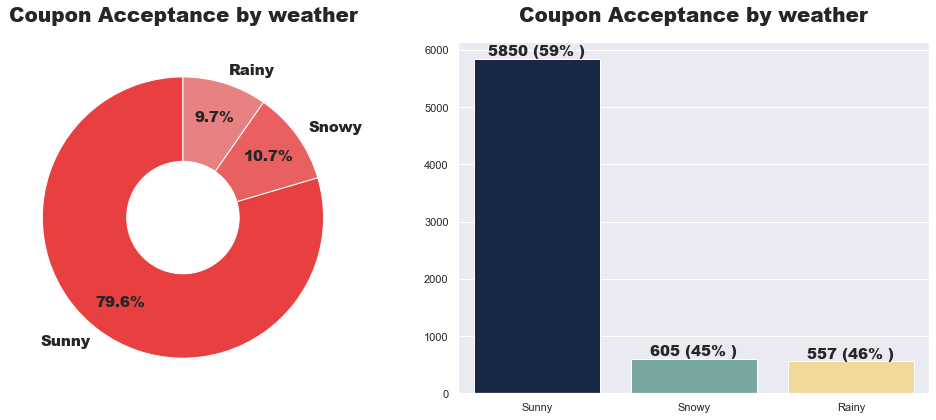

In [62]:
#Visualization to show Total Employees by Businees Travel.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = data1["weather"].value_counts()
plt.title("Coupon Acceptance by weather", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Attrition Rate by Businees Travel.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["weather"].value_counts()
acceptance_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by weather",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


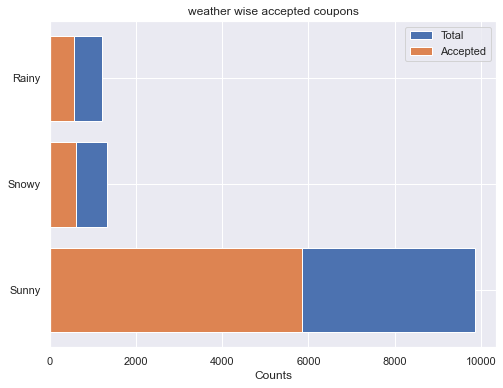

,weather,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
2,Sunny,9862,9.699024,5850,4012,59.319,40.681
1,Snowy,1329,10.723796,605,724,45.523,54.477
0,Rainy,1202,79.577181,557,645,46.339,53.661


In [63]:
Univariate_Analysis1("weather")

,Accept(Y/N?),weather,count,count_norm
0,0,Rainy,645,0.536606
1,0,Snowy,724,0.544771
2,0,Sunny,4012,0.406814
3,1,Rainy,557,0.463394
4,1,Snowy,605,0.455229
5,1,Sunny,5850,0.593186


<AxesSubplot:xlabel='weather'>

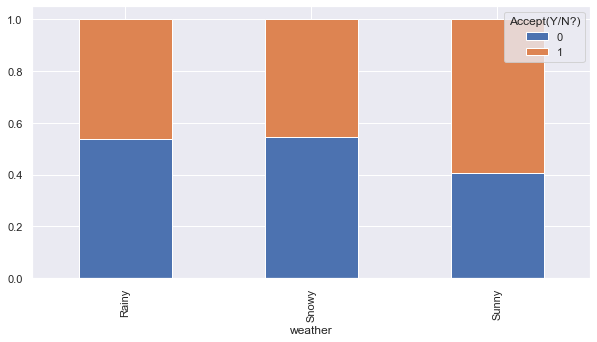

In [64]:
tmp = data1[["Accept(Y/N?)", "weather"]]
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "weather"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "weather==\""+row["weather"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="weather", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [65]:
# Hypothesis testing on "destination" column
stat, p_val, dof = chi_sqred_ind_test(data, "weather", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
weather                 
Rainy          650   560
Snowy          744   661
Sunny         4080  5989
Statistic: 138.5248252729253
P-value: 8.312207740720093e-31
DOF: 2
probability=0.950, critical=5.991, stat=138.525
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [66]:
# Hypothesis testing on "destination" column
stat, p_val, dof = chi_sqred_ind_test(data1, "weather", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
weather                 
Rainy          645   557
Snowy          724   605
Sunny         4012  5850
Statistic: 147.5549959731486
P-value: 9.095775566072616e-33
DOF: 2
probability=0.950, critical=5.991, stat=147.555
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [67]:
t = pd.crosstab(data1.weather, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=147.5549959731486, pvalue=9.095775566072616e-33, dof=2, expected_freq=array([[ 521.9044622 ,  680.0955378 ],
       [ 577.04744614,  751.95255386],
       [4282.04809166, 5579.95190834]]))

## Visualizing temperature

In [68]:
data1["temperature"].value_counts()

80    6328
55    3828
30    2237
Name: temperature, dtype: int64

In [69]:
data1.loc[data1['temperature'] == 30, 'temperature'] = 'Low Temperature(30)'
data1.loc[data1['temperature'] == 55, 'temperature'] = 'Medium Temperature(55)'
data1.loc[data1['temperature'] == 80, 'temperature'] = 'High Temperature(80)'


In [70]:
data1["temperature"].value_counts()

High Temperature(80)      6328
Medium Temperature(55)    3828
Low Temperature(30)       2237
Name: temperature, dtype: int64

High Temperature(80)      6328
Medium Temperature(55)    3828
Low Temperature(30)       2237
Name: temperature, dtype: int64
AxesSubplot(0.572864,0.125;0.302x0.755)


Text(0.5, 1.0, 'temperature ratio Proposanate')

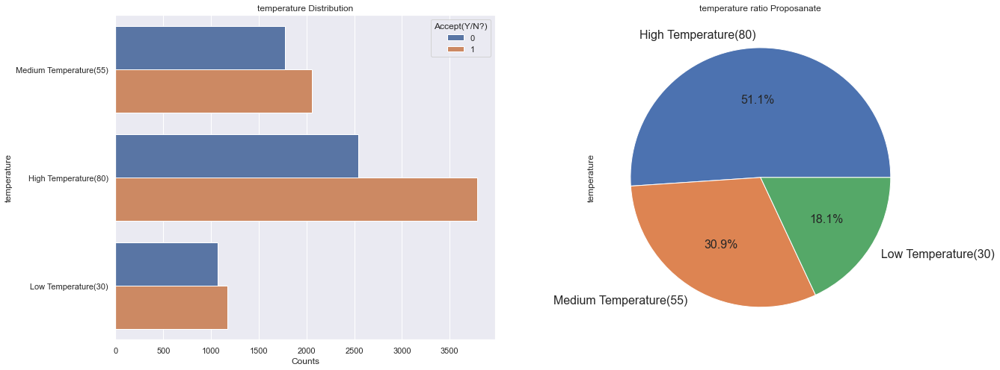

In [71]:
#  Distribution of "temperature"
fig, ax = plt.subplots(1,2,figsize=(20,8))
ax1=plt.subplot(1,2,1)
sns.countplot(y="temperature", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('temperature')
plt.title('temperature Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['temperature'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('temperature ratio Proposanate')

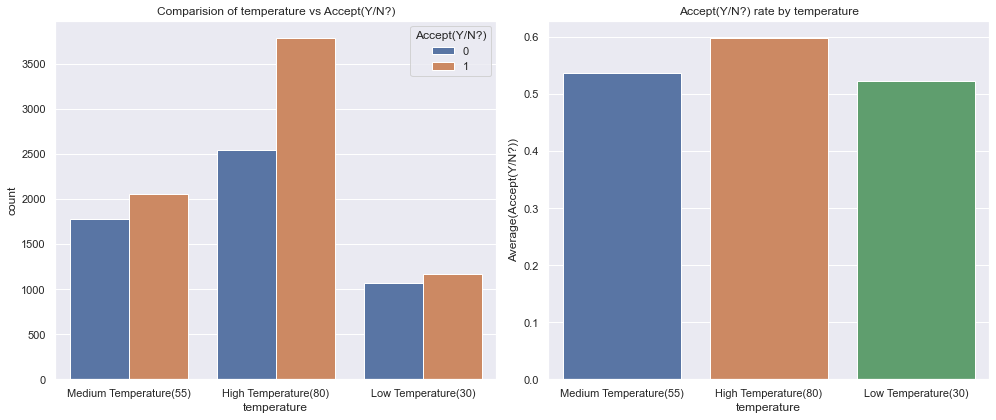

In [72]:
CategoricalVariables_targetPlots(data1,"temperature")

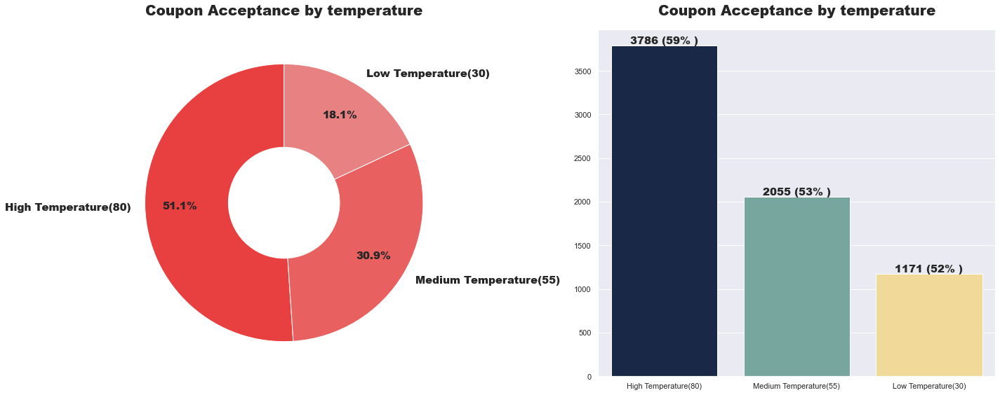

In [73]:
#Visualization to show Coupon Acceptance by temperature.
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
value_1 = data1["temperature"].value_counts()
plt.title("Coupon Acceptance by temperature", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Attrition Rate by Businees Travel.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["temperature"].value_counts()
acceptance_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by temperature",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


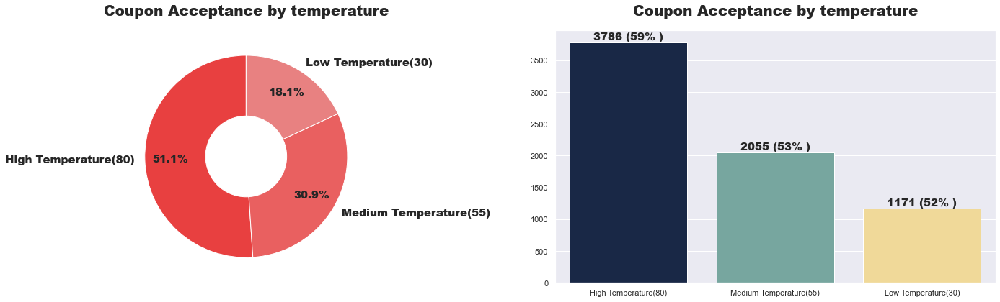

In [74]:
#Visualization to show Coupon Acceptance by temperature.
plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
value_1 = data1["temperature"].value_counts()
plt.title("Coupon Acceptance by temperature", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Attrition Rate by Businees Travel.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["temperature"].value_counts()
acceptance_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by temperature",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


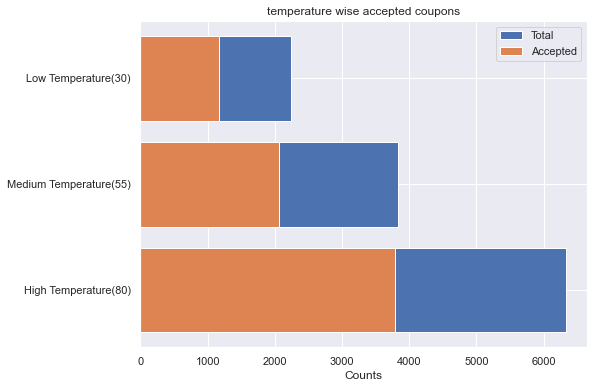

,temperature,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
0,High Temperature(80),6328,51.061083,3786,2542,59.829,40.171
2,Medium Temperature(55),3828,18.050512,2055,1773,53.683,46.317
1,Low Temperature(30),2237,30.888405,1171,1066,52.347,47.653


In [75]:
Univariate_Analysis1("temperature")

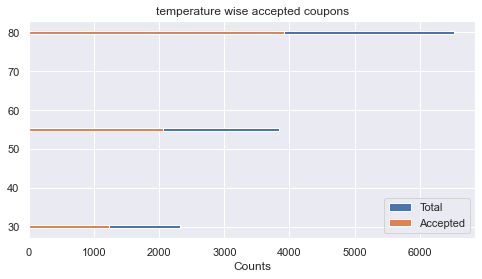

,temperature,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
2,80,6528,18.259224,3919,2609,60.034,39.966
1,55,3840,30.274361,2061,1779,53.672,46.328
0,30,2316,51.466414,1230,1086,53.109,46.891


In [76]:
Univariate_Analysis("temperature")

In [77]:
# tmp = data1[["Accept(Y/N?)", "temperature"]]
# tmp["count"] = 1
# tmp = tmp.groupby(["Accept(Y/N?)", "temperature"], as_index=False).count()
# tmp["count_norm"] = 1
# def get_norm_count(row):
#     q = "temperature==\""+row["temperature"]+"\""
#     val = tmp.query(q)["count"].sum()
#     row["count_norm"] = row["count"]/val
#     return row
# tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
# tmp.pivot(columns="Accept(Y/N?)", index="temperature", values="count_norm").plot.bar(stacked=True,
#                                                                           figsize=(10,5))

,Accept(Y/N?),temperature,count,count_norm
0,0,High Temperature(80),2542,0.401707
1,0,Low Temperature(30),1066,0.476531
2,0,Medium Temperature(55),1773,0.463166
3,1,High Temperature(80),3786,0.598293
4,1,Low Temperature(30),1171,0.523469
5,1,Medium Temperature(55),2055,0.536834


<AxesSubplot:xlabel='temperature'>

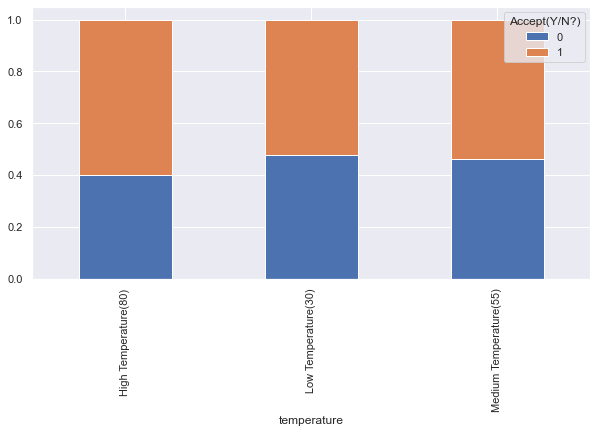

In [78]:
tmp = data1[["Accept(Y/N?)", "temperature"]]
tmp["temperature"] = tmp["temperature"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "temperature"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "temperature==\""+row["temperature"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="temperature", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(10,5))

In [79]:
# Hypothesis testing on "temperature" column
stat, p_val, dof = chi_sqred_ind_test(data, "temperature", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
temperature             
30            1086  1230
55            1779  2061
80            2609  3919
Statistic: 55.99640606998973
P-value: 6.92683621224045e-13
DOF: 2
probability=0.950, critical=5.991, stat=55.996
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [80]:
# Hypothesis testing on "temperature" column
stat, p_val, dof = chi_sqred_ind_test(data1, "temperature", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)               0     1
temperature                       
High Temperature(80)    2542  3786
Low Temperature(30)     1066  1171
Medium Temperature(55)  1773  2055
Statistic: 56.58630420274863
P-value: 5.15751104523652e-13
DOF: 2
probability=0.950, critical=5.991, stat=56.586
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [81]:
t = pd.crosstab(data1.temperature, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=56.58630420274863, pvalue=5.15751104523652e-13, dof=2, expected_freq=array([[2747.5968692 , 3580.4031308 ],
       [ 971.29807149, 1265.70192851],
       [1662.10505931, 2165.89494069]]))

## Visualizing coupon

In [82]:
data1["coupon"].value_counts()

Coffee House             3913
Restaurant(<20)          2708
Carry out & Take away    2275
Bar                      2010
Restaurant(20-50)        1487
Name: coupon, dtype: int64

Coffee House             3913
Restaurant(<20)          2708
Carry out & Take away    2275
Bar                      2010
Restaurant(20-50)        1487
Name: coupon, dtype: int64
AxesSubplot(0.59803,0.125;0.251667x0.755)


Text(0.5, 1.0, 'coupon ratio Proposanate')

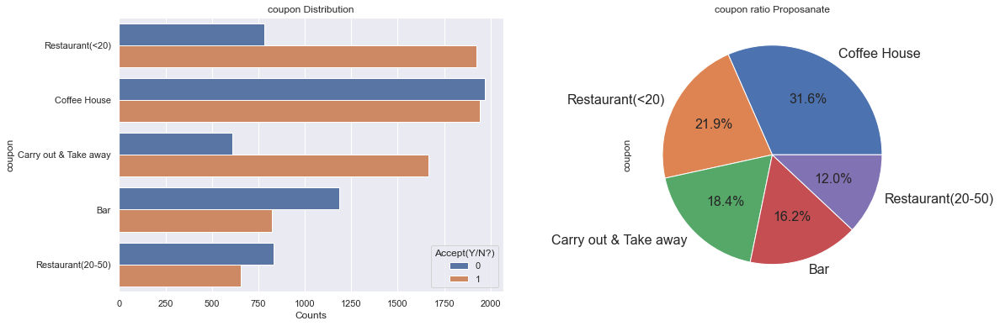

In [83]:
#  Distribution of "destination"
fig, ax = plt.subplots(1,2,figsize=(18,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="coupon", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('coupon')
plt.title('coupon Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['coupon'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('coupon ratio Proposanate')

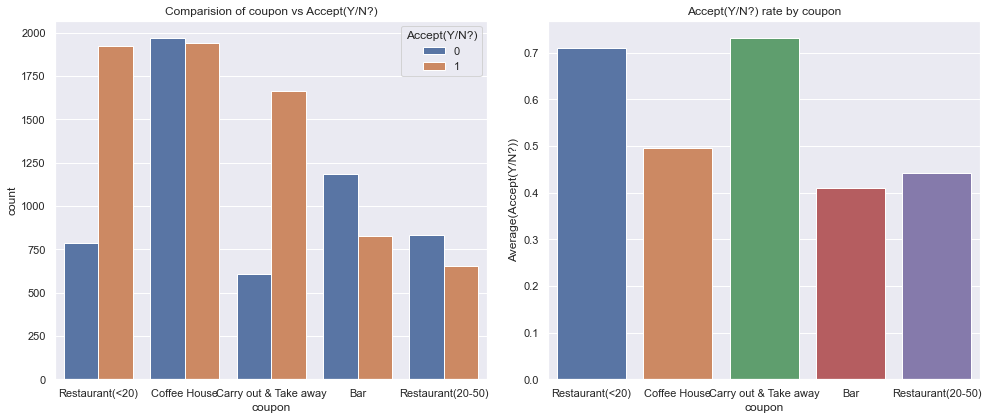

In [84]:
CategoricalVariables_targetPlots(data1,"coupon")

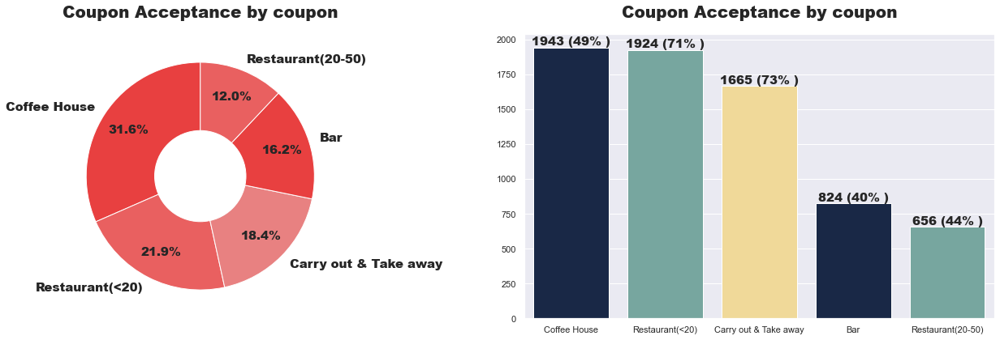

In [85]:
#Visualization to show Coupon Acceptance by coupon.
plt.figure(figsize=(18,6))
plt.subplot(1,2,1)
value_1 = data1["coupon"].value_counts()
plt.title("Coupon Acceptance by coupon", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Attrition Rate by Businees Travel.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["coupon"].value_counts()
acceptance_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by coupon",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


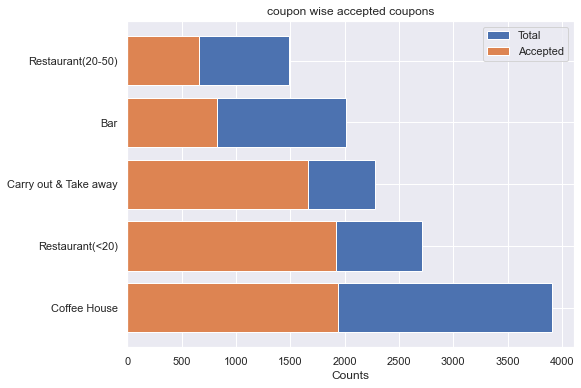

,coupon,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
2,Coffee House,3913,18.357137,1943,1970,49.655,50.345
4,Restaurant(<20),2708,11.998709,1924,784,71.049,28.951
1,Carry out & Take away,2275,21.851045,1665,610,73.187,26.813
0,Bar,2010,31.574276,824,1186,40.995,59.005
3,Restaurant(20-50),1487,16.218833,656,831,44.116,55.884


In [86]:
Univariate_Analysis1("coupon")

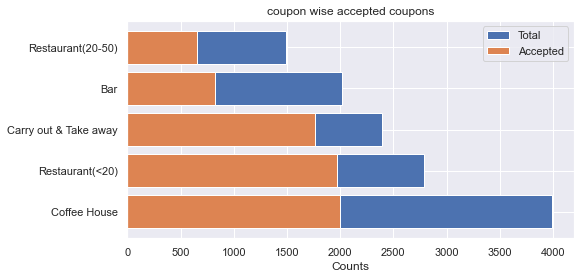

,coupon,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
2,Coffee House,3996,18.866288,1995,2001,49.925,50.075
4,Restaurant(<20),2786,11.762851,1970,816,70.711,29.289
1,Carry out & Take away,2393,21.964680,1760,633,73.548,26.452
0,Bar,2017,31.504257,827,1190,41.001,58.999
3,Restaurant(20-50),1492,15.901924,658,834,44.102,55.898


In [87]:
Univariate_Analysis("coupon")

,Accept(Y/N?),coupon,count,count_norm
0,0,Bar,1186,0.590050
1,0,Carry out & Take away,610,0.268132
2,0,Coffee House,1970,0.503450
3,0,Restaurant(20-50),831,0.558843
4,0,Restaurant(<20),784,0.289513
5,1,Bar,824,0.409950
6,1,Carry out & Take away,1665,0.731868
7,1,Coffee House,1943,0.496550
8,1,Restaurant(20-50),656,0.441157
9,1,Restaurant(<20),1924,0.710487


<AxesSubplot:xlabel='coupon'>

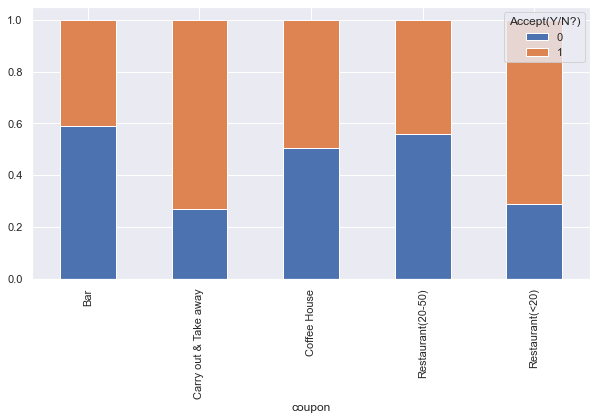

In [88]:
tmp = data1[["Accept(Y/N?)", "coupon"]]
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "coupon"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "coupon==\""+row["coupon"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="coupon", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [89]:
# Hypothesis testing on "coupon" column
stat, p_val, dof = chi_sqred_ind_test(data, "coupon", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)              0     1
coupon                           
Bar                    1190   827
Carry out & Take away   633  1760
Coffee House           2001  1995
Restaurant(20-50)       834   658
Restaurant(<20)         816  1970
Statistic: 873.6378240374827
P-value: 8.575341747082738e-188
DOF: 4
probability=0.950, critical=9.488, stat=873.638
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [90]:
# Hypothesis testing on "coupon" column
stat, p_val, dof = chi_sqred_ind_test(data1, "coupon", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)              0     1
coupon                           
Bar                    1186   824
Carry out & Take away   610  1665
Coffee House           1970  1943
Restaurant(20-50)       831   656
Restaurant(<20)         784  1924
Statistic: 855.2942655592142
P-value: 8.078113579933398e-184
DOF: 4
probability=0.950, critical=9.488, stat=855.294
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [91]:
t = pd.crosstab(data1.coupon, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=855.2942655592142, pvalue=8.078113579933398e-184, dof=4, expected_freq=array([[ 872.73541515, 1137.26458485],
       [ 987.797547  , 1287.202453  ],
       [1699.01178084, 2213.98821916],
       [ 645.65052852,  841.34947148],
       [1175.80472848, 1532.19527152]]))

## Visualizing expiration

In [92]:
data1["expiration"].value_counts()

1d    6938
2h    5455
Name: expiration, dtype: int64

1d    6938
2h    5455
Name: expiration, dtype: int64
AxesSubplot(0.547727,0.208939;0.352273x0.587121)


Text(0.5, 1.0, 'expiration ratio Proposanate')

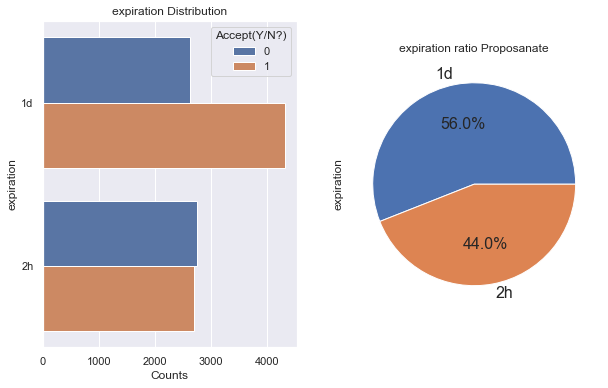

In [93]:
#  Distribution of "expiration"
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="expiration", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('expiration')
plt.title('expiration Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['expiration'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('expiration ratio Proposanate')

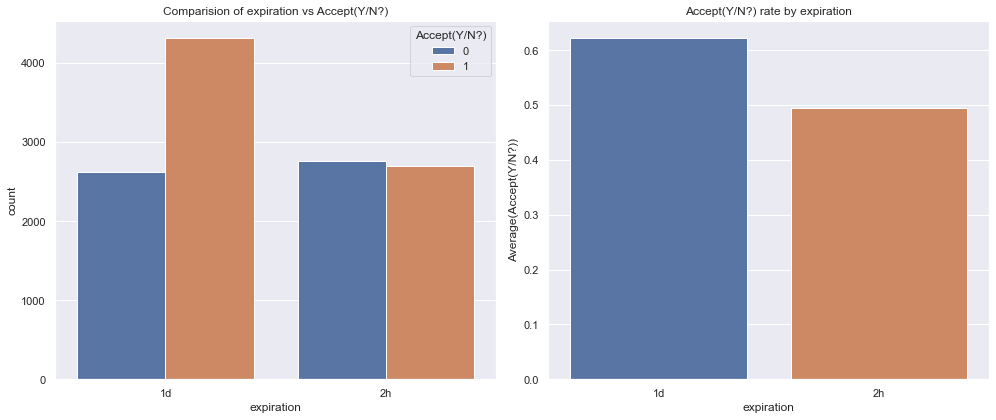

In [94]:
CategoricalVariables_targetPlots(data1,"expiration")

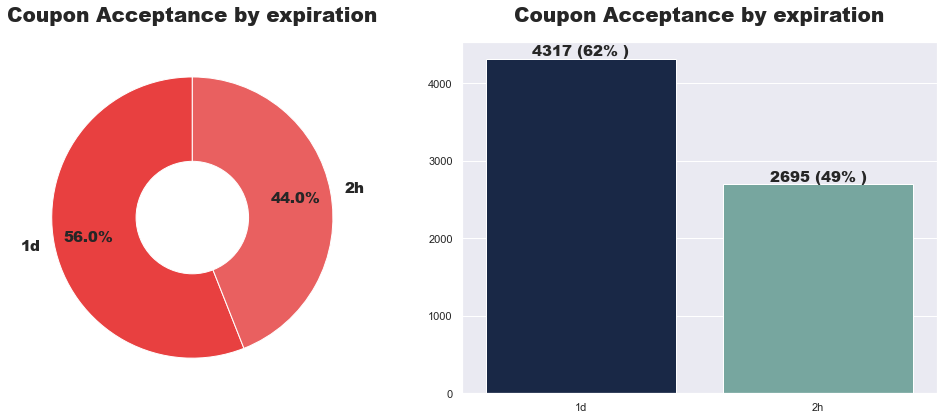

In [95]:
#Visualization to show Coupon Acceptance by expiration.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = data1["expiration"].value_counts()
plt.title("Coupon Acceptance by expiration", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Attrition Rate by Businees Travel.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["expiration"].value_counts()
acceptance_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by expiration",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


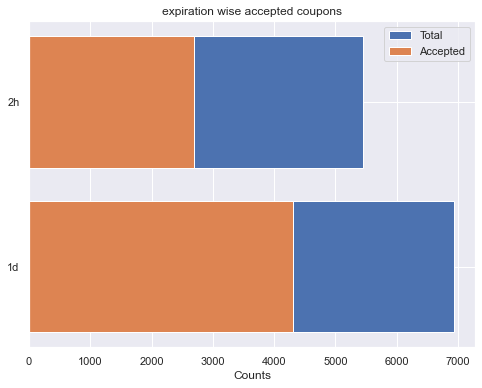

,expiration,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
0,1d,6938,55.983216,4317,2621,62.223,37.777
1,2h,5455,44.016784,2695,2760,49.404,50.596


In [96]:
Univariate_Analysis1("expiration")

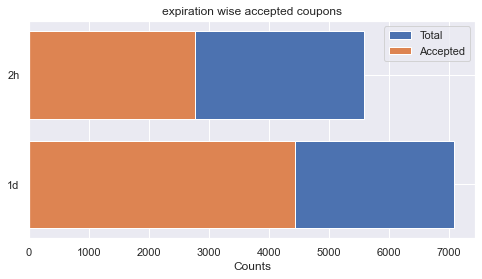

,expiration,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
0,1d,7091,55.905077,4436,2655,62.558,37.442
1,2h,5593,44.094923,2774,2819,49.598,50.402


In [97]:
Univariate_Analysis("expiration")

,Accept(Y/N?),expiration,count,count_norm
0,0,1d,2621,0.377775
1,0,2h,2760,0.505958
2,1,1d,4317,0.622225
3,1,2h,2695,0.494042


<AxesSubplot:xlabel='expiration'>

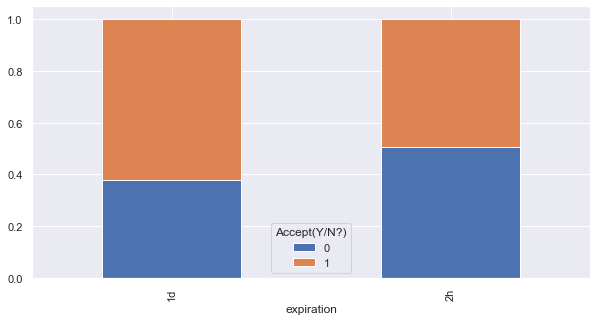

In [98]:
tmp = data1[["Accept(Y/N?)", "expiration"]]
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "expiration"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "expiration==\""+row["expiration"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="expiration", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [99]:
# Hypothesis testing on "coupon" column
stat, p_val, dof = chi_sqred_ind_test(data, "expiration", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
expiration              
1d            2655  4436
2h            2819  2774
Statistic: 213.56841512202192
P-value: 2.2875426931245946e-48
DOF: 1
probability=0.950, critical=3.841, stat=213.568
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [100]:
# Hypothesis testing on "coupon" column
stat, p_val, dof = chi_sqred_ind_test(data1, "expiration", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
expiration              
1d            2621  4317
2h            2760  2695
Statistic: 203.72911524936688
P-value: 3.2069490154075797e-46
DOF: 1
probability=0.950, critical=3.841, stat=203.729
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [101]:
t = pd.crosstab(data1.expiration, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=203.72911524936688, pvalue=3.2069490154075797e-46, dof=1, expected_freq=array([[3012.45687081, 3925.54312919],
       [2368.54312919, 3086.45687081]]))

In [102]:
data1.columns

Index(['destination', 'passanger', 'weather', 'temperature', 'coupon',
       'expiration', 'gender', 'age', 'maritalStatus', 'has_children',
       'education', 'occupation', 'income', 'car', 'Bar', 'CoffeeHouse',
       'CarryAway', 'RestaurantLessThan20', 'Restaurant20To50',
       'toCoupon_GEQ5min', 'toCoupon_GEQ15min', 'toCoupon_GEQ25min',
       'direction_same', 'direction_opp', 'Accept(Y/N?)'],
      dtype='object')

## Visualizing gender

In [103]:
data1["gender"].value_counts()

Female    6355
Male      6038
Name: gender, dtype: int64

Female    6355
Male      6038
Name: gender, dtype: int64
AxesSubplot(0.547727,0.208939;0.352273x0.587121)


Text(0.5, 1.0, 'gender ratio Proposanate')

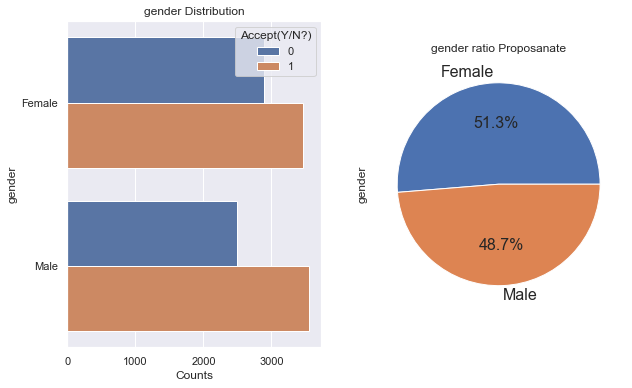

In [104]:
#  Distribution of "gender"
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="gender", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('gender')
plt.title('gender Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['gender'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('gender ratio Proposanate')

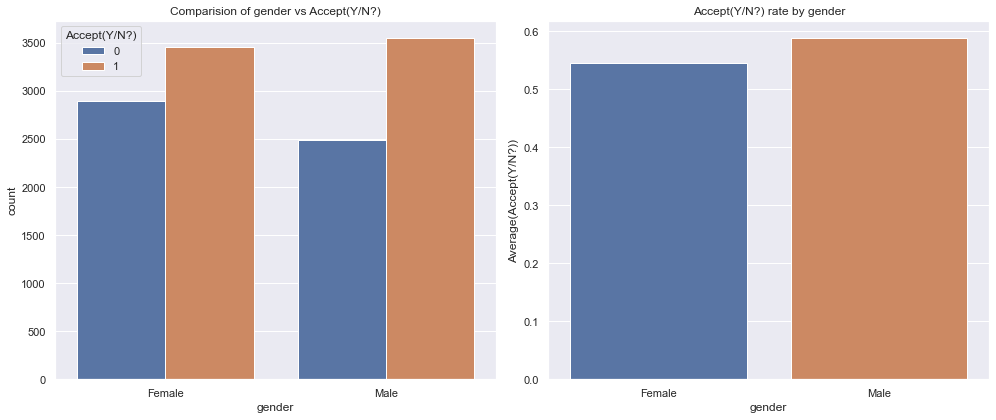

In [105]:
CategoricalVariables_targetPlots(data1,"gender")

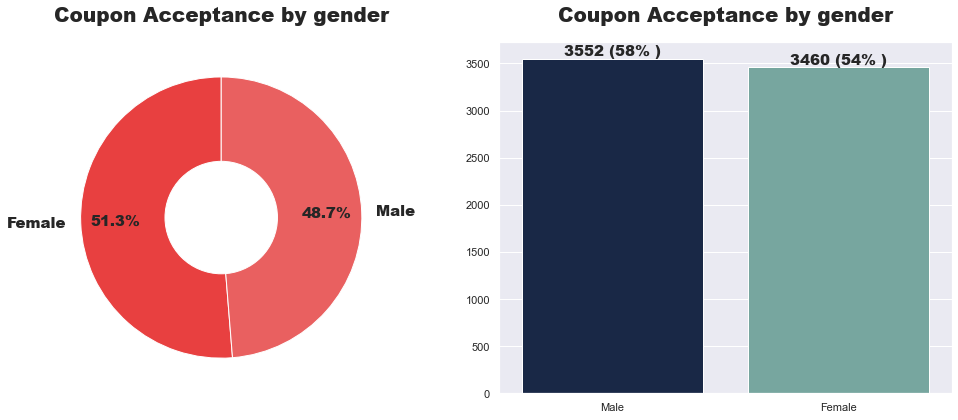

In [106]:
#Visualization to show Coupon Acceptance by temperature.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = data1["gender"].value_counts()
plt.title("Coupon Acceptance by gender", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Attrition Rate by Businees Travel.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["gender"].value_counts()
acceptance_rate = np.floor((value_2/value_1[::-1])*100).values
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by gender",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


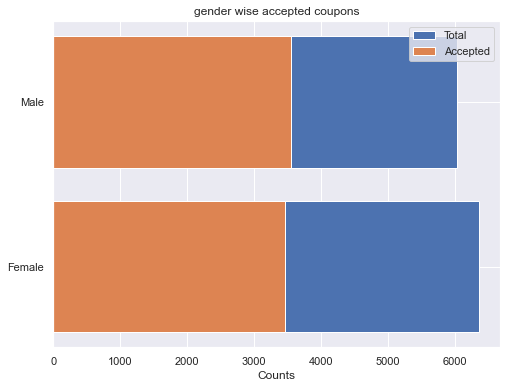

,gender,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
0,Female,6355,51.278948,3460,2895,54.445,45.555
1,Male,6038,48.721052,3552,2486,58.827,41.173


In [107]:
Univariate_Analysis1("gender")

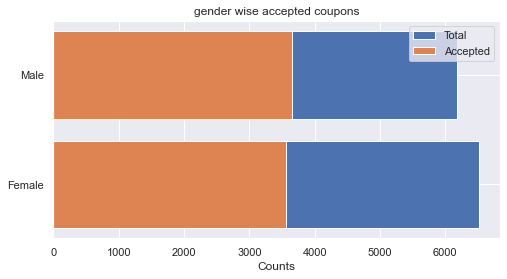

,gender,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
0,Female,6511,51.332387,3563,2948,54.723,45.277
1,Male,6173,48.667613,3647,2526,59.080,40.920


In [108]:
Univariate_Analysis("gender")

,Accept(Y/N?),gender,count,count_norm
0,0,Female,2895,0.455547
1,0,Male,2486,0.411726
2,1,Female,3460,0.544453
3,1,Male,3552,0.588274


<AxesSubplot:xlabel='gender'>

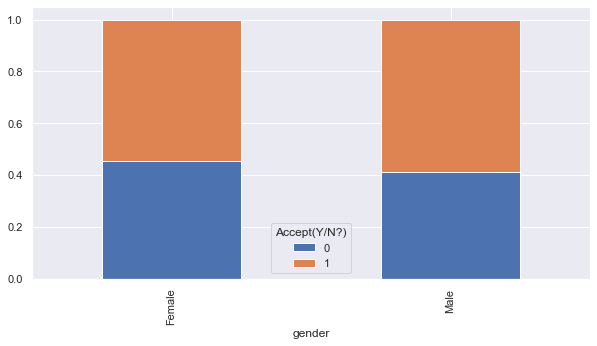

In [109]:
tmp = data1[["Accept(Y/N?)", "gender"]]
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "gender"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "gender==\""+row["gender"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="gender", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [110]:
# Hypothesis testing on "coupon" column
stat, p_val, dof = chi_sqred_ind_test(data, "gender", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
gender                  
Female        2948  3563
Male          2526  3647
Statistic: 24.344527038622925
P-value: 8.05552865589407e-07
DOF: 1
probability=0.950, critical=3.841, stat=24.345
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [111]:
# Hypothesis testing on "coupon" column
stat, p_val, dof = chi_sqred_ind_test(data1, "gender", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
gender                  
Female        2895  3460
Male          2486  3552
Statistic: 24.023678591412278
P-value: 9.515822687284084e-07
DOF: 1
probability=0.950, critical=3.841, stat=24.024
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [112]:
t = pd.crosstab(data1.gender, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=24.023678591412278, pvalue=9.515822687284084e-07, dof=1, expected_freq=array([[2759.32018075, 3595.67981925],
       [2621.67981925, 3416.32018075]]))

## Visualizing age

In [113]:
data1["age"].value_counts()

21         2598
26         2486
31         1984
50plus     1756
36         1293
41         1079
46          660
below21     537
Name: age, dtype: int64

21         2598
26         2486
31         1984
50plus     1756
36         1293
41         1079
46          660
below21     537
Name: age, dtype: int64
AxesSubplot(0.547727,0.208939;0.352273x0.587121)


Text(0.5, 1.0, 'age ratio Proposanate')

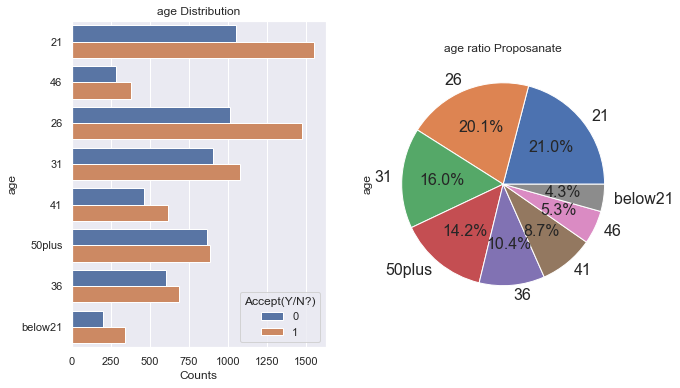

In [114]:
#  Distribution of "destination"
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="age", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('age')
plt.title('age Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['age'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('age ratio Proposanate')

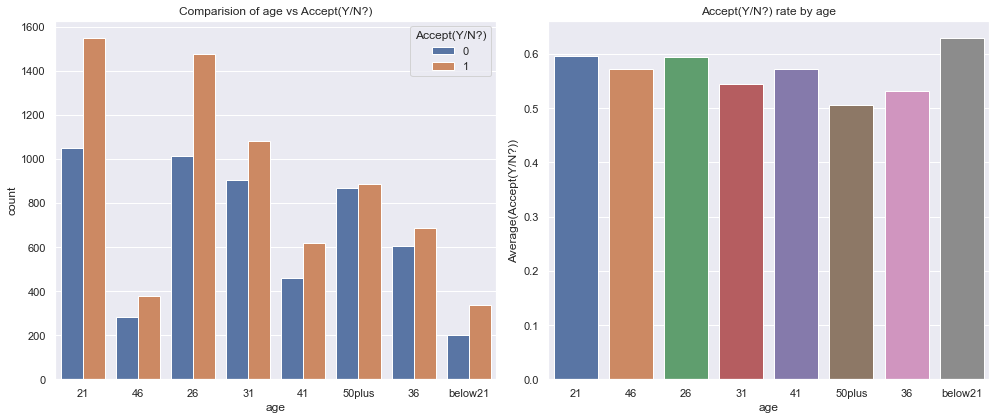

In [115]:
CategoricalVariables_targetPlots(data1,"age")

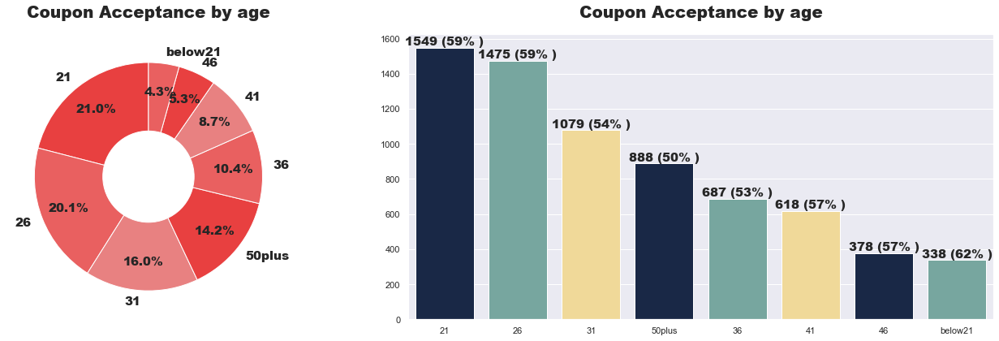

In [116]:
#Visualization to show Coupon Acceptance by temperature.
plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
value_1 = data1["age"].value_counts()
plt.title("Coupon Acceptance by age", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Attrition Rate by Businees Travel.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["age"].value_counts()
acceptance_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by age",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


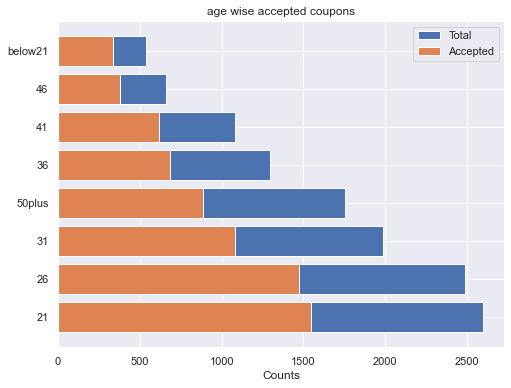

,age,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
0,21,2598,20.963447,1549,1049,59.623,40.377
1,26,2486,20.059711,1475,1011,59.332,40.668
2,31,1984,16.009037,1079,905,54.385,45.615
6,50plus,1756,5.325587,888,868,50.569,49.431
3,36,1293,14.169289,687,606,53.132,46.868
4,41,1079,10.433309,618,461,57.275,42.725
5,46,660,8.706528,378,282,57.273,42.727
7,below21,537,4.333091,338,199,62.942,37.058


In [117]:
Univariate_Analysis1("age")

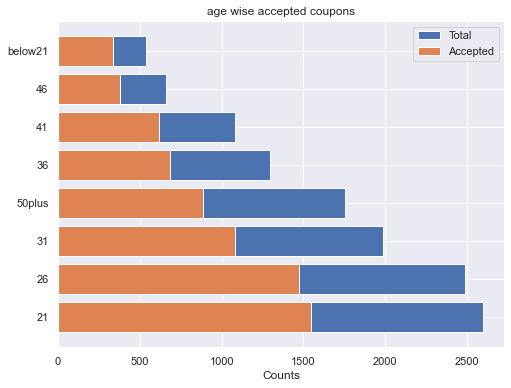

,age,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
0,21,2598,20.963447,1549,1049,59.623,40.377
1,26,2486,20.059711,1475,1011,59.332,40.668
2,31,1984,16.009037,1079,905,54.385,45.615
6,50plus,1756,5.325587,888,868,50.569,49.431
3,36,1293,14.169289,687,606,53.132,46.868
4,41,1079,10.433309,618,461,57.275,42.725
5,46,660,8.706528,378,282,57.273,42.727
7,below21,537,4.333091,338,199,62.942,37.058


In [118]:
Univariate_Analysis1("age")

,Accept(Y/N?),age,count,count_norm
0,0,21,1049,0.403772
1,0,26,1011,0.406677
2,0,31,905,0.456149
3,0,36,606,0.468677
4,0,41,461,0.427247
5,0,46,282,0.427273
6,0,50plus,868,0.494305
7,0,below21,199,0.370577
8,1,21,1549,0.596228
9,1,26,1475,0.593323


<AxesSubplot:xlabel='age'>

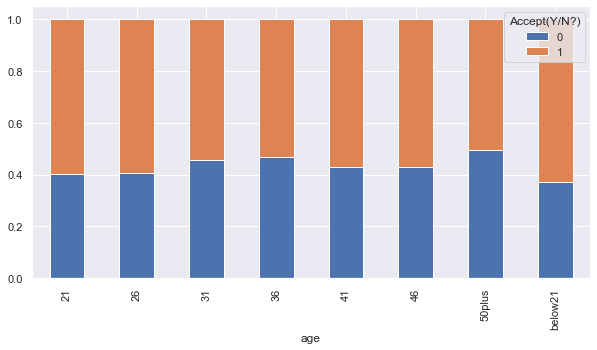

In [119]:
tmp = data1[["Accept(Y/N?)", "age"]]
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "age"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "age==\""+row["age"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="age", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [120]:
# Hypothesis testing on "coupon" column
stat, p_val, dof = chi_sqred_ind_test(data, "age", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
age                     
21            1066  1587
26            1034  1525
31             925  1114
36             613   706
41             467   626
46             291   395
50plus         878   910
below21        200   347
Statistic: 63.158748415351766
P-value: 3.5221422366296096e-11
DOF: 7
probability=0.950, critical=14.067, stat=63.159
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [121]:
# Hypothesis testing on "coupon" column
stat, p_val, dof = chi_sqred_ind_test(data1, "age", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
age                     
21            1049  1549
26            1011  1475
31             905  1079
36             606   687
41             461   618
46             282   378
50plus         868   888
below21        199   338
Statistic: 62.61503985591013
P-value: 4.5267556076001646e-11
DOF: 7
probability=0.950, critical=14.067, stat=62.615
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [122]:
t = pd.crosstab(data1.age, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=62.61503985591013, pvalue=4.5267556076001646e-11, dof=7, expected_freq=array([[1128.04308884, 1469.95691116],
       [1079.41305576, 1406.58694424],
       [ 861.44630033, 1122.55369967],
       [ 561.41636408,  731.58363592],
       [ 468.49826515,  610.50173485],
       [ 286.56983781,  373.43016219],
       [ 762.44944727,  993.55055273],
       [ 233.16364076,  303.83635924]]))

## Visualizing maritalStatus

In [123]:
data1["maritalStatus"].value_counts()

Married partner      4994
Single               4610
Unmarried partner    2155
Divorced              505
Widowed               129
Name: maritalStatus, dtype: int64

Married partner      4994
Single               4610
Unmarried partner    2155
Divorced              505
Widowed               129
Name: maritalStatus, dtype: int64
AxesSubplot(0.547727,0.194261;0.352273x0.616477)


Text(0.5, 1.0, 'maritalStatus ratio Proposanate')

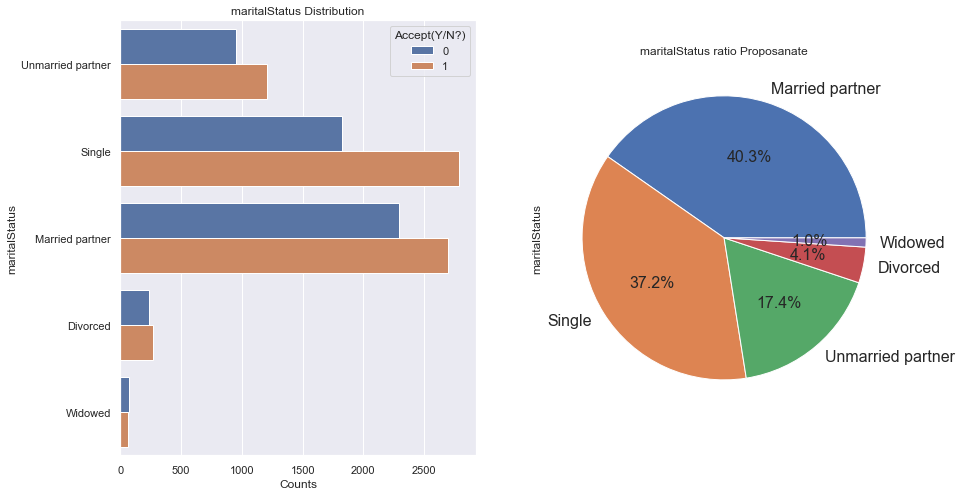

In [124]:
#  Distribution of "destination"
fig, ax = plt.subplots(1,2,figsize=(14,8))
ax1=plt.subplot(1,2,1)
sns.countplot(y="maritalStatus", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('maritalStatus')
plt.title('maritalStatus Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['maritalStatus'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('maritalStatus ratio Proposanate')

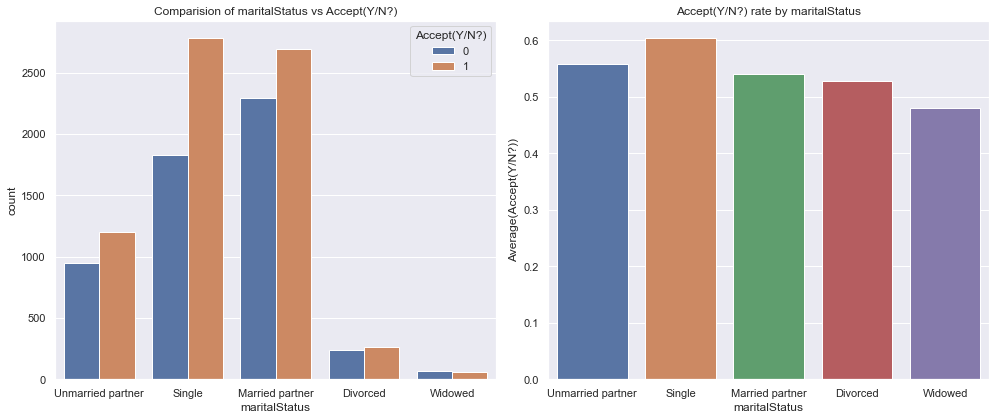

In [125]:
CategoricalVariables_targetPlots(data1,"maritalStatus")

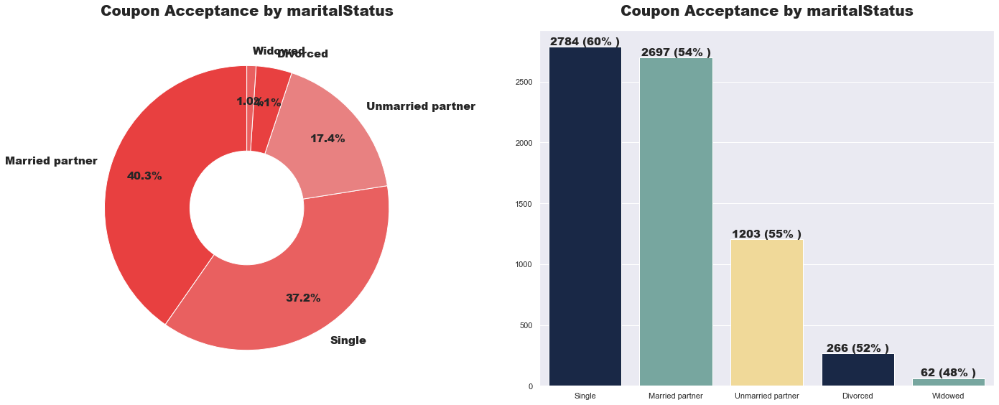

In [126]:
#Visualization to show Coupon Acceptance by temperature.
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
value_1 = data1["maritalStatus"].value_counts()
plt.title("Coupon Acceptance by maritalStatus", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Attrition Rate by Businees Travel.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["maritalStatus"].value_counts()
# acceptance_rate = np.floor((value_2/value_1)*100).values
acceptance_rate = [60, 54, 55, 52, 48]
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by maritalStatus",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


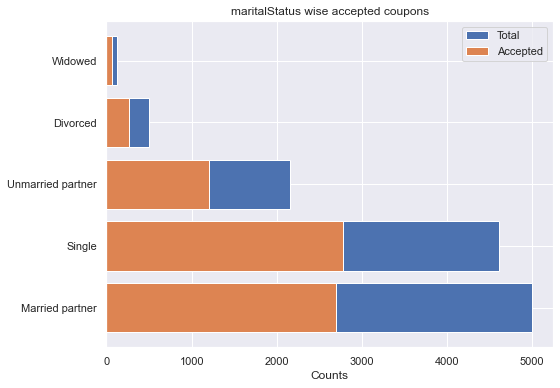

,maritalStatus,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
1,Married partner,4994,37.198418,2697,2297,54.005,45.995
2,Single,4610,17.388849,2784,1826,60.390,39.610
3,Unmarried partner,2155,4.074881,1203,952,55.824,44.176
0,Divorced,505,40.296942,266,239,52.673,47.327
4,Widowed,129,1.040910,62,67,48.062,51.938


In [127]:
Univariate_Analysis1("maritalStatus")

,Accept(Y/N?),maritalStatus,count,count_norm
0,0,Divorced,239,0.473267
1,0,Married partner,2297,0.459952
2,0,Single,1826,0.396095
3,0,Unmarried partner,952,0.441763
4,0,Widowed,67,0.519380
5,1,Divorced,266,0.526733
6,1,Married partner,2697,0.540048
7,1,Single,2784,0.603905
8,1,Unmarried partner,1203,0.558237
9,1,Widowed,62,0.480620


<AxesSubplot:xlabel='maritalStatus'>

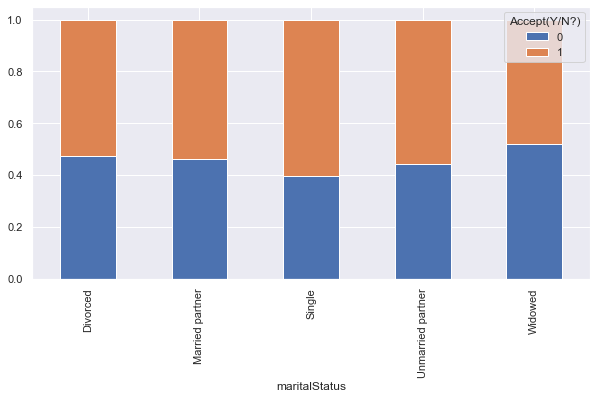

In [128]:
tmp = data1[["Accept(Y/N?)", "maritalStatus"]]
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "maritalStatus"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "maritalStatus==\""+row["maritalStatus"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="maritalStatus", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [129]:
# Hypothesis testing on "coupon" column
stat, p_val, dof = chi_sqred_ind_test(data, "maritalStatus", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)          0     1
maritalStatus                
Divorced            243   273
Married partner    2331  2769
Single             1873  2879
Unmarried partner   959  1227
Widowed              68    62
Statistic: 48.77999591154127
P-value: 6.489647983232487e-10
DOF: 4
probability=0.950, critical=9.488, stat=48.780
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [130]:
# Hypothesis testing on "coupon" column
stat, p_val, dof = chi_sqred_ind_test(data1, "maritalStatus", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)          0     1
maritalStatus                
Divorced            239   266
Married partner    2297  2697
Single             1826  2784
Unmarried partner   952  1203
Widowed              67    62
Statistic: 48.17587308664855
P-value: 8.673752412913451e-10
DOF: 4
probability=0.950, critical=9.488, stat=48.176
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [131]:
t = pd.crosstab(data1.maritalStatus, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=48.17587308664855, pvalue=8.673752412913451e-10, dof=4, expected_freq=array([[ 219.2693456 ,  285.7306544 ],
       [2168.37843944, 2825.62156056],
       [2001.64689744, 2608.35310256],
       [ 935.69394013, 1219.30605987],
       [  56.01137739,   72.98862261]]))

## Visualizing has_children

In [132]:
data1["has_children"].value_counts()

0    7243
1    5150
Name: has_children, dtype: int64

0    7243
1    5150
Name: has_children, dtype: int64
AxesSubplot(0.547727,0.208939;0.352273x0.587121)


Text(0.5, 1.0, 'has_children ratio Proposanate')

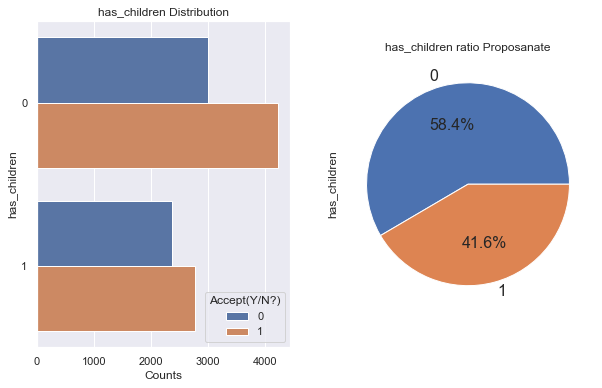

In [133]:
#  Distribution of "destination"
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="has_children", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('has_children')
plt.title('has_children Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['has_children'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('has_children ratio Proposanate')

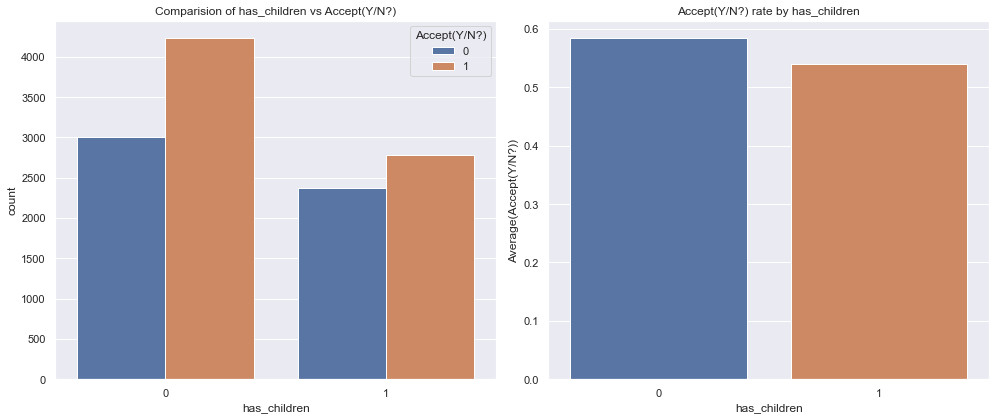

In [134]:
CategoricalVariables_targetPlots(data1,"has_children")

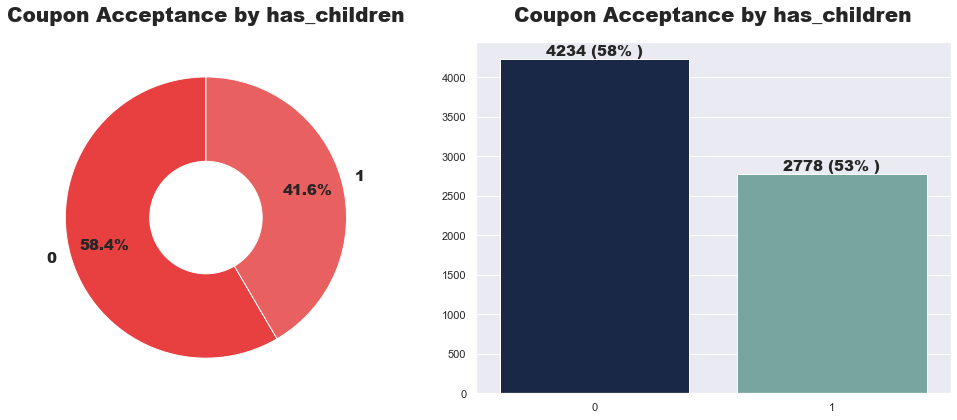

In [135]:
#Visualization to show Coupon Acceptance by temperature.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = data1["has_children"].value_counts()
plt.title("Coupon Acceptance by has_children", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Attrition Rate by Businees Travel.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["has_children"].value_counts()
acceptance_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by has_children",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


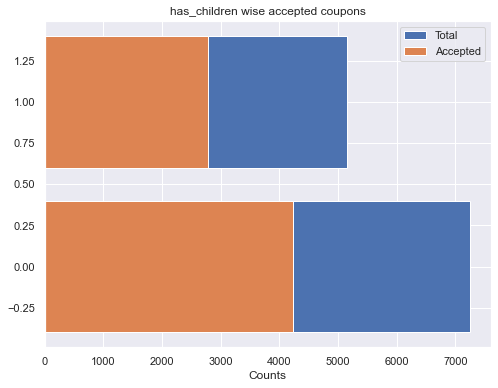

,has_children,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
0,0,7243,58.444283,4234,3009,58.456,41.544
1,1,5150,41.555717,2778,2372,53.942,46.058


In [136]:
Univariate_Analysis1("has_children")

,Accept(Y/N?),has_children,count,count_norm
0,0,0,3009,0.415436
1,0,1,2372,0.460583
2,1,0,4234,0.584564
3,1,1,2778,0.539417


<AxesSubplot:xlabel='has_children'>

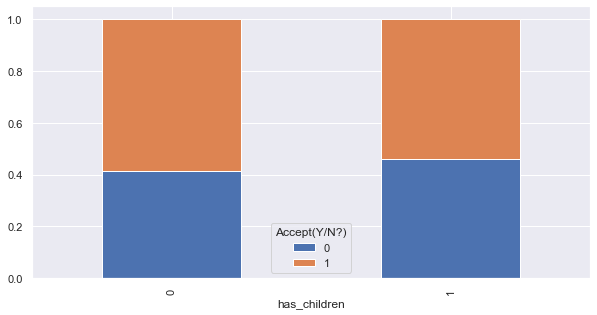

In [137]:
tmp = data1[["Accept(Y/N?)", "has_children"]].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "has_children"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "has_children==\""+row["has_children"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="has_children", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [138]:
# Hypothesis testing on "coupon" column
stat, p_val, dof = chi_sqred_ind_test(data, "has_children", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
has_children            
0             3066  4365
1             2408  2845
Statistic: 26.1386601677788
P-value: 3.177577367650862e-07
DOF: 1
probability=0.950, critical=3.841, stat=26.139
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [139]:
# Hypothesis testing on "coupon" column
stat, p_val, dof = chi_sqred_ind_test(data1, "has_children", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
has_children            
0             3009  4234
1             2372  2778
Statistic: 24.788590986195693
P-value: 6.397501556165695e-07
DOF: 1
probability=0.950, critical=3.841, stat=24.789
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [140]:
t = pd.crosstab(data1.has_children, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=24.788590986195693, pvalue=6.397501556165695e-07, dof=1, expected_freq=array([[3144.88687162, 4098.11312838],
       [2236.11312838, 2913.88687162]]))

## Visualizing education

In [141]:
data1["education"].value_counts()

Some college - no degree                  4260
Bachelors degree                          4247
Graduate degree (Masters or Doctorate)    1793
Associates degree                         1126
High School Graduate                       880
Some High School                            87
Name: education, dtype: int64

Some college - no degree                  4260
Bachelors degree                          4247
Graduate degree (Masters or Doctorate)    1793
Associates degree                         1126
High School Graduate                       880
Some High School                            87
Name: education, dtype: int64
AxesSubplot(0.547727,0.194261;0.352273x0.616477)


Text(0.5, 1.0, 'education ratio Proposanate')

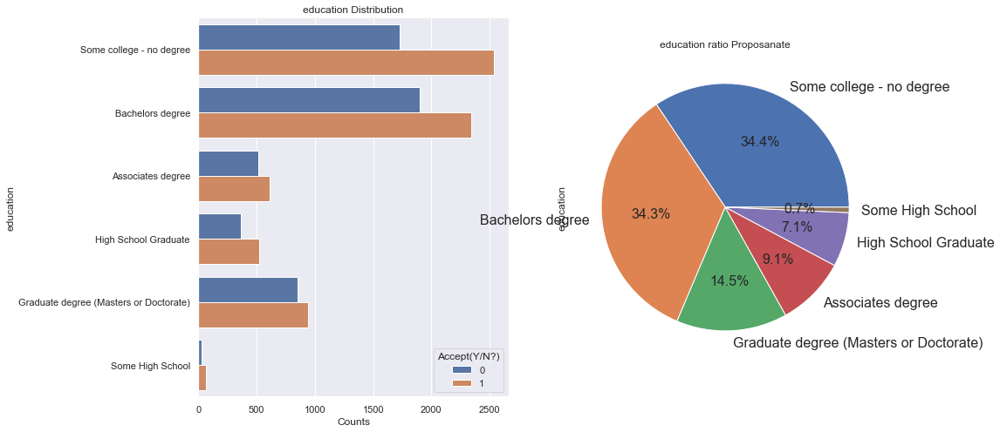

In [142]:
#  Distribution of "education"
fig, ax = plt.subplots(1,2,figsize=(14,8))
ax1=plt.subplot(1,2,1)
sns.countplot(y="education", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('education')
plt.title('education Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['education'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('education ratio Proposanate')

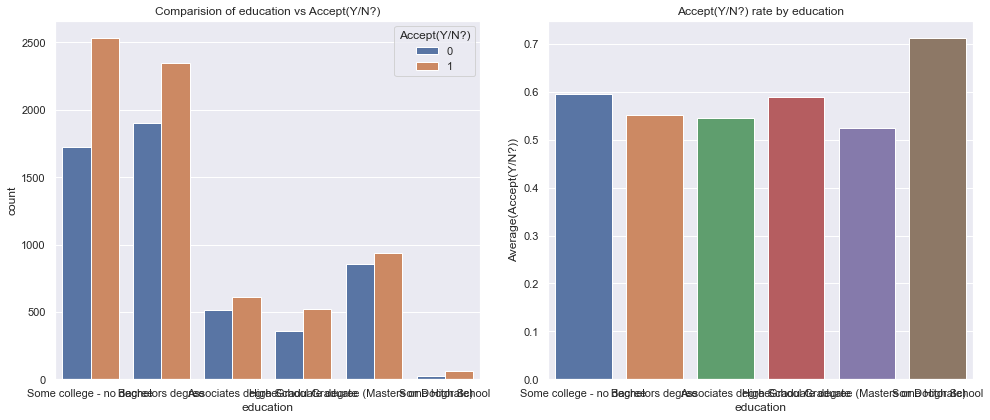

In [143]:
CategoricalVariables_targetPlots(data1,"education")

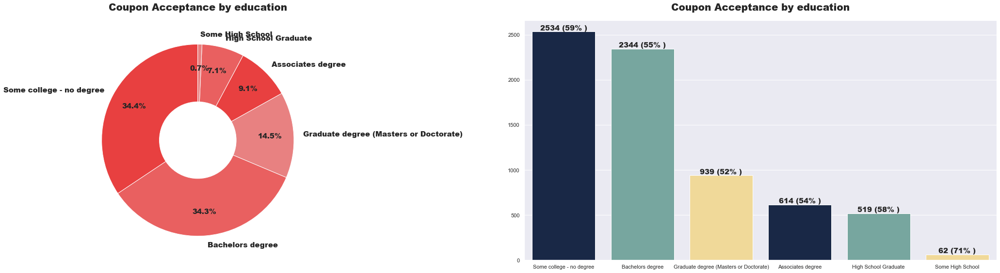

In [144]:
#Visualization to show Coupon Acceptance by temperature.
plt.figure(figsize=(30,8))
plt.subplot(1,2,1)
value_1 = data1["education"].value_counts()
plt.title("Coupon Acceptance by education", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Attrition Rate by Businees Travel.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["education"].value_counts()
acceptance_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by education",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


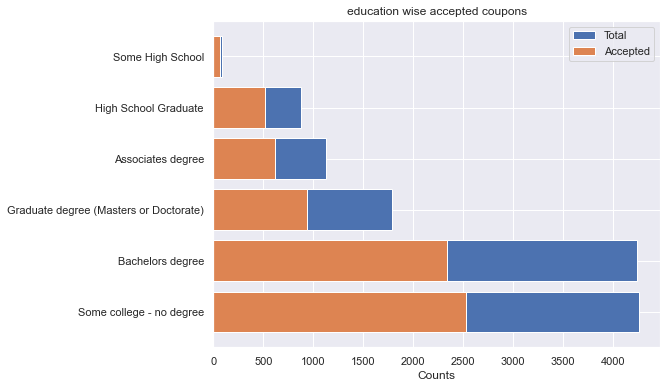

,education,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
5,Some college - no degree,4260,0.702009,2534,1726,59.484,40.516
1,Bachelors degree,4247,34.269346,2344,1903,55.192,44.808
2,Graduate degree (Masters or Doctorate),1793,14.467845,939,854,52.370,47.630
0,Associates degree,1126,34.374244,614,512,54.529,45.471
3,High School Graduate,880,9.085774,519,361,58.977,41.023
4,Some High School,87,7.100783,62,25,71.264,28.736


In [145]:
Univariate_Analysis1("education")

,Accept(Y/N?),education,count,count_norm
0,0,Associates degree,512,0.454707
1,0,Bachelors degree,1903,0.448081
2,0,Graduate degree (Masters or Doctorate),854,0.476297
3,0,High School Graduate,361,0.410227
4,0,Some High School,25,0.287356
5,0,Some college - no degree,1726,0.405164
6,1,Associates degree,614,0.545293
7,1,Bachelors degree,2344,0.551919
8,1,Graduate degree (Masters or Doctorate),939,0.523703
9,1,High School Graduate,519,0.589773


<AxesSubplot:xlabel='education'>

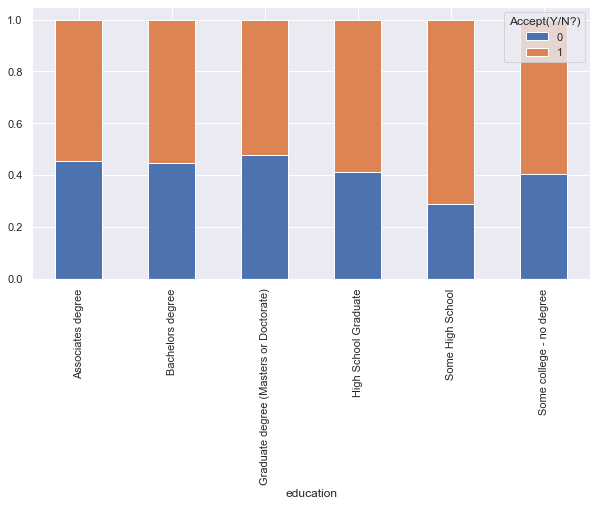

In [146]:
tmp = data1[["Accept(Y/N?)", "education"]]
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "education"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "education==\""+row["education"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="education", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [147]:
# Hypothesis testing on "coupon" column
stat, p_val, dof = chi_sqred_ind_test(data, "education", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)                               0     1
education                                         
Associates degree                        515   638
Bachelors degree                        1932  2403
Graduate degree (Masters or Doctorate)   877   975
High School Graduate                     369   536
Some High School                          25    63
Some college - no degree                1756  2595
Statistic: 41.673351660945656
P-value: 6.858463266342188e-08
DOF: 5
probability=0.950, critical=11.070, stat=41.673
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [148]:
# Hypothesis testing on "coupon" column
stat, p_val, dof = chi_sqred_ind_test(data1, "education", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)                               0     1
education                                         
Associates degree                        512   614
Bachelors degree                        1903  2344
Graduate degree (Masters or Doctorate)   854   939
High School Graduate                     361   519
Some High School                          25    62
Some college - no degree                1726  2534
Statistic: 42.50611129428766
P-value: 4.652513690287145e-08
DOF: 5
probability=0.950, critical=11.070, stat=42.506
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [149]:
t = pd.crosstab(data1.education, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=42.50611129428766, pvalue=4.652513690287145e-08, dof=5, expected_freq=array([[ 488.90551118,  637.09448882],
       [1844.03348665, 2402.96651335],
       [ 778.51472606, 1014.48527394],
       [ 382.09311708,  497.90688292],
       [  37.77511498,   49.22488502],
       [1849.67804406, 2410.32195594]]))

## Visualizing occupation

In [150]:
data1["occupation"].value_counts()

Unemployed                                   1828
Student                                      1550
Computer & Mathematical                      1360
Sales & Related                              1066
Education&Training&Library                    921
Management                                    806
Office & Administrative Support               631
Arts Design Entertainment Sports & Media      617
Business & Financial                          536
Retired                                       489
Food Preparation & Serving Related            293
Healthcare Support                            237
Healthcare Practitioners & Technical          237
Community & Social Services                   236
Legal                                         218
Transportation & Material Moving              214
Architecture & Engineering                    172
Personal Care & Service                       172
Protective Service                            172
Life Physical Social Science                  168


Unemployed                                   1828
Student                                      1550
Computer & Mathematical                      1360
Sales & Related                              1066
Education&Training&Library                    921
Management                                    806
Office & Administrative Support               631
Arts Design Entertainment Sports & Media      617
Business & Financial                          536
Retired                                       489
Food Preparation & Serving Related            293
Healthcare Support                            237
Healthcare Practitioners & Technical          237
Community & Social Services                   236
Legal                                         218
Transportation & Material Moving              214
Architecture & Engineering                    172
Personal Care & Service                       172
Protective Service                            172
Life Physical Social Science                  168


Text(0.5, 1.0, 'occupation ratio Proposanate')

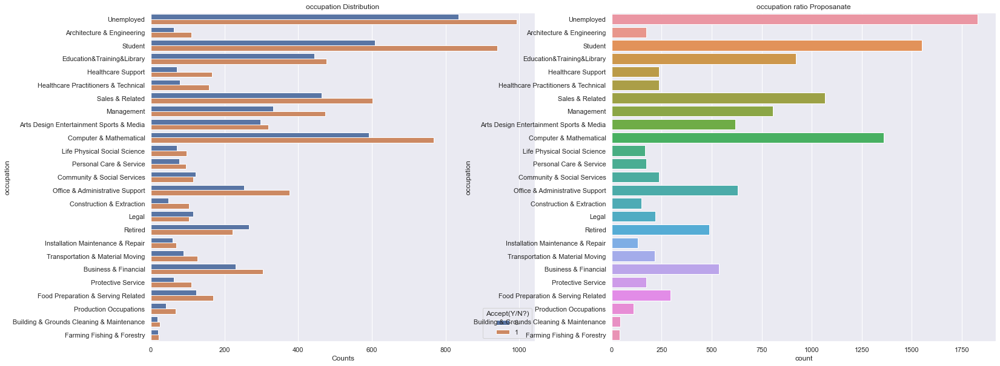

In [151]:
#  Distribution of "destination"
fig, ax = plt.subplots(1,2,figsize=(25,10))
ax1=plt.subplot(1,2,1)
sns.countplot(y="occupation", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('occupation')
plt.title('occupation Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['occupation'].value_counts()
print(val_counts)
sns.countplot(y = data1["occupation"])
plt.title('occupation ratio Proposanate')

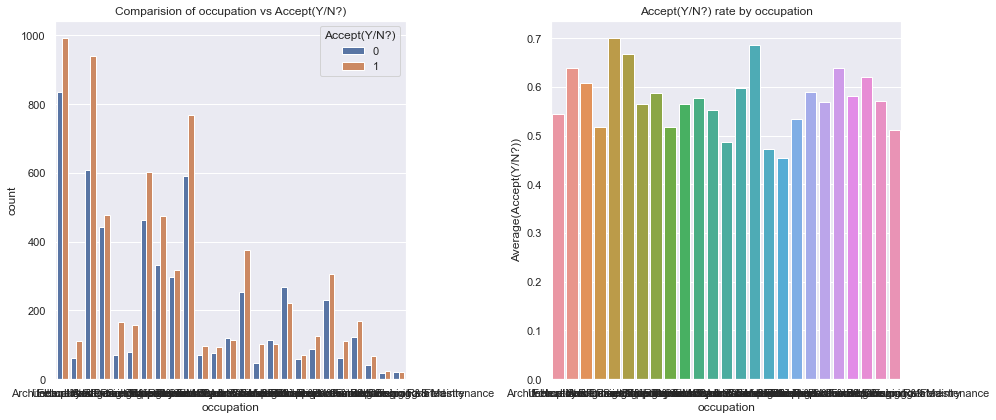

In [152]:
CategoricalVariables_targetPlots(data1,"occupation")

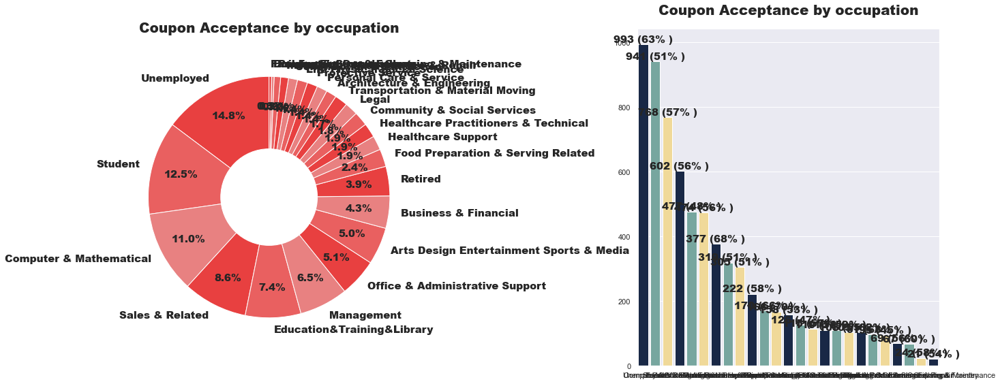

In [153]:
#Visualization to show Coupon Acceptance by temperature.
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
value_1 = data1["occupation"].value_counts()
plt.title("Coupon Acceptance by occupation", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Attrition Rate by Businees Travel.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["occupation"].value_counts()
acceptance_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by occupation",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


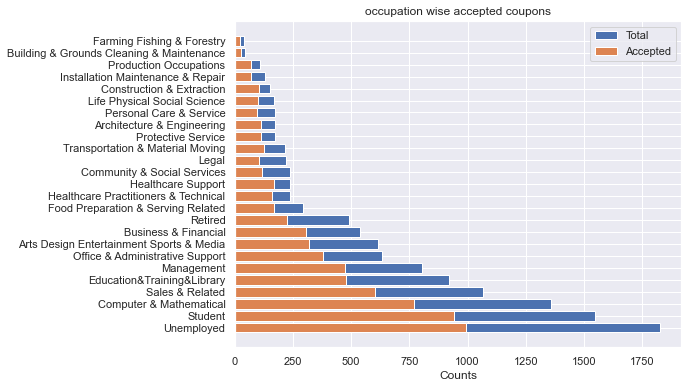

,occupation,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
24,Unemployed,1828,0.330832,993,835,54.322,45.678
22,Student,1550,0.871460,941,609,60.710,39.290
5,Computer & Mathematical,1360,6.503671,768,592,56.471,43.529
21,Sales & Related,1066,1.040910,602,464,56.473,43.527
7,Education&Training&Library,921,4.978617,477,444,51.792,48.208
15,Management,806,1.726781,474,332,58.809,41.191
16,Office & Administrative Support,631,1.387880,377,254,59.746,40.254
1,Arts Design Entertainment Sports & Media,617,12.507060,319,298,51.702,48.298
3,Business & Financial,536,8.601630,305,231,56.903,43.097
20,Retired,489,1.210361,222,267,45.399,54.601


In [154]:
Univariate_Analysis1("occupation")

,Accept(Y/N?),occupation,count,count_norm
0,0,Architecture & Engineering,62,0.360465
1,0,Arts Design Entertainment Sports & Media,298,0.482982
2,0,Building & Grounds Cleaning & Maintenance,18,0.428571
3,0,Business & Financial,231,0.430970
4,0,Community & Social Services,121,0.512712
5,0,Computer & Mathematical,592,0.435294
6,0,Construction & Extraction,47,0.313333
7,0,Education&Training&Library,444,0.482085
8,0,Farming Fishing & Forestry,20,0.487805
9,0,Food Preparation & Serving Related,123,0.419795


<AxesSubplot:xlabel='occupation'>

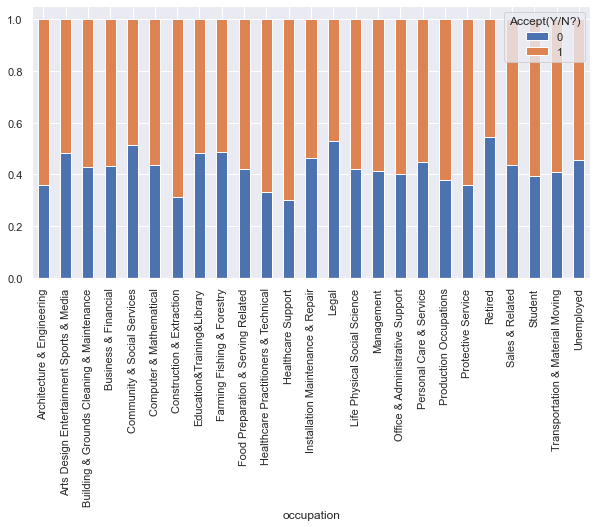

In [155]:
tmp = data1[["Accept(Y/N?)", "occupation"]]
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "occupation"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "occupation==\""+row["occupation"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="occupation", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [156]:
# Hypothesis testing on "occupation" column
stat, p_val, dof = chi_sqred_ind_test(data, "occupation", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)                                 0     1
occupation                                          
Architecture & Engineering                  64   111
Arts Design Entertainment Sports & Media   303   326
Building & Grounds Cleaning & Maintenance   18    26
Business & Financial                       234   310
Community & Social Services                123   118
Computer & Mathematical                    610   798
Construction & Extraction                   48   106
Education&Training&Library                 449   494
Farming Fishing & Forestry                  20    23
Food Preparation & Serving Related         124   174
Healthcare Practitioners & Technical        79   165
Healthcare Support                          73   169
Installation Maintenance & Repair           62    71
Legal                                      116   103
Life Physical Social Science                72    98
Management                                 345   493
Office & Administrative Su

In [157]:
# Hypothesis testing on "occupation" column
stat, p_val, dof = chi_sqred_ind_test(data1, "occupation", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)                                 0    1
occupation                                         
Architecture & Engineering                  62  110
Arts Design Entertainment Sports & Media   298  319
Building & Grounds Cleaning & Maintenance   18   24
Business & Financial                       231  305
Community & Social Services                121  115
Computer & Mathematical                    592  768
Construction & Extraction                   47  103
Education&Training&Library                 444  477
Farming Fishing & Forestry                  20   21
Food Preparation & Serving Related         123  170
Healthcare Practitioners & Technical        79  158
Healthcare Support                          71  166
Installation Maintenance & Repair           60   69
Legal                                      115  103
Life Physical Social Science                71   97
Management                                 332  474
Office & Administrative Support            2

In [158]:
t = pd.crosstab(data1.occupation, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=118.95553779959918, pvalue=1.4885294061490842e-14, dof=24, expected_freq=array([[  74.68183652,   97.31816348],
       [ 267.89937868,  349.10062132],
       [  18.23626241,   23.76373759],
       [ 232.72944404,  303.27055596],
       [ 102.47042685,  133.52957315],
       [ 590.50754458,  769.49245542],
       [  65.12950859,   84.87049141],
       [ 399.89518276,  521.10481724],
       [  17.80206568,   23.19793432],
       [ 127.21964012,  165.78035988],
       [ 102.90462358,  134.09537642],
       [ 102.90462358,  134.09537642],
       [  56.01137739,   72.98862261],
       [  94.65488582,  123.34511418],
       [  72.94504962,   95.05495038],
       [ 349.96255951,  456.03744049],
       [ 273.97813282,  357.02186718],
       [  74.68183652,   97.31816348],
       [  46.89324619,   61.10675381],
       [  74.68183652,   97.31816348],
       [ 212.32219802,  276.67780198],
       [ 462.85370774,  603.14629226],
       [ 673.00492213,  876.99507787]

## Visualizing occupation_class

In [159]:
# occupation feature has 25 no of distinct values, which creates very sparsity in data after Encoding
# FE -- occupation_class where categorize all occupation in its suitable class.
occupation_dict = {'Healthcare Support':'High_Acceptance','Construction & Extraction':'High_Acceptance','Healthcare Practitioners & Technical':'High_Acceptance',
                   'Protective Service':'High_Acceptance','Architecture & Engineering':'High_Acceptance','Production Occupations':'Medium_High_Acceptance',
                    'Student':'Medium_High_Acceptance','Office & Administrative Support':'Medium_High_Acceptance','Transportation & Material Moving':'Medium_High_Acceptance',
                    'Building & Grounds Cleaning & Maintenance':'Medium_High_Acceptance','Management':'Medium_Acceptance','Food Preparation & Serving Related':'Medium_Acceptance',
                   'Life Physical Social Science':'Medium_Acceptance','Business & Financial':'Medium_Acceptance','Computer & Mathematical':'Medium_Acceptance',
                    'Sales & Related':'Medium_Low_Acceptance','Personal Care & Service':'Medium_Low_Acceptance','Unemployed':'Medium_Low_Acceptance',
                   'Farming Fishing & Forestry':'Medium_Low_Acceptance','Installation Maintenance & Repair':'Medium_Low_Acceptance','Education&Training&Library':'Low_Acceptance',
                    'Arts Design Entertainment Sports & Media':'Low_Acceptance','Community & Social Services':'Low_Acceptance','Legal':'Low_Acceptance','Retired':'Low_Acceptance'}
# occupation_dict
data1['occupation_class'] = data1['occupation'].map(occupation_dict)
print('Unique values:',data1['occupation_class'].unique())
print('-'*50)
print(data1['occupation_class'].describe())
print(data1['occupation_class'].value_counts())

Unique values: ['Medium_Low_Acceptance' 'High_Acceptance' 'Medium_High_Acceptance'
 'Low_Acceptance' 'Medium_Acceptance']
--------------------------------------------------
count                     12393
unique                        5
top       Medium_Low_Acceptance
freq                       3236
Name: occupation_class, dtype: object
Medium_Low_Acceptance     3236
Medium_Acceptance         3163
Medium_High_Acceptance    2545
Low_Acceptance            2481
High_Acceptance            968
Name: occupation_class, dtype: int64


Medium_Low_Acceptance     3236
Medium_Acceptance         3163
Medium_High_Acceptance    2545
Low_Acceptance            2481
High_Acceptance            968
Name: occupation_class, dtype: int64


Text(0.5, 1.0, 'occupation_class ratio Proposanate')

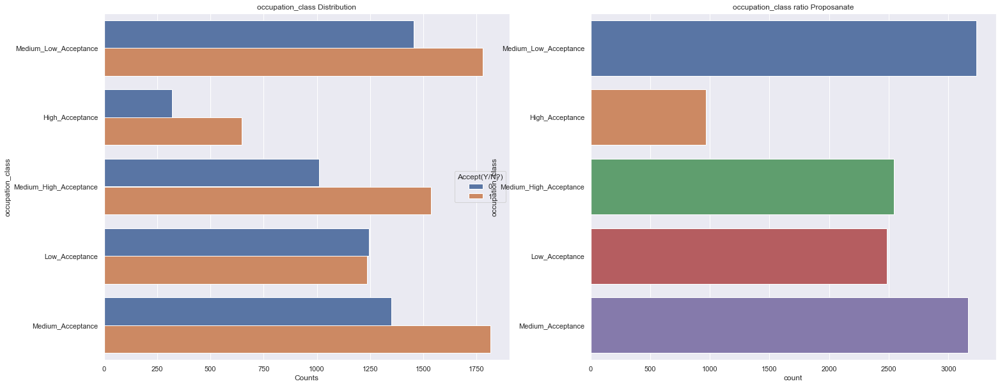

In [160]:
#  Distribution of "destination"
fig, ax = plt.subplots(1,2,figsize=(25,10))
ax1=plt.subplot(1,2,1)
sns.countplot(y="occupation_class", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('occupation_class')
plt.title('occupation_class Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['occupation_class'].value_counts()
print(val_counts)
sns.countplot(y = data1["occupation_class"])
plt.title('occupation_class ratio Proposanate')

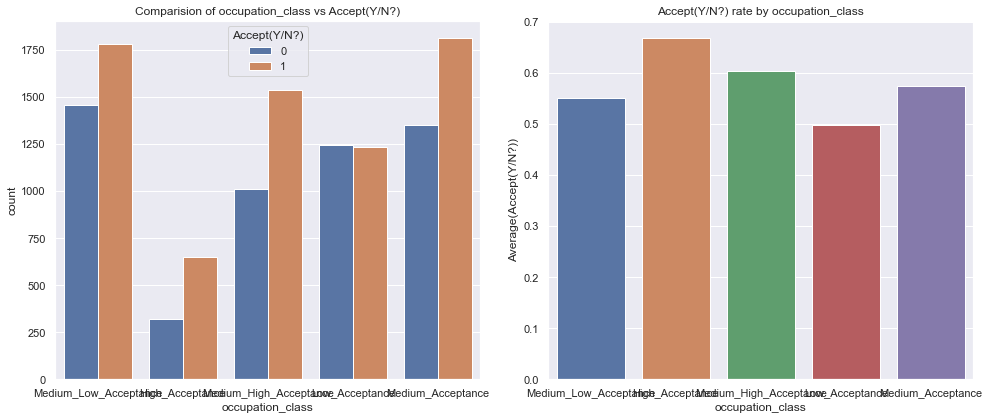

In [161]:
CategoricalVariables_targetPlots(data1,"occupation_class")

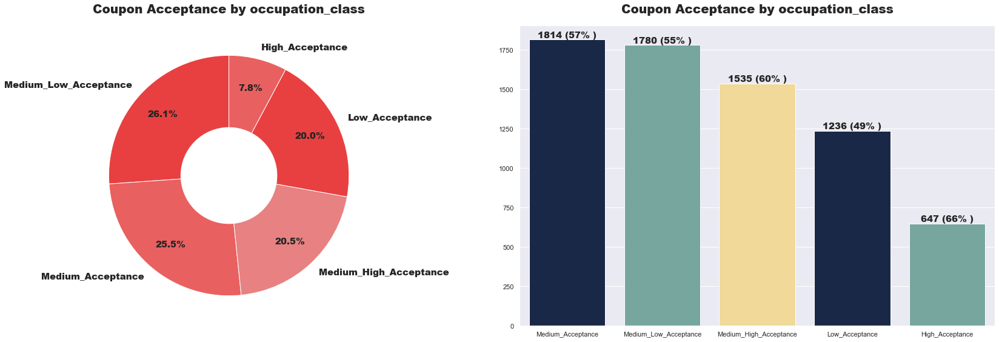

In [162]:
#Visualization to show Coupon Acceptance by temperature.
plt.figure(figsize=(24,8))
plt.subplot(1,2,1)
value_1 = data1["occupation_class"].value_counts()
plt.title("Coupon Acceptance by occupation_class", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Attrition Rate by Businees Travel.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["occupation_class"].value_counts()
# acceptance_rate = np.floor((value_2/value_1)*100).values
acceptance_rate = [57, 55, 60, 49, 66]
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by occupation_class",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


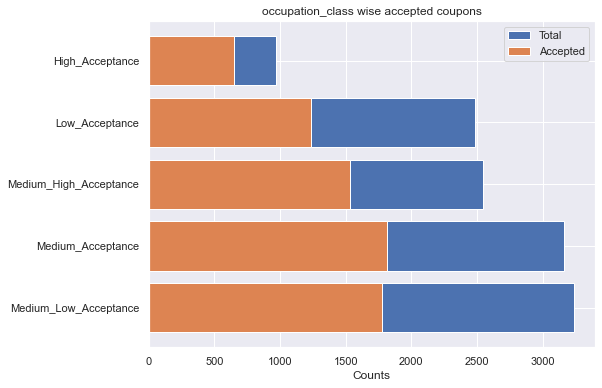

,occupation_class,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
4,Medium_Low_Acceptance,3236,7.810861,1780,1456,55.006,44.994
2,Medium_Acceptance,3163,20.535786,1814,1349,57.351,42.649
3,Medium_High_Acceptance,2545,20.019366,1535,1010,60.314,39.686
1,Low_Acceptance,2481,25.522472,1236,1245,49.819,50.181
0,High_Acceptance,968,26.111515,647,321,66.839,33.161


In [163]:
Univariate_Analysis1("occupation_class")

,Accept(Y/N?),occupation_class,count,count_norm
0,0,High_Acceptance,321,0.331612
1,0,Low_Acceptance,1245,0.501814
2,0,Medium_Acceptance,1349,0.426494
3,0,Medium_High_Acceptance,1010,0.396857
4,0,Medium_Low_Acceptance,1456,0.449938
5,1,High_Acceptance,647,0.668388
6,1,Low_Acceptance,1236,0.498186
7,1,Medium_Acceptance,1814,0.573506
8,1,Medium_High_Acceptance,1535,0.603143
9,1,Medium_Low_Acceptance,1780,0.550062


<AxesSubplot:xlabel='occupation_class'>

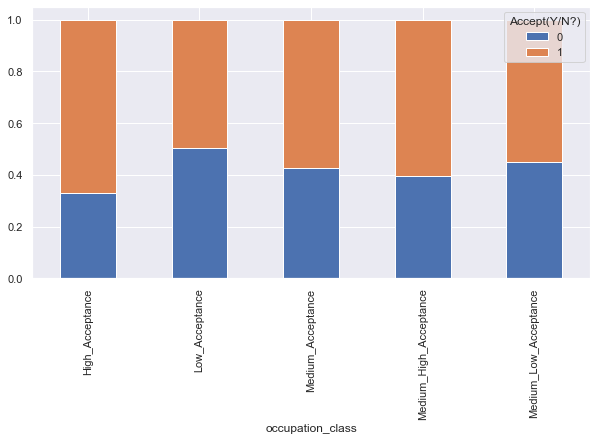

In [164]:
tmp = data1[["Accept(Y/N?)", "occupation_class"]]
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "occupation_class"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "occupation_class==\""+row["occupation_class"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="occupation_class", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [165]:
# Hypothesis testing on "occupation_class" column
stat, p_val, dof = chi_sqred_ind_test(data1, "occupation_class", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)               0     1
occupation_class                  
High_Acceptance          321   647
Low_Acceptance          1245  1236
Medium_Acceptance       1349  1814
Medium_High_Acceptance  1010  1535
Medium_Low_Acceptance   1456  1780
Statistic: 106.11086048532208
P-value: 4.910873406923927e-22
DOF: 4
probability=0.950, critical=9.488, stat=106.111
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [166]:
t = pd.crosstab(data1.occupation_class, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=106.11086048532208, pvalue=4.910873406923927e-22, dof=4, expected_freq=array([[ 420.30242879,  547.69757121],
       [1077.24207214, 1403.75792786],
       [1373.36423788, 1789.63576212],
       [1105.03066247, 1439.96933753],
       [1405.06059873, 1830.93940127]]))

## Visualizing income

In [167]:
data1["income"].value_counts()

$25000 - $37499     1972
$12500 - $24999     1795
$37500 - $49999     1760
$100000 or More     1688
$50000 - $62499     1624
Less than $12500    1013
$87500 - $99999      865
$75000 - $87499      844
$62500 - $74999      832
Name: income, dtype: int64

$25000 - $37499     1972
$12500 - $24999     1795
$37500 - $49999     1760
$100000 or More     1688
$50000 - $62499     1624
Less than $12500    1013
$87500 - $99999      865
$75000 - $87499      844
$62500 - $74999      832
Name: income, dtype: int64
AxesSubplot(0.572864,0.125;0.302x0.755)


Text(0.5, 1.0, 'income ratio Proposanate')

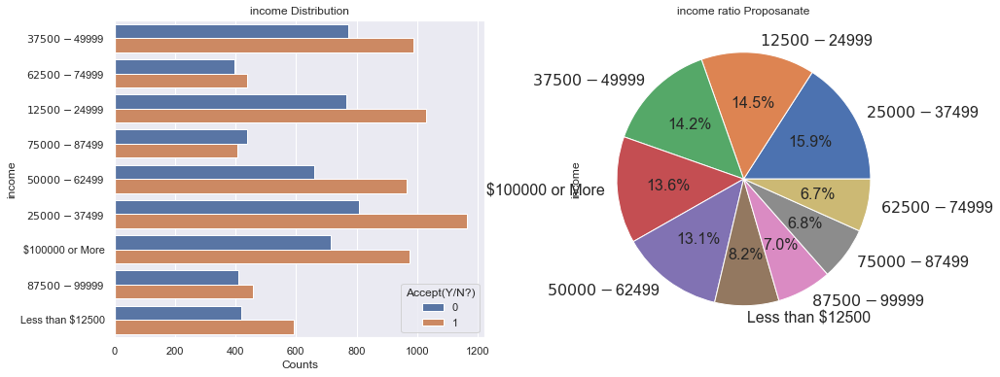

In [168]:
#  Distribution of "destination"
fig, ax = plt.subplots(1,2,figsize=(15,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="income", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('income')
plt.title('income Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['income'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('income ratio Proposanate')

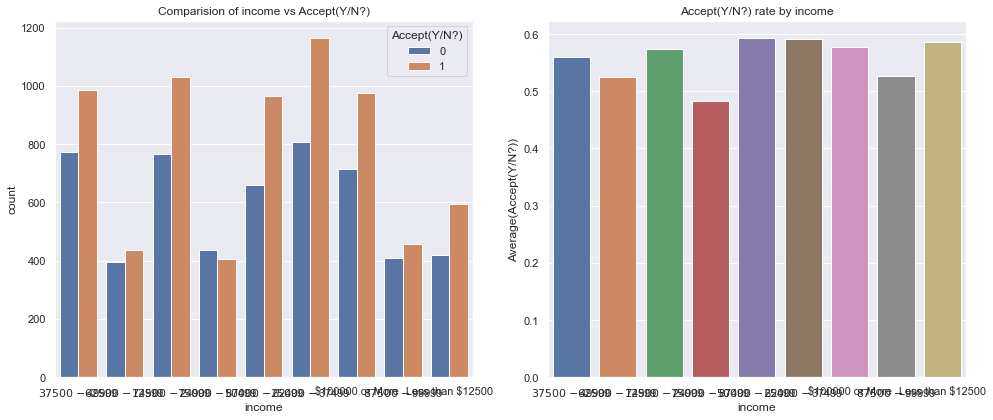

In [169]:
CategoricalVariables_targetPlots(data1,"income")

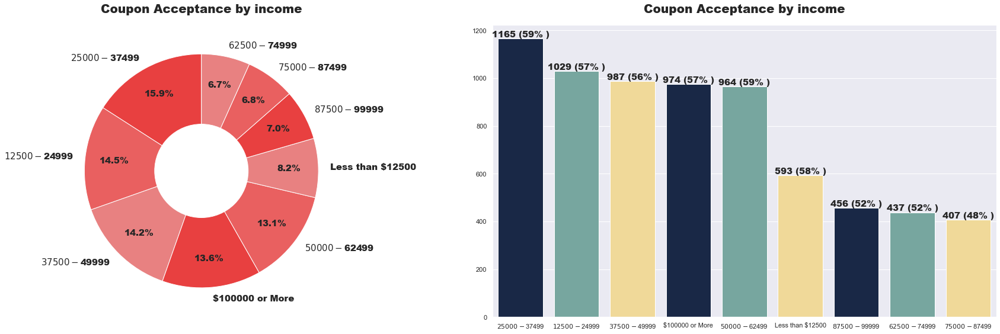

In [170]:
#Visualization to show Coupon Acceptance by temperature.
plt.figure(figsize=(25,8))
plt.subplot(1,2,1)
value_1 = data1["income"].value_counts()
plt.title("Coupon Acceptance by income", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Attrition Rate by Businees Travel.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["income"].value_counts()
# acceptance_rate = np.floor((value_2/value_1)*100).values
acceptance_rate = [59, 57, 56, 57, 59, 58, 52, 52, 48]
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by income",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


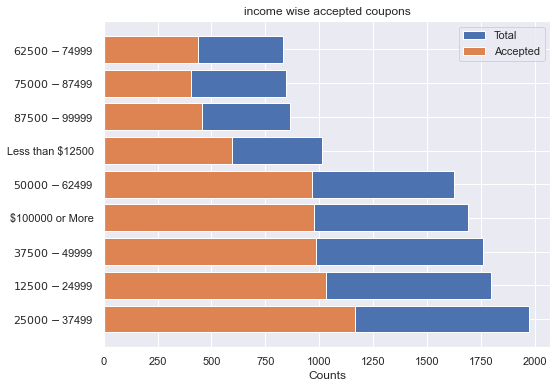

,income,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
2,$25000 - $37499,1972,14.201565,1165,807,59.077,40.923
1,$12500 - $24999,1795,14.483983,1029,766,57.326,42.674
3,$37500 - $49999,1760,13.620592,987,773,56.080,43.920
0,$100000 or More,1688,15.912209,974,714,57.701,42.299
4,$50000 - $62499,1624,13.104172,964,660,59.360,40.640
8,Less than $12500,1013,6.713467,593,420,58.539,41.461
7,$87500 - $99999,865,6.810296,456,409,52.717,47.283
6,$75000 - $87499,844,6.979747,407,437,48.223,51.777
5,$62500 - $74999,832,8.173969,437,395,52.524,47.476


In [171]:
Univariate_Analysis1("income")

,Accept(Y/N?),income,count,count_norm
0,0,$100000 or More,714,0.422986
1,0,$12500 - $24999,766,0.426741
2,0,$25000 - $37499,807,0.409229
3,0,$37500 - $49999,773,0.439205
4,0,$50000 - $62499,660,0.406404
5,0,$62500 - $74999,395,0.474760
6,0,$75000 - $87499,437,0.517773
7,0,$87500 - $99999,409,0.472832
8,0,Less than $12500,420,0.414610
9,1,$100000 or More,974,0.577014


<AxesSubplot:xlabel='income'>

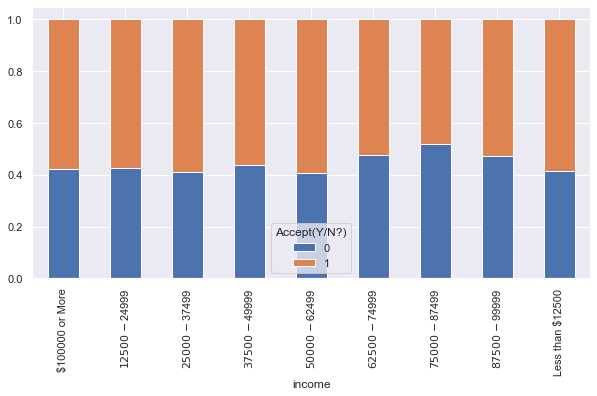

In [172]:
tmp = data1[["Accept(Y/N?)", "income"]]
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "income"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "income==\""+row["income"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="income", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [173]:
# Hypothesis testing on "income" column
stat, p_val, dof = chi_sqred_ind_test(data, "income", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)        0     1
income                     
$100000 or More   732  1004
$12500 - $24999   779  1052
$25000 - $37499   819  1194
$37500 - $49999   787  1018
$50000 - $62499   671   988
$62500 - $74999   400   446
$75000 - $87499   443   414
$87500 - $99999   419   476
Less than $12500  424   618
Statistic: 49.88268726622557
P-value: 4.30446851198096e-08
DOF: 8
probability=0.950, critical=15.507, stat=49.883
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [174]:
# Hypothesis testing on "income" column
stat, p_val, dof = chi_sqred_ind_test(data1, "income", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)        0     1
income                     
$100000 or More   714   974
$12500 - $24999   766  1029
$25000 - $37499   807  1165
$37500 - $49999   773   987
$50000 - $62499   660   964
$62500 - $74999   395   437
$75000 - $87499   437   407
$87500 - $99999   409   456
Less than $12500  420   593
Statistic: 47.9661167736331
P-value: 1.0027981309550821e-07
DOF: 8
probability=0.950, critical=15.507, stat=47.966
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [175]:
t = pd.crosstab(data1.income, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=47.9661167736331, pvalue=1.0027981309550821e-07, dof=8, expected_freq=array([[ 732.92407004,  955.07592996],
       [ 779.3831195 , 1015.6168805 ],
       [ 856.23593964, 1115.76406036],
       [ 764.18623416,  995.81376584],
       [ 705.13547971,  918.86452029],
       [ 361.25167433,  470.74832567],
       [ 366.46203502,  477.53796498],
       [ 375.58016622,  489.41983378],
       [ 439.84128137,  573.15871863]]))

In [176]:
data1.columns

Index(['destination', 'passanger', 'weather', 'temperature', 'coupon',
       'expiration', 'gender', 'age', 'maritalStatus', 'has_children',
       'education', 'occupation', 'income', 'car', 'Bar', 'CoffeeHouse',
       'CarryAway', 'RestaurantLessThan20', 'Restaurant20To50',
       'toCoupon_GEQ5min', 'toCoupon_GEQ15min', 'toCoupon_GEQ25min',
       'direction_same', 'direction_opp', 'Accept(Y/N?)', 'occupation_class'],
      dtype='object')

## Visualizing Bar

In [177]:
data1["Bar"].value_counts()

never    5195
less1    3383
1~3      2432
4~8      1045
gt8       338
Name: Bar, dtype: int64

never    5195
less1    3383
1~3      2432
4~8      1045
gt8       338
Name: Bar, dtype: int64
AxesSubplot(0.547727,0.208939;0.352273x0.587121)


Text(0.5, 1.0, 'Bar ratio Proposanate')

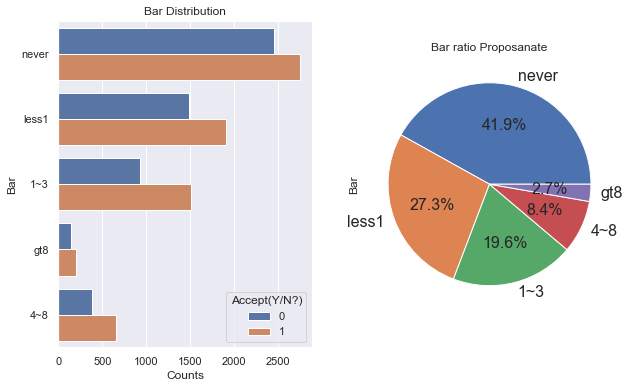

In [178]:
#  Distribution of "destination"
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="Bar", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('Bar')
plt.title('Bar Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['Bar'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('Bar ratio Proposanate')

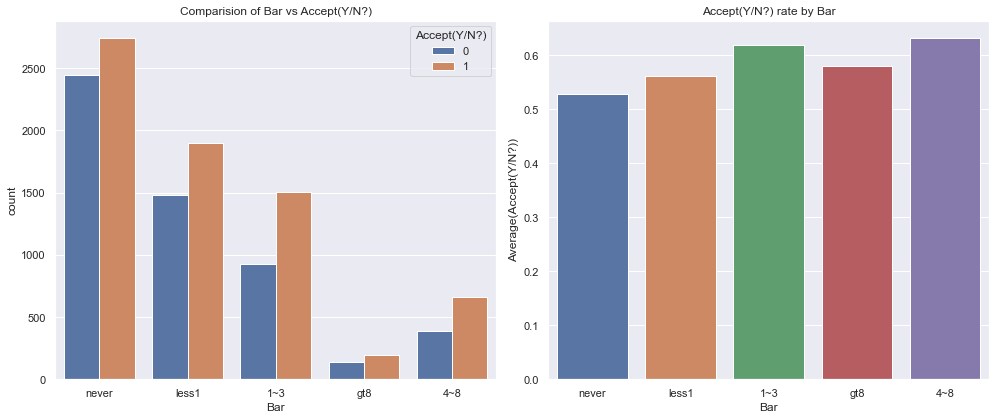

In [179]:
CategoricalVariables_targetPlots(data1,"Bar")

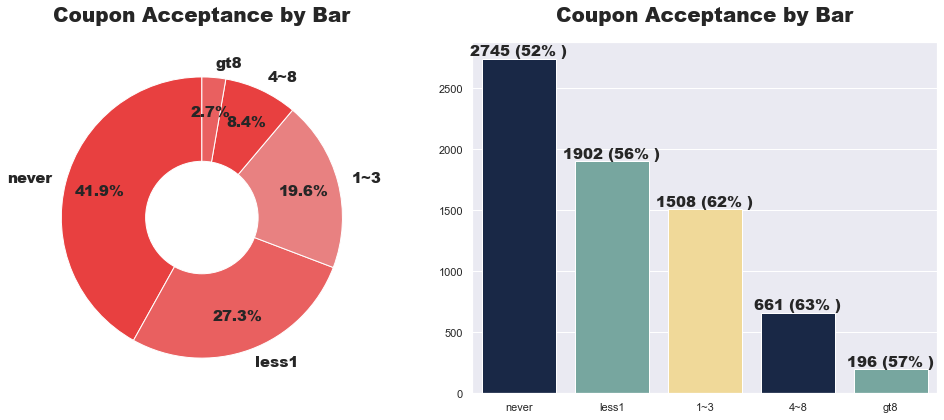

In [180]:
#Visualization to show Coupon Acceptance by temperature.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = data1["Bar"].value_counts()
plt.title("Coupon Acceptance by Bar", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Attrition Rate by Businees Travel.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["Bar"].value_counts()
acceptance_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by Bar",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


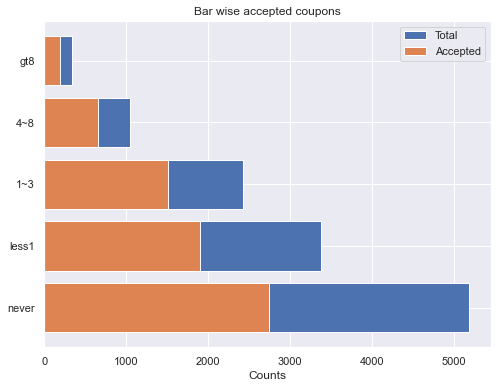

,Bar,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
4,never,5195,2.727346,2745,2450,52.839,47.161
3,less1,3383,8.432179,1902,1481,56.222,43.778
0,1~3,2432,41.918825,1508,924,62.007,37.993
1,4~8,1045,27.297668,661,384,63.254,36.746
2,gt8,338,19.623981,196,142,57.988,42.012


In [181]:
Univariate_Analysis1("Bar")

,Accept(Y/N?),Bar,count,count_norm
0,0,1~3,924,0.379934
1,0,4~8,384,0.367464
2,0,gt8,142,0.420118
3,0,less1,1481,0.437777
4,0,never,2450,0.471607
5,1,1~3,1508,0.620066
6,1,4~8,661,0.632536
7,1,gt8,196,0.579882
8,1,less1,1902,0.562223
9,1,never,2745,0.528393


<AxesSubplot:xlabel='Bar'>

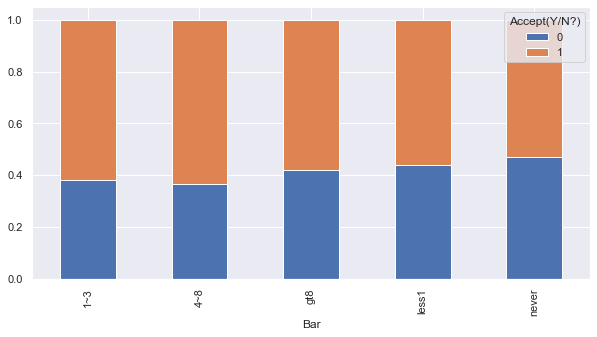

In [182]:
tmp = data1[["Accept(Y/N?)", "Bar"]]
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "Bar"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "Bar==\""+row["Bar"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="Bar", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [183]:
# Hypothesis testing on "coupon" column
stat, p_val, dof = chi_sqred_ind_test(data, "Bar", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
Bar                     
1~3            935  1538
4~8            390   686
gt8            148   201
less1         1519  1963
never         2430  2767
Statistic: 77.65859647265742
P-value: 5.455727802044016e-16
DOF: 4
probability=0.950, critical=9.488, stat=77.659
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [184]:
# Hypothesis testing on "coupon" column
stat, p_val, dof = chi_sqred_ind_test(data1, "Bar", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
Bar                     
1~3            924  1508
4~8            384   661
gt8            142   196
less1         1481  1902
never         2450  2745
Statistic: 78.13532962885871
P-value: 4.324369367509157e-16
DOF: 4
probability=0.950, critical=9.488, stat=78.135
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [185]:
t = pd.crosstab(data1.Bar, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=78.13532962885871, pvalue=4.324369367509157e-16, dof=4, expected_freq=array([[1055.96643266, 1376.03356734],
       [ 453.73557654,  591.26442346],
       [ 146.7584927 ,  191.2415073 ],
       [1468.88751715, 1914.11248285],
       [2255.65198096, 2939.34801904]]))

## Visualizing CoffeeHouse

In [186]:
data1["CoffeeHouse"].value_counts()

less1    3525
1~3      3138
never    2895
4~8      1752
gt8      1083
Name: CoffeeHouse, dtype: int64

less1    3525
1~3      3138
never    2895
4~8      1752
gt8      1083
Name: CoffeeHouse, dtype: int64
AxesSubplot(0.547727,0.208939;0.352273x0.587121)


Text(0.5, 1.0, 'CoffeeHouse ratio Proposanate')

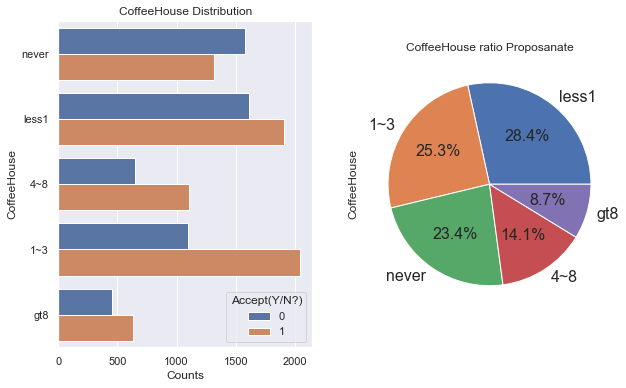

In [187]:
#  Distribution of "destination"
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="CoffeeHouse", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('CoffeeHouse')
plt.title('CoffeeHouse Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['CoffeeHouse'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('CoffeeHouse ratio Proposanate')

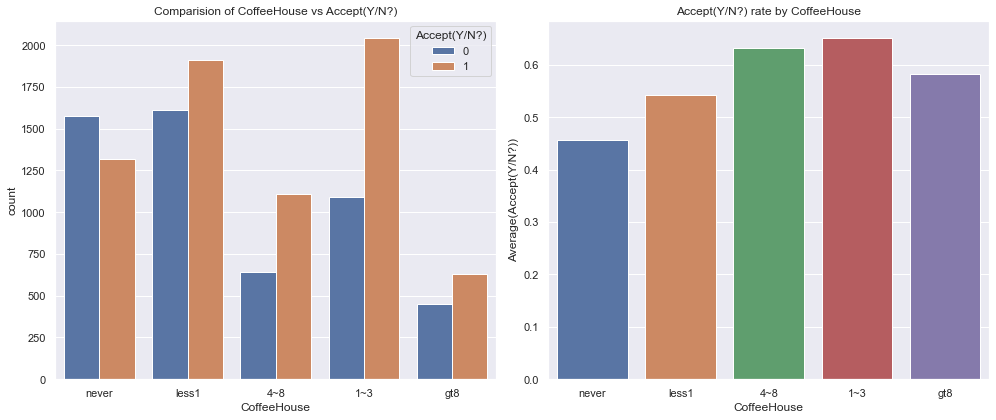

In [188]:
CategoricalVariables_targetPlots(data1,"CoffeeHouse")

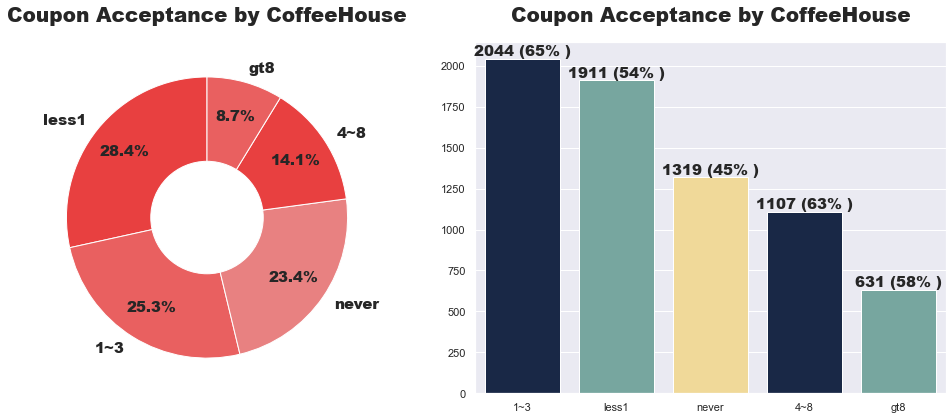

In [189]:
#Visualization to show Coupon Acceptance by temperature.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = data1["CoffeeHouse"].value_counts()
plt.title("Coupon Acceptance by CoffeeHouse", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Acceptance Rate by Businees Travel.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["CoffeeHouse"].value_counts()
# acceptance_rate = np.floor((value_2/value_1)*100).values
acceptance_rate =[65, 54, 45, 63, 58]
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by CoffeeHouse",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


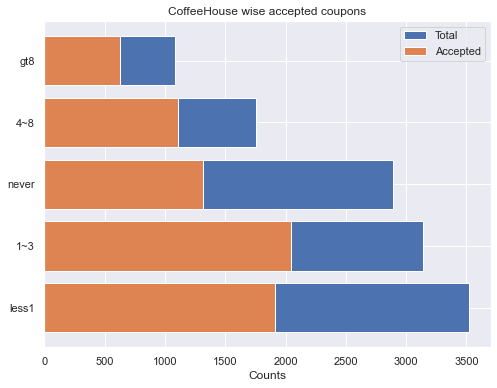

,CoffeeHouse,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
3,less1,3525,14.137013,1911,1614,54.213,45.787
0,1~3,3138,28.443476,2044,1094,65.137,34.863
4,never,2895,8.738804,1319,1576,45.561,54.439
1,4~8,1752,25.320746,1107,645,63.185,36.815
2,gt8,1083,23.359961,631,452,58.264,41.736


In [190]:
Univariate_Analysis1("CoffeeHouse")

,Accept(Y/N?),CoffeeHouse,count,count_norm
0,0,1~3,1094,0.348630
1,0,4~8,645,0.368151
2,0,gt8,452,0.417359
3,0,less1,1614,0.457872
4,0,never,1576,0.544387
5,1,1~3,2044,0.651370
6,1,4~8,1107,0.631849
7,1,gt8,631,0.582641
8,1,less1,1911,0.542128
9,1,never,1319,0.455613


<AxesSubplot:xlabel='CoffeeHouse'>

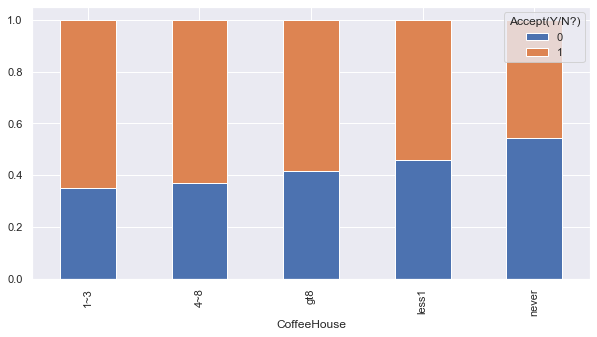

In [191]:
tmp = data1[["Accept(Y/N?)", "CoffeeHouse"]]
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "CoffeeHouse"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "CoffeeHouse==\""+row["CoffeeHouse"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="CoffeeHouse", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [192]:
# Hypothesis testing on "CoffeeHouse" column
stat, p_val, dof = chi_sqred_ind_test(data, "CoffeeHouse", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
CoffeeHouse             
1~3           1116  2109
4~8            654  1130
gt8            463   648
less1         1534  1851
never         1600  1362
Statistic: 276.8217324070846
P-value: 1.0794963990512695e-58
DOF: 4
probability=0.950, critical=9.488, stat=276.822
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [193]:
# Hypothesis testing on "CoffeeHouse" column
stat, p_val, dof = chi_sqred_ind_test(data, "CoffeeHouse", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
CoffeeHouse             
1~3           1116  2109
4~8            654  1130
gt8            463   648
less1         1534  1851
never         1600  1362
Statistic: 276.8217324070846
P-value: 1.0794963990512695e-58
DOF: 4
probability=0.950, critical=9.488, stat=276.822
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [194]:
t = pd.crosstab(data1.CoffeeHouse, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=277.0039306016661, pvalue=9.86145649406117e-59, dof=4, expected_freq=array([[1362.50931978, 1775.49068022],
       [ 760.71266037,  991.28733963],
       [ 470.23505205,  612.76494795],
       [1530.54345195, 1994.45654805],
       [1256.99951586, 1638.00048414]]))

## Visualizing CarryAway

In [195]:
data1["CarryAway"].value_counts()

1~3      4719
4~8      4171
less1    1819
gt8      1535
never     149
Name: CarryAway, dtype: int64

1~3      4719
4~8      4171
less1    1819
gt8      1535
never     149
Name: CarryAway, dtype: int64
AxesSubplot(0.547727,0.208939;0.352273x0.587121)


Text(0.5, 1.0, 'CarryAway ratio Proposanate')

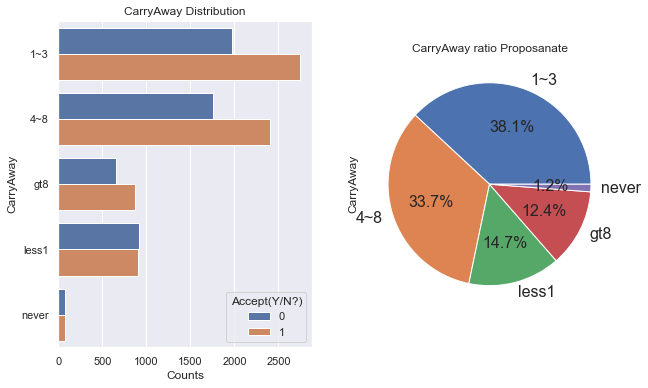

In [196]:
#  Distribution of "destination"
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="CarryAway", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('CarryAway')
plt.title('CarryAway Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['CarryAway'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('CarryAway ratio Proposanate')

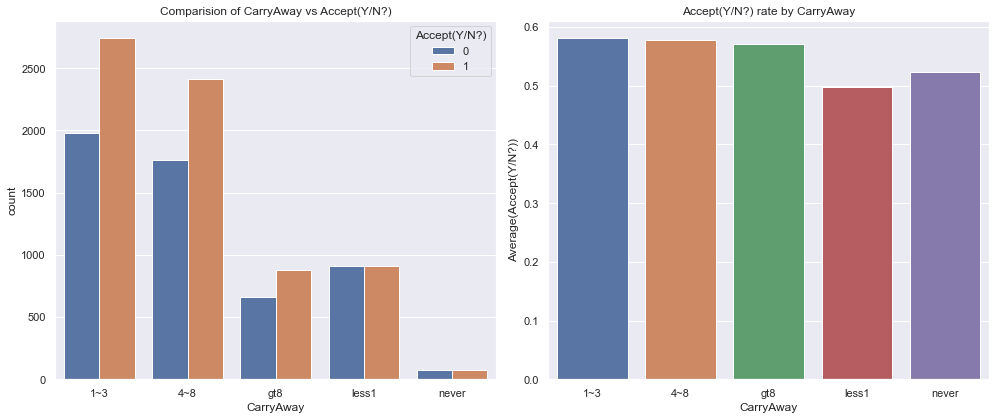

In [197]:
CategoricalVariables_targetPlots(data1,"CarryAway")

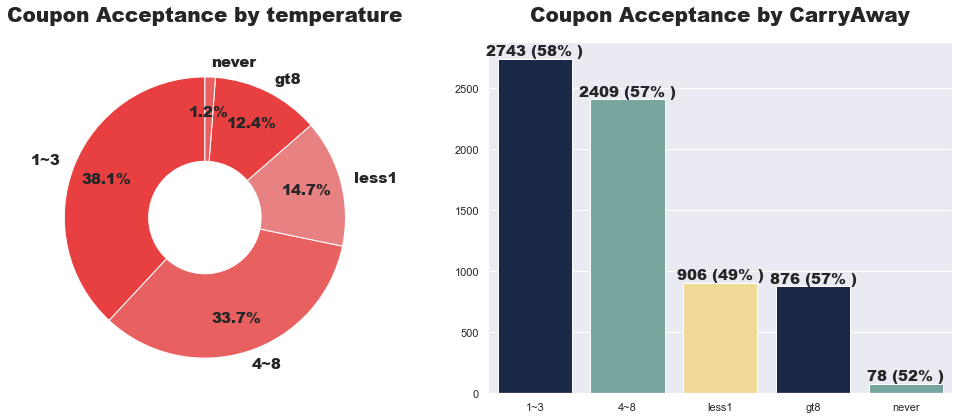

In [198]:
#Visualization to show Coupon Acceptance by CarryAway.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = data1["CarryAway"].value_counts()
plt.title("Coupon Acceptance by temperature", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Coupon Acceptance Rate by CarryAway.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["CarryAway"].value_counts()
acceptance_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by CarryAway",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


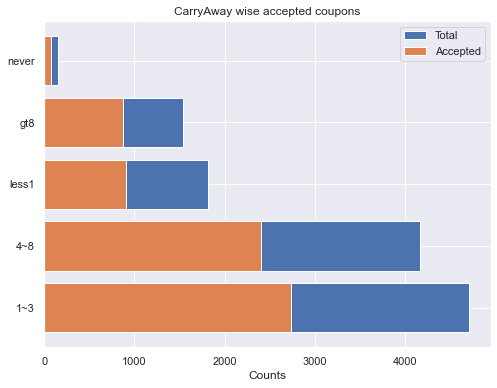

,CarryAway,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
0,1~3,4719,38.077947,2743,1976,58.127,41.873
1,4~8,4171,33.656096,2409,1762,57.756,42.244
3,less1,1819,12.386024,906,913,49.808,50.192
2,gt8,1535,14.677641,876,659,57.068,42.932
4,never,149,1.202292,78,71,52.349,47.651


In [199]:
Univariate_Analysis1("CarryAway")

,Accept(Y/N?),CarryAway,count,count_norm
0,0,1~3,1976,0.418733
1,0,4~8,1762,0.422441
2,0,gt8,659,0.429316
3,0,less1,913,0.501924
4,0,never,71,0.476510
5,1,1~3,2743,0.581267
6,1,4~8,2409,0.577559
7,1,gt8,876,0.570684
8,1,less1,906,0.498076
9,1,never,78,0.523490


<AxesSubplot:xlabel='CarryAway'>

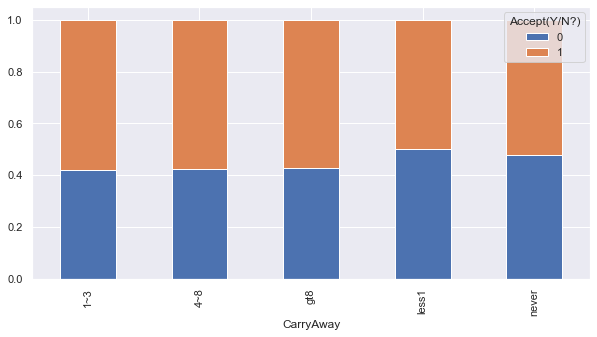

In [200]:
tmp = data1[["Accept(Y/N?)", "CarryAway"]]
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "CarryAway"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "CarryAway==\""+row["CarryAway"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="CarryAway", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [201]:
# Hypothesis testing on "CarryAway" column
stat, p_val, dof = chi_sqred_ind_test(data, "CarryAway", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
CarryAway               
1~3           1960  2712
4~8           1784  2474
gt8            680   914
less1          929   927
never           71    82
Statistic: 42.22171902556001
P-value: 1.5006376228356664e-08
DOF: 4
probability=0.950, critical=9.488, stat=42.222
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [202]:
# Hypothesis testing on "CarryAway" column
stat, p_val, dof = chi_sqred_ind_test(data, "CarryAway", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
CarryAway               
1~3           1960  2712
4~8           1784  2474
gt8            680   914
less1          929   927
never           71    82
Statistic: 42.22171902556001
P-value: 1.5006376228356664e-08
DOF: 4
probability=0.950, critical=9.488, stat=42.222
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [203]:
t = pd.crosstab(data1.CarryAway, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=42.137919802539166, pvalue=1.5618842337841763e-08, dof=4, expected_freq=array([[2048.97434035, 2670.02565965],
       [1811.03453562, 2359.96546438],
       [ 666.49197127,  868.50802873],
       [ 789.80384088, 1029.19615912],
       [  64.69531187,   84.30468813]]))

## Visualizing RestaurantLessThan20

In [204]:
data1["RestaurantLessThan20"].value_counts()

1~3      5397
4~8      3493
less1    2034
gt8      1253
never     216
Name: RestaurantLessThan20, dtype: int64

1~3      5397
4~8      3493
less1    2034
gt8      1253
never     216
Name: RestaurantLessThan20, dtype: int64
AxesSubplot(0.547727,0.208939;0.352273x0.587121)


Text(0.5, 1.0, 'RestaurantLessThan20 ratio Proposanate')

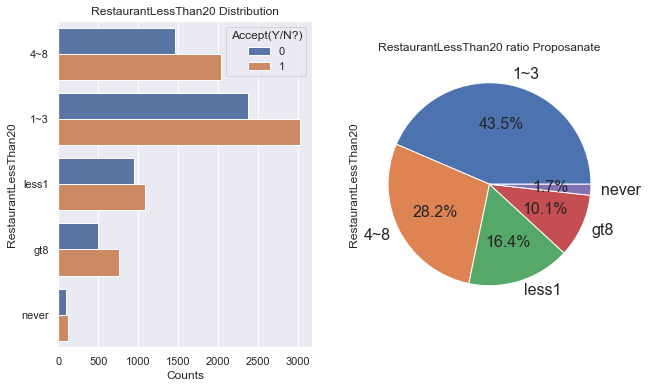

In [205]:
#  Distribution of "RestaurantLessThan20"
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="RestaurantLessThan20", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('RestaurantLessThan20')
plt.title('RestaurantLessThan20 Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['RestaurantLessThan20'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('RestaurantLessThan20 ratio Proposanate')

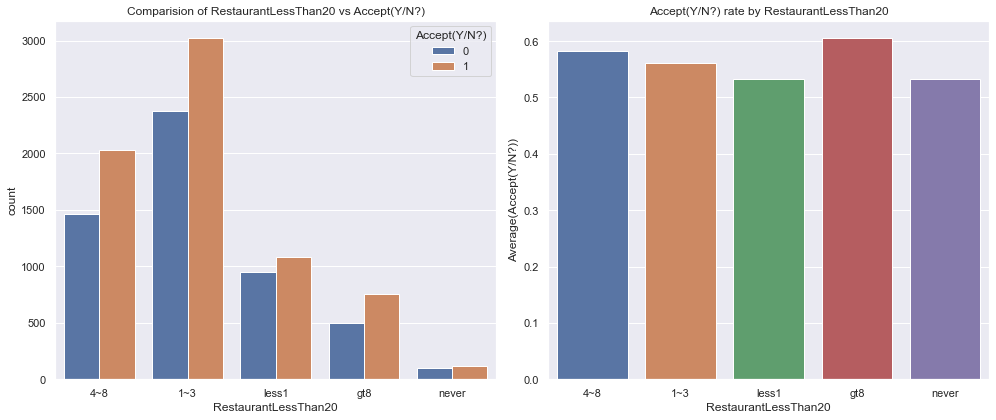

In [206]:
CategoricalVariables_targetPlots(data1,"RestaurantLessThan20")

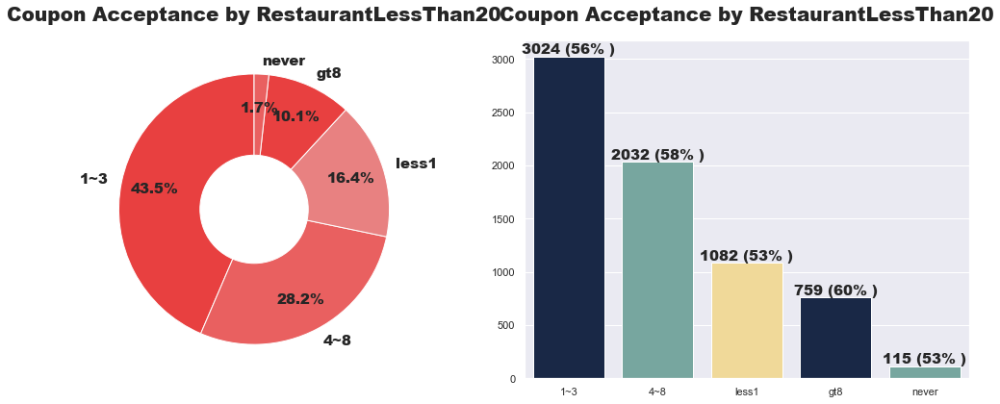

In [207]:
#Visualization to show Coupon Acceptance by RestaurantLessThan20.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = data1["RestaurantLessThan20"].value_counts()
plt.title("Coupon Acceptance by RestaurantLessThan20", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Coupon Acceptance Rate by RestaurantLessThan20.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["RestaurantLessThan20"].value_counts()
acceptance_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by RestaurantLessThan20",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


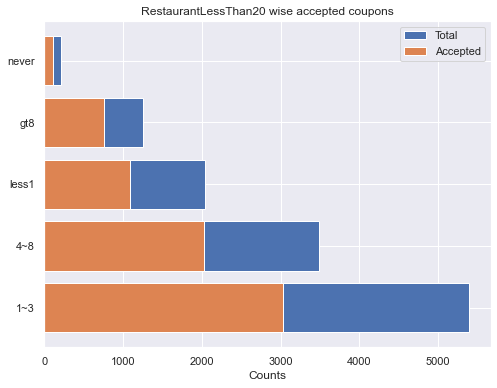

,RestaurantLessThan20,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
0,1~3,5397,43.548778,3024,2373,56.031,43.969
1,4~8,3493,28.185266,2032,1461,58.173,41.827
3,less1,2034,10.110546,1082,952,53.196,46.804
2,gt8,1253,16.412491,759,494,60.575,39.425
4,never,216,1.742919,115,101,53.241,46.759


In [208]:
Univariate_Analysis1("RestaurantLessThan20")

,Accept(Y/N?),RestaurantLessThan20,count,count_norm
0,0,1~3,2373,0.439689
1,0,4~8,1461,0.418265
2,0,gt8,494,0.394254
3,0,less1,952,0.468043
4,0,never,101,0.467593
5,1,1~3,3024,0.560311
6,1,4~8,2032,0.581735
7,1,gt8,759,0.605746
8,1,less1,1082,0.531957
9,1,never,115,0.532407


<AxesSubplot:xlabel='RestaurantLessThan20'>

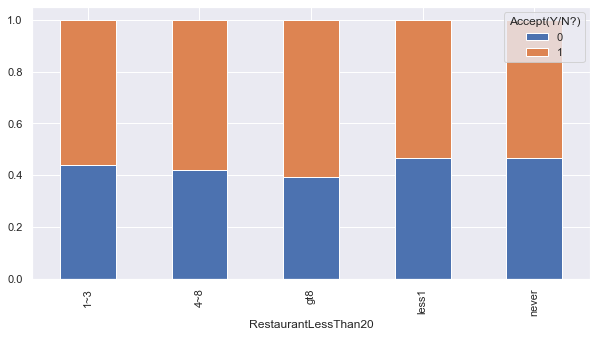

In [209]:
tmp = data1[["Accept(Y/N?)", "RestaurantLessThan20"]]
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "RestaurantLessThan20"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "RestaurantLessThan20==\""+row["RestaurantLessThan20"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="RestaurantLessThan20", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [210]:
# Hypothesis testing on "RestaurantLessThan20" column
stat, p_val, dof = chi_sqred_ind_test(data, "RestaurantLessThan20", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)             0     1
RestaurantLessThan20            
1~3                   2366  3010
4~8                   1487  2093
gt8                    504   781
less1                  974  1119
never                  102   118
Statistic: 24.114990103498023
P-value: 7.57454069770614e-05
DOF: 4
probability=0.950, critical=9.488, stat=24.115
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [211]:
# Hypothesis testing on "RestaurantLessThan20" column
stat, p_val, dof = chi_sqred_ind_test(data1, "RestaurantLessThan20", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)             0     1
RestaurantLessThan20            
1~3                   2373  3024
4~8                   1461  2032
gt8                    494   759
less1                  952  1082
never                  101   115
Statistic: 22.874094599072116
P-value: 0.00013417473757547274
DOF: 4
probability=0.950, critical=9.488, stat=22.874
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [212]:
t = pd.crosstab(data1.RestaurantLessThan20, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=22.874094599072116, pvalue=0.00013417473757547274, dof=4, expected_freq=array([[2343.3597192 , 3053.6402808 ],
       [1516.64915678, 1976.35084322],
       [ 544.04849512,  708.95150488],
       [ 883.15613653, 1150.84386347],
       [  93.78649237,  122.21350763]]))

## Visualizing Restaurant20To50

In [213]:
data1["Restaurant20To50"].value_counts()

less1    6134
1~3      3204
never    2083
4~8       718
gt8       254
Name: Restaurant20To50, dtype: int64

less1    6134
1~3      3204
never    2083
4~8       718
gt8       254
Name: Restaurant20To50, dtype: int64
AxesSubplot(0.562078,0.125;0.323571x0.755)


Text(0.5, 1.0, 'Restaurant20To50 ratio Proposanate')

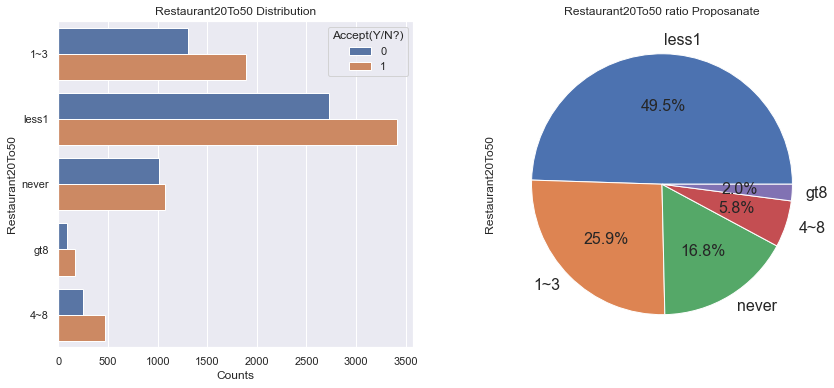

In [214]:
#  Distribution of "Restaurant20To50"
fig, ax = plt.subplots(1,2,figsize=(14,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="Restaurant20To50", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('Restaurant20To50')
plt.title('Restaurant20To50 Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['Restaurant20To50'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('Restaurant20To50 ratio Proposanate')

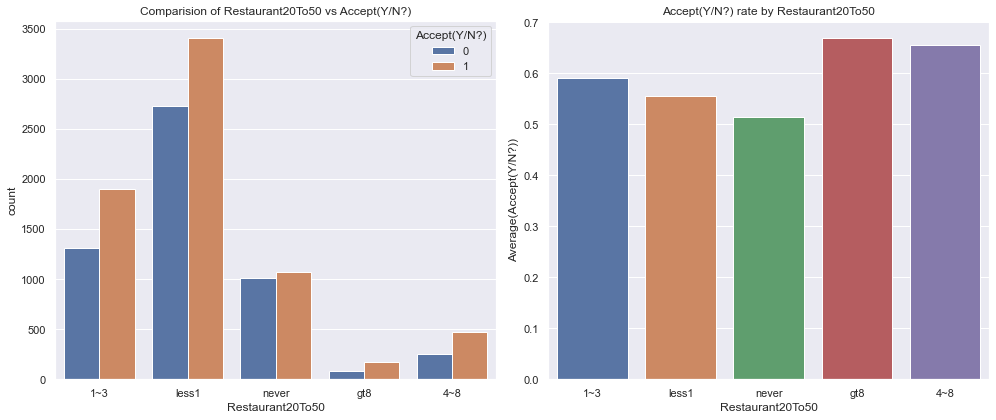

In [215]:
CategoricalVariables_targetPlots(data1,"Restaurant20To50")

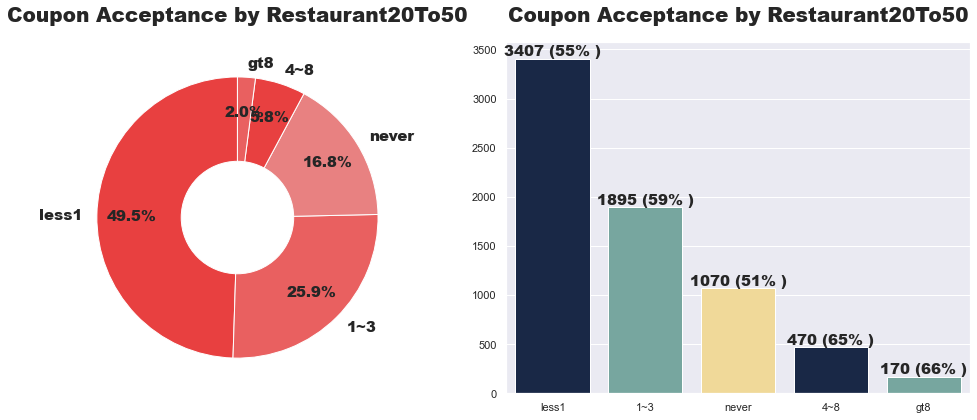

In [216]:
#Visualization to show Coupon Acceptance by Restaurant20To50.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = data1["Restaurant20To50"].value_counts()
plt.title("Coupon Acceptance by Restaurant20To50", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Attrition Rate by Businees Travel.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["Restaurant20To50"].value_counts()
acceptance_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by Restaurant20To50",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


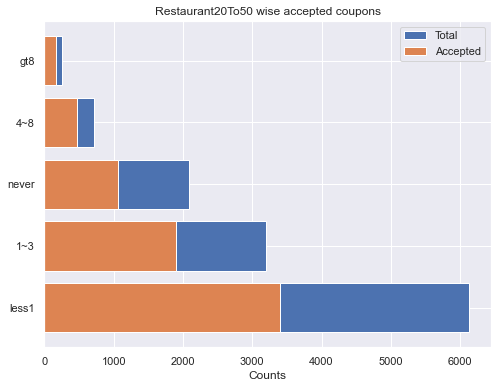

,Restaurant20To50,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
3,less1,6134,5.793593,3407,2727,55.543,44.457
0,1~3,3204,49.495683,1895,1309,59.145,40.855
4,never,2083,2.049544,1070,1013,51.368,48.632
1,4~8,718,25.853304,470,248,65.460,34.540
2,gt8,254,16.807875,170,84,66.929,33.071


In [217]:
Univariate_Analysis1("Restaurant20To50")

,Accept(Y/N?),Restaurant20To50,count,count_norm
0,0,1~3,1309,0.408552
1,0,4~8,248,0.345404
2,0,gt8,84,0.330709
3,0,less1,2727,0.444571
4,0,never,1013,0.486318
5,1,1~3,1895,0.591448
6,1,4~8,470,0.654596
7,1,gt8,170,0.669291
8,1,less1,3407,0.555429
9,1,never,1070,0.513682


<AxesSubplot:xlabel='Restaurant20To50'>

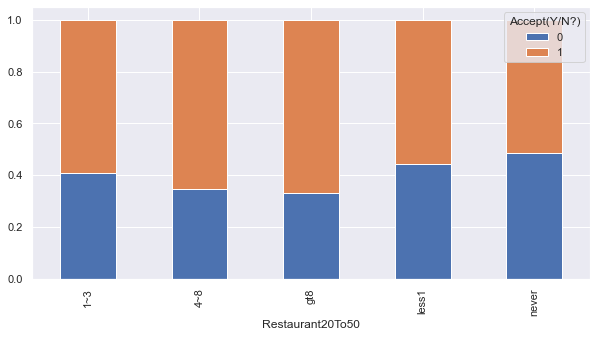

In [218]:
tmp = data1[["Accept(Y/N?)", "Restaurant20To50"]]
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "Restaurant20To50"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "Restaurant20To50==\""+row["Restaurant20To50"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="Restaurant20To50", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [219]:
# Hypothesis testing on "Restaurant20To50" column
stat, p_val, dof = chi_sqred_ind_test(data, "Restaurant20To50", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)         0     1
Restaurant20To50            
1~3               1332  1958
4~8                251   477
gt8                 89   175
less1             2687  3390
never             1031  1105
Statistic: 67.04480506790992
P-value: 9.539081767804663e-14
DOF: 4
probability=0.950, critical=9.488, stat=67.045
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [220]:
# Hypothesis testing on "Restaurant20To50" column
stat, p_val, dof = chi_sqred_ind_test(data1, "Restaurant20To50", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)         0     1
Restaurant20To50            
1~3               1309  1895
4~8                248   470
gt8                 84   170
less1             2727  3407
never             1013  1070
Statistic: 68.41359371482015
P-value: 4.90685693311738e-14
DOF: 4
probability=0.950, critical=9.488, stat=68.414
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [221]:
t = pd.crosstab(data1.Restaurant20To50, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=68.41359371482015, pvalue=4.90685693311738e-14, dof=4, expected_freq=array([[1391.16630356, 1812.83369644],
       [ 311.7532478 ,  406.2467522 ],
       [ 110.28596789,  143.71403211],
       [2663.36270475, 3470.63729525],
       [ 904.431776  , 1178.568224  ]]))

## Visualizing toCoupon_GEQ5min

In [222]:
data1["toCoupon_GEQ5min"].value_counts()

1    12393
Name: toCoupon_GEQ5min, dtype: int64

1    12393
Name: toCoupon_GEQ5min, dtype: int64
AxesSubplot(0.547727,0.208939;0.352273x0.587121)


Text(0.5, 1.0, 'toCoupon_GEQ5min ratio Proposanate')

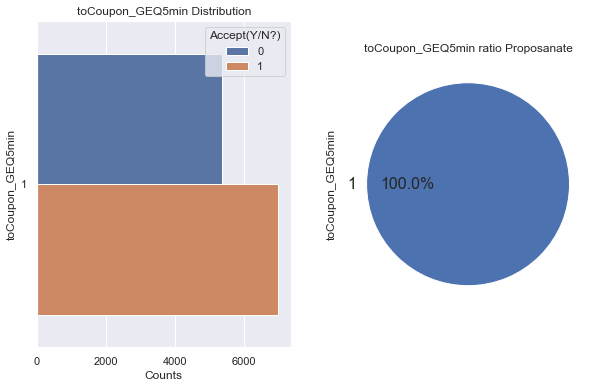

In [223]:
#  Distribution of "destination"
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="toCoupon_GEQ5min", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('toCoupon_GEQ5min')
plt.title('toCoupon_GEQ5min Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['toCoupon_GEQ5min'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('toCoupon_GEQ5min ratio Proposanate')

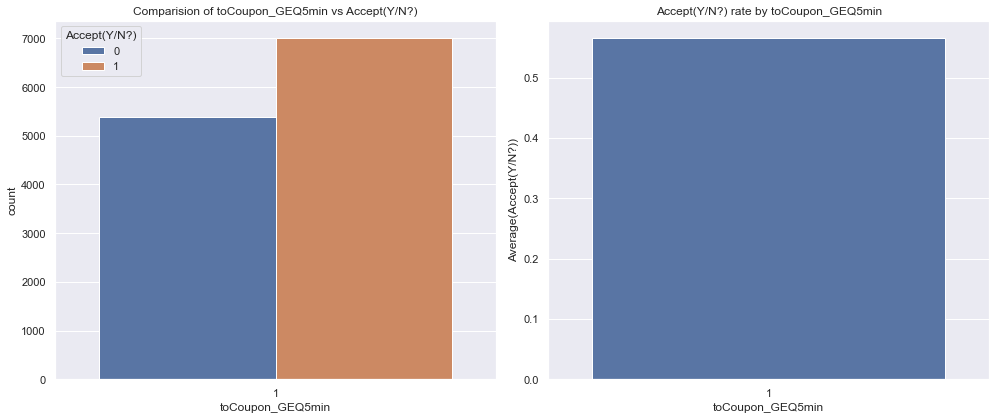

In [224]:
CategoricalVariables_targetPlots(data1,"toCoupon_GEQ5min")

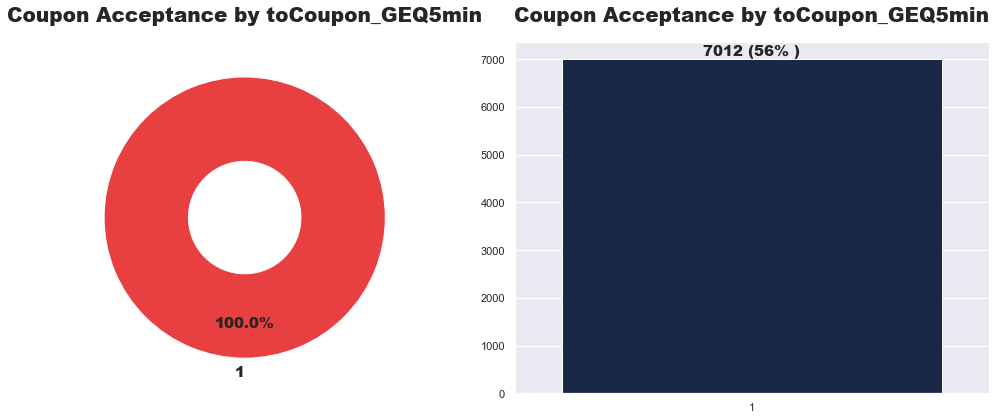

In [225]:
#Visualization to show Coupon Acceptance by toCoupon_GEQ5min.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = data1["toCoupon_GEQ5min"].value_counts()
plt.title("Coupon Acceptance by toCoupon_GEQ5min", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Coupon Acceptance Rate by toCoupon_GEQ5min.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["toCoupon_GEQ5min"].value_counts()
acceptance_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by toCoupon_GEQ5min",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


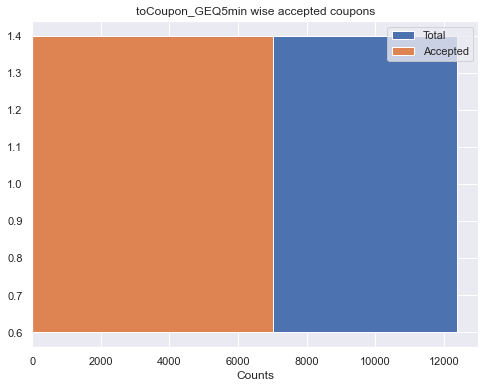

,toCoupon_GEQ5min,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
0,1,12393,100.0,7012,5381,56.58,43.42


In [226]:
Univariate_Analysis1("toCoupon_GEQ5min")

,Accept(Y/N?),toCoupon_GEQ5min,count,count_norm
0,0,1,5381,0.434197
1,1,1,7012,0.565803


<AxesSubplot:xlabel='toCoupon_GEQ5min'>

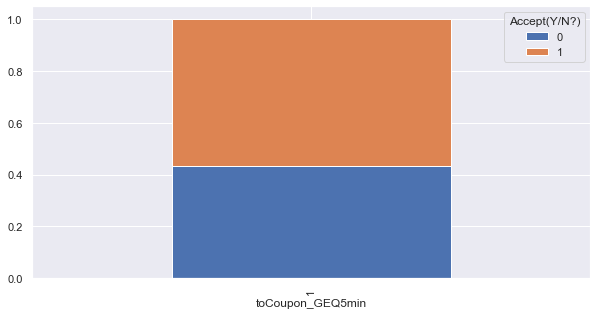

In [227]:
tmp = data1[["Accept(Y/N?)", "toCoupon_GEQ5min"]].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "toCoupon_GEQ5min"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "toCoupon_GEQ5min==\""+row["toCoupon_GEQ5min"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="toCoupon_GEQ5min", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [228]:
# Hypothesis testing on "toCoupon_GEQ5min" column
stat, p_val, dof = chi_sqred_ind_test(data, "toCoupon_GEQ5min", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)         0     1
toCoupon_GEQ5min            
1                 5474  7210
Statistic: 0.0
P-value: 1.0
DOF: 0
probability=0.950, critical=nan, stat=0.000
Independent (fail to reject Null Hypothesis(H0))
Independent (fail to reject Null Hypothesis(H0))


In [229]:
# Hypothesis testing on "toCoupon_GEQ5min" column
stat, p_val, dof = chi_sqred_ind_test(data1, "toCoupon_GEQ5min", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)         0     1
toCoupon_GEQ5min            
1                 5381  7012
Statistic: 0.0
P-value: 1.0
DOF: 0
probability=0.950, critical=nan, stat=0.000
Independent (fail to reject Null Hypothesis(H0))
Independent (fail to reject Null Hypothesis(H0))


In [230]:
t = pd.crosstab(data1.toCoupon_GEQ5min, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=0.0, pvalue=1.0, dof=0, expected_freq=array([[5381., 7012.]]))

## Visualizing toCoupon_GEQ15min

In [231]:
data1["toCoupon_GEQ15min"].value_counts()

1    6985
0    5408
Name: toCoupon_GEQ15min, dtype: int64

1    6985
0    5408
Name: toCoupon_GEQ15min, dtype: int64
AxesSubplot(0.547727,0.208939;0.352273x0.587121)


Text(0.5, 1.0, 'toCoupon_GEQ15min ratio Proposanate')

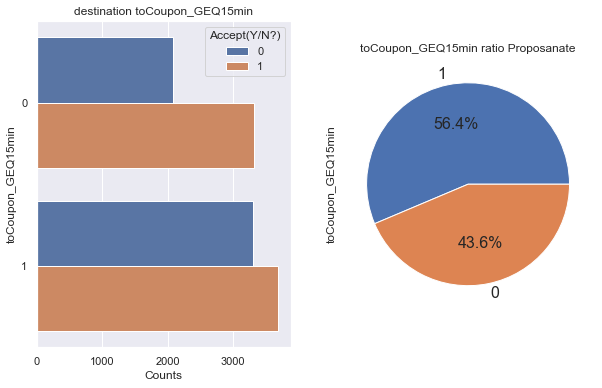

In [232]:
#  Distribution of "toCoupon_GEQ15min"
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="toCoupon_GEQ15min", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('toCoupon_GEQ15min')
plt.title('destination toCoupon_GEQ15min')
ax2=plt.subplot(1,2,2)
val_counts = data1['toCoupon_GEQ15min'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('toCoupon_GEQ15min ratio Proposanate')

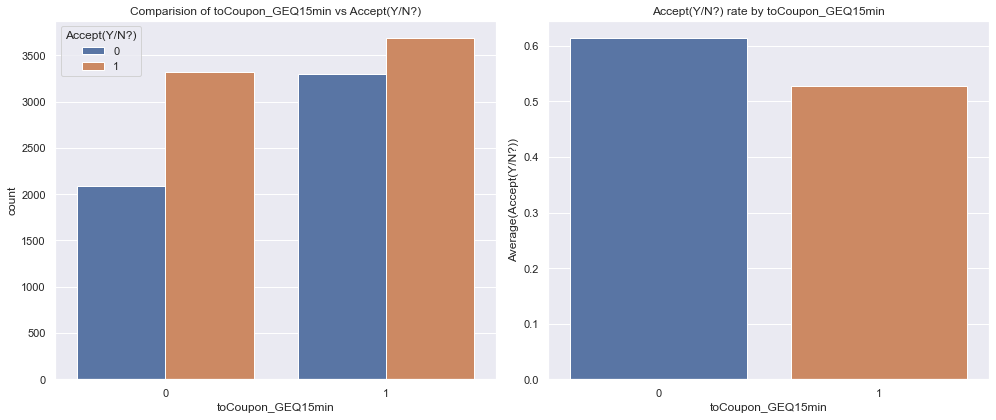

In [233]:
CategoricalVariables_targetPlots(data1,"toCoupon_GEQ15min")

In [234]:
value_2

1    7012
Name: toCoupon_GEQ5min, dtype: int64

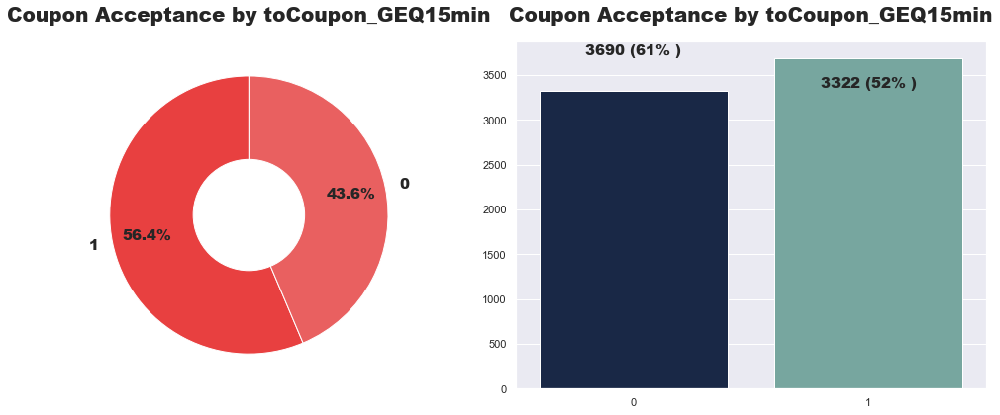

In [235]:
#Visualization to show Coupon Acceptance by toCoupon_GEQ15min.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = data1["toCoupon_GEQ15min"].value_counts()
plt.title("Coupon Acceptance by toCoupon_GEQ15min", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Coupon Acceptance Rate by toCoupon_GEQ15min.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["toCoupon_GEQ15min"].value_counts()
# acceptance_rate = np.floor((value_2/value_1)*100).values
acceptance_rate = [61, 52]
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by toCoupon_GEQ15min",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


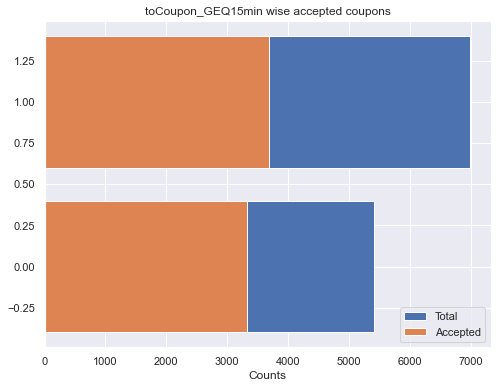

,toCoupon_GEQ15min,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
1,1,6985,43.637537,3690,3295,52.827,47.173
0,0,5408,56.362463,3322,2086,61.428,38.572


In [236]:
Univariate_Analysis1("toCoupon_GEQ15min")

,Accept(Y/N?),toCoupon_GEQ15min,count,count_norm
0,0,0,2086,0.385725
1,0,1,3295,0.471725
2,1,0,3322,0.614275
3,1,1,3690,0.528275


<AxesSubplot:xlabel='toCoupon_GEQ15min'>

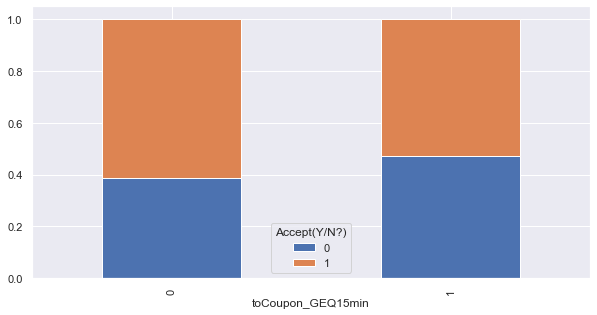

In [237]:
tmp = data1[["Accept(Y/N?)", "toCoupon_GEQ15min"]].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "toCoupon_GEQ15min"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "toCoupon_GEQ15min==\""+row["toCoupon_GEQ15min"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="toCoupon_GEQ15min", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [238]:
# Hypothesis testing on "toCoupon_GEQ15min" column
stat, p_val, dof = chi_sqred_ind_test(data, "toCoupon_GEQ15min", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)          0     1
toCoupon_GEQ15min            
0                  2146  3416
1                  3328  3794
Statistic: 84.12867672199123
P-value: 4.635972294767263e-20
DOF: 1
probability=0.950, critical=3.841, stat=84.129
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [239]:
# Hypothesis testing on "toCoupon_GEQ15min" column
stat, p_val, dof = chi_sqred_ind_test(data1, "toCoupon_GEQ15min", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)          0     1
toCoupon_GEQ15min            
0                  2086  3322
1                  3295  3690
Statistic: 91.41468561584936
P-value: 1.1650857961443425e-21
DOF: 1
probability=0.950, critical=3.841, stat=91.415
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [240]:
t = pd.crosstab(data1.toCoupon_GEQ15min, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=91.41468561584936, pvalue=1.1650857961443425e-21, dof=1, expected_freq=array([[2348.13588316, 3059.86411684],
       [3032.86411684, 3952.13588316]]))

## Visualizing toCoupon_GEQ25min

In [241]:
data1["toCoupon_GEQ25min"].value_counts()

0    10930
1     1463
Name: toCoupon_GEQ25min, dtype: int64

0    10930
1     1463
Name: toCoupon_GEQ25min, dtype: int64
AxesSubplot(0.547727,0.208939;0.352273x0.587121)


Text(0.5, 1.0, 'toCoupon_GEQ25min ratio Proposanate')

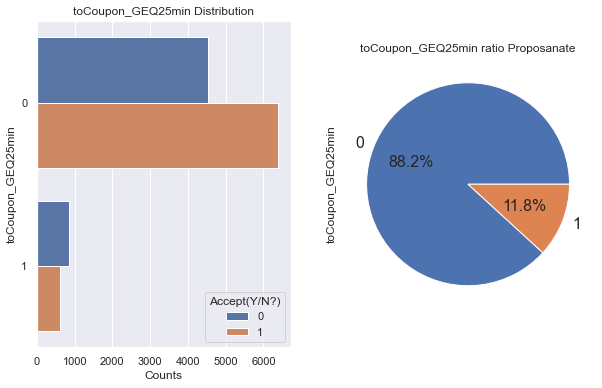

In [242]:
#  Distribution of "toCoupon_GEQ25min"
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="toCoupon_GEQ25min", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('toCoupon_GEQ25min')
plt.title('toCoupon_GEQ25min Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['toCoupon_GEQ25min'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('toCoupon_GEQ25min ratio Proposanate')

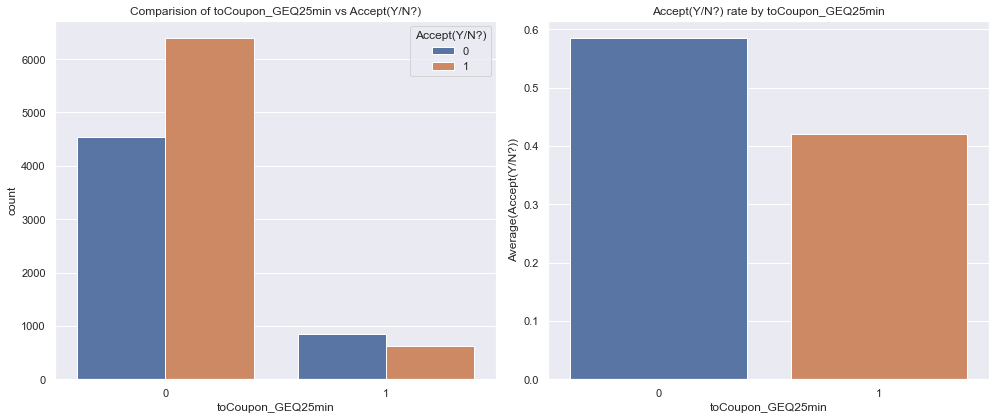

In [243]:
CategoricalVariables_targetPlots(data1,"toCoupon_GEQ25min")

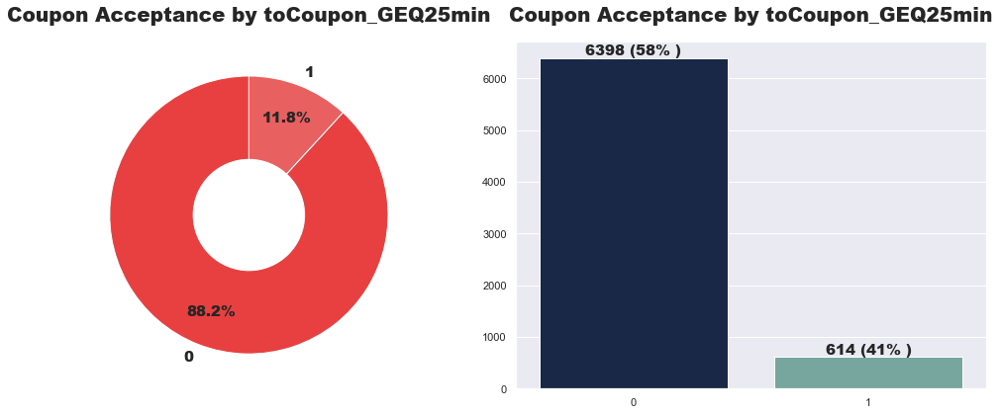

In [244]:
#Visualization to show Coupon Acceptance by toCoupon_GEQ25min.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = data1["toCoupon_GEQ25min"].value_counts()
plt.title("Coupon Acceptance by toCoupon_GEQ25min", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Coupon Acceptance Rate by toCoupon_GEQ25min.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["toCoupon_GEQ25min"].value_counts()
acceptance_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by toCoupon_GEQ25min",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


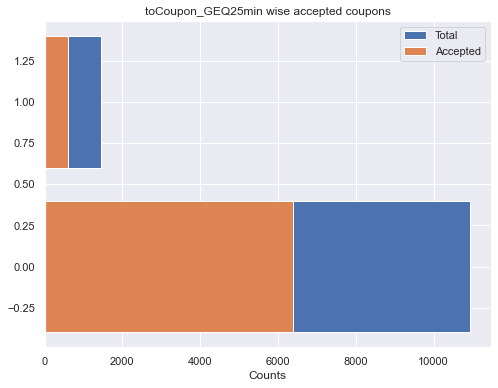

,toCoupon_GEQ25min,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
0,0,10930,88.194949,6398,4532,58.536,41.464
1,1,1463,11.805051,614,849,41.969,58.031


In [245]:
Univariate_Analysis1("toCoupon_GEQ25min")

,Accept(Y/N?),toCoupon_GEQ25min,count,count_norm
0,0,0,4532,0.414639
1,0,1,849,0.580314
2,1,0,6398,0.585361
3,1,1,614,0.419686


<AxesSubplot:xlabel='toCoupon_GEQ25min'>

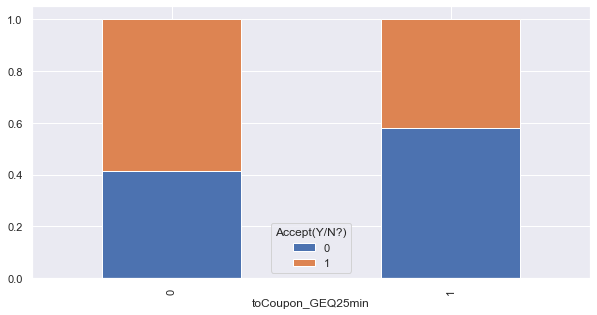

In [246]:
tmp = data1[["Accept(Y/N?)", "toCoupon_GEQ25min"]].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "toCoupon_GEQ25min"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "toCoupon_GEQ25min==\""+row["toCoupon_GEQ25min"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="toCoupon_GEQ25min", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [247]:
# Hypothesis testing on "coupon" column
stat, p_val, dof = chi_sqred_ind_test(data, "toCoupon_GEQ25min", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)          0     1
toCoupon_GEQ25min            
0                  4611  6562
1                   863   648
Statistic: 135.5792229990854
P-value: 2.4662838393790205e-31
DOF: 1
probability=0.950, critical=3.841, stat=135.579
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [248]:
# Hypothesis testing on "coupon" column
stat, p_val, dof = chi_sqred_ind_test(data1, "toCoupon_GEQ25min", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)          0     1
toCoupon_GEQ25min            
0                  4532  6398
1                   849   614
Statistic: 143.48955372446972
P-value: 4.594027227642426e-33
DOF: 1
probability=0.950, critical=3.841, stat=143.490
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [249]:
t = pd.crosstab(data1.expiration, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=203.72911524936688, pvalue=3.2069490154075797e-46, dof=1, expected_freq=array([[3012.45687081, 3925.54312919],
       [2368.54312919, 3086.45687081]]))

## Visualizing direction_same

In [250]:
data1["direction_same"].value_counts()

0    9744
1    2649
Name: direction_same, dtype: int64

0    9744
1    2649
Name: direction_same, dtype: int64
AxesSubplot(0.547727,0.208939;0.352273x0.587121)


Text(0.5, 1.0, 'direction_same ratio Proposanate')

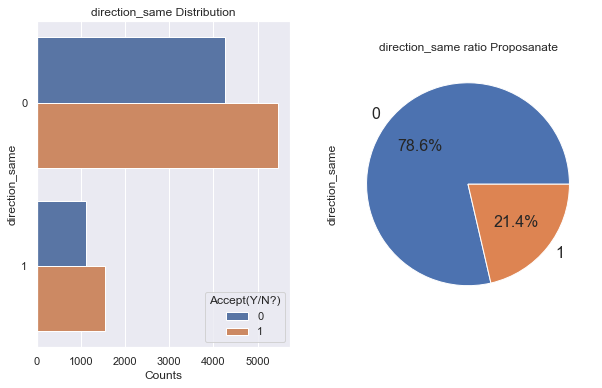

In [251]:
#  Distribution of "destination"
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="direction_same", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('direction_same')
plt.title('direction_same Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['direction_same'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('direction_same ratio Proposanate')

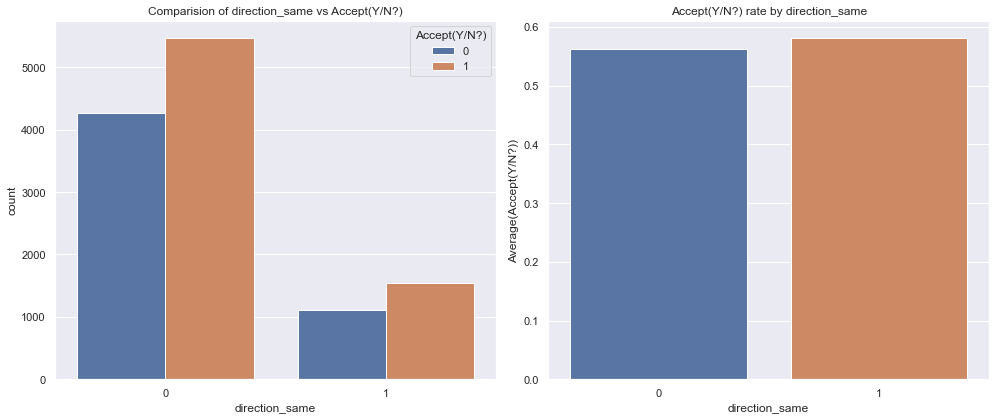

In [252]:
CategoricalVariables_targetPlots(data1,"direction_same")

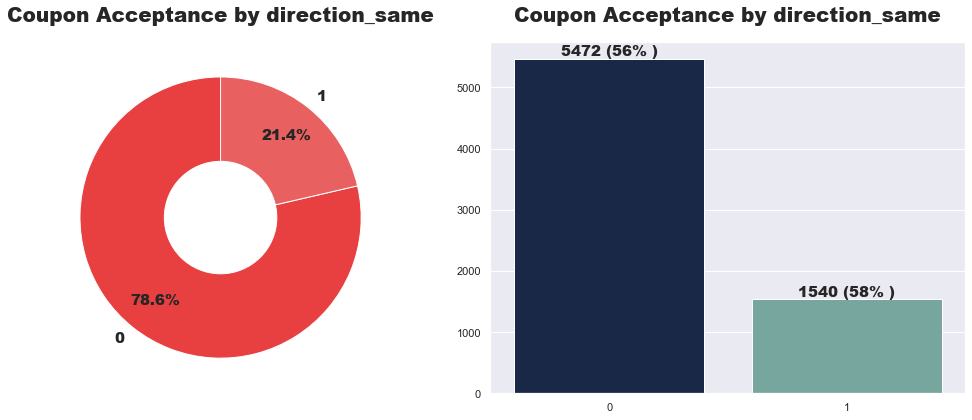

In [253]:
#Visualization to show Coupon Acceptance by direction_same.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = data1["direction_same"].value_counts()
plt.title("Coupon Acceptance by direction_same", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Coupon Acceptance Rate by direction_same.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["direction_same"].value_counts()
acceptance_rate = np.floor((value_2/value_1)*100).values
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by direction_same",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


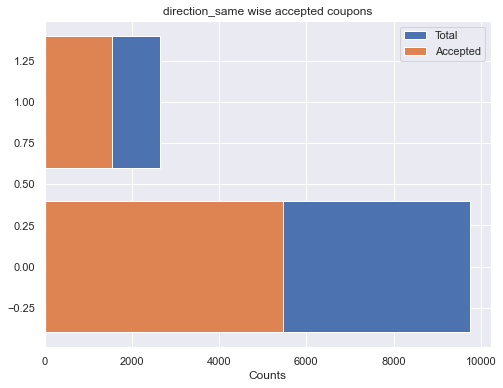

,direction_same,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
0,0,9744,78.62503,5472,4272,56.158,43.842
1,1,2649,21.37497,1540,1109,58.135,41.865


In [254]:
Univariate_Analysis1("direction_same")

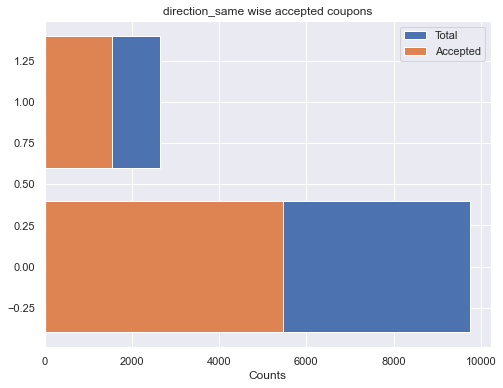

,direction_same,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
0,0,9744,78.62503,5472,4272,56.158,43.842
1,1,2649,21.37497,1540,1109,58.135,41.865


In [255]:
Univariate_Analysis1("direction_same")

,Accept(Y/N?),direction_same,count,count_norm
0,0,0,4272,0.438424
1,0,1,1109,0.418649
2,1,0,5472,0.561576
3,1,1,1540,0.581351


<AxesSubplot:xlabel='direction_same'>

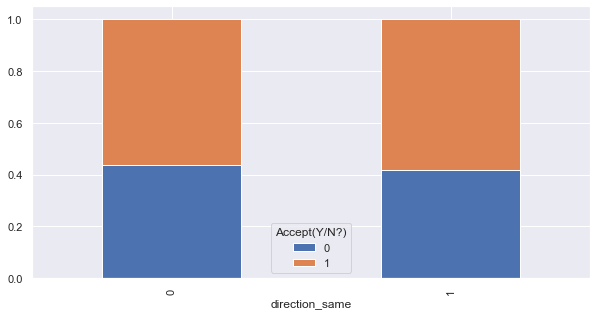

In [256]:
tmp = data1[["Accept(Y/N?)", "direction_same"]].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "direction_same"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "direction_same==\""+row["direction_same"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="direction_same", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [257]:
# Hypothesis testing on "direction_same" column
stat, p_val, dof = chi_sqred_ind_test(data, "direction_same", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)       0     1
direction_same            
0               4336  5624
1               1138  1586
Statistic: 2.6215727200825305
P-value: 0.10541990881286277
DOF: 1
probability=0.950, critical=3.841, stat=2.622
Independent (fail to reject Null Hypothesis(H0))
Independent (fail to reject Null Hypothesis(H0))


In [258]:
# Hypothesis testing on "direction_same" column
stat, p_val, dof = chi_sqred_ind_test(data1, "direction_same", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)       0     1
direction_same            
0               4272  5472
1               1109  1540
Statistic: 3.2353342348542378
P-value: 0.07206559701605864
DOF: 1
probability=0.950, critical=3.841, stat=3.235
Independent (fail to reject Null Hypothesis(H0))
Independent (fail to reject Null Hypothesis(H0))


In [259]:
t = pd.crosstab(data1.direction_same, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=3.2353342348542378, pvalue=0.07206559701605864, dof=1, expected_freq=array([[4230.81287824, 5513.18712176],
       [1150.18712176, 1498.81287824]]))

## Visualizing direction_opp

In [260]:
data1["direction_opp"].value_counts()

1    9744
0    2649
Name: direction_opp, dtype: int64

No Urgent Place    6118
Home               3161
Work               3114
Name: destination, dtype: int64
AxesSubplot(0.547727,0.208939;0.352273x0.587121)


Text(0.5, 1.0, 'direction_opp ratio Proposanate')

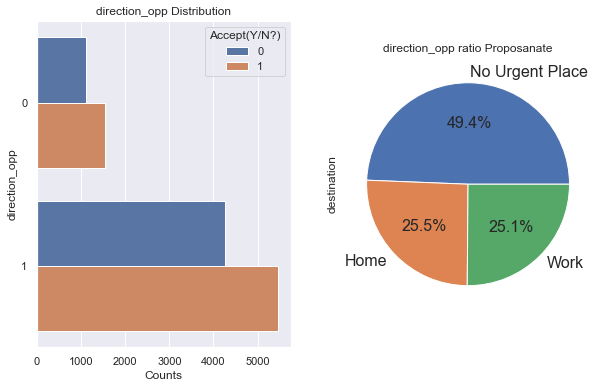

In [261]:
#  Distribution of "direction_opp"
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="direction_opp", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('direction_opp')
plt.title('direction_opp Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['destination'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('direction_opp ratio Proposanate')

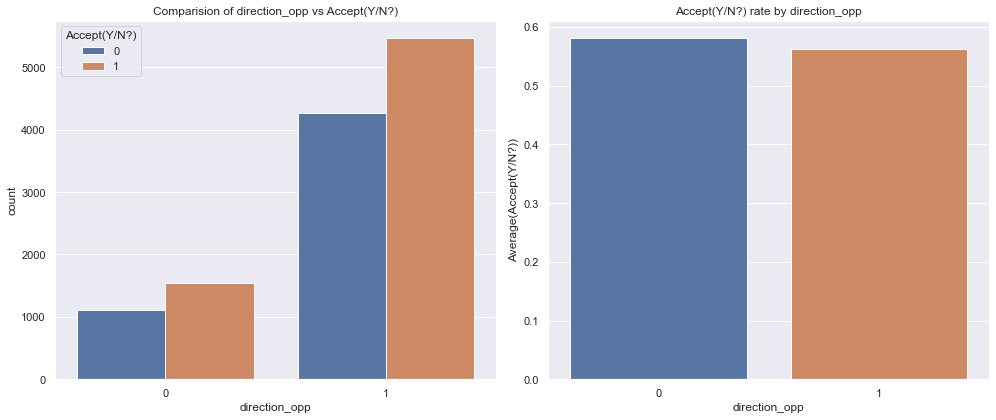

In [262]:
CategoricalVariables_targetPlots(data1,"direction_opp")

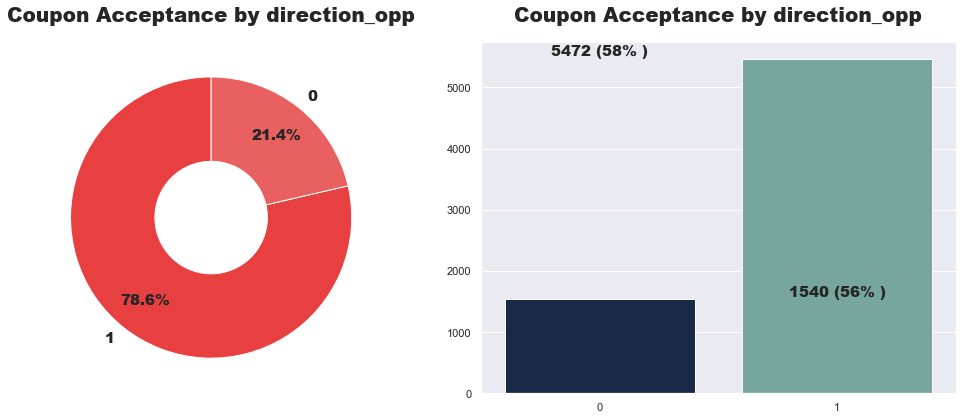

In [263]:
#Visualization to show Coupon Acceptance by direction_opp.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = data1["direction_opp"].value_counts()
plt.title("Coupon Acceptance by direction_opp", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Coupon Acceptance Rate by direction_opp.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["direction_opp"].value_counts()
# acceptance_rate = np.floor((value_2/value_1)*100).values
acceptance_rate = [58, 56]
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by direction_opp",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


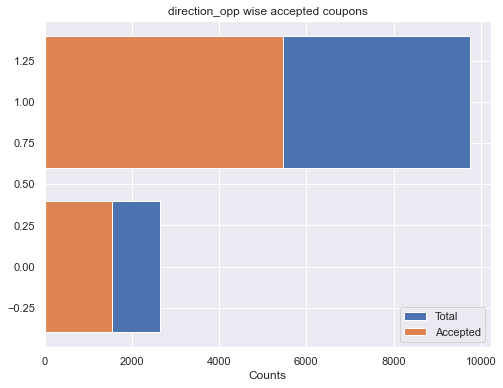

,direction_opp,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
1,1,9744,21.37497,5472,4272,56.158,43.842
0,0,2649,78.62503,1540,1109,58.135,41.865


In [264]:
Univariate_Analysis1("direction_opp")

,Accept(Y/N?),direction_opp,count,count_norm
0,0,0,1109,0.418649
1,0,1,4272,0.438424
2,1,0,1540,0.581351
3,1,1,5472,0.561576


<AxesSubplot:xlabel='direction_opp'>

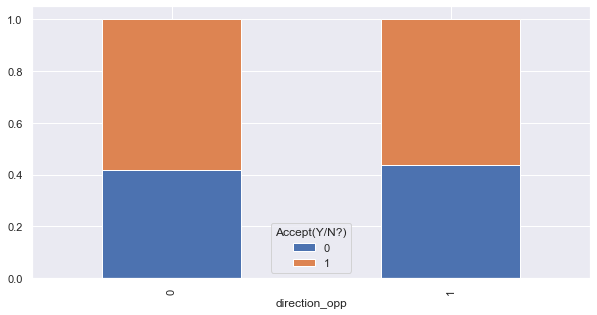

In [265]:
tmp = data1[["Accept(Y/N?)", "direction_opp"]].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "direction_opp"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "direction_opp==\""+row["direction_opp"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="direction_opp", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [266]:
# Hypothesis testing on "direction_opp" column
stat, p_val, dof = chi_sqred_ind_test(data, "direction_opp", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)      0     1
direction_opp            
0              1138  1586
1              4336  5624
Statistic: 2.6215727200825305
P-value: 0.10541990881286277
DOF: 1
probability=0.950, critical=3.841, stat=2.622
Independent (fail to reject Null Hypothesis(H0))
Independent (fail to reject Null Hypothesis(H0))


In [267]:
# Hypothesis testing on "direction_opp" column
stat, p_val, dof = chi_sqred_ind_test(data1, "direction_opp", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)      0     1
direction_opp            
0              1109  1540
1              4272  5472
Statistic: 3.235334234854238
P-value: 0.07206559701605852
DOF: 1
probability=0.950, critical=3.841, stat=3.235
Independent (fail to reject Null Hypothesis(H0))
Independent (fail to reject Null Hypothesis(H0))


In [268]:
t = pd.crosstab(data1.direction_opp, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=3.235334234854238, pvalue=0.07206559701605852, dof=1, expected_freq=array([[1150.18712176, 1498.81287824],
       [4230.81287824, 5513.18712176]]))

In [269]:
# data1["has_children"] = data1["has_children"].astype(str)
# data1["toCoupon_GEQ5min"] = data1["toCoupon_GEQ5min"].astype(str)
# data1["toCoupon_GEQ15min"] = data1["toCoupon_GEQ15min"].astype(str)
# data1["toCoupon_GEQ25min"] = data1["toCoupon_GEQ25min"].astype(str)
# data1["direction_same"] = data1["direction_same"].astype(str)
# data1["direction_opp"] = data1["direction_opp"].astype(str)


## Visualizing to_Coupon (FE)

* "toCoupon_GEQ15min" and "toCoupon_GEQ25min" features tell the driving distance to the restaurant/coffee house/bar, so we can combine them and make a new feature called ‘to_coupon’.

* "toCoupon_GEQ15min" and "toCoupon_GEQ25min" features have two categorical values 0 & 1 and ‘to_coupon’ has three categorical value 0,1 & 2.
* 0: driving distance is less than or equal to 15 min
* 1: driving distance is greater than 15 min and less than or equal to 25 min
* 2: driving distance is greater than 25 min



In [270]:
# FE -- to_Coupon is combination of two features, toCoupon_GEQ15min and toCoupon_GEQ25min
to_Coupon = []
for i in range(data1.shape[0]):
    if (list(data1['toCoupon_GEQ15min'])[i] == 0):
        to_Coupon.append(0)
    elif (list(data1['toCoupon_GEQ15min'])[i] == 1)and(list(data1['toCoupon_GEQ25min'])[i] == 0):
        to_Coupon.append(1)
    else:
        to_Coupon.append(2)
        
data1['to_Coupon'] = to_Coupon
print('Unique values:',data1['to_Coupon'].unique())
print('-'*50)
data1['to_Coupon'].describe()

Unique values: [0 1 2]
--------------------------------------------------


count    12393.000000
mean         0.681675
std          0.673151
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          2.000000
Name: to_Coupon, dtype: float64

In [271]:
data1["to_Coupon"].value_counts()

1    5522
0    5408
2    1463
Name: to_Coupon, dtype: int64

1    5522
0    5408
2    1463
Name: to_Coupon, dtype: int64
AxesSubplot(0.547727,0.208939;0.352273x0.587121)


Text(0.5, 1.0, 'to_Coupon ratio Proposanate')

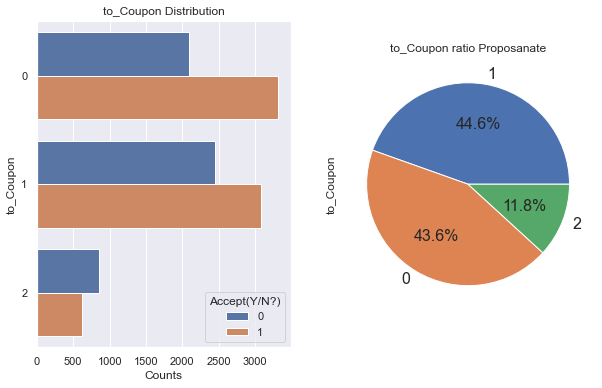

In [272]:
#  Distribution of "to_Coupon"
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="to_Coupon", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('to_Coupon')
plt.title('to_Coupon Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['to_Coupon'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('to_Coupon ratio Proposanate')

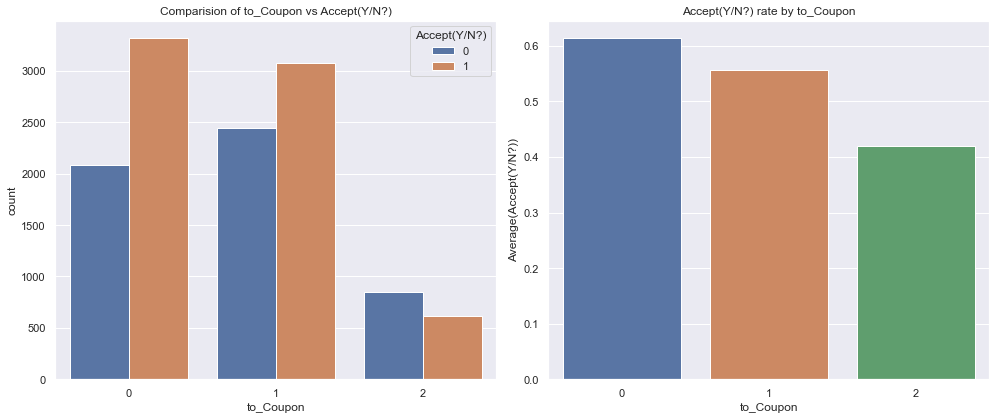

In [273]:
CategoricalVariables_targetPlots(data1,"to_Coupon")

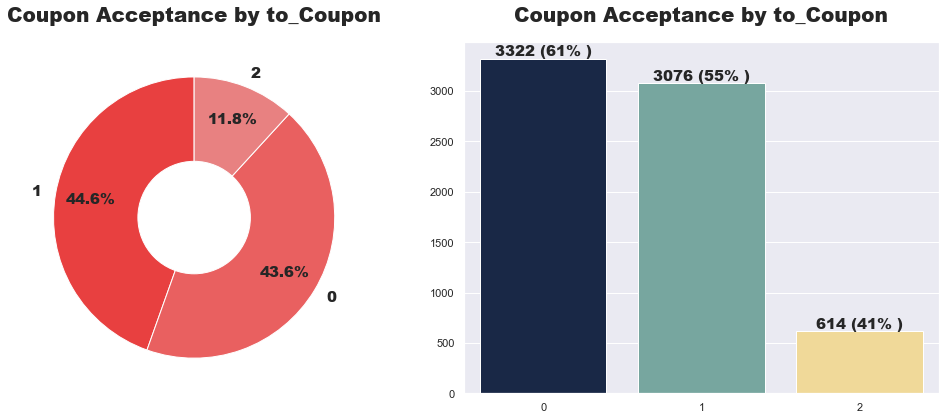

In [274]:
#Visualization to show Coupon Acceptance by direction_opp.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = data1["to_Coupon"].value_counts()
plt.title("Coupon Acceptance by to_Coupon", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Coupon Acceptance Rate by direction_opp.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["to_Coupon"].value_counts()
acceptance_rate = np.floor((value_2/value_1)*100).values
# acceptance_rate = [58, 56]
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by to_Coupon",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


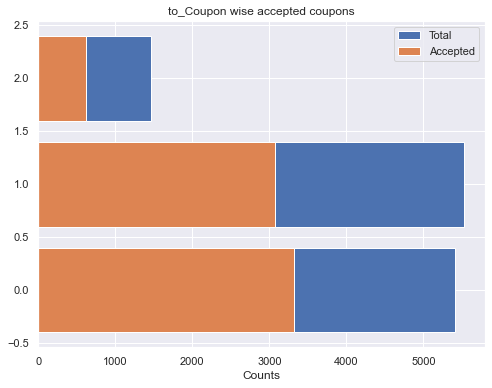

,to_Coupon,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
1,1,5522,43.637537,3076,2446,55.704,44.296
0,0,5408,44.557411,3322,2086,61.428,38.572
2,2,1463,11.805051,614,849,41.969,58.031


In [275]:
Univariate_Analysis1("to_Coupon")

,Accept(Y/N?),to_Coupon,count,count_norm
0,0,0,2086,0.385725
1,0,1,2446,0.442955
2,0,2,849,0.580314
3,1,0,3322,0.614275
4,1,1,3076,0.557045
5,1,2,614,0.419686


<AxesSubplot:xlabel='to_Coupon'>

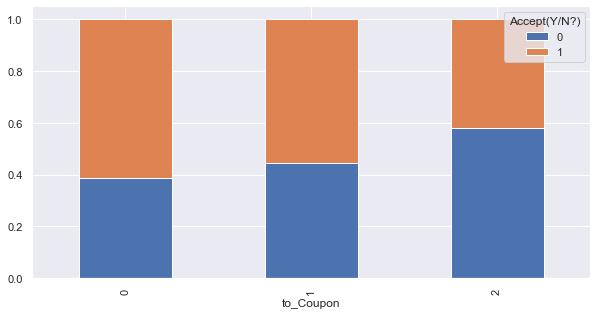

In [276]:
tmp = data1[["Accept(Y/N?)", "to_Coupon"]].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "to_Coupon"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "to_Coupon==\""+row["to_Coupon"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="to_Coupon", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [277]:
# Hypothesis testing on "to_Coupon" column
stat, p_val, dof = chi_sqred_ind_test(data1, "to_Coupon", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
to_Coupon               
0             2086  3322
1             2446  3076
2              849   614
Statistic: 180.5896537928129
P-value: 6.101757371369505e-40
DOF: 2
probability=0.950, critical=5.991, stat=180.590
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [278]:
t = pd.crosstab(data1.to_Coupon, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=180.5896537928129, pvalue=6.101757371369505e-40, dof=2, expected_freq=array([[2348.13588316, 3059.86411684],
       [2397.63430969, 3124.36569031],
       [ 635.22980715,  827.77019285]]))

## Visualizing  coupon_freq (FE)

* "coupon_freq" is a combination of five features, RestaurantLessThan20, CoffeeHouse, CarryAway, Bar, and Restaurant20To50. These five features tell how frequently a user is going to RestaurantLessThan20, CoffeeHouse, CarryAway, Bar, and Restaurant20To50.

* Every user is asked for a single coupon, so we need only the frequency of that one coupon type, other coupon details are not needed. so we create a new feature that tells how frequently a user used the asked coupon.



In [279]:
# FE -- coupon_freq is combination of five features, RestaurantLessThan20, CoffeeHouse, CarryAway,
# Bar, Restaurant20To50
coupon_freq = []
for i in tqdm(range(data1.shape[0])):
    if (list(data1['coupon'])[i] == 'Restaurant(<20)'):
        coupon_freq.append(list(data1['RestaurantLessThan20'])[i])
    elif (list(data1['coupon'])[i] == 'Coffee House'):
        coupon_freq.append(list(data1['CoffeeHouse'])[i])
    elif (list(data1['coupon'])[i] == 'Carry out & Take away'):
        coupon_freq.append(list(data1['CarryAway'])[i])
    elif (list(data1['coupon'])[i] == 'Bar'):
        coupon_freq.append(list(data1['Bar'])[i])
    elif (list(data1['coupon'])[i] == 'Restaurant(20-50)'):
        coupon_freq.append(list(data1['Restaurant20To50'])[i])
        
data1['coupon_freq'] = coupon_freq
print('Unique values:',data1['coupon_freq'].unique())
print('-'*50)
data1['coupon_freq'].describe()

100%|██████████| 12393/12393 [00:36<00:00, 335.49it/s]

Unique values: ['4~8' 'never' '1~3' 'less1' 'gt8']
--------------------------------------------------


count     12393
unique        5
top         1~3
freq       3786
Name: coupon_freq, dtype: object

In [280]:
data1["coupon_freq"].value_counts()

1~3      3786
less1    3227
4~8      2333
never    2074
gt8       973
Name: coupon_freq, dtype: int64

1~3      3786
less1    3227
4~8      2333
never    2074
gt8       973
Name: coupon_freq, dtype: int64
AxesSubplot(0.547727,0.208939;0.352273x0.587121)


Text(0.5, 1.0, 'coupon_freq ratio Proposanate')

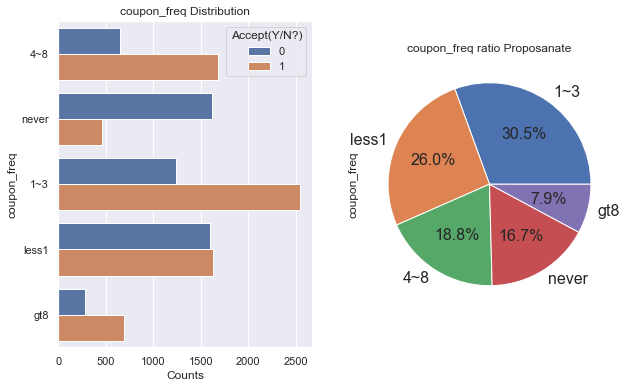

In [281]:
#  Distribution of "coupon_freq"
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="coupon_freq", hue="Accept(Y/N?)", data=data1)
plt.xlabel('Counts')
plt.ylabel('coupon_freq')
plt.title('coupon_freq Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data1['coupon_freq'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('coupon_freq ratio Proposanate')

1~3      30.549504
less1    26.038893
4~8      18.825143
never    16.735254
gt8       7.851206
Name: coupon_freq, dtype: float64


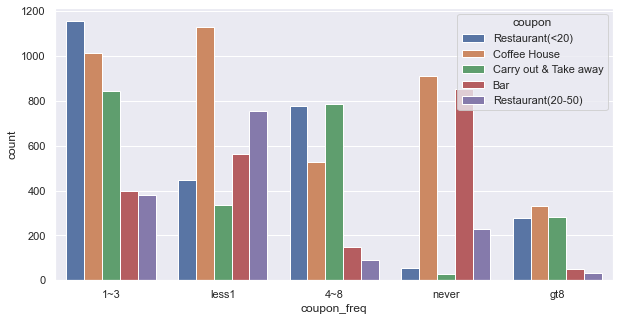

In [282]:
fig, ax = plt.subplots(1, 1, figsize=(10,5))
g = sns.countplot(x="coupon_freq", data=data1, hue="coupon", order=data1["coupon_freq"].
                  value_counts().index)

print(100*data1["coupon_freq"].value_counts()/data1.shape[0])


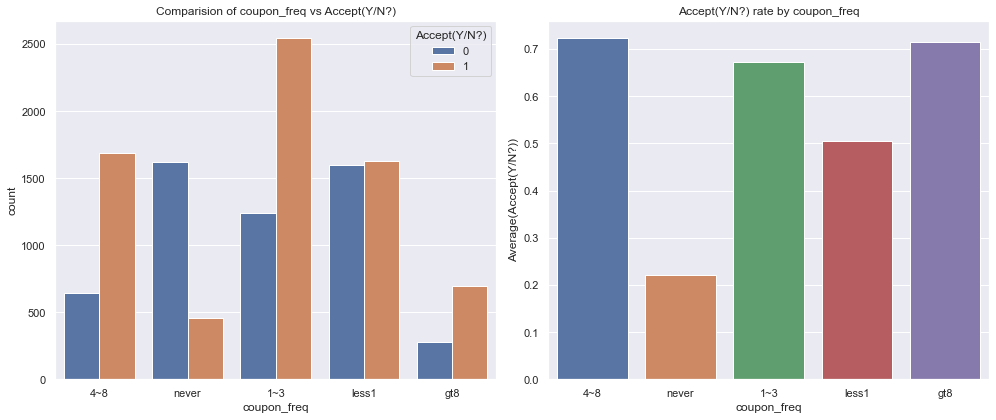

In [283]:
CategoricalVariables_targetPlots(data1,"coupon_freq")

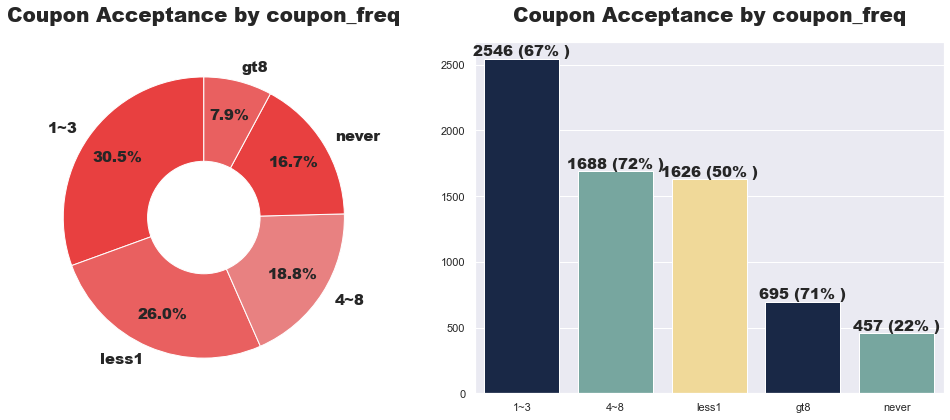

In [284]:
#Visualization to show Coupon Acceptance by coupon_freq.
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
value_1 = data1["coupon_freq"].value_counts()
plt.title("Coupon Acceptance by coupon_freq", fontweight="black", size=20, pad=20)
plt.pie(value_1.values, labels=value_1.index, autopct="%.1f%%",pctdistance=0.75,startangle=90,
        colors=['#E84040', '#E96060', '#E88181'],textprops={"fontweight":"black","size":15})
center_circle = plt.Circle((0, 0), 0.4, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

#Visualization to show Coupon Acceptance Rate by coupon_freq.
plt.subplot(1,2,2)
new_df = data1[data1["Accept(Y/N?)"]==1]
value_2 = new_df["coupon_freq"].value_counts()
# acceptance_rate = np.floor((value_2/value_1)*100).values
acceptance_rate = [67, 72, 50, 71, 22]
sns.barplot(x=value_2.index,y=value_2.values,palette=["#11264e","#6faea4","#FEE08B"])
plt.title("Coupon Acceptance by coupon_freq",fontweight="black",size=20,pad=20)
for index,value in enumerate(value_2):
    plt.text(index,value,str(value)+" ("+str(int(acceptance_rate[index]))+"% )",ha="center",va="bottom",
             size=15,fontweight="black")
plt.tight_layout()
plt.show()


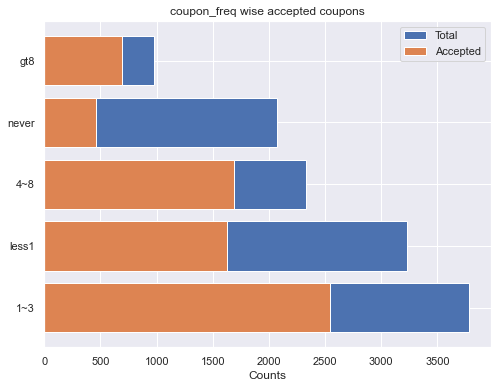

,coupon_freq,Total_Count,% of Total,Accepted,Rejected,%Accepted,%Rejected
0,1~3,3786,30.549504,2546,1240,67.248,32.752
3,less1,3227,16.735254,1626,1601,50.387,49.613
1,4~8,2333,26.038893,1688,645,72.353,27.647
4,never,2074,7.851206,457,1617,22.035,77.965
2,gt8,973,18.825143,695,278,71.429,28.571


In [285]:
Univariate_Analysis1("coupon_freq")

,Accept(Y/N?),coupon_freq,count,count_norm
0,0,1~3,1240,0.327522
1,0,4~8,645,0.276468
2,0,gt8,278,0.285714
3,0,less1,1601,0.496126
4,0,never,1617,0.779653
5,1,1~3,2546,0.672478
6,1,4~8,1688,0.723532
7,1,gt8,695,0.714286
8,1,less1,1626,0.503874
9,1,never,457,0.220347


<AxesSubplot:xlabel='coupon_freq'>

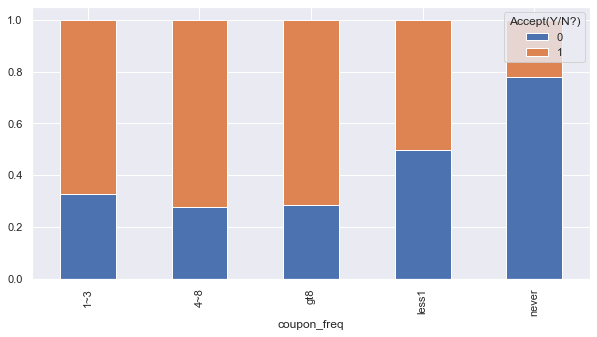

In [286]:
tmp = data1[["Accept(Y/N?)", "coupon_freq"]].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["Accept(Y/N?)", "coupon_freq"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "coupon_freq==\""+row["coupon_freq"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
display(tmp)
tmp.pivot(columns="Accept(Y/N?)", index="coupon_freq", values="count_norm").plot.bar(stacked=True,
                                                                          figsize=(10,5))

In [287]:
# Hypothesis testing on "coupon_freq" column
stat, p_val, dof = chi_sqred_ind_test(data1, "coupon_freq", "Accept(Y/N?)", 0.05)

Contigency table: 
 Accept(Y/N?)     0     1
coupon_freq             
1~3           1240  2546
4~8            645  1688
gt8            278   695
less1         1601  1626
never         1617   457
Statistic: 1556.815739154949
P-value: 0.0
DOF: 4
probability=0.950, critical=9.488, stat=1556.816
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


In [288]:
t = pd.crosstab(data1.coupon_freq, data1["Accept(Y/N?)"], margins=False)
stats.chi2_contingency(observed=t)

Chi2ContingencyResult(statistic=1556.815739154949, pvalue=0.0, dof=4, expected_freq=array([[1643.8687969 , 2142.1312031 ],
       [1012.98095699, 1320.01904301],
       [ 422.47341241,  550.52658759],
       [1401.15282821, 1825.84717179],
       [ 900.52400549, 1173.47599451]]))

## Bivariate Analysis

In [289]:
def bivariate_analysis(col1,col2,c1,c2,no_row):
    a = list(data1[col1].unique())
    b = list(data1[col2].unique())
    df = pd.DataFrame([(i, j) for i in a for j in b], columns=[col1,col2])
    Total_Count=[]; Accepted=[]; Rejected=[]
    for i in range(df.shape[0]):
        Total_Count.append((data1[(c1==df[col1][i]) & (c2==df[col2][i])]).shape[0])
        Accepted.append((data1[(c1==df[col1][i]) & (c2==df[col2][i]) & (data1["Accept(Y/N?)"]==1)]).shape[0])
        Rejected.append((data1[(c1==df[col1][i]) & (c2==df[col2][i]) & (data1["Accept(Y/N?)"]==0)]).shape[0])
    df['Total_Count'] = Total_Count
    df['Accepted'] = Accepted
    df['Rejected'] = Rejected
    df['%Accepted'] = round(df['Accepted']/df['Total_Count']*100,3)
    df['%Rejected'] = round(df['Rejected']/df['Total_Count']*100,3)
    df = df.dropna()
    df = df.sort_values(by='%Accepted', ascending=False)
    d = pd.concat([df.head(no_row), df.tail(no_row)], axis=0)
    return d

In [290]:
def plot_bivariate(f1,f2,data2,rotate_ticks=False,deg=90):

    '''
    Helper function to see if any bivariate relatonships in data are helping us i detecting any trends in categorical data
    '''

    data1['feature_comb'] = data1[f1].astype('str') + ' & ' + data1[f2].astype('str')
    fig = plt.subplots(figsize =(10, 3))
    sns.countplot(x='feature_comb',hue='Accept(Y/N?)',data=data1)
    plt.xlabel("Combination of {} & {}".format(f1,f2))
    plt.title("Effect of {} & {} on target variable".format(f1,f2))
    plt.ylabel("")
    if rotate_ticks:
        plt.xticks(rotation=deg)
    plt.legend(labels=['Rejected','Accepted'])
    plt.show()


In [291]:
def plot_bivariate1(f1,f2,data2,rotate_ticks=False,deg=90):

    '''
    Helper function to see if any bivariate relatonships in data are helping us i detecting any trends in categorical data
    '''

    data1['feature_comb'] = x_train[f1].astype('str') + ' & ' + x_train[f2].astype('str')
    fig = plt.subplots(figsize =(10, 4))
    sns.countplot(x='feature_comb',hue='Accept(Y/N?)',data=x_train)
    plt.xlabel("Combination of {} & {}".format(f1,f2))
    plt.title("Effect of {} & {} on target variable".format(f1,f2))
    plt.ylabel("")
    if rotate_ticks:
        plt.xticks(rotation=deg)
    plt.legend(labels=['Rejected','Accepted'])
    plt.show()


#### Q. Does these combinations of features together have an effect on acceptance of coupons?

##### 1. temperature and weather

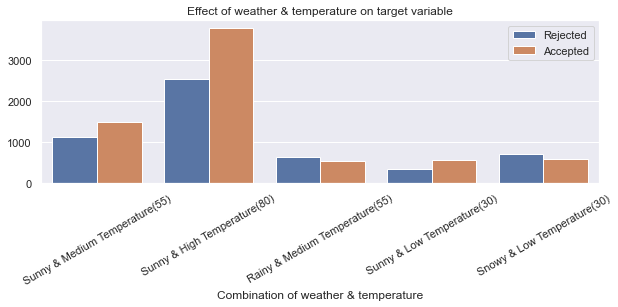

In [292]:
plot_bivariate("weather", "temperature", data1, rotate_ticks=True, deg=30)

Observation :
* People are accepting more coupons if overall climate is on the higher side

##### 2. Passenger and destination

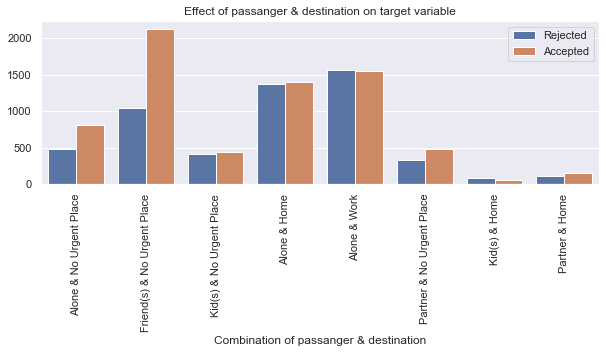

In [293]:
plot_bivariate('passanger', 'destination',data1,rotate_ticks=True,deg=90)

Observations:

* Coupon acceptance is most if people are with friends and have no urgent place to go to.

* It is also high if people are alone or with partner but there destination should be no urgent place.

##### 3. Destination and direction_same (1 | 0)

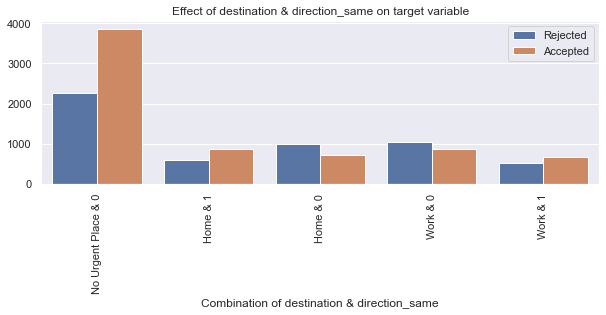

In [294]:
plot_bivariate('destination', 'direction_same',data1,rotate_ticks=True,deg=90)

Observations:

* As already seen above if people have no urgent place to go they are accepting the coupons even if they are moving in opposite direction of the coupon venue.
* Interestingly if people are in the same direction of the venue, irrespective of whether they are headed to work or home, then they are more likley to accept the coupon as compared to if they are moving in opposite direction.

#### destination and coupon

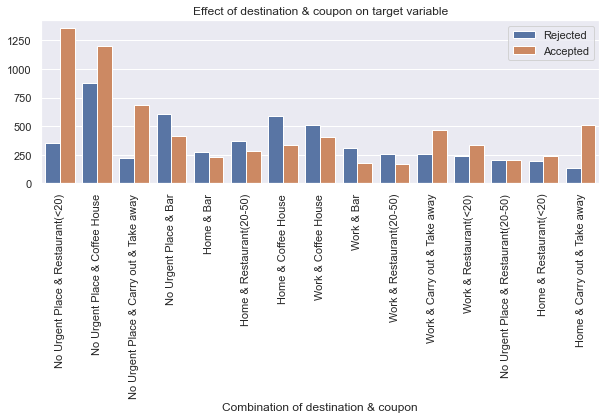

In [295]:
plot_bivariate('destination', 'coupon',data1,rotate_ticks=True,deg=90)

##### 4. coupon and expiration

In [296]:
bivariate_analysis("coupon", "expiration", data1["coupon"], data1["expiration"], 5)

,coupon,expiration,Total_Count,Accepted,Rejected,%Accepted,%Rejected
0,Restaurant(<20),1d,1350,1122,228,83.111,16.889
4,Carry out & Take away,1d,1342,1047,295,78.018,21.982
5,Carry out & Take away,2h,933,618,315,66.238,33.762
1,Restaurant(<20),2h,1358,802,556,59.057,40.943
2,Coffee House,1d,1741,1012,729,58.128,41.872
8,Restaurant(20-50),1d,952,496,456,52.101,47.899
3,Coffee House,2h,2172,931,1241,42.864,57.136
6,Bar,1d,1553,640,913,41.211,58.789
7,Bar,2h,457,184,273,40.263,59.737
9,Restaurant(20-50),2h,535,160,375,29.907,70.093


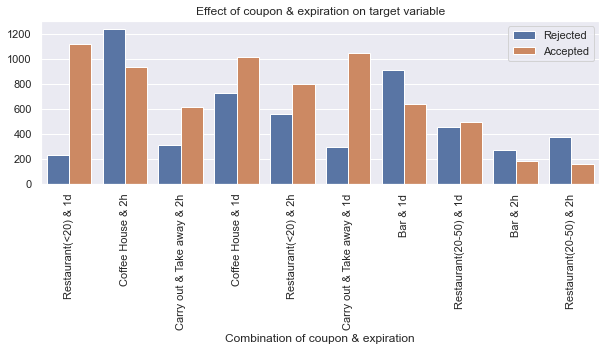

In [297]:
plot_bivariate('coupon', 'expiration',data1,rotate_ticks=True,deg=90)

#### passanger and age

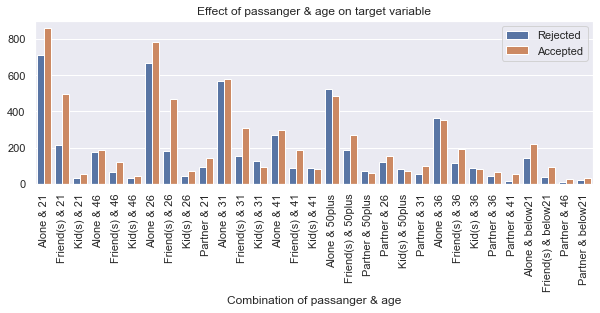

In [298]:
plot_bivariate('passanger', 'age',data1,rotate_ticks=True,deg=90)

#### passanger and temperature

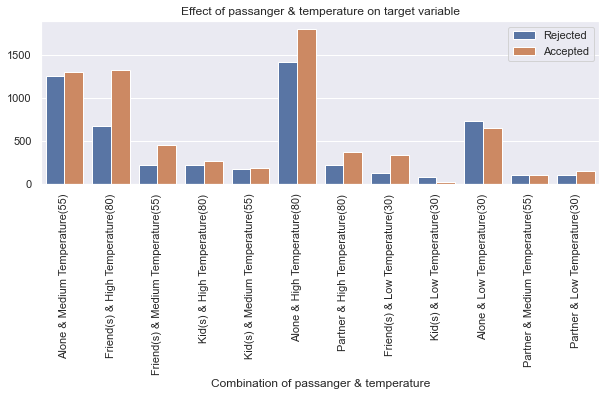

In [299]:
plot_bivariate('passanger', 'temperature',data1,rotate_ticks=True,deg=90)

#### passanger and coupon

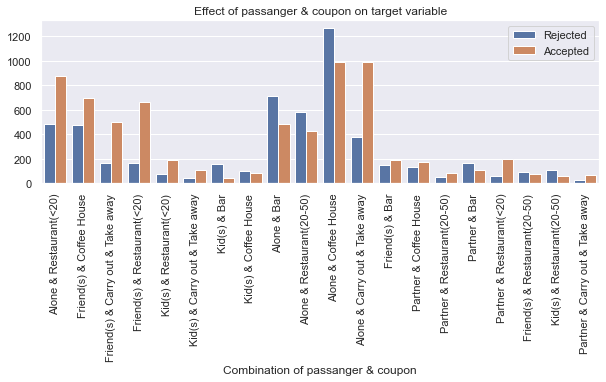

In [300]:
plot_bivariate('passanger', 'coupon',data1,rotate_ticks=True,deg=90)

#### passanger and expiration

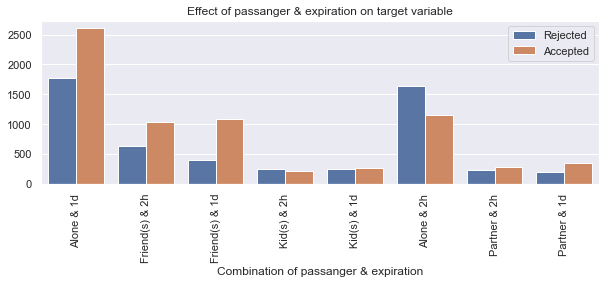

In [301]:
plot_bivariate('passanger', 'expiration',data1,rotate_ticks=True,deg=90)

#### passanger and gender

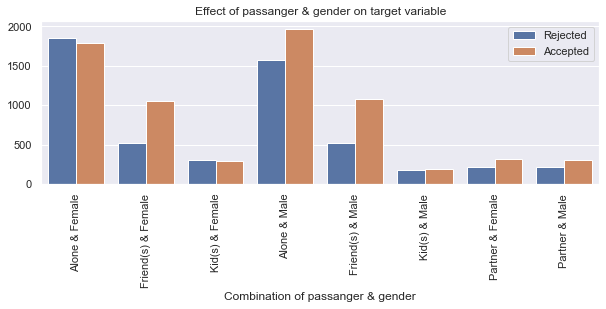

In [302]:
plot_bivariate('passanger', 'gender',data1,rotate_ticks=True,deg=90)

#### passanger and maritalStatus

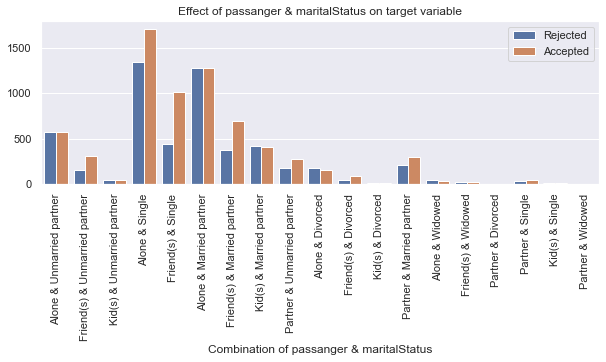

In [303]:
plot_bivariate('passanger', 'maritalStatus',data1,rotate_ticks=True,deg=90)

#### passanger and has_children 

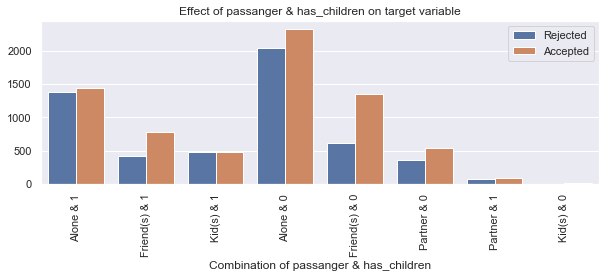

In [304]:
plot_bivariate('passanger', 'has_children',data1,rotate_ticks=True,deg=90)

#### passanger and education

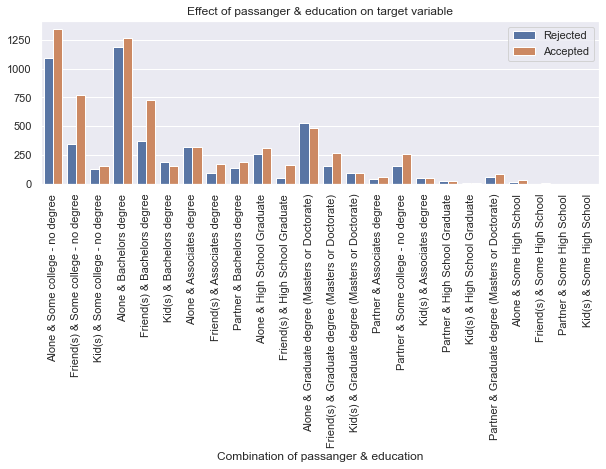

In [305]:
plot_bivariate('passanger', 'education',data1,rotate_ticks=True,deg=90)

#### passanger and income

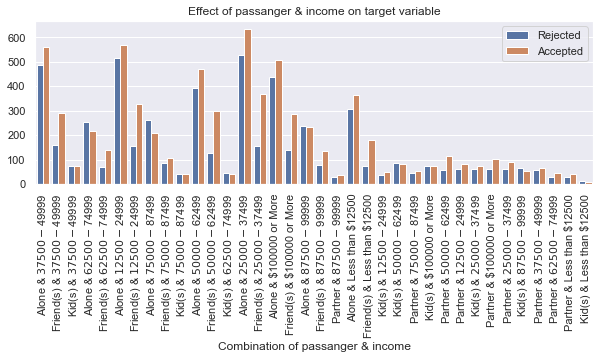

In [306]:
plot_bivariate('passanger', 'income',data1,rotate_ticks=True,deg=90)

#### passanger and Bar

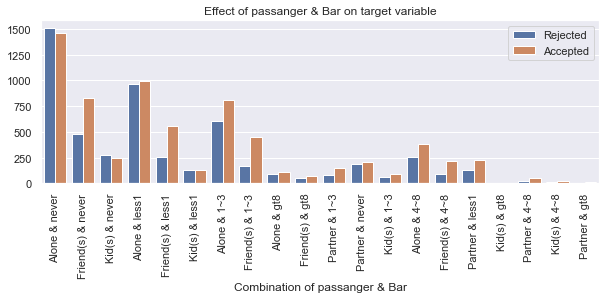

In [307]:
plot_bivariate('passanger', 'Bar',data1,rotate_ticks=True,deg=90)

#### passanger and driving_distance

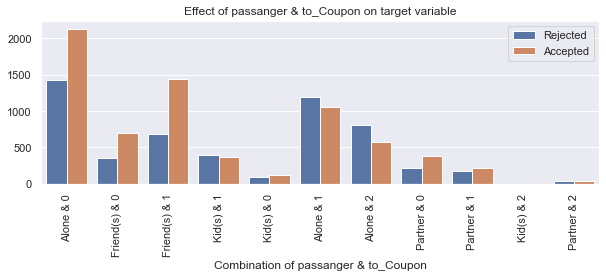

In [308]:
plot_bivariate('passanger', 'to_Coupon',data1,rotate_ticks=True,deg=90)

#### passanger and coupon_freq

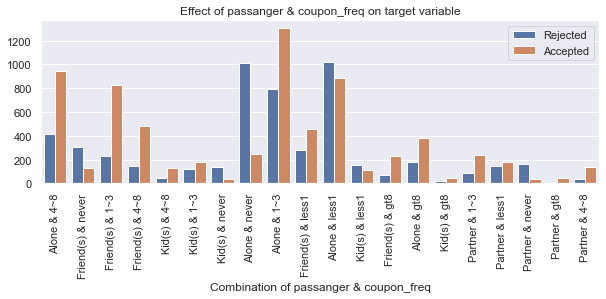

In [309]:
plot_bivariate('passanger', 'coupon_freq',data1,rotate_ticks=True,deg=90)

#### weather and to_Coupon

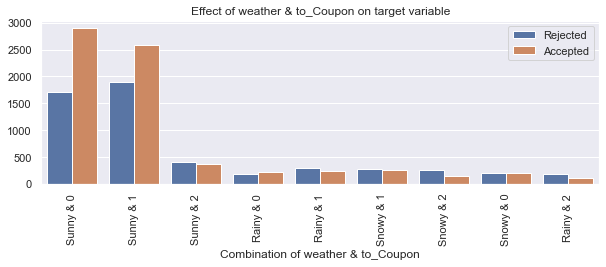

In [310]:
plot_bivariate('weather', 'to_Coupon',data1,rotate_ticks=True,deg=90)

#### temperature and coupon

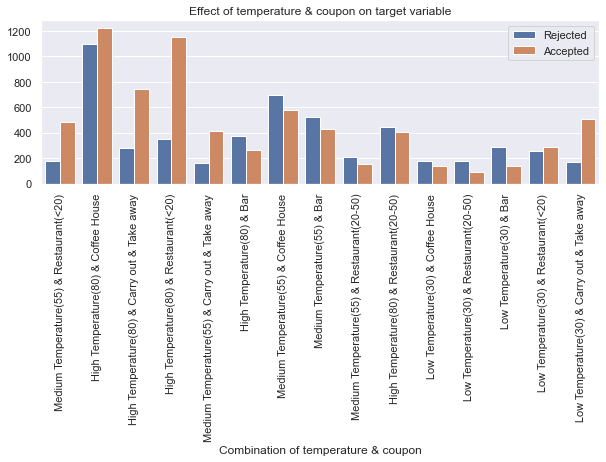

In [311]:
plot_bivariate('temperature', 'coupon',data1,rotate_ticks=True,deg=90)

#### temperature and income

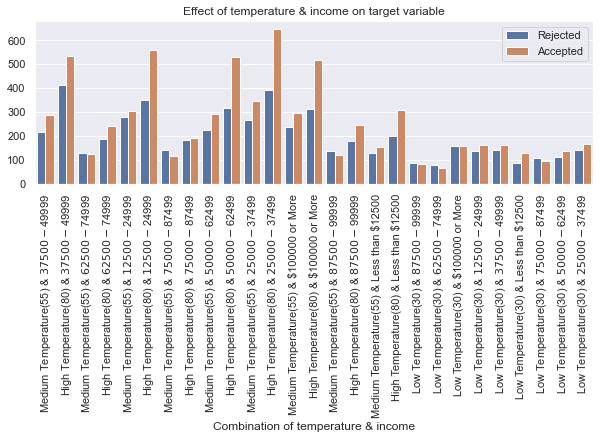

In [312]:
plot_bivariate('temperature', 'income',data1,rotate_ticks=True,deg=90)

#### temperature and to_Coupon

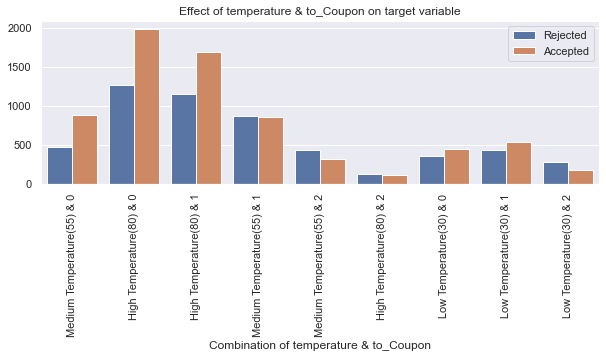

In [313]:
plot_bivariate('temperature', 'to_Coupon',data1,rotate_ticks=True,deg=90)

#### coupon and passanger

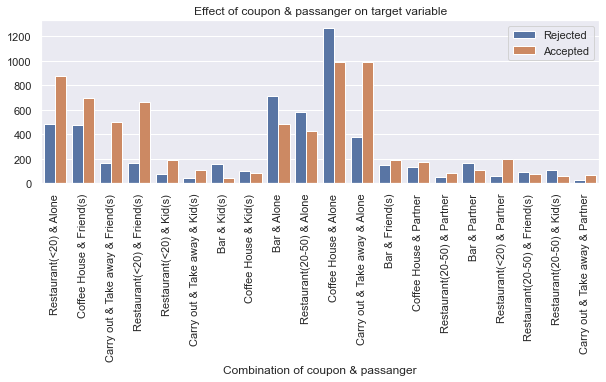

In [314]:
plot_bivariate('coupon', 'passanger',data1,rotate_ticks=True,deg=90)

#### coupon and weather

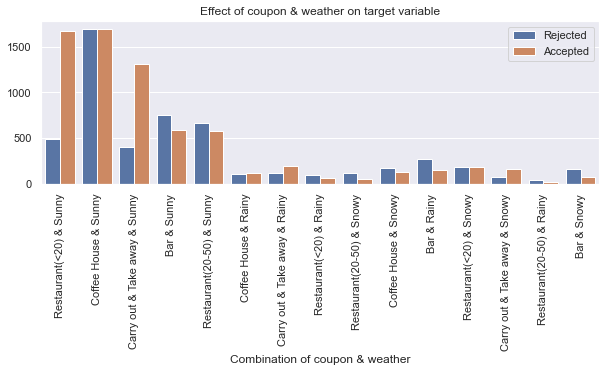

In [315]:
plot_bivariate('coupon', 'weather',data1,rotate_ticks=True,deg=90)

#### expiration and gender

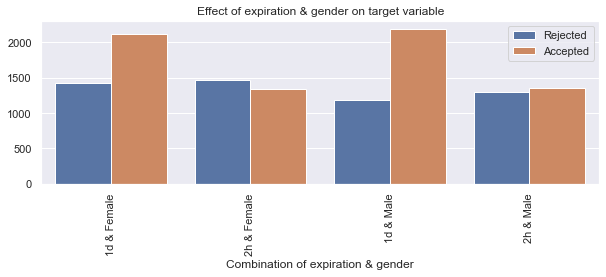

In [316]:
plot_bivariate('expiration', 'gender',data1,rotate_ticks=True,deg=90)

#### age and destination

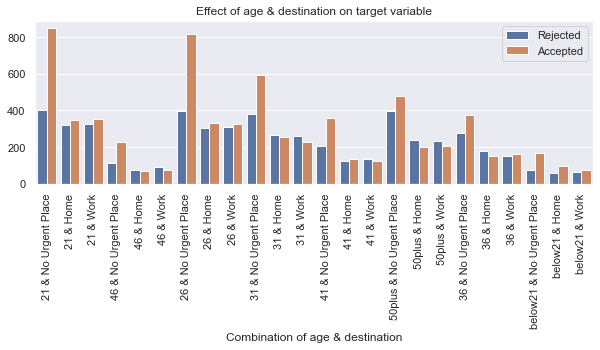

In [317]:
plot_bivariate('age', 'destination',data1,rotate_ticks=True,deg=90)

#### age and passanger

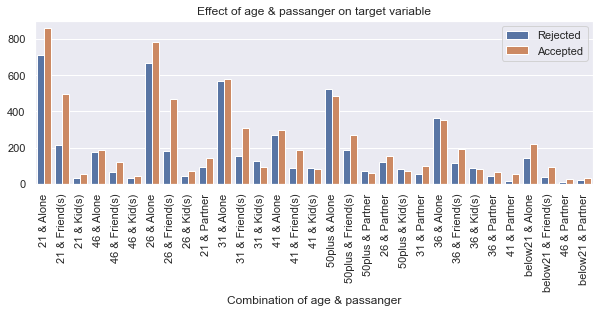

In [318]:
plot_bivariate('age', 'passanger',data1,rotate_ticks=True,deg=90)

#### age and maritalStatus

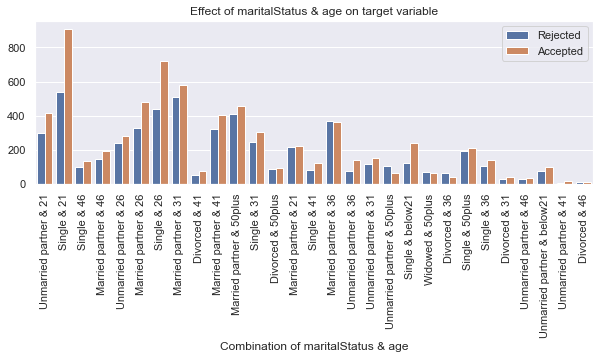

In [319]:
plot_bivariate('maritalStatus', 'age',data1,rotate_ticks=True,deg=90)

#### maritalStatus and income

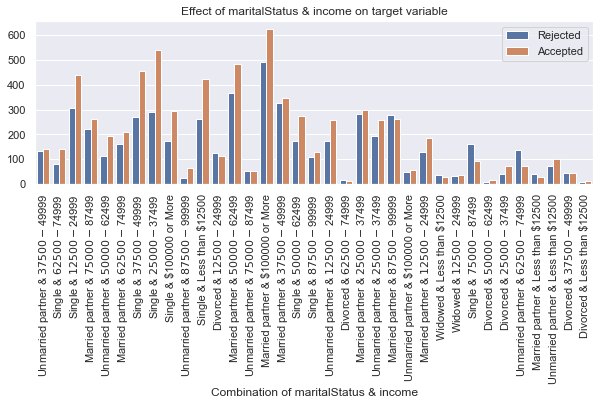

In [320]:
plot_bivariate('maritalStatus', 'income',data1,rotate_ticks=True,deg=90)

#### maritalStatus and coupon

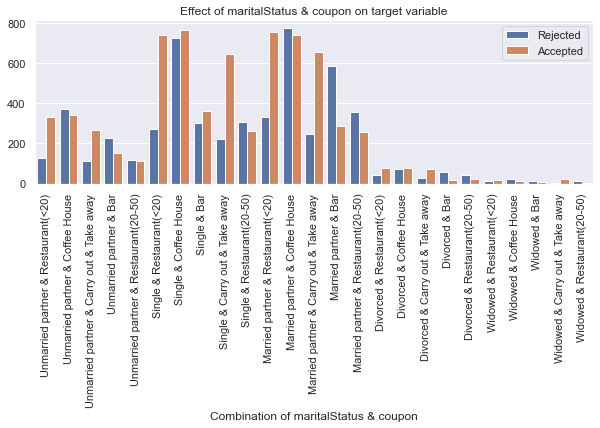

In [321]:
plot_bivariate('maritalStatus', 'coupon',data1,rotate_ticks=True,deg=90)

#### maritalStatus and gender

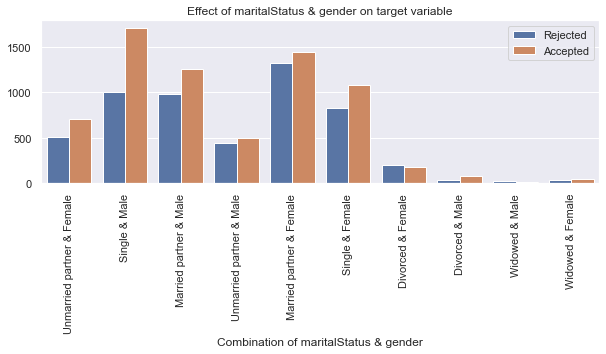

In [322]:
plot_bivariate('maritalStatus', 'gender',data1,rotate_ticks=True,deg=90)

#### maritalStatus and has_children

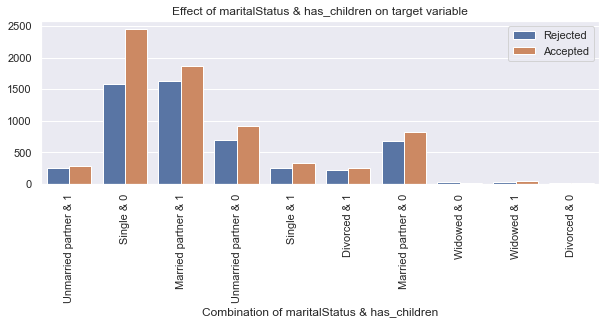

In [323]:
plot_bivariate('maritalStatus', 'has_children',data1,rotate_ticks=True,deg=90)

#### education and age

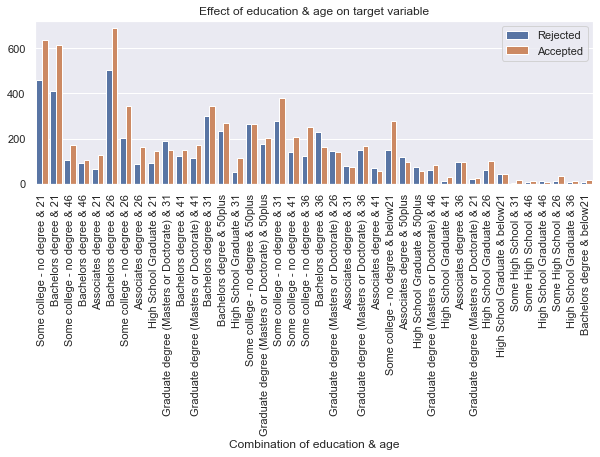

In [324]:
plot_bivariate('education', 'age',data1,rotate_ticks=True,deg=90)

#### education and gender

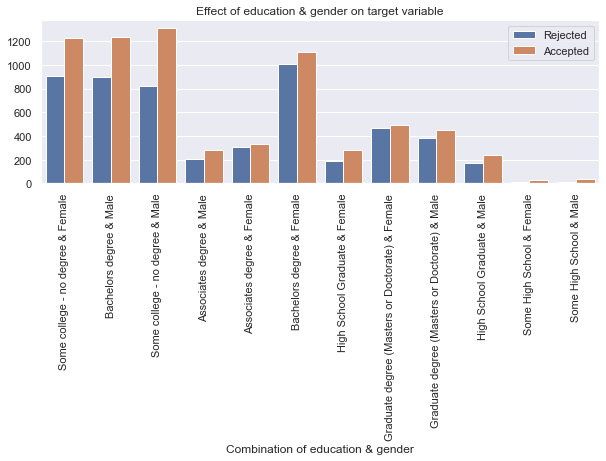

In [325]:
plot_bivariate('education', 'gender',data1,rotate_ticks=True,deg=90)

#### occupation_class and destination

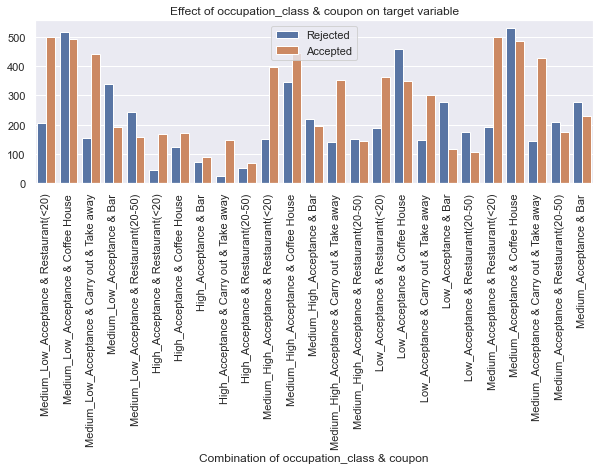

In [326]:
plot_bivariate('occupation_class', 'coupon',data1,rotate_ticks=True,deg=90)

#### occupation_class and destination

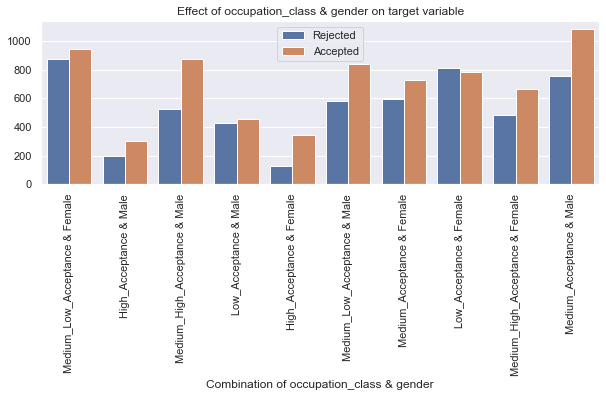

In [327]:
plot_bivariate('occupation_class', 'gender',data1,rotate_ticks=True,deg=90)

#### Bar and destination

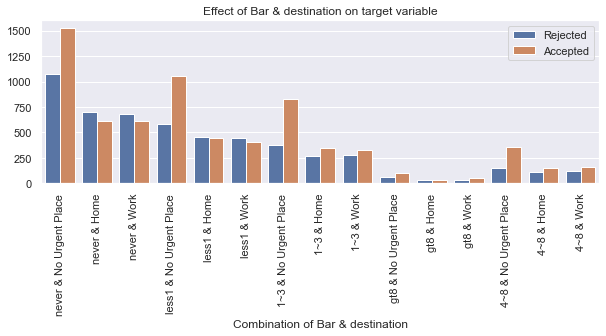

In [328]:
plot_bivariate('Bar', 'destination',data1,rotate_ticks=True,deg=90)

#### Bar and destination

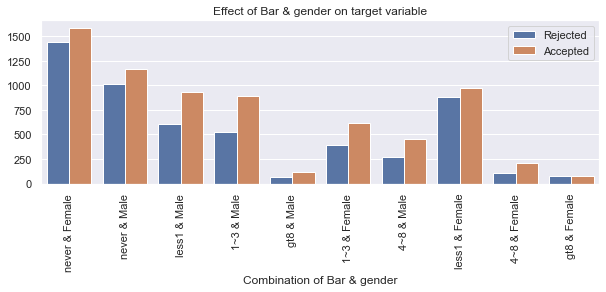

In [329]:
plot_bivariate('Bar', 'gender',data1,rotate_ticks=True,deg=90)

#### Bar and destination

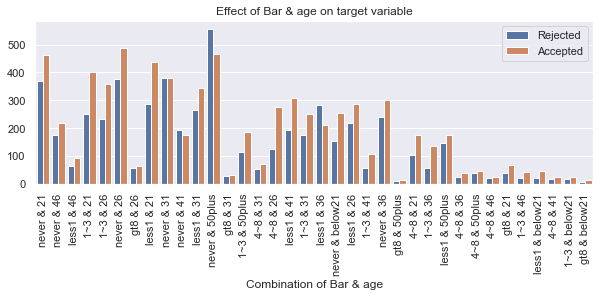

In [330]:
plot_bivariate('Bar', 'age',data1,rotate_ticks=True,deg=90)

In [331]:
chisq_dict = {"column":[], 
             "chisq_stat":[],
             "pval":[]

             }
for c in data1.columns:
    print(c, end=" --> ")
    stat, p, dof = chi_sqred_ind_test(data1, c, "Accept(Y/N?)", debug=False, print_result=False)
    chisq_dict["column"].append(c)
    chisq_dict["chisq_stat"].append(stat)
    chisq_dict["pval"].append(np.round(p, 20))
    

def highlight_weakpred(x):
    return ['background-color: salmon' if x["pval"] > 0.05
            else ''
            for i in x]

pd.DataFrame(chisq_dict).style.apply(highlight_weakpred, axis=1)

destination --> passanger --> weather --> temperature --> coupon --> expiration --> gender --> age --> maritalStatus --> has_children --> education --> occupation --> income --> car --> Bar --> CoffeeHouse --> CarryAway --> RestaurantLessThan20 --> Restaurant20To50 --> toCoupon_GEQ5min --> toCoupon_GEQ15min --> toCoupon_GEQ25min --> direction_same --> direction_opp --> Accept(Y/N?) --> occupation_class --> to_Coupon --> coupon_freq --> feature_comb --> 

,column,chisq_stat,pval
0,destination,214.045718,0.000000
1,passanger,216.745407,0.000000
2,weather,147.554996,0.000000
3,temperature,56.586304,0.000000
4,coupon,855.294266,0.000000
5,expiration,203.729115,0.000000
6,gender,24.023679,0.000001
7,age,62.615040,0.000000
8,maritalStatus,48.175873,0.000000
9,has_children,24.788591,0.000001


In [332]:
data1c = data1.copy()

In [333]:
data1c["has_children"] = data1c["has_children"].astype(str)
data1c["toCoupon_GEQ5min"] = data1c["toCoupon_GEQ5min"].astype(str)
data1c["toCoupon_GEQ15min"] = data1c["toCoupon_GEQ15min"].astype(str)
data1c["toCoupon_GEQ25min"] = data1c["toCoupon_GEQ25min"].astype(str)
data1c["direction_same"] = data1c["direction_same"].astype(str)
data1c["direction_opp"] = data1c["direction_opp"].astype(str)
data1c["to_Coupon"] = data1c["direction_opp"].astype(str)



## PERFORM CHI-SQUARE TEST
### ANALYZE THE CATEGORICAL FEATURES IMPORTANCE IN EMPLOYEE ATTRITION

In [334]:
cat_cols = data1c.select_dtypes(include="object").columns.tolist()
# cat_cols.remove("Accept(Y/N?)")
cat_cols

['destination',
 'passanger',
 'weather',
 'temperature',
 'coupon',
 'expiration',
 'gender',
 'age',
 'maritalStatus',
 'has_children',
 'education',
 'occupation',
 'income',
 'car',
 'Bar',
 'CoffeeHouse',
 'CarryAway',
 'RestaurantLessThan20',
 'Restaurant20To50',
 'toCoupon_GEQ5min',
 'toCoupon_GEQ15min',
 'toCoupon_GEQ25min',
 'direction_same',
 'direction_opp',
 'occupation_class',
 'to_Coupon',
 'coupon_freq',
 'feature_comb']

In [335]:
chi2_statistic = {}
p_values = {}
# dof = {}

# Perform chi-square test for each column
for col in cat_cols:
    contingency_table = pd.crosstab(data1c[col], data1c['Accept(Y/N?)'])
    chi2, p_value, dof, _ = chi2_contingency(contingency_table)
    chi2_statistic[col] = chi2
    p_values[col] = p_value
#     dof[col] = dof

### VISUALIZE THE CHI-SQUARE STATISTICS VALUES OF CATEGORICAL FEATURES

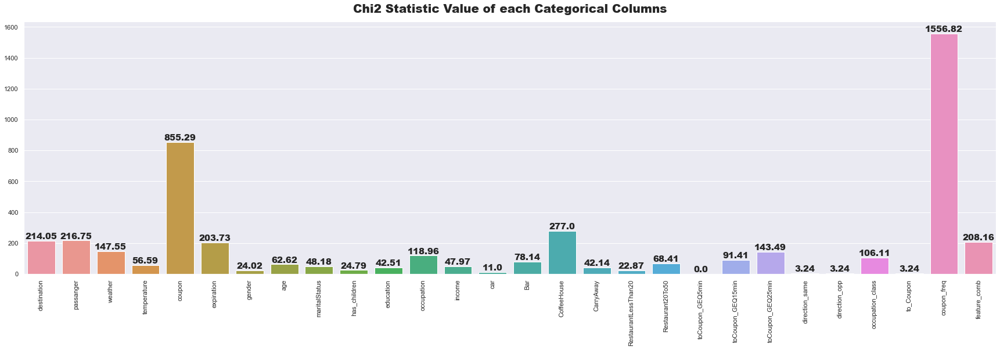

In [336]:
columns = list(chi2_statistic.keys())
values = list(chi2_statistic.values())

plt.figure(figsize=(30, 8))
sns.barplot(x=columns, y=values)
plt.xticks(rotation=90)
plt.title("Chi2 Statistic Value of each Categorical Columns",fontweight="black",size=20,pad=15)
for index,value in enumerate(values):
    plt.text(index,value,round(value,2),ha="center",va="bottom",fontweight="black",size=15)

plt.show()


### COMPARING CHI^2_STATISTICS AND P_VALUE OF CHI^2 TEST.

In [337]:
test_df = pd.DataFrame({"Features":columns,"Chi_2 Statistic":values})
test_df["P_value"] =  [format(p, '.20f') for p in list(p_values.values())]
test_df

,Features,Chi_2 Statistic,P_value
0,destination,214.045718,0.00000000000000000000
1,passanger,216.745407,0.00000000000000000000
2,weather,147.554996,0.00000000000000000000
3,temperature,56.586304,0.00000000000051575110
4,coupon,855.294266,0.00000000000000000000
5,expiration,203.729115,0.00000000000000000000
6,gender,24.023679,0.00000095158226872841
7,age,62.615040,0.00000000004526755608
8,maritalStatus,48.175873,0.00000000086737524129
9,has_children,24.788591,0.00000063975015561657


## Checking Feature Importance

In [338]:
data1 = data1.drop(['car','toCoupon_GEQ5min','toCoupon_GEQ15min','toCoupon_GEQ25min','Bar','CoffeeHouse','CarryAway','RestaurantLessThan20','Restaurant20To50','occupation','direction_same','direction_opp'], axis=1)
data1.head()

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,education,income,Accept(Y/N?),occupation_class,to_Coupon,coupon_freq,feature_comb
0,No Urgent Place,Alone,Sunny,Medium Temperature(55),Restaurant(<20),1d,Female,21,Unmarried partner,1,Some college - no degree,$37500 - $49999,1,Medium_Low_Acceptance,0,4~8,never & 21
1,No Urgent Place,Friend(s),Sunny,High Temperature(80),Coffee House,2h,Female,21,Unmarried partner,1,Some college - no degree,$37500 - $49999,0,Medium_Low_Acceptance,0,never,never & 21
2,No Urgent Place,Friend(s),Sunny,High Temperature(80),Carry out & Take away,2h,Female,21,Unmarried partner,1,Some college - no degree,$37500 - $49999,1,Medium_Low_Acceptance,1,1~3,never & 21
3,No Urgent Place,Friend(s),Sunny,High Temperature(80),Coffee House,2h,Female,21,Unmarried partner,1,Some college - no degree,$37500 - $49999,0,Medium_Low_Acceptance,1,never,never & 21
4,No Urgent Place,Friend(s),Sunny,High Temperature(80),Coffee House,1d,Female,21,Unmarried partner,1,Some college - no degree,$37500 - $49999,0,Medium_Low_Acceptance,1,never,never & 21


In [339]:
# Data Splitting
x = data1.drop(["Accept(Y/N?)"], axis=1)
y = data1["Accept(Y/N?)"]

In [340]:
# Applying OrdinalEncoder
from sklearn.preprocessing import OrdinalEncoder

ordi = OrdinalEncoder().set_output(transform="pandas")
x = ordi.fit_transform(x)
x.head()

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,education,income,occupation_class,to_Coupon,coupon_freq,feature_comb
0,1.0,0.0,2.0,2.0,4.0,0.0,0.0,0.0,3.0,1.0,5.0,3.0,4.0,0.0,1.0,28.0
1,1.0,1.0,2.0,0.0,2.0,1.0,0.0,0.0,3.0,1.0,5.0,3.0,4.0,0.0,4.0,28.0
2,1.0,1.0,2.0,0.0,1.0,1.0,0.0,0.0,3.0,1.0,5.0,3.0,4.0,1.0,0.0,28.0
3,1.0,1.0,2.0,0.0,2.0,1.0,0.0,0.0,3.0,1.0,5.0,3.0,4.0,1.0,4.0,28.0
4,1.0,1.0,2.0,0.0,2.0,0.0,0.0,0.0,3.0,1.0,5.0,3.0,4.0,1.0,4.0,28.0


### Feature_importance in LogisticRegression

<AxesSubplot:ylabel='Feature'>

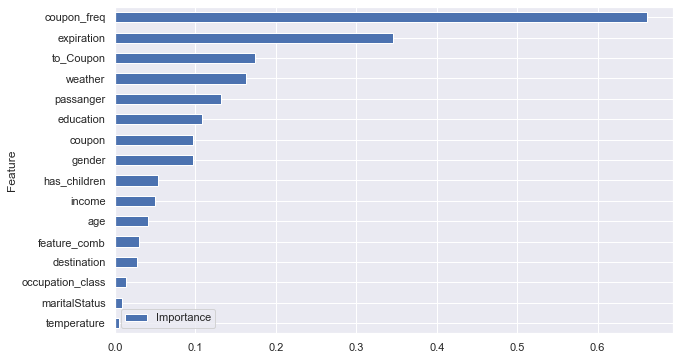

In [341]:
# applying LogisticRegression
from sklearn.linear_model import LogisticRegression
from sklearn.inspection import permutation_importance
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler().set_output(transform="pandas")
x = scaler.fit_transform(x)

logit = LogisticRegression()
logit.fit(x, y)



coefficients = logit.coef_[0]

feature_importance = pd.DataFrame({'Feature': x.columns, 'Importance': np.abs(coefficients)})
feature_importance = feature_importance.sort_values('Importance', ascending=True)
feature_importance.plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6))

Text(0.5, 1.0, 'Permutation Importance with Standard Deviation')

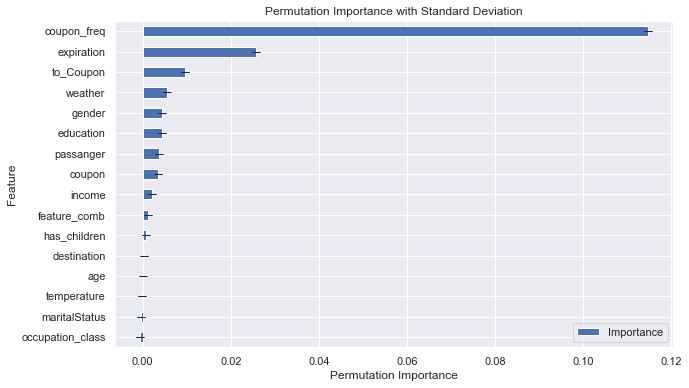

In [342]:
result = permutation_importance(logit, x, y, n_repeats=10, random_state=42)


feature_importance = pd.DataFrame({'Feature': x.columns,
                                   'Importance': result.importances_mean,
                                   'Standard Deviation': result.importances_std})
feature_importance = feature_importance.sort_values('Importance', ascending=True)


ax = feature_importance.plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6), yerr='Standard Deviation', capsize=4)
ax.set_xlabel('Permutation Importance')
ax.set_title('Permutation Importance with Standard Deviation')

### Feature_importance in DecisionTree

<AxesSubplot:>

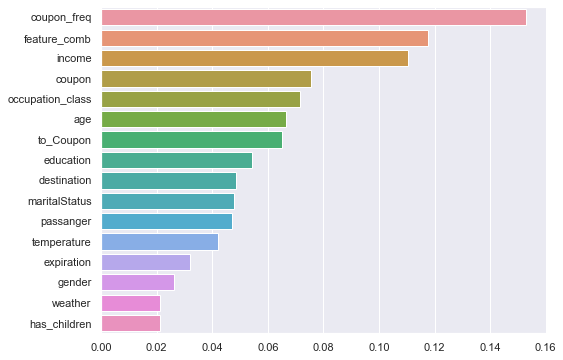

In [343]:
from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier(criterion='gini')
# Fit the decision tree classifier
clf = clf.fit(x, y)

# Print the feature importances
feature_importances = clf.feature_importances_



# Sort the feature importances from greatest to least using the sorted indices
sorted_indices = feature_importances.argsort()[::-1]
sorted_feature_names = x.columns[sorted_indices]
sorted_importances = feature_importances[sorted_indices]

# Create a bar plot of the feature importances
sns.set(rc={'figure.figsize':(8,6)})
sns.barplot(sorted_importances, sorted_feature_names)



### Feature_importance in RandomForest

<AxesSubplot:>

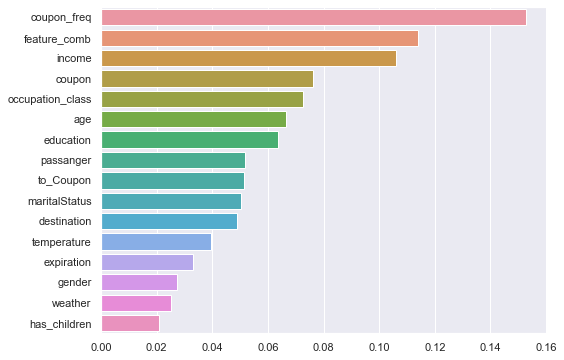

In [344]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(x, y)

# Print the feature importances
feature_importances = rf.feature_importances_



# Sort the feature importances from greatest to least using the sorted indices
sorted_indices = feature_importances.argsort()[::-1]
sorted_feature_names = x.columns[sorted_indices]
sorted_importances = feature_importances[sorted_indices]

# Create a bar plot of the feature importances
sns.set(rc={'figure.figsize':(8,6)})
sns.barplot(sorted_importances, sorted_feature_names)


Text(0.5, 1.0, 'Global Feature Importance - Built-in Method')

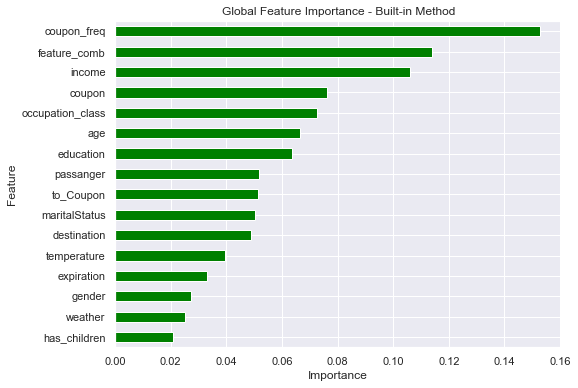

In [345]:
# Built-in Scikit-learn Method With feature_importance
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(x, y)

global_importances = pd.Series(rf.feature_importances_, index=x.columns)
global_importances.sort_values(ascending=True, inplace=True)
global_importances.plot.barh(color='green')
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Global Feature Importance - Built-in Method")

In [346]:
# Permutation Feature Importance
from sklearn.inspection import permutation_importance

rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(x, y)

result = permutation_importance(rf, x, y, n_repeats=10, random_state=42)

perm_importances = result.importances_mean
perm_std = result.importances_std
sorted_idx = perm_importances.argsort()
feature_names = x.columns

pd.DataFrame({'Importance': perm_importances, 'Std': perm_std}, index=feature_names[sorted_idx]).sort_values('Importance',ascending=True)



,Importance,Std
passanger,0.047500,0.000734
gender,0.113037,0.002441
maritalStatus,0.122533,0.002026
temperature,0.127478,0.001352
expiration,0.139358,0.002858
has_children,0.152073,0.002792
occupation_class,0.154965,0.002240
age,0.159594,0.002065
feature_comb,0.171989,0.001112
weather,0.178034,0.003134


### Feature_importance in XGBClassifier

<AxesSubplot:>

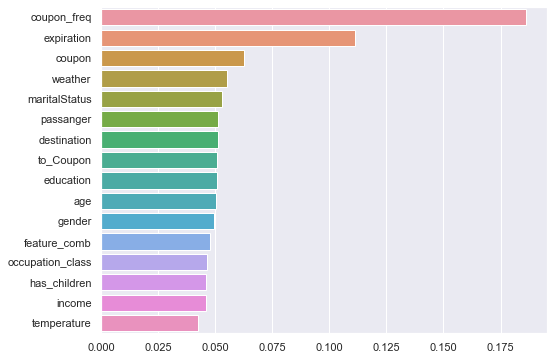

In [347]:
from xgboost import XGBClassifier

model = XGBClassifier()
model.fit(x, y)

# Print the feature importances
feature_importances = model.feature_importances_



# Sort the feature importances from greatest to least using the sorted indices
sorted_indices = feature_importances.argsort()[::-1]
sorted_feature_names = x.columns[sorted_indices]
sorted_importances = feature_importances[sorted_indices]

# Create a bar plot of the feature importances
sns.set(rc={'figure.figsize':(8,6)})
sns.barplot(sorted_importances, sorted_feature_names)


<AxesSubplot:title={'center':'Feature importance'}>

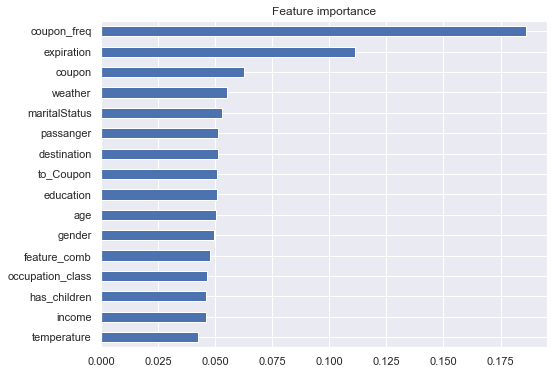

In [348]:
importances = model.feature_importances_
res = pd.Series(importances, index=x.columns).sort_values()
res.plot.barh(figsize=(8, 6), title='Feature importance')

# Pre-Processing

## a) Class Distribution

In [349]:
Y_value_counts = data2.groupby('Accept(Y/N?)')['Accept(Y/N?)'].count()
print('The number of users that are accepted the coupon is ',Y_value_counts[1],',',round(Y_value_counts[1]/data2.shape[0]*100,3),'%')
print('The number of users that are rejected the coupon is ',Y_value_counts[0],',',round(Y_value_counts[0]/data2.shape[0]*100,3),'%')

The number of users that are accepted the coupon is  7210 , 56.843 %
The number of users that are rejected the coupon is  5474 , 43.157 %


* Dataset is partially Balanced.

## b) Duplicate Values Treatment

In [350]:
# Dataset Duplicate Value Count
print(f"The total number of duplicated observations in the data2 : {data2.duplicated().sum()}")
print("*"*100)
dups = data2.duplicated()
print("No of duplicate rows = %d" %(dups.sum()))
data2[dups]

The total number of duplicated observations in the data2 : 291
****************************************************************************************************
No of duplicate rows = 291


,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,education,occupation,income,car,Bar,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
30,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,21,Single,0,Bachelors degree,Architecture & Engineering,$62500 - $74999,NaN,never,less1,4~8,4~8,less1,1,0,0,0,1,0
96,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,21,Single,0,Associates degree,Student,$12500 - $24999,NaN,1~3,less1,1~3,less1,1~3,1,0,0,0,1,1
162,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,26,Single,0,Some college - no degree,Healthcare Support,$37500 - $49999,NaN,gt8,gt8,gt8,gt8,gt8,1,0,0,0,1,0
184,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,26,Single,1,Associates degree,Healthcare Practitioners & Technical,$25000 - $37499,NaN,never,1~3,4~8,1~3,less1,1,0,0,0,1,1
201,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,21,Single,0,Some college - no degree,Sales & Related,$100000 or More,NaN,less1,never,gt8,1~3,less1,1,0,0,0,1,0
395,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Single,0,Bachelors degree,Student,$100000 or More,NaN,1~3,never,1~3,1~3,4~8,1,0,0,0,1,0
460,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,31,Single,1,High School Graduate,Management,$50000 - $62499,NaN,gt8,gt8,gt8,gt8,gt8,1,0,0,0,1,0
481,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,26,Single,0,Some college - no degree,Unemployed,$87500 - $99999,NaN,never,1~3,4~8,less1,never,1,0,0,0,1,1
575,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,31,Single,0,Some college - no degree,Sales & Related,$37500 - $49999,NaN,4~8,gt8,gt8,1~3,less1,1,0,0,0,1,1
597,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Male,26,Single,0,Bachelors degree,Office & Administrative Support,$50000 - $62499,NaN,4~8,never,4~8,1~3,less1,1,0,0,0,1,0


In [351]:
# Remove duplicates
duplicate = data2[data2.duplicated(keep = 'last')]

data2 = data2.drop_duplicates()
print(data2.shape)

(12393, 25)


In [352]:
# Dataset Duplicate Value Count
print(f"The total number of duplicated observations in the dataset: {data2.duplicated().sum()}")

The total number of duplicated observations in the dataset: 0


## c) Dropping Columns

In [353]:
# Missing values
print("Is there any missing value present or not ?", data2.isnull().values.any())
print("**************************************************************************")
print("Number of missing values")
print("-------------------------------------")
missing_values = data2.isnull().sum()
print(missing_values)
print("**************************************************************************")
print("Missing Percentage of Null Values")
print("-------------------------------------")
missing_percentage = data2.isnull().sum()/len(data2)*100
print(missing_percentage.sort_values(ascending=False))

Is there any missing value present or not ? True
**************************************************************************
Number of missing values
-------------------------------------
destination                 0
passanger                   0
weather                     0
temperature                 0
coupon                      0
expiration                  0
gender                      0
age                         0
maritalStatus               0
has_children                0
education                   0
occupation                  0
income                      0
car                     12287
Bar                       106
CoffeeHouse               215
CarryAway                 148
RestaurantLessThan20      128
Restaurant20To50          188
toCoupon_GEQ5min            0
toCoupon_GEQ15min           0
toCoupon_GEQ25min           0
direction_same              0
direction_opp               0
Accept(Y/N?)                0
dtype: int64
**************************************************

In [354]:
missing_value_df = pd.DataFrame({'missing_count': data2.isnull().sum(),'missing_percentage': missing_percentage})
missing_value_df[missing_value_df.missing_count != 0]

,missing_count,missing_percentage
car,12287,99.144678
Bar,106,0.855322
CoffeeHouse,215,1.734850
CarryAway,148,1.194223
RestaurantLessThan20,128,1.032841
Restaurant20To50,188,1.516985


* Variable car has more than 99% missing values, So, we drop this variable.
* Also toCoupon_GEQ5min, direction_same, direction_opp are failed in Hypothesis testing, so we should drop these variables also.

In [355]:
data2.head()

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,education,occupation,income,car,Bar,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
0,No Urgent Place,Alone,Sunny,55,Restaurant(<20),1d,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,NaN,never,never,NaN,4~8,1~3,1,0,0,0,1,1
1,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,NaN,never,never,NaN,4~8,1~3,1,0,0,0,1,0
2,No Urgent Place,Friend(s),Sunny,80,Carry out & Take away,2h,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,NaN,never,never,NaN,4~8,1~3,1,1,0,0,1,1
3,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,NaN,never,never,NaN,4~8,1~3,1,1,0,0,1,0
4,No Urgent Place,Friend(s),Sunny,80,Coffee House,1d,Female,21,Unmarried partner,1,Some college - no degree,Unemployed,$37500 - $49999,NaN,never,never,NaN,4~8,1~3,1,1,0,0,1,0


In [356]:
data2.corr()

,temperature,has_children,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
temperature,1.000000,-0.016963,NaN,-0.141124,-0.230067,0.088885,-0.088885,0.064074
has_children,-0.016963,1.000000,NaN,0.078686,-0.011651,-0.032276,0.032276,-0.044889
toCoupon_GEQ5min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
toCoupon_GEQ15min,-0.141124,0.078686,NaN,1.000000,0.321919,-0.297284,0.297284,-0.086050
toCoupon_GEQ25min,-0.230067,-0.011651,NaN,0.321919,1.000000,-0.190759,0.190759,-0.107855
direction_same,0.088885,-0.032276,NaN,-0.297284,-0.190759,1.000000,-1.000000,0.016356
direction_opp,-0.088885,0.032276,NaN,0.297284,0.190759,-1.000000,1.000000,-0.016356
Accept(Y/N?),0.064074,-0.044889,NaN,-0.086050,-0.107855,0.016356,-0.016356,1.000000


In [357]:
# Dropping unwanted columns
data2 = data2.drop(["car", "toCoupon_GEQ5min", "direction_same", "direction_opp"], axis=1)
print('data2:',data2.shape)
print('-'*50)
print(data2.columns.values)

data2: (12393, 21)
--------------------------------------------------
['destination' 'passanger' 'weather' 'temperature' 'coupon' 'expiration'
 'gender' 'age' 'maritalStatus' 'has_children' 'education' 'occupation'
 'income' 'Bar' 'CoffeeHouse' 'CarryAway' 'RestaurantLessThan20'
 'Restaurant20To50' 'toCoupon_GEQ15min' 'toCoupon_GEQ25min' 'Accept(Y/N?)']


## d ) Splitting The dataset into Independent and Dependent variables

In [358]:
x = data2.drop(["Accept(Y/N?)"], axis=1)
y = data2["Accept(Y/N?)"]

In [359]:
print(x.shape)
print(y.shape)

(12393, 20)
(12393,)


## e) Splitting The Dataset into Train and Test

In [360]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, stratify=y, random_state=101)

print(x_train.shape, y_train.shape)
print(x_test.shape, y_test.shape)

(9294, 20) (9294,)
(3099, 20) (3099,)


In [361]:
print("Class Distribution on data2 :")
print(data2["Accept(Y/N?)"].value_counts()/data2.shape[0]*100)
print("*******************************************")
print(f"Class Distribution on y_train : \n{y_train.value_counts()/y_train.shape[0]*100}")
print("*******************************************")
print(f"Class Distribution on y_test : \n{y_test.value_counts()/y_test.shape[0]*100}")

Class Distribution on data2 :
1    56.580328
0    43.419672
Name: Accept(Y/N?), dtype: float64
*******************************************
Class Distribution on y_train : 
1    56.584893
0    43.415107
Name: Accept(Y/N?), dtype: float64
*******************************************
Class Distribution on y_test : 
1    56.566634
0    43.433366
Name: Accept(Y/N?), dtype: float64


## f) Missing Value Impution

In [362]:
# Checking missing values in data2
# Missing values
print("Is there any missing value present or not ?", data2.isnull().values.any())
print("**************************************************************************")
print("Number of missing values")
print("-------------------------------------")
missing_values = data2.isnull().sum()
print(missing_values)
print("**************************************************************************")
print("Missing Percentage of Null Values")
print("-------------------------------------")
missing_percentage = data2.isnull().sum()/len(data2)*100
print(missing_percentage.sort_values(ascending=False))

print("==========================================================================")
missing_value_df = pd.DataFrame({'missing_count': data2.isnull().sum(),'missing_percentage': missing_percentage})
missing_value_df[missing_value_df.missing_count != 0]

print("==========================================================================")
missing_features = ["Bar", "CoffeeHouse", "CarryAway", "RestaurantLessThan20", "Restaurant20To50"]
for i in data1.columns:
    if i in missing_features:
        print(f"{i} : {data1[i].unique()}")
        print(data1[i].value_counts())
        print(f"most frequent in {i} is : {data1[i].mode()}")
        print("="*100)

Is there any missing value present or not ? True
**************************************************************************
Number of missing values
-------------------------------------
destination               0
passanger                 0
weather                   0
temperature               0
coupon                    0
expiration                0
gender                    0
age                       0
maritalStatus             0
has_children              0
education                 0
occupation                0
income                    0
Bar                     106
CoffeeHouse             215
CarryAway               148
RestaurantLessThan20    128
Restaurant20To50        188
toCoupon_GEQ15min         0
toCoupon_GEQ25min         0
Accept(Y/N?)              0
dtype: int64
**************************************************************************
Missing Percentage of Null Values
-------------------------------------
CoffeeHouse             1.734850
Restaurant20To50        1.516985

In [363]:
# Checking missing values in x_train
# Missing values
print("Is there any missing value present or not ?", x_train.isnull().values.any())
print("**************************************************************************")
print("Number of missing values")
print("-------------------------------------")
missing_values = x_train.isnull().sum()
print(missing_values)
print("**************************************************************************")
print("Missing Percentage of Null Values")
print("-------------------------------------")
missing_percentage = x_train.isnull().sum()/len(x_train)*100
print(missing_percentage.sort_values(ascending=False))

print("==========================================================================")
missing_value_df = pd.DataFrame({'missing_count': x_train.isnull().sum(),'missing_percentage': missing_percentage})
missing_value_df[missing_value_df.missing_count != 0]

print("==========================================================================")
missing_features = ["Bar", "CoffeeHouse", "CarryAway", "RestaurantLessThan20", "Restaurant20To50"]
for i in x_train.columns:
    if i in missing_features:
        print(f"{i} : {x_train[i].unique()}")
        print(x_train[i].value_counts())
        print(f"most frequent in {i} is : {x_train[i].mode()}")
        print("="*100)

Is there any missing value present or not ? True
**************************************************************************
Number of missing values
-------------------------------------
destination               0
passanger                 0
weather                   0
temperature               0
coupon                    0
expiration                0
gender                    0
age                       0
maritalStatus             0
has_children              0
education                 0
occupation                0
income                    0
Bar                      79
CoffeeHouse             172
CarryAway               116
RestaurantLessThan20     94
Restaurant20To50        153
toCoupon_GEQ15min         0
toCoupon_GEQ25min         0
dtype: int64
**************************************************************************
Missing Percentage of Null Values
-------------------------------------
CoffeeHouse             1.850656
Restaurant20To50        1.646223
CarryAway               1.2

In [364]:
# Checking missing values in x_test
# Missing values
print("Is there any missing value present or not ?", x_test.isnull().values.any())
print("**************************************************************************")
print("Number of missing values")
print("-------------------------------------")
missing_values = x_test.isnull().sum()
print(missing_values)
print("**************************************************************************")
print("Missing Percentage of Null Values")
print("-------------------------------------")
missing_percentage = x_test.isnull().sum()/len(x_test)*100
print(missing_percentage.sort_values(ascending=False))

print("==========================================================================")
missing_value_df = pd.DataFrame({'missing_count': x_test.isnull().sum(),'missing_percentage': missing_percentage})
missing_value_df[missing_value_df.missing_count != 0]

print("==========================================================================")
missing_features = ["Bar", "CoffeeHouse", "CarryAway", "RestaurantLessThan20", "Restaurant20To50"]
for i in x_test.columns:
    if i in missing_features:
        print(f"{i} : {x_test[i].unique()}")
        print(x_test[i].value_counts())
        print(f"most frequent in {i} is : {x_test[i].mode()}")
        print("="*100)

Is there any missing value present or not ? True
**************************************************************************
Number of missing values
-------------------------------------
destination              0
passanger                0
weather                  0
temperature              0
coupon                   0
expiration               0
gender                   0
age                      0
maritalStatus            0
has_children             0
education                0
occupation               0
income                   0
Bar                     27
CoffeeHouse             43
CarryAway               32
RestaurantLessThan20    34
Restaurant20To50        35
toCoupon_GEQ15min        0
toCoupon_GEQ25min        0
dtype: int64
**************************************************************************
Missing Percentage of Null Values
-------------------------------------
CoffeeHouse             1.387544
Restaurant20To50        1.129397
RestaurantLessThan20    1.097128
CarryAway     

##### Imputing mode on missing values

In [365]:
# importing SiumpleImputer
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy="most_frequent").set_output(transform="pandas")
x_train = imputer.fit_transform(x_train)
x_test = imputer.transform(x_test)

In [366]:
x_train.head()

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,education,occupation,income,Bar,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ15min,toCoupon_GEQ25min
12521,Work,Alone,Snowy,30,Coffee House,1d,Male,26,Single,1,Some college - no degree,Sales & Related,Less than $12500,never,never,never,1~3,never,0,0
10256,No Urgent Place,Kid(s),Sunny,80,Coffee House,1d,Female,31,Married partner,1,Graduate degree (Masters or Doctorate),Student,$25000 - $37499,never,gt8,4~8,1~3,less1,0,0
11425,Home,Partner,Sunny,30,Restaurant(<20),1d,Male,31,Married partner,0,Some college - no degree,Sales & Related,$50000 - $62499,1~3,1~3,gt8,4~8,1~3,1,1
3009,No Urgent Place,Friend(s),Sunny,80,Restaurant(<20),2h,Female,31,Divorced,1,Some college - no degree,Food Preparation & Serving Related,$12500 - $24999,1~3,never,4~8,less1,less1,1,0
12591,No Urgent Place,Friend(s),Sunny,80,Bar,1d,Female,50plus,Divorced,1,Some college - no degree,Personal Care & Service,$12500 - $24999,never,less1,1~3,1~3,less1,1,0


In [367]:
x_test.head()

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,education,occupation,income,Bar,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ15min,toCoupon_GEQ25min
5719,No Urgent Place,Alone,Sunny,80,Bar,1d,Male,21,Single,0,Some college - no degree,Student,$100000 or More,less1,1~3,1~3,1~3,less1,0,0
8792,No Urgent Place,Partner,Snowy,30,Coffee House,2h,Male,26,Married partner,0,Bachelors degree,Computer & Mathematical,$100000 or More,4~8,less1,1~3,1~3,less1,1,0
3769,Home,Alone,Sunny,55,Bar,1d,Female,41,Married partner,1,Bachelors degree,Management,$62500 - $74999,1~3,4~8,4~8,4~8,1~3,0,0
10208,No Urgent Place,Friend(s),Sunny,30,Carry out & Take away,1d,Female,31,Married partner,0,Some college - no degree,Computer & Mathematical,$100000 or More,less1,less1,gt8,4~8,less1,1,0
6291,Home,Alone,Sunny,80,Coffee House,1d,Female,31,Married partner,0,Some college - no degree,Computer & Mathematical,$100000 or More,less1,less1,gt8,4~8,1~3,0,0


In [368]:
# Checking missing values in x_train
# Missing values
print("Is there any missing value present or not ?", x_train.isnull().values.any())
print("**************************************************************************")
print("Number of missing values")
print("-------------------------------------")
missing_values = x_train.isnull().sum()
print(missing_values)
print("**************************************************************************")
print("Missing Percentage of Null Values")
print("-------------------------------------")
missing_percentage = x_train.isnull().sum()/len(x_train)*100
print(missing_percentage.sort_values(ascending=False))

print("==========================================================================")
missing_value_df = pd.DataFrame({'missing_count': x_train.isnull().sum(),'missing_percentage': missing_percentage})
missing_value_df[missing_value_df.missing_count != 0]

print("==========================================================================")
missing_features = ["Bar", "CoffeeHouse", "CarryAway", "RestaurantLessThan20", "Restaurant20To50"]
for i in x_train.columns:
    if i in missing_features:
        print(f"{i} : {x_train[i].unique()}")
        print(x_train[i].value_counts())
        print(f"most frequent in {i} is : {x_train[i].mode()}")
        print("="*100)

Is there any missing value present or not ? False
**************************************************************************
Number of missing values
-------------------------------------
destination             0
passanger               0
weather                 0
temperature             0
coupon                  0
expiration              0
gender                  0
age                     0
maritalStatus           0
has_children            0
education               0
occupation              0
income                  0
Bar                     0
CoffeeHouse             0
CarryAway               0
RestaurantLessThan20    0
Restaurant20To50        0
toCoupon_GEQ15min       0
toCoupon_GEQ25min       0
dtype: int64
**************************************************************************
Missing Percentage of Null Values
-------------------------------------
destination             0.0
passanger               0.0
toCoupon_GEQ15min       0.0
Restaurant20To50        0.0
RestaurantLessThan20

In [369]:
# Checking missing values in x_test
# Missing values
print("Is there any missing value present or not ?", x_test.isnull().values.any())
print("**************************************************************************")
print("Number of missing values")
print("-------------------------------------")
missing_values = x_test.isnull().sum()
print(missing_values)
print("**************************************************************************")
print("Missing Percentage of Null Values")
print("-------------------------------------")
missing_percentage = x_test.isnull().sum()/len(x_test)*100
print(missing_percentage.sort_values(ascending=False))

print("==========================================================================")
missing_value_df = pd.DataFrame({'missing_count': x_test.isnull().sum(),'missing_percentage': missing_percentage})
missing_value_df[missing_value_df.missing_count != 0]

print("==========================================================================")
missing_features = ["Bar", "CoffeeHouse", "CarryAway", "RestaurantLessThan20", "Restaurant20To50"]
for i in x_test.columns:
    if i in missing_features:
        print(f"{i} : {x_test[i].unique()}")
        print(x_test[i].value_counts())
        print(f"most frequent in {i} is : {x_test[i].mode()}")
        print("="*100)

Is there any missing value present or not ? False
**************************************************************************
Number of missing values
-------------------------------------
destination             0
passanger               0
weather                 0
temperature             0
coupon                  0
expiration              0
gender                  0
age                     0
maritalStatus           0
has_children            0
education               0
occupation              0
income                  0
Bar                     0
CoffeeHouse             0
CarryAway               0
RestaurantLessThan20    0
Restaurant20To50        0
toCoupon_GEQ15min       0
toCoupon_GEQ25min       0
dtype: int64
**************************************************************************
Missing Percentage of Null Values
-------------------------------------
destination             0.0
passanger               0.0
toCoupon_GEQ15min       0.0
Restaurant20To50        0.0
RestaurantLessThan20

In [370]:
for i in x_train.columns:
    print("******************************", i, "******************************************")
    print()
    print(set(x_train[i].tolist()))
    print()

****************************** destination ******************************************

{'Home', 'Work', 'No Urgent Place'}

****************************** passanger ******************************************

{'Friend(s)', 'Kid(s)', 'Alone', 'Partner'}

****************************** weather ******************************************

{'Snowy', 'Rainy', 'Sunny'}

****************************** temperature ******************************************

{80, 30, 55}

****************************** coupon ******************************************

{'Carry out & Take away', 'Restaurant(20-50)', 'Bar', 'Restaurant(<20)', 'Coffee House'}

****************************** expiration ******************************************

{'2h', '1d'}

****************************** gender ******************************************

{'Female', 'Male'}

****************************** age ******************************************

{'50plus', '21', '36', '26', '41', 'below21', '46', '31'}

*********************

In [371]:
for i in x_test.columns:
    print("******************************", i, "******************************************")
    print()
    print(set(x_test[i].tolist()))
    print()

****************************** destination ******************************************

{'Home', 'Work', 'No Urgent Place'}

****************************** passanger ******************************************

{'Friend(s)', 'Kid(s)', 'Alone', 'Partner'}

****************************** weather ******************************************

{'Snowy', 'Rainy', 'Sunny'}

****************************** temperature ******************************************

{80, 30, 55}

****************************** coupon ******************************************

{'Carry out & Take away', 'Restaurant(<20)', 'Bar', 'Restaurant(20-50)', 'Coffee House'}

****************************** expiration ******************************************

{'2h', '1d'}

****************************** gender ******************************************

{'Female', 'Male'}

****************************** age ******************************************

{'50plus', '21', '36', '26', '41', 'below21', '46', '31'}

*********************

## g) Feature Engineering

### g)1) FE -- to_Coupon

In [372]:
# FE -- to_Coupon is combination of two features, toCoupon_GEQ15min and toCoupon_GEQ25min
to_Coupon = []
for i in range(x_train.shape[0]):
    if (list(x_train['toCoupon_GEQ15min'])[i] == 0):
        to_Coupon.append(0)
    elif (list(x_train['toCoupon_GEQ15min'])[i] == 1)and(list(x_train['toCoupon_GEQ25min'])[i] == 0):
        to_Coupon.append(1)
    else:
        to_Coupon.append(2)
        
x_train['to_Coupon'] = to_Coupon
print('Unique values:',x_train['to_Coupon'].unique())
print('-'*50)
x_train['to_Coupon'].describe()

Unique values: [0 2 1]
--------------------------------------------------


count    9294.000000
mean        0.686464
std         0.677406
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         2.000000
Name: to_Coupon, dtype: float64

In [373]:
# FE -- to_Coupon is combination of two features, toCoupon_GEQ15min and toCoupon_GEQ25min
to_Coupon = []
for i in range(x_test.shape[0]):
    if (list(x_test['toCoupon_GEQ15min'])[i] == 0):
        to_Coupon.append(0)
    elif (list(x_test['toCoupon_GEQ15min'])[i] == 1)and(list(x_test['toCoupon_GEQ25min'])[i] == 0):
        to_Coupon.append(1)
    else:
        to_Coupon.append(2)
        
x_test['to_Coupon'] = to_Coupon
print('Unique values:',x_test['to_Coupon'].unique())
print('-'*50)
x_test['to_Coupon'].describe()

Unique values: [0 1 2]
--------------------------------------------------


count    3099.000000
mean        0.667312
std         0.660125
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         2.000000
Name: to_Coupon, dtype: float64

In [374]:
print(data1["to_Coupon"].value_counts())
print("*"*50)
print(x_train["to_Coupon"].value_counts())
print("*"*50)
print(x_test["to_Coupon"].value_counts())

1    5522
0    5408
2    1463
Name: to_Coupon, dtype: int64
**************************************************
1    4116
0    4046
2    1132
Name: to_Coupon, dtype: int64
**************************************************
1    1406
0    1362
2     331
Name: to_Coupon, dtype: int64


### g)2) FE -- coupon_freq

In [375]:
# FE -- coupon_freq is combination of five features, RestaurantLessThan20, CoffeeHouse, CarryAway, Bar, Restaurant20To50
coupon_freq = []
for i in range(x_train.shape[0]):
    if (list(x_train['coupon'])[i] == 'Restaurant(<20)'):
        coupon_freq.append(list(x_train['RestaurantLessThan20'])[i])
    elif (list(x_train['coupon'])[i] == 'Coffee House'):
        coupon_freq.append(list(x_train['CoffeeHouse'])[i])
    elif (list(x_train['coupon'])[i] == 'Carry out & Take away'):
        coupon_freq.append(list(x_train['CarryAway'])[i])
    elif (list(x_train['coupon'])[i] == 'Bar'):
        coupon_freq.append(list(x_train['Bar'])[i])
    elif (list(x_train['coupon'])[i] == 'Restaurant(20-50)'):
        coupon_freq.append(list(x_train['Restaurant20To50'])[i])
        
x_train['coupon_freq'] = coupon_freq
print('Unique values:',x_train['coupon_freq'].unique())
print('-'*50)
x_train['coupon_freq'].describe()

Unique values: ['never' 'gt8' '4~8' 'less1' '1~3']
--------------------------------------------------


count     9294
unique       5
top        1~3
freq      2896
Name: coupon_freq, dtype: object

In [376]:
# FE -- coupon_freq is combination of five features, RestaurantLessThan20, CoffeeHouse, CarryAway, Bar, Restaurant20To50
coupon_freq = []
for i in range(x_test.shape[0]):
    if (list(x_test['coupon'])[i] == 'Restaurant(<20)'):
        coupon_freq.append(list(x_test['RestaurantLessThan20'])[i])
    elif (list(x_test['coupon'])[i] == 'Coffee House'):
        coupon_freq.append(list(x_test['CoffeeHouse'])[i])
    elif (list(x_test['coupon'])[i] == 'Carry out & Take away'):
        coupon_freq.append(list(x_test['CarryAway'])[i])
    elif (list(x_test['coupon'])[i] == 'Bar'):
        coupon_freq.append(list(x_test['Bar'])[i])
    elif (list(x_test['coupon'])[i] == 'Restaurant(20-50)'):
        coupon_freq.append(list(x_test['Restaurant20To50'])[i])
        
x_test['coupon_freq'] = coupon_freq
print('Unique values:',x_test['coupon_freq'].unique())
print('-'*50)
x_test['coupon_freq'].describe()

Unique values: ['less1' '1~3' 'gt8' '4~8' 'never']
--------------------------------------------------


count     3099
unique       5
top        1~3
freq       890
Name: coupon_freq, dtype: object

In [377]:
print(data1["coupon_freq"].value_counts())
print("*"*50)
print(x_train["coupon_freq"].value_counts())
print("*"*50)
print(x_test["coupon_freq"].value_counts())

1~3      3786
less1    3227
4~8      2333
never    2074
gt8       973
Name: coupon_freq, dtype: int64
**************************************************
1~3      2896
less1    2361
4~8      1715
never    1578
gt8       744
Name: coupon_freq, dtype: int64
**************************************************
1~3      890
less1    866
4~8      618
never    496
gt8      229
Name: coupon_freq, dtype: int64


### g)3) FE -- occupation_class 

In [378]:
x_train['occupation'].describe()

count           9294
unique            25
top       Unemployed
freq            1381
Name: occupation, dtype: object

In [379]:
# occupation feature has 25 no of distinct values, which creates very sparsity in data after Encoding
# FE -- occupation_class where categorize all occupation in its suitable class.
occupation_dict = {'Healthcare Support':'High_Acceptance','Construction & Extraction':'High_Acceptance','Healthcare Practitioners & Technical':'High_Acceptance',
                   'Protective Service':'High_Acceptance','Architecture & Engineering':'High_Acceptance','Production Occupations':'Medium_High_Acceptance',
                    'Student':'Medium_High_Acceptance','Office & Administrative Support':'Medium_High_Acceptance','Transportation & Material Moving':'Medium_High_Acceptance',
                    'Building & Grounds Cleaning & Maintenance':'Medium_High_Acceptance','Management':'Medium_Acceptance','Food Preparation & Serving Related':'Medium_Acceptance',
                   'Life Physical Social Science':'Medium_Acceptance','Business & Financial':'Medium_Acceptance','Computer & Mathematical':'Medium_Acceptance',
                    'Sales & Related':'Medium_Low_Acceptance','Personal Care & Service':'Medium_Low_Acceptance','Unemployed':'Medium_Low_Acceptance',
                   'Farming Fishing & Forestry':'Medium_Low_Acceptance','Installation Maintenance & Repair':'Medium_Low_Acceptance','Education&Training&Library':'Low_Acceptance',
                    'Arts Design Entertainment Sports & Media':'Low_Acceptance','Community & Social Services':'Low_Acceptance','Legal':'Low_Acceptance','Retired':'Low_Acceptance'}
# occupation_dict
x_train['occupation_class'] = x_train['occupation'].map(occupation_dict)
print('Unique values:',x_train['occupation_class'].unique())
print('-'*50)
print(x_train['occupation_class'].describe())
print(x_train['occupation_class'].value_counts())

Unique values: ['Medium_Low_Acceptance' 'Medium_High_Acceptance' 'Medium_Acceptance'
 'Low_Acceptance' 'High_Acceptance']
--------------------------------------------------
count                      9294
unique                        5
top       Medium_Low_Acceptance
freq                       2466
Name: occupation_class, dtype: object
Medium_Low_Acceptance     2466
Medium_Acceptance         2366
Medium_High_Acceptance    1906
Low_Acceptance            1816
High_Acceptance            740
Name: occupation_class, dtype: int64


In [380]:

x_test['occupation'].describe()

count           3099
unique            25
top       Unemployed
freq             447
Name: occupation, dtype: object

In [381]:
# occupation feature has 25 no of distinct values, which creates very sparsity in data after Encoding
# FE -- occupation_class where categorize all occupation in its suitable class.
occupation_dict = {'Healthcare Support':'High_Acceptance','Construction & Extraction':'High_Acceptance','Healthcare Practitioners & Technical':'High_Acceptance',
                   'Protective Service':'High_Acceptance','Architecture & Engineering':'High_Acceptance','Production Occupations':'Medium_High_Acceptance',
                    'Student':'Medium_High_Acceptance','Office & Administrative Support':'Medium_High_Acceptance','Transportation & Material Moving':'Medium_High_Acceptance',
                    'Building & Grounds Cleaning & Maintenance':'Medium_High_Acceptance','Management':'Medium_Acceptance','Food Preparation & Serving Related':'Medium_Acceptance',
                   'Life Physical Social Science':'Medium_Acceptance','Business & Financial':'Medium_Acceptance','Computer & Mathematical':'Medium_Acceptance',
                    'Sales & Related':'Medium_Low_Acceptance','Personal Care & Service':'Medium_Low_Acceptance','Unemployed':'Medium_Low_Acceptance',
                   'Farming Fishing & Forestry':'Medium_Low_Acceptance','Installation Maintenance & Repair':'Medium_Low_Acceptance','Education&Training&Library':'Low_Acceptance',
                    'Arts Design Entertainment Sports & Media':'Low_Acceptance','Community & Social Services':'Low_Acceptance','Legal':'Low_Acceptance','Retired':'Low_Acceptance'}
# occupation_dict
x_test['occupation_class'] = x_test['occupation'].map(occupation_dict)
print('Unique values:',x_test['occupation_class'].unique())
print('-'*50)
print(x_test['occupation_class'].describe())
print(x_test['occupation_class'].value_counts())

Unique values: ['Medium_High_Acceptance' 'Medium_Acceptance' 'Medium_Low_Acceptance'
 'Low_Acceptance' 'High_Acceptance']
--------------------------------------------------
count                  3099
unique                    5
top       Medium_Acceptance
freq                    797
Name: occupation_class, dtype: object
Medium_Acceptance         797
Medium_Low_Acceptance     770
Low_Acceptance            665
Medium_High_Acceptance    639
High_Acceptance           228
Name: occupation_class, dtype: int64


In [382]:
# After Feature Engineering, removing unwanted features
x_train = x_train.drop(['toCoupon_GEQ15min','toCoupon_GEQ25min','Bar','CoffeeHouse','CarryAway','RestaurantLessThan20','Restaurant20To50','occupation'], axis=1)
x_test = x_test.drop(['toCoupon_GEQ15min','toCoupon_GEQ25min','Bar','CoffeeHouse','CarryAway','RestaurantLessThan20','Restaurant20To50','occupation'], axis=1)
print('x_train:',x_train.shape,'x_test:',x_test.shape)
print('-'*50)
print(x_train.columns.values)

x_train: (9294, 15) x_test: (3099, 15)
--------------------------------------------------
['destination' 'passanger' 'weather' 'temperature' 'coupon' 'expiration'
 'gender' 'age' 'maritalStatus' 'has_children' 'education' 'income'
 'to_Coupon' 'coupon_freq' 'occupation_class']


## h) Data Encoding

### h)1)One Hot Encoding
* In one hot encoding, converting each category into ‘d’ dimensional features that contain 0 and 1 which denoting the presence or absence of the feature. Here d is the number of unique categories in the feature.

* This encoding method produces many columns that slow down the learning significantly if the number of the category is very high in the feature. The One-Hot Encoding is specifically done for training data to avoid data leakage issues. We do not include test data in it because test data is unseen to us. So, if any category appears new while testing, we will ignore that value while converting to the One-Hot encoded form.

In [383]:
# Applying one hot encoder on object type variables
from sklearn.preprocessing import OneHotEncoder

ohe = OneHotEncoder(drop="first", sparse_output=False).set_output(transform="pandas")
x_train_ohe = ohe.fit_transform(x_train)
x_test_ohe = ohe.transform(x_test)


In [384]:
data.columns

Index(['destination', 'passanger', 'weather', 'temperature', 'coupon',
       'expiration', 'gender', 'age', 'maritalStatus', 'has_children',
       'education', 'occupation', 'income', 'car', 'Bar', 'CoffeeHouse',
       'CarryAway', 'RestaurantLessThan20', 'Restaurant20To50',
       'toCoupon_GEQ5min', 'toCoupon_GEQ15min', 'toCoupon_GEQ25min',
       'direction_same', 'direction_opp', 'Accept(Y/N?)'],
      dtype='object')

In [385]:
x_train_ohe.head()

,destination_No Urgent Place,destination_Work,passanger_Friend(s),passanger_Kid(s),passanger_Partner,weather_Snowy,weather_Sunny,temperature_55,temperature_80,coupon_Carry out & Take away,coupon_Coffee House,coupon_Restaurant(20-50),coupon_Restaurant(<20),expiration_2h,gender_Male,age_26,age_31,age_36,age_41,age_46,age_50plus,age_below21,maritalStatus_Married partner,maritalStatus_Single,maritalStatus_Unmarried partner,maritalStatus_Widowed,has_children_1,education_Bachelors degree,education_Graduate degree (Masters or Doctorate),education_High School Graduate,education_Some High School,education_Some college - no degree,income_$12500 - $24999,income_$25000 - $37499,income_$37500 - $49999,income_$50000 - $62499,income_$62500 - $74999,income_$75000 - $87499,income_$87500 - $99999,income_Less than $12500,to_Coupon_1,to_Coupon_2,coupon_freq_4~8,coupon_freq_gt8,coupon_freq_less1,coupon_freq_never,occupation_class_Low_Acceptance,occupation_class_Medium_Acceptance,occupation_class_Medium_High_Acceptance,occupation_class_Medium_Low_Acceptance
12521,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
10256,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
11425,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3009,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
12591,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0


In [386]:
x_test_ohe.head()

,destination_No Urgent Place,destination_Work,passanger_Friend(s),passanger_Kid(s),passanger_Partner,weather_Snowy,weather_Sunny,temperature_55,temperature_80,coupon_Carry out & Take away,coupon_Coffee House,coupon_Restaurant(20-50),coupon_Restaurant(<20),expiration_2h,gender_Male,age_26,age_31,age_36,age_41,age_46,age_50plus,age_below21,maritalStatus_Married partner,maritalStatus_Single,maritalStatus_Unmarried partner,maritalStatus_Widowed,has_children_1,education_Bachelors degree,education_Graduate degree (Masters or Doctorate),education_High School Graduate,education_Some High School,education_Some college - no degree,income_$12500 - $24999,income_$25000 - $37499,income_$37500 - $49999,income_$50000 - $62499,income_$62500 - $74999,income_$75000 - $87499,income_$87500 - $99999,income_Less than $12500,to_Coupon_1,to_Coupon_2,coupon_freq_4~8,coupon_freq_gt8,coupon_freq_less1,coupon_freq_never,occupation_class_Low_Acceptance,occupation_class_Medium_Acceptance,occupation_class_Medium_High_Acceptance,occupation_class_Medium_Low_Acceptance
5719,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
8792,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
3769,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
10208,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
6291,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0


In [387]:
print(x_train_ohe.shape, x_test_ohe.shape)


(9294, 50) (3099, 50)


### h)2) Ordinal Encoding
* In this encoding, each category is assigned a value from 0 to N -1(where N is the number of unique categories in the feature). In this dataset, some features have ordinal variables for those we choose ordinal order, and some features have no connection or order between variables so for them we choose the order of acceptance ratio in acceding order.


In [388]:
order = [['Work','Home','No Urgent Place'],['Kid(s)','Alone','Partner','Friend(s)'],['Snowy','Rainy','Sunny'],[30,55,80],
         ['Bar','Restaurant(20-50)','Coffee House','Restaurant(<20)','Carry out & Take away'],['2h','1d'],['Female','Male'],['below21','21','26','31','36','41','46','50plus'],
         ['Widowed','Divorced','Married partner','Unmarried partner','Single'],[0,1],
         ['Some High School','High School Graduate','Some college - no degree','Associates degree','Bachelors degree','Graduate degree (Masters or Doctorate)'],
         ['Less than $12500','$12500 - $24999','$25000 - $37499','$37500 - $49999','$50000 - $62499','$62500 - $74999','$75000 - $87499','$87500 - $99999','$100000 or More'],
         [0,1,2],
         ['never','less1','1~3','gt8','4~8'],['Low_Acceptance','Medium_Low_Acceptance','Medium_Acceptance','Medium_High_Acceptance','High_Acceptance']]

# Applying Ordinal encoder on object type variables
from sklearn.preprocessing import OrdinalEncoder

ordinal = OrdinalEncoder(categories=order).set_output(transform="pandas")
x_train_ordinal = ordinal.fit_transform(x_train)
x_test_ordinal = ordinal.transform(x_test)


In [389]:
x_train.head()

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,education,income,to_Coupon,coupon_freq,occupation_class
12521,Work,Alone,Snowy,30,Coffee House,1d,Male,26,Single,1,Some college - no degree,Less than $12500,0,never,Medium_Low_Acceptance
10256,No Urgent Place,Kid(s),Sunny,80,Coffee House,1d,Female,31,Married partner,1,Graduate degree (Masters or Doctorate),$25000 - $37499,0,gt8,Medium_High_Acceptance
11425,Home,Partner,Sunny,30,Restaurant(<20),1d,Male,31,Married partner,0,Some college - no degree,$50000 - $62499,2,4~8,Medium_Low_Acceptance
3009,No Urgent Place,Friend(s),Sunny,80,Restaurant(<20),2h,Female,31,Divorced,1,Some college - no degree,$12500 - $24999,1,less1,Medium_Acceptance
12591,No Urgent Place,Friend(s),Sunny,80,Bar,1d,Female,50plus,Divorced,1,Some college - no degree,$12500 - $24999,1,never,Medium_Low_Acceptance


In [390]:
x_train_ordinal.head()

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,education,income,to_Coupon,coupon_freq,occupation_class
12521,0.0,1.0,0.0,0.0,2.0,1.0,1.0,2.0,4.0,1.0,2.0,0.0,0.0,0.0,1.0
10256,2.0,0.0,2.0,2.0,2.0,1.0,0.0,3.0,2.0,1.0,5.0,2.0,0.0,3.0,3.0
11425,1.0,2.0,2.0,0.0,3.0,1.0,1.0,3.0,2.0,0.0,2.0,4.0,2.0,4.0,1.0
3009,2.0,3.0,2.0,2.0,3.0,0.0,0.0,3.0,1.0,1.0,2.0,1.0,1.0,1.0,2.0
12591,2.0,3.0,2.0,2.0,0.0,1.0,0.0,7.0,1.0,1.0,2.0,1.0,1.0,0.0,1.0


### h)3) OneHot+Ordinal Encoding


In [391]:
x_train_ohe_ord = x_train.copy()
x_test_ohe_ord = x_test.copy()

In [392]:
check_features = ["temperature", "age", "income"]
for i in x_train_ohe_ord.columns:
    if i in check_features:
        print(f"{i} : {x_train_ohe_ord[i].unique()}")
        print(x_train_ohe_ord[i].value_counts())
#         print(f"most frequent in {i} is : {x_test[i].mode()}")
        print("="*100)

temperature : [30 80 55]
80    4716
55    2918
30    1660
Name: temperature, dtype: int64
age : ['26' '31' '50plus' '36' '21' '46' 'below21' '41']
21         1976
26         1880
31         1480
50plus     1298
36          976
41          787
46          487
below21     410
Name: age, dtype: int64
income : ['Less than $12500' '$25000 - $37499' '$50000 - $62499' '$12500 - $24999'
 '$62500 - $74999' '$75000 - $87499' '$100000 or More' '$37500 - $49999'
 '$87500 - $99999']
$25000 - $37499     1451
$12500 - $24999     1362
$37500 - $49999     1310
$100000 or More     1294
$50000 - $62499     1225
Less than $12500     750
$87500 - $99999      645
$75000 - $87499      630
$62500 - $74999      627
Name: income, dtype: int64


In [393]:
check_features = ["temperature", "age", "income"]
for i in x_test_ohe_ord.columns:
    if i in check_features:
        print(f"{i} : {x_test_ohe_ord[i].unique()}")
        print(x_test_ohe_ord[i].value_counts())
#         print(f"most frequent in {i} is : {x_test[i].mode()}")
        print("="*100)

temperature : [80 30 55]
80    1612
55     910
30     577
Name: temperature, dtype: int64
age : ['21' '26' '41' '31' '50plus' '36' 'below21' '46']
21         622
26         606
31         504
50plus     458
36         317
41         292
46         173
below21    127
Name: age, dtype: int64
income : ['$100000 or More' '$62500 - $74999' '$12500 - $24999' '$37500 - $49999'
 '$75000 - $87499' '$50000 - $62499' '$87500 - $99999' 'Less than $12500'
 '$25000 - $37499']
$25000 - $37499     521
$37500 - $49999     450
$12500 - $24999     433
$50000 - $62499     399
$100000 or More     394
Less than $12500    263
$87500 - $99999     220
$75000 - $87499     214
$62500 - $74999     205
Name: income, dtype: int64


In [394]:
d_temp = {30:0, 55:1, 80:2}    
x_train_ohe_ord.temperature = x_train_ohe_ord.temperature.map(d_temp)


income_map = {'Less than $12500': 0,
              '$12500 - $24999':1,
              '$25000 - $37499':2,
              '$37500 - $49999':3,
              '$50000 - $62499':4,
              '$62500 - $74999':5,'$75000 - $87499':6,
              '$87500 - $99999':7,
              '$100000 or More': 8}

x_train_ohe_ord.income = x_train_ohe_ord.income.map(income_map)



age_map = {'below21': 0,
           '21': 1,
           '26': 2,
           '31': 3,
           '36': 4,
           '41': 5,
           '46': 6,
           '50plus': 7}
x_train_ohe_ord.age = x_train_ohe_ord.age.map(age_map)

In [395]:
d_temp = {30:0, 55:1, 80:2}    
x_test_ohe_ord.temperature = x_test_ohe_ord.temperature.map(d_temp)


income_map = {'Less than $12500': 0,
              '$12500 - $24999':1,
              '$25000 - $37499':2,
              '$37500 - $49999':3,
              '$50000 - $62499':4,
              '$62500 - $74999':5,'$75000 - $87499':6,
              '$87500 - $99999':7,
              '$100000 or More': 8}

x_test_ohe_ord.income = x_test_ohe_ord.income.map(income_map)



age_map = {'below21': 0,
           '21': 1,
           '26': 2,
           '31': 3,
           '36': 4,
           '41': 5,
           '46': 6,
           '50plus': 7}
x_test_ohe_ord.age = x_test_ohe_ord.age.map(age_map)

In [396]:
check_features = ["temperature", "age", "income"]
for i in x_train_ohe_ord.columns:
    if i in check_features:
        print(f"{i} : {x_train_ohe_ord[i].unique()}")
        print(x_train_ohe_ord[i].value_counts())
#         print(f"most frequent in {i} is : {x_test[i].mode()}")
        print("="*100)

temperature : [0 2 1]
2    4716
1    2918
0    1660
Name: temperature, dtype: int64
age : [2 3 7 4 1 6 0 5]
1    1976
2    1880
3    1480
7    1298
4     976
5     787
6     487
0     410
Name: age, dtype: int64
income : [0 2 4 1 5 6 8 3 7]
2    1451
1    1362
3    1310
8    1294
4    1225
0     750
7     645
6     630
5     627
Name: income, dtype: int64


In [397]:
check_features = ["temperature", "age", "income"]
for i in x_test_ohe_ord.columns:
    if i in check_features:
        print(f"{i} : {x_test_ohe_ord[i].unique()}")
        print(x_test_ohe_ord[i].value_counts())
#         print(f"most frequent in {i} is : {x_test[i].mode()}")
        print("="*100)

temperature : [2 0 1]
2    1612
1     910
0     577
Name: temperature, dtype: int64
age : [1 2 5 3 7 4 0 6]
1    622
2    606
3    504
7    458
4    317
5    292
6    173
0    127
Name: age, dtype: int64
income : [8 5 1 3 6 4 7 0 2]
2    521
3    450
1    433
4    399
8    394
0    263
7    220
6    214
5    205
Name: income, dtype: int64


In [398]:
x_train_ohe_ord.head()

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,education,income,to_Coupon,coupon_freq,occupation_class
12521,Work,Alone,Snowy,0,Coffee House,1d,Male,2,Single,1,Some college - no degree,0,0,never,Medium_Low_Acceptance
10256,No Urgent Place,Kid(s),Sunny,2,Coffee House,1d,Female,3,Married partner,1,Graduate degree (Masters or Doctorate),2,0,gt8,Medium_High_Acceptance
11425,Home,Partner,Sunny,0,Restaurant(<20),1d,Male,3,Married partner,0,Some college - no degree,4,2,4~8,Medium_Low_Acceptance
3009,No Urgent Place,Friend(s),Sunny,2,Restaurant(<20),2h,Female,3,Divorced,1,Some college - no degree,1,1,less1,Medium_Acceptance
12591,No Urgent Place,Friend(s),Sunny,2,Bar,1d,Female,7,Divorced,1,Some college - no degree,1,1,never,Medium_Low_Acceptance


In [399]:
ohe_cols_train = x_train_ohe_ord.dtypes[x_train_ohe_ord.dtypes==object].index.values
ohe_cols_train

array(['destination', 'passanger', 'weather', 'coupon', 'expiration',
       'gender', 'maritalStatus', 'has_children', 'education',
       'coupon_freq', 'occupation_class'], dtype=object)

In [400]:
# Applying one hot encoder on object type variables
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

ohe_cols_train = x_train.dtypes[x_train.dtypes==object].index.values

encoder = OneHotEncoder(drop="first", sparse_output=False)

ohe = ColumnTransformer(
    transformers=[("ohe", encoder, ohe_cols_train),],
    remainder="passthrough",
)
ohe.set_output(transform="pandas")
x_train_ohe_ord = ohe.fit_transform(x_train_ohe_ord)
x_test_ohe_ord = ohe.transform(x_test_ohe_ord)


In [401]:
x_train_ohe_ord.head()

,ohe1__destination_No Urgent Place,ohe1__destination_Work,ohe1__passanger_Friend(s),ohe1__passanger_Kid(s),ohe1__passanger_Partner,ohe1__weather_Snowy,ohe1__weather_Sunny,ohe1__coupon_Carry out & Take away,ohe1__coupon_Coffee House,ohe1__coupon_Restaurant(20-50),ohe1__coupon_Restaurant(<20),ohe1__expiration_2h,ohe1__gender_Male,ohe1__maritalStatus_Married partner,ohe1__maritalStatus_Single,ohe1__maritalStatus_Unmarried partner,ohe1__maritalStatus_Widowed,ohe1__has_children_1,ohe1__education_Bachelors degree,ohe1__education_Graduate degree (Masters or Doctorate),ohe1__education_High School Graduate,ohe1__education_Some High School,ohe1__education_Some college - no degree,ohe1__coupon_freq_4~8,ohe1__coupon_freq_gt8,ohe1__coupon_freq_less1,ohe1__coupon_freq_never,ohe1__occupation_class_Low_Acceptance,ohe1__occupation_class_Medium_Acceptance,ohe1__occupation_class_Medium_High_Acceptance,ohe1__occupation_class_Medium_Low_Acceptance,remainder__temperature,remainder__age,remainder__income,remainder__to_Coupon
12521,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0,2,0,0
10256,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,2,3,2,0
11425,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,3,4,2
3009,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,2,3,1,1
12591,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2,7,1,1


In [402]:
x_test_ohe_ord.head()

,ohe1__destination_No Urgent Place,ohe1__destination_Work,ohe1__passanger_Friend(s),ohe1__passanger_Kid(s),ohe1__passanger_Partner,ohe1__weather_Snowy,ohe1__weather_Sunny,ohe1__coupon_Carry out & Take away,ohe1__coupon_Coffee House,ohe1__coupon_Restaurant(20-50),ohe1__coupon_Restaurant(<20),ohe1__expiration_2h,ohe1__gender_Male,ohe1__maritalStatus_Married partner,ohe1__maritalStatus_Single,ohe1__maritalStatus_Unmarried partner,ohe1__maritalStatus_Widowed,ohe1__has_children_1,ohe1__education_Bachelors degree,ohe1__education_Graduate degree (Masters or Doctorate),ohe1__education_High School Graduate,ohe1__education_Some High School,ohe1__education_Some college - no degree,ohe1__coupon_freq_4~8,ohe1__coupon_freq_gt8,ohe1__coupon_freq_less1,ohe1__coupon_freq_never,ohe1__occupation_class_Low_Acceptance,ohe1__occupation_class_Medium_Acceptance,ohe1__occupation_class_Medium_High_Acceptance,ohe1__occupation_class_Medium_Low_Acceptance,remainder__temperature,remainder__age,remainder__income,remainder__to_Coupon
5719,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,2,1,8,0
8792,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0,2,8,1
3769,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1,5,5,0
10208,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0,3,8,1
6291,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,2,3,8,0


# ML Model Implementation

In [403]:
# Defining a function to train the input model and print evaluation matrics such as classification report, confusion matrix and AUC-ROC curve in visualize format
def analyse_model(model, x_train, x_test, y_train, y_test):
    
    '''Takes classifier model, train-set and test-set as input and prints the evaluation matrices in visualize format and returns the model'''

    # Fitting the model
    model.fit(x_train,y_train)

    # Finding best parameters
    try:
        print(f"The best parameters are: {model.best_params_}")
    except:
        pass

    # Plotting Evaluation Metrics for train and test dataset
    for x, act, label in ((x_train, y_train, 'Train-Set'),(x_test, y_test, "Test-Set")):
        
        # Getting required metrics
        pred = model.predict(x)
        pred_proba = model.predict_proba(x)[:,1]
        report = pd.DataFrame(classification_report(y_pred=pred, y_true=act, output_dict=True))
        fpr, tpr, thresholds = roc_curve(act, pred_proba)

        # Classification report
        plt.figure(figsize=(18,3))
        plt.subplot(1,3,1)
        sns.heatmap(report.iloc[:-1, :-2].T, annot=True, cmap=sns.color_palette("crest", as_cmap=True),fmt=".2f",annot_kws={"fontsize":14, "fontweight":"bold"},linewidths=1.0)
        plt.title(f'{label} Classification Report')

        # Confusion Matrix
        plt.subplot(1,3,2)
        matrix= confusion_matrix(y_true=act, y_pred=pred)
        sns.heatmap(matrix, annot=True, cmap=sns.color_palette("flare", as_cmap=True),fmt=".2f", annot_kws={"fontsize":14, "fontweight":"bold"},linewidths=1.0)
        plt.title(f'{label} Confusion Matrix')
        plt.xlabel('Predicted labels')
        plt.ylabel('Actual labels')
    
        # AUC_ROC Curve
        plt.subplot(1,3,3)
        plt.plot([0,1],[0,1],'k--')
        plt.plot(fpr,tpr,label=f'AUC = {np.round(np.trapz(tpr,fpr),3)}')
        plt.legend(loc=4)
        plt.title(f'{label} AUC_ROC Curve')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.tight_layout()
        

    plt.show()

    return model

## 1) ML Model - 1 Logistic Regression

### 1. Explain the ML Model and it's performance using Evaluation metric Score Chart.

In [350]:
y_pred_test = []
for i in range(len(y_test)):
    r = np.random.random()
    if r<0.5:
        y_pred_test.append(0)
    else:
        y_pred_test.append(1)

print("log_loss on Test Data using Random Model is",log_loss(y_test,y_pred_test))
print("roc_auc_score on Test Data using Random Model is",roc_auc_score(y_test,y_pred_test))

log_loss on Test Data using Random Model is 18.213733852003053
roc_auc_score on Test Data using Random Model is 0.4944313251153404


## 2) ML Model - 1 Logistic Regression

### 1. Explain the ML Model and it's performance using Evaluation metric Score Chart.

In [351]:
#### on ohe

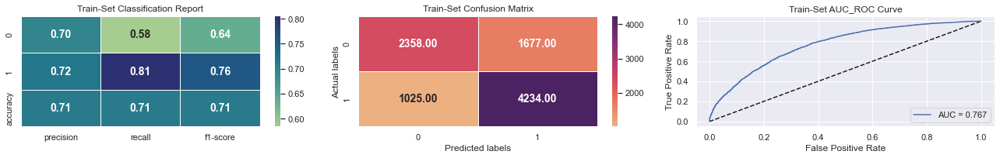

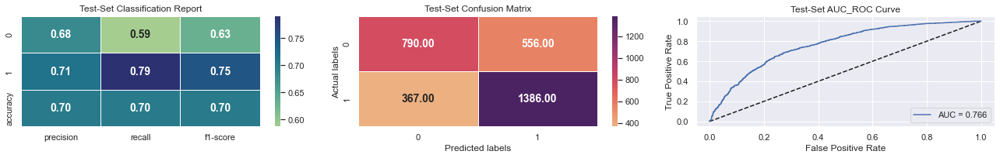

LogisticRegression(random_state=0)

In [352]:
# Importing LogisticRegression from sklearn
from sklearn.linear_model import LogisticRegression

# Fitting Logistic Regression Model and Visualizing evaluation Metric Score chart
logistic_classifier_ohe = LogisticRegression(fit_intercept=True, penalty='l2',random_state=0)
analyse_model(logistic_classifier_ohe, x_train_ohe, x_test_ohe, y_train, y_test)

In [ ]:
final_function_2(x_test_ohe, y_test)

The best parameters are: {'solver': 'liblinear', 'penalty': 'l2', 'n_jobs': -1, 'multi_class': 'ovr', 'max_iter': 3961, 'fit_intercept': False, 'dual': False, 'C': 0.1}


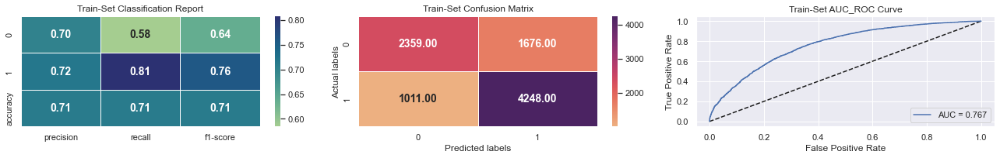

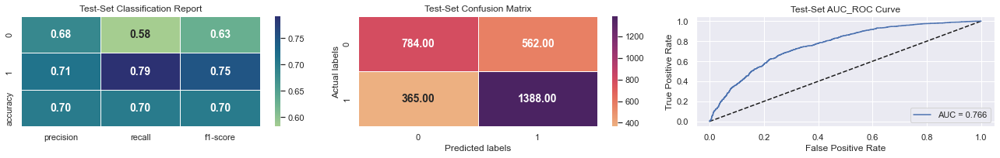

RandomizedSearchCV(cv=5, estimator=LogisticRegression(random_state=0),
                   param_distributions={'C': [0.01, 0.1, 1, 10, 100, 500],
                                        'dual': [True, False],
                                        'fit_intercept': [True, False],
                                        'max_iter': [1, 11, 21, 31, 41, 51, 61,
                                                     71, 81, 91, 101, 111, 121,
                                                     131, 141, 151, 161, 171,
                                                     181, 191, 201, 211, 221,
                                                     231, 241, 251, 261, 271,
                                                     281, 291, ...],
                                        'multi_class': ['auto', 'ovr',
                                                        'multinomial'],
                                        'n_jobs': [-1],
                                        'penalty': ['l1', 'l2', 'elasticnet',
                                                    None],
                                        'solver': ['newton-cg', 'lbfgs',
                                                   'liblinear', 'sag',
                                                   'saga']},
                   scoring='precision')

In [353]:
# Importing GridSearchCV from sklearn
from sklearn.model_selection import RandomizedSearchCV



# Defining parameters
parameters = {'C':[0.01, 0.1, 1, 10, 100, 500],
             "penalty" : ["l1", "l2", "elasticnet", None],
             "dual" : [True, False],
             "solver" : ["newton-cg", "lbfgs", "liblinear", "sag", "saga"],
             "max_iter" : [i for i in range(1,5000,10)],
             "fit_intercept" : [True, False],
             "multi_class" : ["auto", "ovr", "multinomial"], "n_jobs" : [-1]}

# Fitting LogisticRegression Model with GridSearchCV
LR_grid_classifier_ohe = RandomizedSearchCV(logistic_classifier_ohe, parameters, scoring = 'precision', cv=5)

# Analysing the model
analyse_model(LR_grid_classifier_ohe, x_train_ohe, x_test_ohe, y_train, y_test)

In [354]:
# # Importing GridSearchCV from sklearn
# from sklearn.model_selection import GridSearchCV

# # # Defining classifier instance
# # classifier= LogisticRegression(random_state=0)

# # Defining parameters
# grid_values = {"penalty" : ["l1", "l2", "elasticnet", None], 
#                'C':[0.01, 0.1, 1, 10, 100, 500],
#                "dual" : [True, False],
#                "solver" : ["newton-cg", "lbfgs", "liblinear", "sag", "saga"], 
#                "max_iter" : [i for i in range(100,5000,10)],
#                "fit_intercept" : [True, False],
#               "multi_class" : ["auto", "ovr", "multinomial"], "n_jobs" : [-1]} 

# # Fitting RandomForestClassifier Model with GridSearchCV
# LR_grid_classifier_ohe1 = GridSearchCV(logistic_classifier_ohe, param_grid = grid_values, scoring = 'precision', cv=5)

# # Analysing the model
# analyse_model(LR_grid_classifier_ohe1, x_train_ohe, x_test_ohe, y_train, y_test)

Confusion matrix (train)
[[2359 1676]
 [1025 4234]]
********************************************************************
Confusion matrix (test)
[[ 790  556]
 [ 364 1389]]
**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       0.70      0.58      0.64      4035
           1       0.72      0.81      0.76      5259

    accuracy                           0.71      9294
   macro avg       0.71      0.69      0.70      9294
weighted avg       0.71      0.71      0.71      9294

**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       0.68      0.59      0.63      1346
           1       0.71      0.79      0.75      1753

    accuracy                           0.70      3099
   macro avg       0.70      0.69      0.69      3099
weighted avg       0.70      0

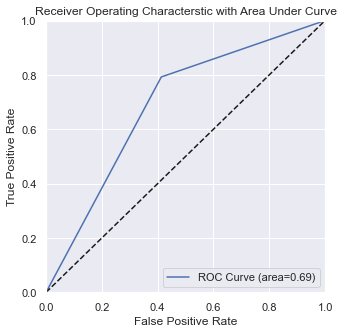

In [354]:
from sklearn.linear_model import LogisticRegression

logit_model = LogisticRegression(solver='newton-cg', penalty='l2', n_jobs=-1, multi_class='multinomial', max_iter=1761, fit_intercept=True, dual=False, C=500)
logit_model.fit(x_train_ohe, y_train)

# Predict Result
y_predict_train = logit_model.predict(x_train_ohe)
y_predict_test = logit_model.predict(x_test_ohe)


# Evalution after hyperparameter tuning
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("********************************************************************")
print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("**********************************************************************")
print("Classification Report(train)")
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Classification Report(test)')
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
accuracy = cross_val_score(logit_model, x_test_ohe, y_test, cv=20)
print(f"Accuracy : {accuracy}")
print("***********************************************************************")
print("Average accuracy after 20 splits", accuracy.mean())
print('***********************************************************************')
print('Highest accuracy', accuracy.max())
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")
print("***********************************************************************")
# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

In [355]:
#### Ordinal

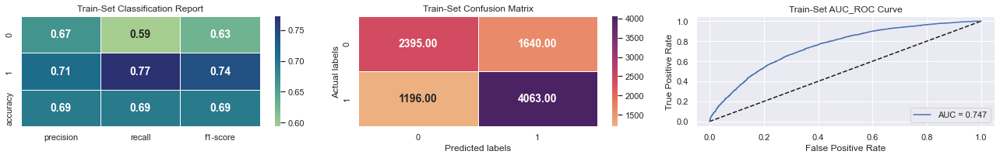

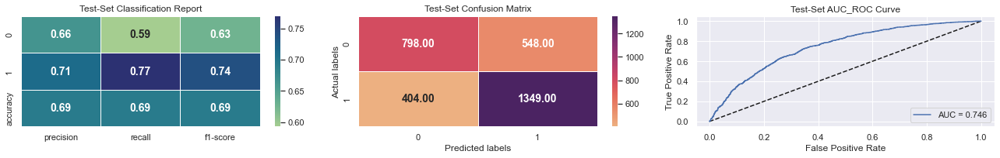

LogisticRegression(random_state=0)

In [356]:
# Importing LogisticRegression from sklearn
from sklearn.linear_model import LogisticRegression

# Fitting Logistic Regression Model and Visualizing evaluation Metric Score chart
logistic_classifier_ord = LogisticRegression(fit_intercept=True, penalty='l2',random_state=0)
analyse_model(logistic_classifier_ord, x_train_ordinal, x_test_ordinal, y_train, y_test)

The best parameters are: {'solver': 'newton-cg', 'penalty': None, 'n_jobs': -1, 'multi_class': 'multinomial', 'max_iter': 1561, 'fit_intercept': True, 'dual': False, 'C': 100}


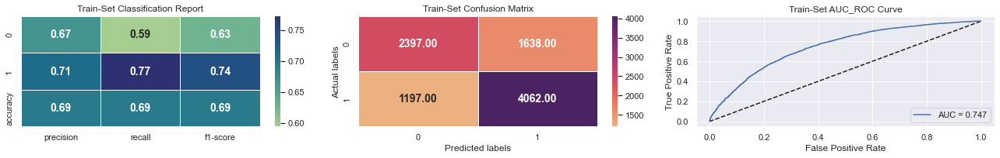

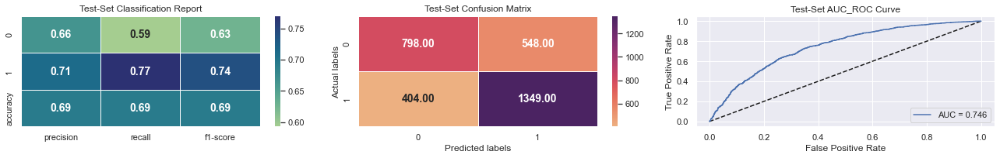

RandomizedSearchCV(cv=5, estimator=LogisticRegression(random_state=0),
                   param_distributions={'C': [0.01, 0.1, 1, 10, 100, 500],
                                        'dual': [True, False],
                                        'fit_intercept': [True, False],
                                        'max_iter': [1, 11, 21, 31, 41, 51, 61,
                                                     71, 81, 91, 101, 111, 121,
                                                     131, 141, 151, 161, 171,
                                                     181, 191, 201, 211, 221,
                                                     231, 241, 251, 261, 271,
                                                     281, 291, ...],
                                        'multi_class': ['auto', 'ovr',
                                                        'multinomial'],
                                        'n_jobs': [-1],
                                        'penalty': ['l1', 'l2', 'elasticnet',
                                                    None],
                                        'solver': ['newton-cg', 'lbfgs',
                                                   'liblinear', 'sag',
                                                   'saga']},
                   scoring='precision')

In [368]:
# Importing GridSearchCV from sklearn
from sklearn.model_selection import RandomizedSearchCV



# Defining parameters
parameters = {'C':[0.01, 0.1, 1, 10, 100, 500],
             "penalty" : ["l1", "l2", "elasticnet", None],
             "dual" : [True, False],
             "solver" : ["newton-cg", "lbfgs", "liblinear", "sag", "saga"],
             "max_iter" : [i for i in range(1,5000,10)],
             "fit_intercept" : [True, False],
             "multi_class" : ["auto", "ovr", "multinomial"], "n_jobs" : [-1]}

# Fitting LogisticRegression Model with GridSearchCV
LR_grid_classifier_ord = RandomizedSearchCV(logistic_classifier_ord, parameters, scoring = 'precision', cv=5)

# Analysing the model
analyse_model(LR_grid_classifier_ord, x_train_ordinal, x_test_ordinal, y_train, y_test)

In [ ]:
# # Importing GridSearchCV from sklearn
# from sklearn.model_selection import GridSearchCV

# # # Defining classifier instance
# # classifier= LogisticRegression(random_state=0)

# # Defining parameters
# grid_values = {"penalty" : ["l1", "l2", "elasticnet"], 
#                'C':[0.01, 0.1, 1, 10, 100, 500],
#                "dual" : [True, False],
#                "solver" : ["newton-cg", "lbfgs", "liblinear", "sag", "saga"], 
#                "max_iter" : [i for i in range(100,1000,50)],
#                "fit_intercept" : [True, False],
#               "multi_class" : ["auto", "ovr", "multinomial"], "n_jobs" : [-1]} 

# # Fitting RandomForestClassifier Model with GridSearchCV
# LR_grid_classifier = GridSearchCV(logistic_classifier, param_grid = grid_values, scoring = 'recall', cv=5)

# # Analysing the model
# analyse_model(LR_grid_classifier, x_train, x_test, y_train, y_test)

Confusion matrix (train)
[[2395 1640]
 [1196 4063]]
********************************************************************
Confusion matrix (test)
[[ 798  548]
 [ 404 1349]]
**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       0.67      0.59      0.63      4035
           1       0.71      0.77      0.74      5259

    accuracy                           0.69      9294
   macro avg       0.69      0.68      0.68      9294
weighted avg       0.69      0.69      0.69      9294

**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       0.66      0.59      0.63      1346
           1       0.71      0.77      0.74      1753

    accuracy                           0.69      3099
   macro avg       0.69      0.68      0.68      3099
weighted avg       0.69      0

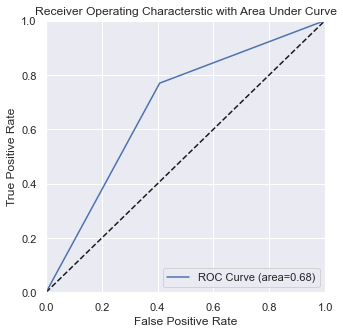

In [359]:
from sklearn.linear_model import LogisticRegression

logit_model = LogisticRegression()
logit_model.fit(x_train_ordinal, y_train)

# Predict Result
y_predict_train = logit_model.predict(x_train_ordinal)
y_predict_test = logit_model.predict(x_test_ordinal)


# Evalution after hyperparameter tuning
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("********************************************************************")
print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("**********************************************************************")
print("Classification Report(train)")
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Classification Report(test)')
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
accuracy = cross_val_score(logit_model, x_test_ohe, y_test, cv=20)
print(f"Accuracy : {accuracy}")
print("***********************************************************************")
print("Average accuracy after 20 splits", accuracy.mean())
print('***********************************************************************')
print('Highest accuracy', accuracy.max())
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")
print("***********************************************************************")
# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

In [ ]:
#### on ohe+ord

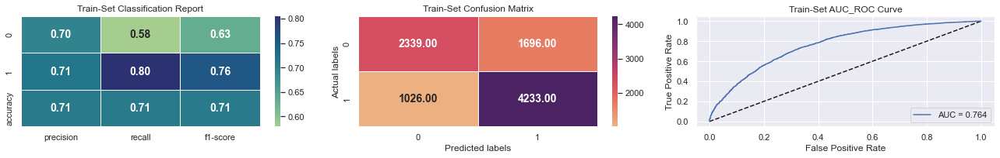

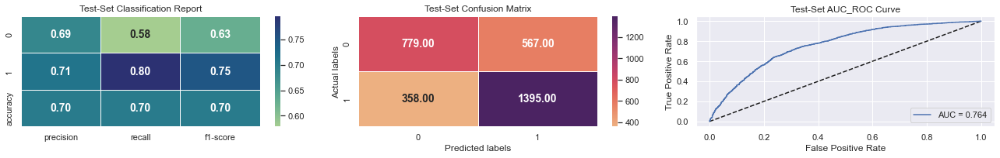

LogisticRegression(random_state=0)

In [360]:
# Importing LogisticRegression from sklearn
from sklearn.linear_model import LogisticRegression

# Fitting Logistic Regression Model and Visualizing evaluation Metric Score chart
logistic_classifier_ohe_ord = LogisticRegression(fit_intercept=True, penalty='l2',random_state=0)
analyse_model(logistic_classifier_ohe_ord, x_train_ohe_ord, x_test_ohe_ord, y_train, y_test)

The best parameters are: {'solver': 'liblinear', 'penalty': 'l2', 'n_jobs': -1, 'multi_class': 'auto', 'max_iter': 3741, 'fit_intercept': True, 'dual': True, 'C': 1}


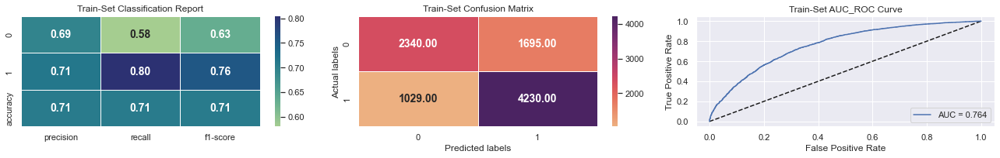

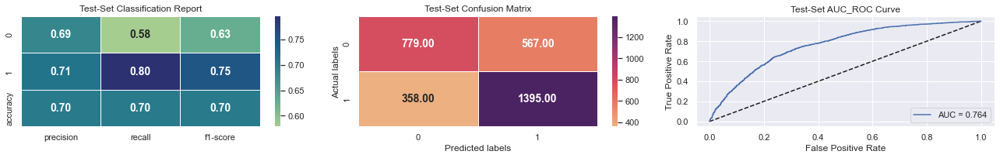

RandomizedSearchCV(cv=5, estimator=LogisticRegression(random_state=0),
                   param_distributions={'C': [0.01, 0.1, 1, 10, 100, 500],
                                        'dual': [True, False],
                                        'fit_intercept': [True, False],
                                        'max_iter': [1, 11, 21, 31, 41, 51, 61,
                                                     71, 81, 91, 101, 111, 121,
                                                     131, 141, 151, 161, 171,
                                                     181, 191, 201, 211, 221,
                                                     231, 241, 251, 261, 271,
                                                     281, 291, ...],
                                        'multi_class': ['auto', 'ovr',
                                                        'multinomial'],
                                        'n_jobs': [-1],
                                        'penalty': ['l1', 'l2', 'elasticnet'],
                                        'solver': ['newton-cg', 'lbfgs',
                                                   'liblinear', 'sag',
                                                   'saga']},
                   scoring='precision')

In [361]:
# Importing GridSearchCV from sklearn
from sklearn.model_selection import RandomizedSearchCV



# Defining parameters
parameters = {'C':[0.01, 0.1, 1, 10, 100, 500],
             "penalty" : ["l1", "l2", "elasticnet"],
             "dual" : [True, False],
             "solver" : ["newton-cg", "lbfgs", "liblinear", "sag", "saga"],
             "max_iter" : [i for i in range(1,5000,10)],
             "fit_intercept" : [True, False],
             "multi_class" : ["auto", "ovr", "multinomial"], "n_jobs" : [-1]}

# Fitting LogisticRegression Model with GridSearchCV
LR_grid_classifier_ohe_ord = RandomizedSearchCV(logistic_classifier_ohe_ord, parameters, scoring = 'precision', cv=5)

# Analysing the model
analyse_model(LR_grid_classifier_ohe_ord, x_train_ohe_ord, x_test_ohe_ord, y_train, y_test)

Confusion matrix (train)
[[2339 1696]
 [1026 4233]]
********************************************************************
Confusion matrix (test)
[[ 779  567]
 [ 358 1395]]
**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       0.70      0.58      0.63      4035
           1       0.71      0.80      0.76      5259

    accuracy                           0.71      9294
   macro avg       0.70      0.69      0.69      9294
weighted avg       0.71      0.71      0.70      9294

**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       0.69      0.58      0.63      1346
           1       0.71      0.80      0.75      1753

    accuracy                           0.70      3099
   macro avg       0.70      0.69      0.69      3099
weighted avg       0.70      0

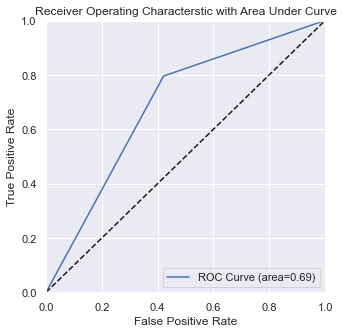

In [392]:
from sklearn.linear_model import LogisticRegression


logit_model =  LogisticRegression(fit_intercept=True, penalty='l2',random_state=0)
logit_model.fit(x_train_ohe_ord, y_train)

# Predict Result
y_predict_train = logit_model.predict(x_train_ohe_ord)
y_predict_test = logit_model.predict(x_test_ohe_ord)


# Evalution after hyperparameter tuning
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("********************************************************************")
print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("**********************************************************************")
print("Classification Report(train)")
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Classification Report(test)')
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
accuracy = cross_val_score(logit_model, x_test_ohe_ord, y_test, cv=20)
print(f"Accuracy : {accuracy}")
print("***********************************************************************")
print("Average accuracy after 20 splits", accuracy.mean())
print('***********************************************************************')
print('Highest accuracy', accuracy.max())
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")
print("***********************************************************************")
# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

In [ ]:
# Storing different regression metrics in order to make dataframe and compare them
models = ["Logistic_regression","Decision_tree","Random_forest","AdaBoost","XGboost","SVM"]
Precision = [0.70,0.66,0.73,0.74,0.74,0.72] 
Recall = [0.69,66,0.72,0.72,0.73,0.70]
F1_Score= [0.69,0.66,0.72,0.73,0.73,0.70]
Accuracy = [0.70,0.66,0.73,0.74,0.74,0.72]
AUC = [0.764,0.665,0.789,0.768,0.809,0.784]

# Create dataframe from the lists
data = {'Models': models, 
        'Precision': Precision,
        'Recall': Recall,
        'F1_Score': F1_Score,
        'Accuracy': Accuracy,
        'AUC': AUC
       }
metric_df = pd.DataFrame(data)

# Printing dataframe

In [ ]:
# # Importing GridSearchCV from sklearn
# from sklearn.model_selection import GridSearchCV

# # # Defining classifier instance
# # classifier= LogisticRegression(random_state=0)

# # Defining parameters
# grid_values = {"penalty" : ["l1", "l2", "elasticnet"], 
#                'C':[0.01, 0.1, 1, 10, 100, 500],
#                "dual" : [True, False],
#                "solver" : ["newton-cg", "lbfgs", "liblinear", "sag", "saga"], 
#                "max_iter" : [i for i in range(100,1000,50)],
#                "fit_intercept" : [True, False],
#               "multi_class" : ["auto", "ovr", "multinomial"], "n_jobs" : [-1]} 

# # Fitting RandomForestClassifier Model with GridSearchCV
# LR_grid_classifier = GridSearchCV(logistic_classifier, param_grid = grid_values, scoring = 'recall', cv=5)

# # Analysing the model
# analyse_model(LR_grid_classifier, x_train, x_test, y_train, y_test)

## ML Model - 2 - SGDClassifier

### 1. Explain the ML Model and it's performance using Evaluation metric Score Chart.

In [ ]:
#### on ohe

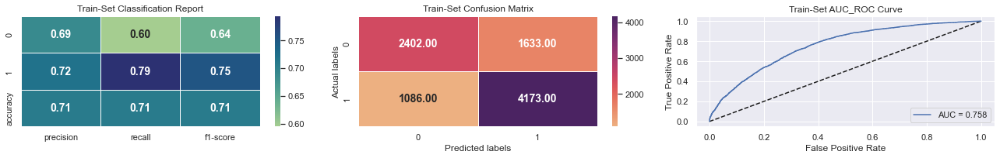

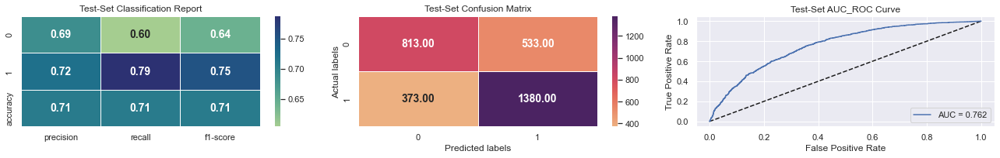

SGDClassifier(loss='log_loss')

In [372]:
# Importing LogisticRegression from sklearn
from sklearn.linear_model import SGDClassifier

# Fitting SCDCClassifier Model and Visualizing evaluation Metric Score chart
SGDC_classifier_ohe = SGDClassifier(loss="log_loss")
analyse_model(SGDC_classifier_ohe, x_train_ohe, x_test_ohe, y_train, y_test)

In [ ]:
# Importing GridSearchCV from sklearn
from sklearn.model_selection import RandomizedSearchCV



# Defining parameters
parameters = {"loss":['log_loss','modified_huber','squared_hinge','perceptron','huber','epsilon_insensitive','squared_epsilon_insensitive'],
             "penalty":['l2', 'l1', 'elasticnet', None],
             "alpha":[0.0001,0.001,0.005,0.01,0.1,1.0],
              "l1_ratio":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1],
             "fit_intercept":[True, False],
             "max_iter":[i for i in range(100, 10000, 10)]}

# Fitting LogisticRegression Model with GridSearchCV
SGD_grid_classifier_ohe = RandomizedSearchCV(SGDC_classifier_ohe, parameters, scoring = 'precision', cv=5)

# Analysing the model
analyse_model(SGD_grid_classifier_ohe, x_train_ohe, x_test_ohe, y_train, y_test)


In [ ]:
#### on ord

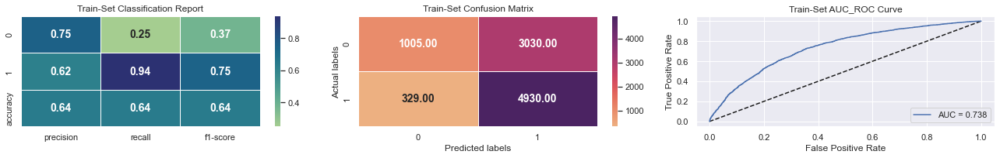

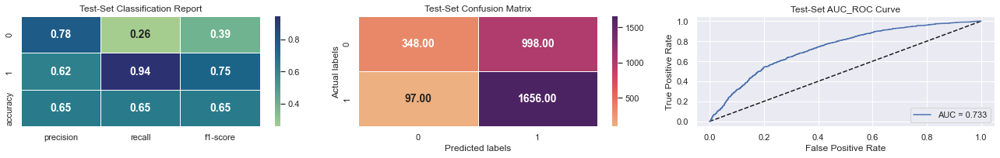

SGDClassifier(loss='log_loss')

In [373]:
# Importing LogisticRegression from sklearn
from sklearn.linear_model import SGDClassifier

# Fitting SCDCClassifier Model and Visualizing evaluation Metric Score chart
SGDC_classifier_ord = SGDClassifier(loss="log_loss")
analyse_model(SGDC_classifier_ord, x_train_ordinal, x_test_ordinal, y_train, y_test)

In [ ]:
# Importing GridSearchCV from sklearn
from sklearn.model_selection import RandomizedSearchCV



# Defining parameters
parameters = {"loss":['log_loss','modified_huber','squared_hinge','perceptron','huber','epsilon_insensitive','squared_epsilon_insensitive'],
             "penalty":['l2', 'l1', 'elasticnet', None],
             "alpha":[0.0001,0.001,0.005,0.01,0.1,1.0],
              "l1_ratio":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1],
             "fit_intercept":[True, False],
             "max_iter":[i for i in range(100, 10000, 10)]}

# Fitting LogisticRegression Model with GridSearchCV
SGD_grid_classifier_ord = RandomizedSearchCV(SGDC_classifier_ord, parameters, scoring = 'precision', cv=5)

# Analysing the model
analyse_model(SGD_grid_classifier_ord, x_train_ordinal, x_test_ordinal, y_train, y_test)


In [ ]:
#### on ohe+ord

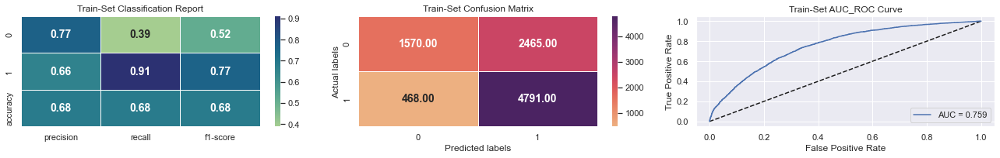

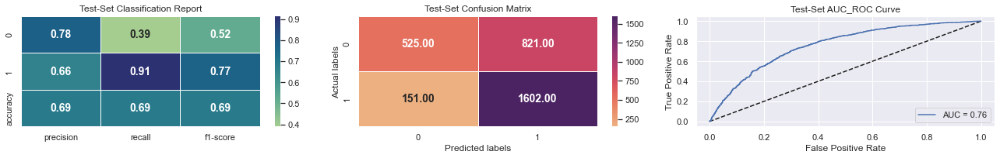

SGDClassifier(loss='log_loss')

In [374]:
# Importing LogisticRegression from sklearn
from sklearn.linear_model import SGDClassifier

# Fitting SCDCClassifier Model and Visualizing evaluation Metric Score chart
SGDC_classifier_ohe_ord = SGDClassifier(loss="log_loss")
analyse_model(SGDC_classifier_ohe_ord, x_train_ohe_ord, x_test_ohe_ord, y_train, y_test)

In [ ]:
# Importing GridSearchCV from sklearn
from sklearn.model_selection import RandomizedSearchCV



# Defining parameters
parameters = {"loss":['hinge','log_loss','modified_huber','squared_hinge','perceptron','huber','epsilon_insensitive','squared_epsilon_insensitive'],
             "penalty":['l2', 'l1', 'elasticnet', None],
             "alpha":[0.0001,0.001,0.005,0.01,0.1,1.0],
              "l1_ratio":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1],
             "fit_intercept":[True, False],
             "max_iter":[i for i in range(100, 10000, 10)]}

# Fitting LogisticRegression Model with GridSearchCV
SGD_grid_classifier_ohe_ord = RandomizedSearchCV(SGDC_classifier_ohe_ord, parameters, scoring = 'precision', cv=5)

# Analysing the model
analyse_model(SGD_grid_classifier_ohe_ord, x_train_ohe_ord, x_test_ohe_ord, y_train, y_test)


## ML Model - 3 Decision Treee

### 1. Explain the ML Model and it's performance using Evaluation metric Score Chart.

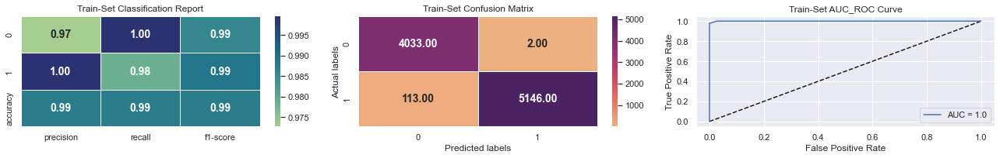

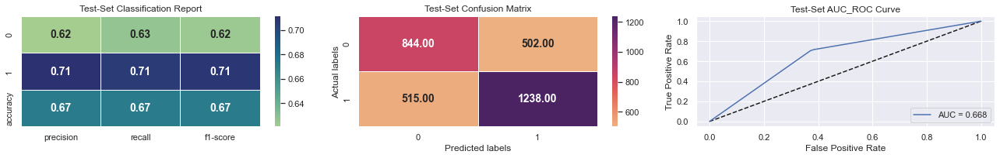

DecisionTreeClassifier(random_state=0)

In [375]:
# Importing RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

# Fitting RandomForestClassifier Model
DT_classifier_ohe = DecisionTreeClassifier(random_state=0)

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(DT_classifier_ohe, x_train_ohe, x_test_ohe, y_train, y_test)

In [ ]:
# Importing GridSearchCV from sklearn
from sklearn.model_selection import RandomizedSearchCV



# Defining parameters
parameters = {"criterion":["gini", "entropy", "log_loss"],
             "splitter":["best", "random"],
             "max_depth":[i for i in range(1,50,10)],
             "min_samples_split":[i for i in range(1,500,10)],
             "min_samples_leaf":[i for i in range(1,10)],
#              "min_weight_fraction_leaf":[0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],
              "random_state":[101],
             "max_features":["sqrt", "log2", None]}
#              "max_leaf_nodes":[i for i in range(1,500)]
#              "min_impurity_decrease":[],
#              "class_weight":[],
#              "ccp_alpha":[],
#              "monotonic_cst":[]}

# Fitting LogisticRegression Model with GridSearchCV
DT_grid_classifier_ohe = RandomizedSearchCV(DT_classifier_ohe, parameters, scoring = 'precision', cv=5)

# Analysing the model
analyse_model(DT_grid_classifier_ohe, x_train_ohe, x_test_ohe, y_train, y_test)


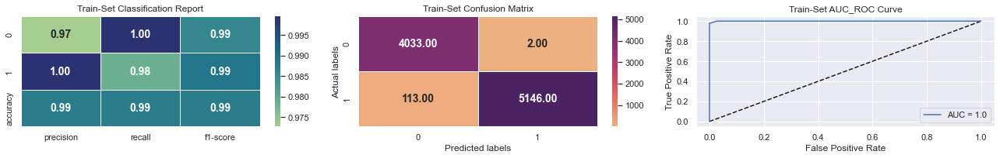

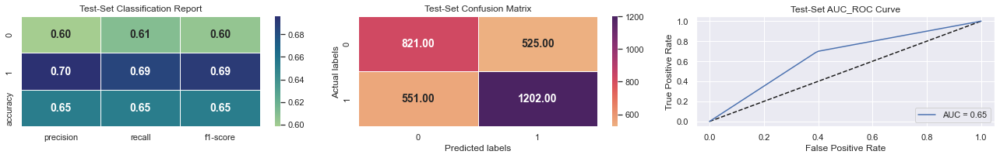

DecisionTreeClassifier(random_state=0)

In [376]:
# Importing RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

# Fitting RandomForestClassifier Model
DT_classifier_ordinal = DecisionTreeClassifier(random_state=0)

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(DT_classifier_ordinal, x_train_ordinal, x_test_ordinal, y_train, y_test)

In [ ]:
# Importing GridSearchCV from sklearn
from sklearn.model_selection import RandomizedSearchCV



# Defining parameters
parameters = {"criterion":["gini", "entropy", "log_loss"],
             "splitter":["best", "random"],
             "max_depth":[i for i in range(1,50,10)],
             "min_samples_split":[i for i in range(1,500,10)],
             "min_samples_leaf":[i for i in range(1,10)],
#              "min_weight_fraction_leaf":[0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],
              "random_state":[101],
             "max_features":["sqrt", "log2", None]}
#              "max_leaf_nodes":[i for i in range(1,500)]
#              "min_impurity_decrease":[],
#              "class_weight":[],
#              "ccp_alpha":[],
#              "monotonic_cst":[]}

# Fitting LogisticRegression Model with GridSearchCV
DT_grid_classifier_ordinal = RandomizedSearchCV(DT_classifier_ordinal, parameters, scoring = 'precision', cv=5)

# Analysing the model
analyse_model(DT_grid_classifier_ordinal, x_train_ordinal, x_test_ordinal, y_train, y_test)


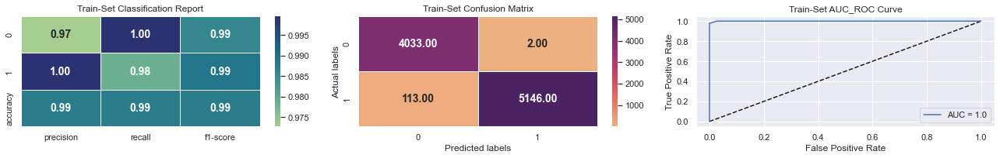

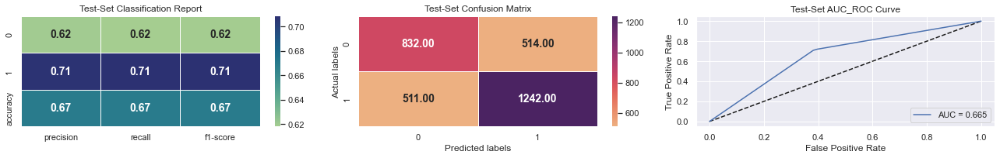

DecisionTreeClassifier(random_state=0)

In [377]:
# Importing RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

# Fitting RandomForestClassifier Model
DT_classifier_ohe_ord = DecisionTreeClassifier(random_state=0)

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(DT_classifier_ohe_ord, x_train_ohe_ord, x_test_ohe_ord, y_train, y_test)

Confusion matrix (train)
[[4033    2]
 [ 113 5146]]
********************************************************************
Confusion matrix (test)
[[ 832  514]
 [ 511 1242]]
**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       0.97      1.00      0.99      4035
           1       1.00      0.98      0.99      5259

    accuracy                           0.99      9294
   macro avg       0.99      0.99      0.99      9294
weighted avg       0.99      0.99      0.99      9294

**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       0.62      0.62      0.62      1346
           1       0.71      0.71      0.71      1753

    accuracy                           0.67      3099
   macro avg       0.66      0.66      0.66      3099
weighted avg       0.67      0

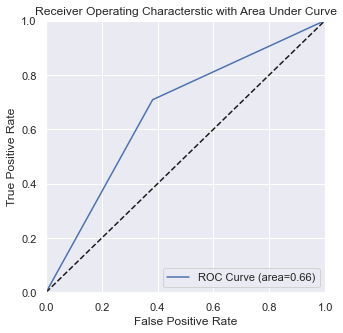

In [390]:
from sklearn.tree import DecisionTreeClassifier



logit_model =  DecisionTreeClassifier(random_state=0)
logit_model.fit(x_train_ohe_ord, y_train)

# Predict Result
y_predict_train = logit_model.predict(x_train_ohe_ord)
y_predict_test = logit_model.predict(x_test_ohe_ord)


# Evalution after hyperparameter tuning
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("********************************************************************")
print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("**********************************************************************")
print("Classification Report(train)")
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Classification Report(test)')
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
accuracy = cross_val_score(logit_model, x_test_ohe_ord, y_test, cv=20)
print(f"Accuracy : {accuracy}")
print("***********************************************************************")
print("Average accuracy after 20 splits", accuracy.mean())
print('***********************************************************************')
print('Highest accuracy', accuracy.max())
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")
print("***********************************************************************")
# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

In [391]:
# Storing different regression metrics in order to make dataframe and compare them
models = ["Logistic_regression","Decision_tree","Random_forest","AdaBoost","XGboost","SVM"]
Precision = [0.66,0.73,0.74,0.74,0.72] 
Recall = [0.66,0.72,0.72,0.73,0.70]
F1_Score= [0.66,0.72,0.73,0.73,0.70]
Accuracy = [0.66,0.73,0.74,0.74,0.72]
AUC = [0.665,0.789,0.768,0.809,0.784]

# Create dataframe from the lists
data = {'Models': models, 
        'Precision': Precision,
        'Recall': Recall,
        'F1_Score': F1_Score,
        'Accuracy': Accuracy,
        'AUC': AUC
       }
metric_df = pd.DataFrame(data)

# Printing dataframe

ValueError: All arrays must be of the same length

In [ ]:
# Importing GridSearchCV from sklearn
from sklearn.model_selection import RandomizedSearchCV



# Defining parameters
parameters = {"criterion":["gini", "entropy", "log_loss"],
             "splitter":["best", "random"],
             "max_depth":[i for i in range(1,50,10)],
             "min_samples_split":[i for i in range(1,500,10)],
             "min_samples_leaf":[i for i in range(1,10)],
#              "min_weight_fraction_leaf":[0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],
              "random_state":[101],
             "max_features":["sqrt", "log2", None]}
#              "max_leaf_nodes":[i for i in range(1,500)]
#              "min_impurity_decrease":[],
#              "class_weight":[],
#              "ccp_alpha":[],
#              "monotonic_cst":[]}

# Fitting LogisticRegression Model with GridSearchCV
DT_grid_classifier_ohe_ord = RandomizedSearchCV(DT_classifier_ohe_ord, parameters, scoring="precision", cv=5)

# Analysing the model
analyse_model(DT_grid_classifier_ohe_ord, x_train_ohe_ord, x_test_ohe_ord, y_train, y_test)


## ML Model - 4 BaggingClassifier

### 1. Explain the ML Model and it's performance using Evaluation metric Score Chart.

In [ ]:
### on ohe

In [1]:
from sklearn.ensemble import BaggingClassifier


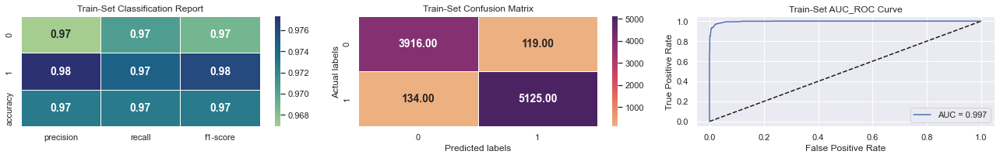

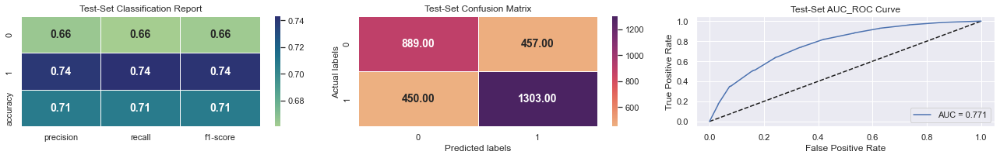

BaggingClassifier(estimator=DecisionTreeClassifier(), n_jobs=-1, oob_score=True,
                  random_state=0)

In [356]:
# Importing RandomForestClassifier
from sklearn.ensemble import BaggingClassifier

# Fitting RandomForestClassifier Model
BG_classifier_ohe = BaggingClassifier(DecisionTreeClassifier(), n_jobs=-1,oob_score=True, random_state=0)

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(BG_classifier_ohe, x_train_ohe, x_test_ohe, y_train, y_test)

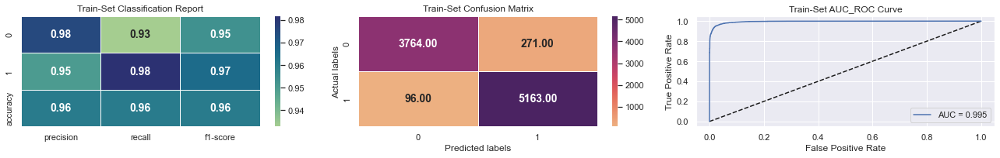

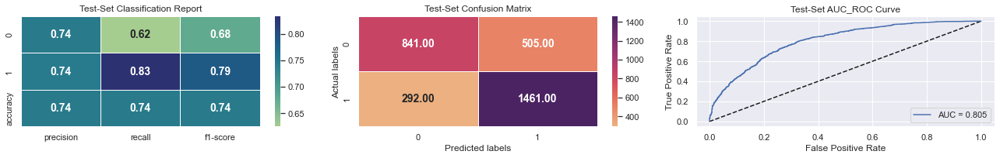

BaggingClassifier(estimator=RandomForestClassifier(n_jobs=-1, oob_score=True),
                  n_jobs=-1, oob_score=True, random_state=0)

In [357]:
# Importing RandomForestClassifier
from sklearn.ensemble import BaggingClassifier

# Fitting RandomForestClassifier Model
BG_classifier = BaggingClassifier(RandomForestClassifier(oob_score=True,n_jobs=-1), n_jobs=-1,oob_score=True, random_state=0)

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(BG_classifier, x_train_ohe, x_test_ohe, y_train, y_test)

In [ ]:
### on ordinal

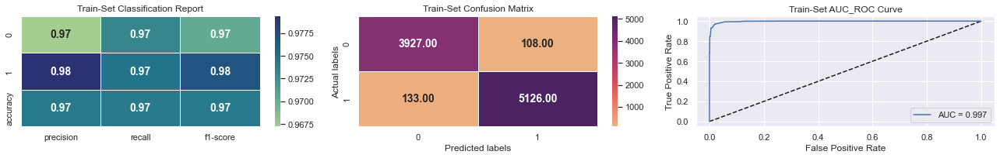

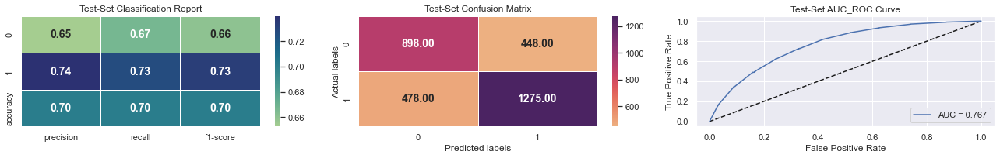

BaggingClassifier(estimator=DecisionTreeClassifier(), n_jobs=-1, oob_score=True,
                  random_state=0)

In [358]:
# Importing RandomForestClassifier
from sklearn.ensemble import BaggingClassifier

# Fitting RandomForestClassifier Model
BG_classifier_ordinal = BaggingClassifier(DecisionTreeClassifier(), n_jobs=-1,oob_score=True, random_state=0)

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(BG_classifier_ordinal, x_train_ordinal, x_test_ordinal, y_train, y_test)

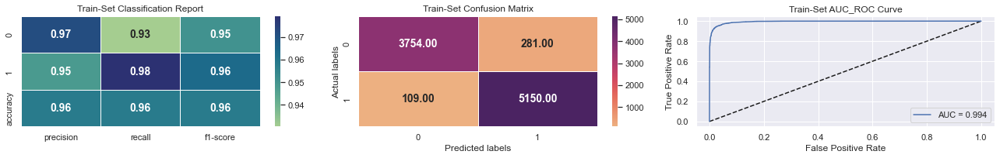

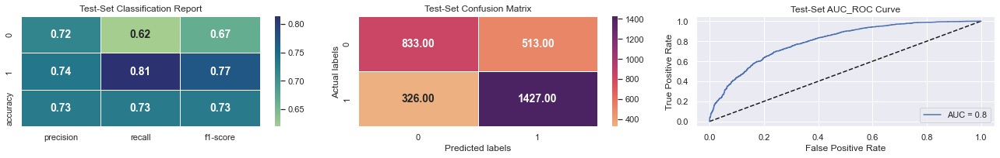

BaggingClassifier(estimator=RandomForestClassifier(n_jobs=-1, oob_score=True),
                  n_jobs=-1, oob_score=True, random_state=0)

In [359]:
# Importing RandomForestClassifier
from sklearn.ensemble import BaggingClassifier

# Fitting RandomForestClassifier Model
BG_classifier_ordinal1 = BaggingClassifier(RandomForestClassifier(oob_score=True,n_jobs=-1), n_jobs=-1,oob_score=True, random_state=0)

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(BG_classifier, x_train_ordinal, x_test_ordinal, y_train, y_test)

In [ ]:
#### on ohe+ordinal

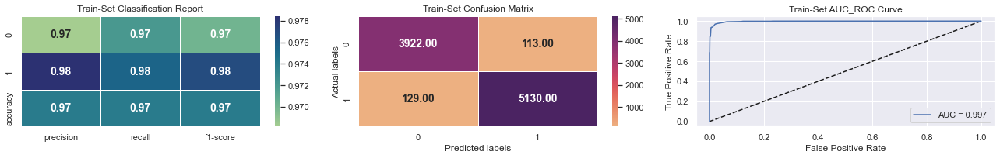

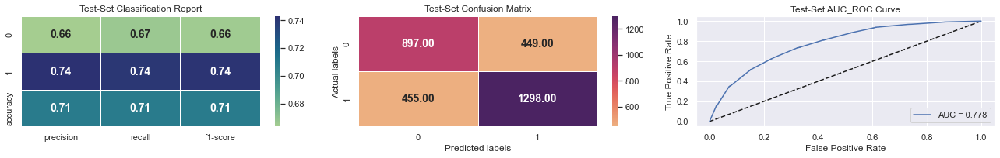

BaggingClassifier(estimator=DecisionTreeClassifier(), n_jobs=-1, oob_score=True,
                  random_state=0)

In [360]:
# Importing RandomForestClassifier
from sklearn.ensemble import BaggingClassifier

# Fitting RandomForestClassifier Model
BG_classifier_ohe_ord = BaggingClassifier(DecisionTreeClassifier(), n_jobs=-1,oob_score=True, random_state=0)

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(BG_classifier_ohe_ord, x_train_ohe_ord, x_test_ohe_ord, y_train, y_test)

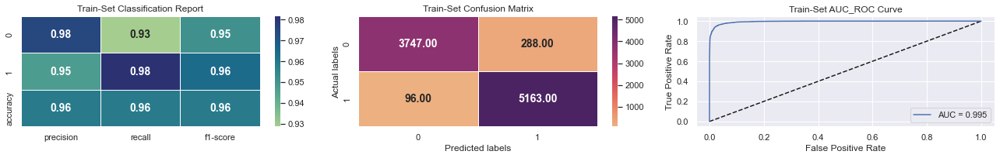

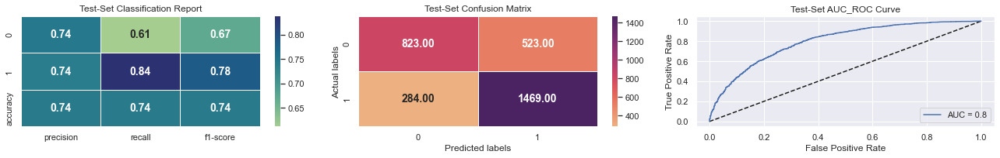

BaggingClassifier(estimator=RandomForestClassifier(n_jobs=-1, oob_score=True),
                  n_jobs=-1, oob_score=True, random_state=0)

In [361]:
# Importing RandomForestClassifier
from sklearn.ensemble import BaggingClassifier

# Fitting RandomForestClassifier Model
BG_classifier_ohe_ord1 = BaggingClassifier(RandomForestClassifier(oob_score=True,n_jobs=-1), n_jobs=-1,oob_score=True, random_state=0)

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(BG_classifier_ohe_ord1, x_train_ohe_ord, x_test_ohe_ord, y_train, y_test)

In [ ]:
# # Importing GridSearchCV from sklearn
# from sklearn.model_selection import RandomizedSearchCV



# # Defining parameters
# parameters = {"estimator":[DecisionTreeClassifier(), RandomForestClassifier(oob_score=True,n_jobs=-1)],
#              "n_estimators":[i for i in range(10,1000,10)]}

# # Fitting LogisticRegression Model with GridSearchCV
# BG_grid_classifier = RandomizedSearchCV(BG_classifier, parameters, scoring = 'roc_auc', cv=5)

# # Analysing the model
# analyse_model(BG_grid_classifier, x_train, x_test, y_train, y_test)


## ML Model - 5 Random Forest

### 1. Explain the ML Model and it's performance using Evaluation metric Score Chart.

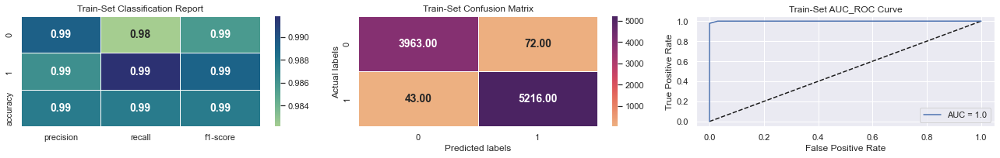

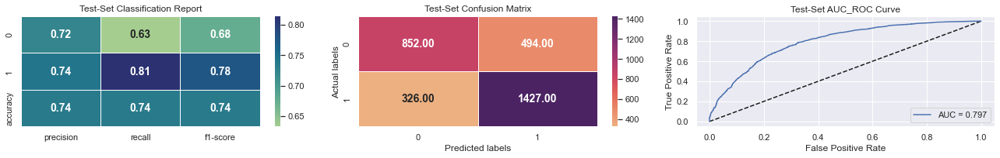

RandomForestClassifier(n_jobs=-1, oob_score=True, random_state=0)

In [353]:
# Importing RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier

# Fitting RandomForestClassifier Model
RF_classifier_ohe = RandomForestClassifier(oob_score=True,n_jobs=-1,random_state=0)

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(RF_classifier_ohe, x_train_ohe, x_test_ohe, y_train, y_test)

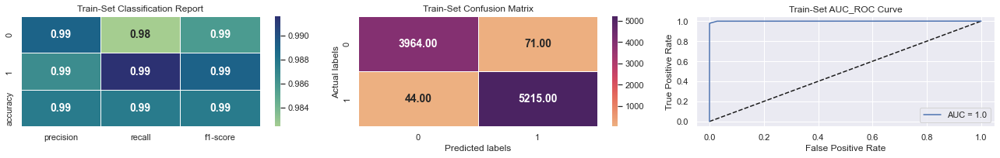

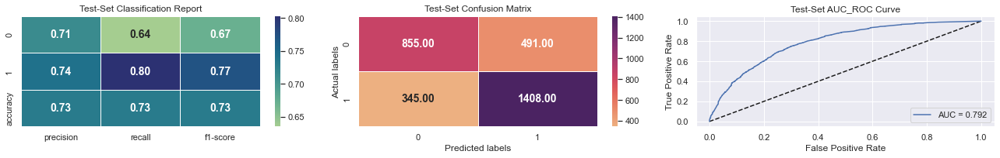

RandomForestClassifier(n_jobs=-1, oob_score=True, random_state=0)

In [354]:
# Importing RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier

# Fitting RandomForestClassifier Model
RF_classifier_ordinal = RandomForestClassifier(oob_score=True,n_jobs=-1,random_state=0)

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(RF_classifier_ordinal, x_train_ordinal, x_test_ordinal, y_train, y_test)

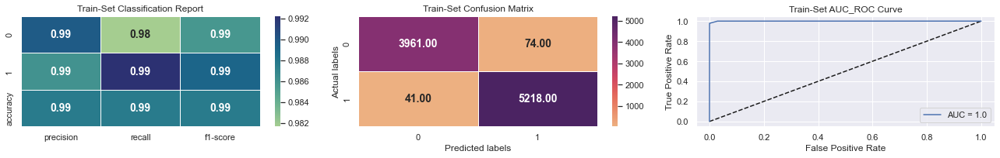

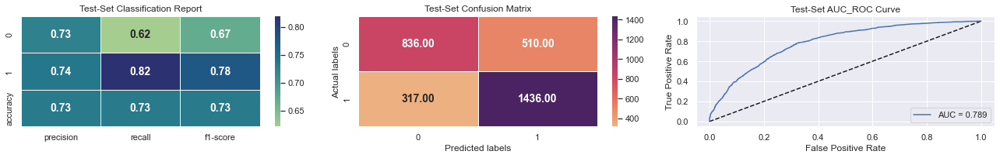

RandomForestClassifier(n_jobs=-1, oob_score=True, random_state=0)

In [404]:
# Importing RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier

# Fitting RandomForestClassifier Model
RF_classifier_ohe_ord = RandomForestClassifier(oob_score=True,n_jobs=-1,random_state=0)

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(RF_classifier_ohe_ord, x_train_ohe_ord, x_test_ohe_ord, y_train, y_test)

The best parameters are: {'oob_score': True, 'n_jobs': -1, 'n_estimators': 281, 'min_samples_split': 131, 'min_samples_leaf': 71, 'max_features': None, 'max_depth': 41, 'criterion': 'gini'}


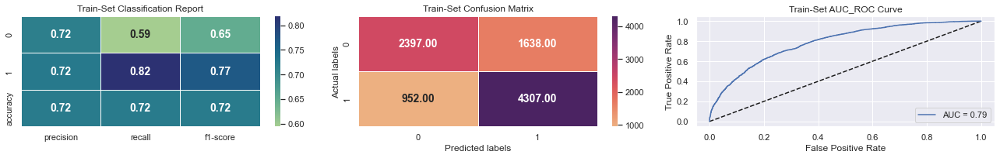

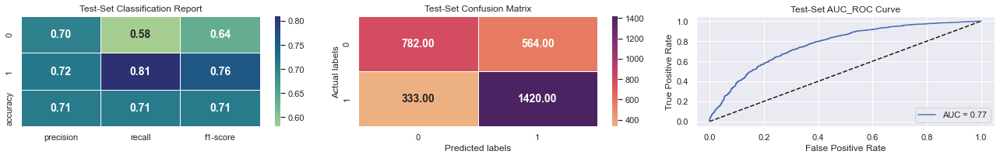

RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(n_jobs=-1, oob_score=True,
                                                    random_state=0),
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [1, 11, 21, 31, 41],
                                        'max_features': ['sqrt', 'log2', None],
                                        'min_samples_leaf': [1, 11, 21, 31, 41,
                                                             51, 61, 71, 81, 91,
                                                             101, 111, 121, 131,
                                                             141, 151, 161, 171,
                                                             181, 191, 201, 211,
                                                             221, 231, 241, 251,
                                                             261, 271, 281, 291, ...],
                                        'min_samples_split': [1, 11, 21, 31, 41,
                                                              51, 61, 71, 81,
                                                              91, 101, 111, 121,
                                                              131, 141, 151,
                                                              161, 171, 181,
                                                              191, 201, 211,
                                                              221, 231, 241,
                                                              251, 261, 271,
                                                              281, 291, ...],
                                        'n_estimators': [1, 11, 21, 31, 41, 51,
                                                         61, 71, 81, 91, 101,
                                                         111, 121, 131, 141,
                                                         151, 161, 171, 181,
                                                         191, 201, 211, 221,
                                                         231, 241, 251, 261,
                                                         271, 281, 291, ...],
                                        'n_jobs': [-1], 'oob_score': [True]},
                   scoring='precision')

In [408]:
# Importing GridSearchCV from sklearn
from sklearn.model_selection import RandomizedSearchCV


# Defining parameters
parameters = {'n_estimators':[i for i in range(1,500,10)],
             'criterion':["gini", "entropy"],
              'max_depth':[i for i in range(1,50,10)],
              'min_samples_split':[i for i in range(1,500,10)],
              'min_samples_leaf':[i for i in range(1,500,10)],
             'max_features':["sqrt", "log2", None],
             'oob_score':[True],
             'n_jobs':[-1]}

# Fitting LogisticRegression Model with GridSearchCV
DT_grid_classifier_ohe_ord = RandomizedSearchCV(RF_classifier_ohe_ord, parameters, scoring="precision", cv=5)

# Analysing the model
analyse_model(DT_grid_classifier_ohe_ord, x_train_ohe_ord, x_test_ohe_ord, y_train, y_test)


Confusion matrix (train)
[[3961   74]
 [  41 5218]]
********************************************************************
Confusion matrix (test)
[[ 836  510]
 [ 317 1436]]
**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       0.99      0.98      0.99      4035
           1       0.99      0.99      0.99      5259

    accuracy                           0.99      9294
   macro avg       0.99      0.99      0.99      9294
weighted avg       0.99      0.99      0.99      9294

**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       0.73      0.62      0.67      1346
           1       0.74      0.82      0.78      1753

    accuracy                           0.73      3099
   macro avg       0.73      0.72      0.72      3099
weighted avg       0.73      0

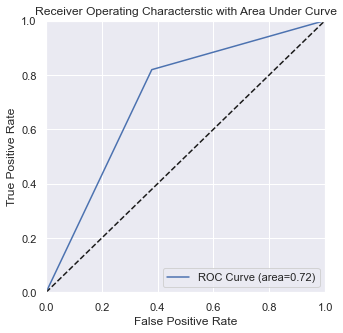

In [389]:
from sklearn.ensemble import RandomForestClassifier



logit_model =  RandomForestClassifier(oob_score=True,n_jobs=-1,random_state=0)
logit_model.fit(x_train_ohe_ord, y_train)

# Predict Result
y_predict_train = logit_model.predict(x_train_ohe_ord)
y_predict_test = logit_model.predict(x_test_ohe_ord)


# Evalution after hyperparameter tuning
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("********************************************************************")
print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("**********************************************************************")
print("Classification Report(train)")
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Classification Report(test)')
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
accuracy = cross_val_score(logit_model, x_test_ohe_ord, y_test, cv=20)
print(f"Accuracy : {accuracy}")
print("***********************************************************************")
print("Average accuracy after 20 splits", accuracy.mean())
print('***********************************************************************')
print('Highest accuracy', accuracy.max())
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")
print("***********************************************************************")
# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

In [ ]:
# Storing different regression metrics in order to make dataframe and compare them
models = ["Logistic_regression","Decision_tree","Random_forest","AdaBoost","XGboost","SVM"]
Precision = [0.73,0.74,0.74,0.72] 
Recall = [0.72,0.72,0.73,0.70]
F1_Score= [0.72,0.73,0.73,0.70]
Accuracy = [0.73,0.74,0.74,0.72]
AUC = [0.789,0.768,0.809,0.784]

# Create dataframe from the lists
data = {'Models': models, 
        'Precision': Precision,
        'Recall': Recall,
        'F1_Score': F1_Score,
        'Accuracy': Accuracy,
        'AUC': AUC
       }
metric_df = pd.DataFrame(data)

# Printing dataframe

## ML Model - 6 AdaBoost

### 1.  Explain the ML Model and it's performance using Evaluation metric Score Chart.

In [ ]:
#### on ohe

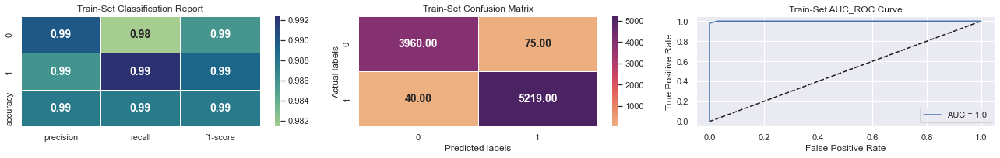

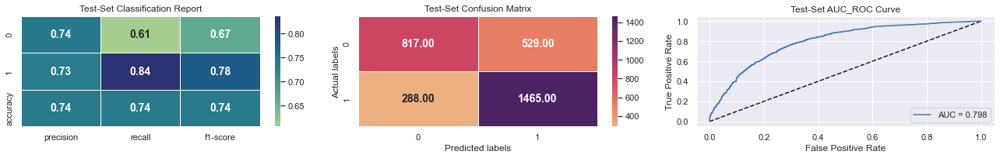

AdaBoostClassifier(estimator=RandomForestClassifier(n_jobs=-1, oob_score=True),
                   learning_rate=1, random_state=101)

In [367]:
# Importing AdaBoostClassifier
from sklearn.ensemble import AdaBoostClassifier

# Fitting AdaBoostClassifier Model
adboost_classifier_ohe = AdaBoostClassifier(RandomForestClassifier(oob_score=True,n_jobs=-1), learning_rate=1,algorithm="SAMME.R", random_state =101)

# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(adboost_classifier_ohe, x_train_ohe, x_test_ohe, y_train, y_test)

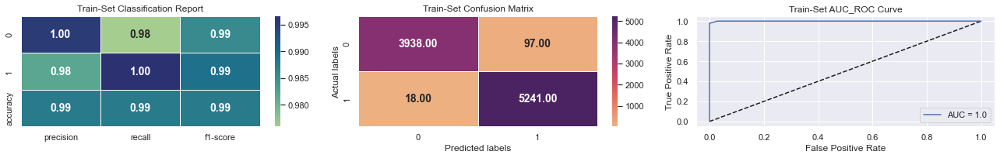

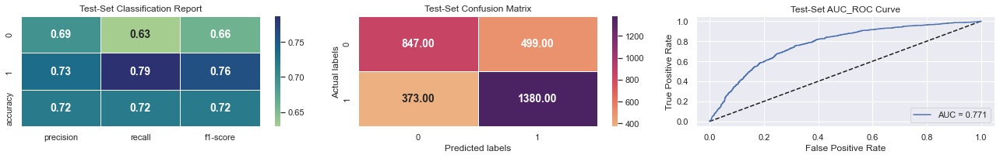

AdaBoostClassifier(estimator=DecisionTreeClassifier(), learning_rate=1,
                   random_state=101)

In [368]:
# Importing AdaBoostClassifier
from sklearn.ensemble import AdaBoostClassifier

# Fitting AdaBoostClassifier Model
adboost_classifier_ohe1 = AdaBoostClassifier(DecisionTreeClassifier(), learning_rate=1,algorithm="SAMME.R", random_state =101)

# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(adboost_classifier_ohe1, x_train_ohe, x_test_ohe, y_train, y_test)

In [ ]:
#### on ordinal

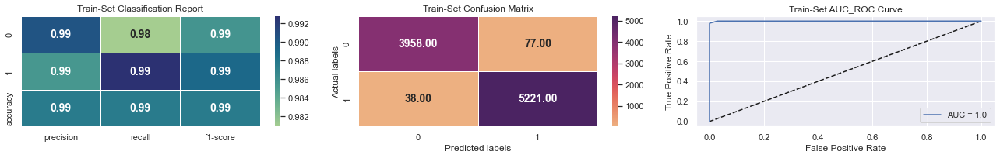

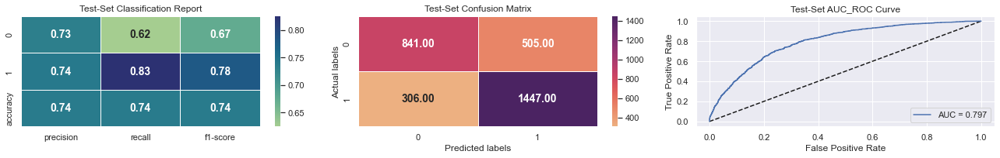

AdaBoostClassifier(estimator=RandomForestClassifier(n_jobs=-1, oob_score=True),
                   learning_rate=1, random_state=101)

In [369]:
# Importing AdaBoostClassifier
from sklearn.ensemble import AdaBoostClassifier

# Fitting AdaBoostClassifier Model
adboost_classifier_ordinal = AdaBoostClassifier(RandomForestClassifier(oob_score=True,n_jobs=-1), learning_rate=1,algorithm="SAMME.R", random_state =101)

# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(adboost_classifier_ordinal, x_train_ordinal, x_test_ordinal, y_train, y_test)

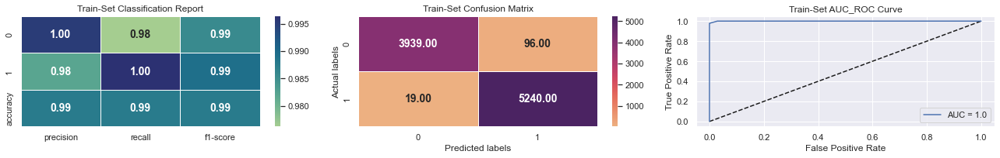

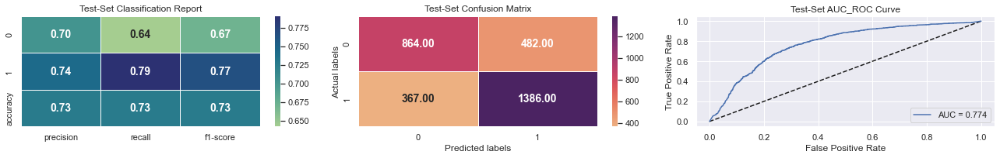

AdaBoostClassifier(estimator=DecisionTreeClassifier(), learning_rate=1,
                   random_state=101)

In [370]:
# Importing AdaBoostClassifier
from sklearn.ensemble import AdaBoostClassifier

# Fitting AdaBoostClassifier Model
adboost_classifier_ordinal1 = AdaBoostClassifier(DecisionTreeClassifier(), learning_rate=1,algorithm="SAMME.R", random_state =101)

# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(adboost_classifier_ordinal1, x_train_ordinal, x_test_ordinal, y_train, y_test)

In [ ]:
#### on ohe+ord

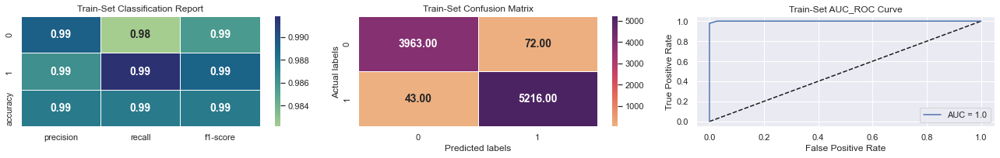

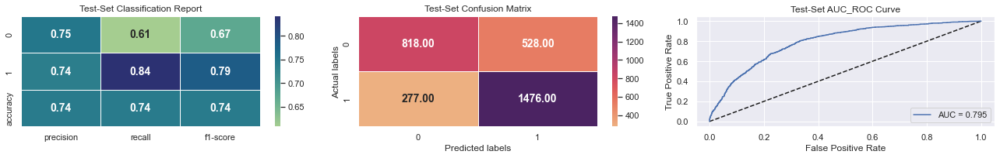

AdaBoostClassifier(estimator=RandomForestClassifier(n_jobs=-1, oob_score=True),
                   learning_rate=1, random_state=101)

In [351]:
# Importing AdaBoostClassifier
from sklearn.ensemble import AdaBoostClassifier

# Fitting AdaBoostClassifier Model
adboost_classifier_ohe_ord = AdaBoostClassifier(RandomForestClassifier(oob_score=True,n_jobs=-1), learning_rate=1,algorithm="SAMME.R", random_state =101)

# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(adboost_classifier_ohe_ord, x_train_ohe_ord, x_test_ohe_ord, y_train, y_test)

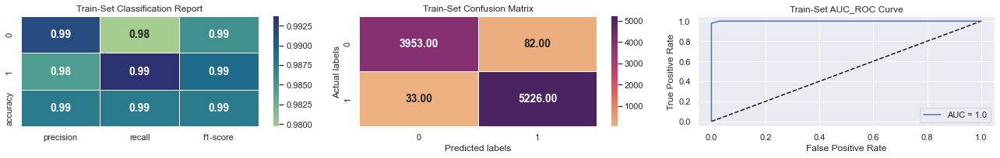

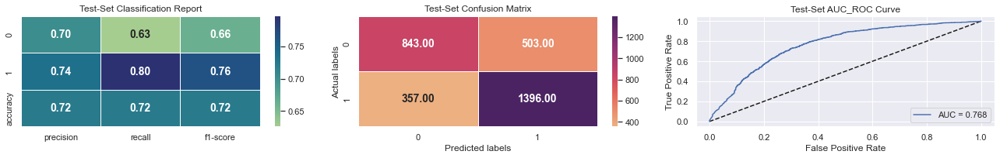

AdaBoostClassifier(estimator=DecisionTreeClassifier(), learning_rate=1,
                   random_state=101)

In [352]:
# Importing AdaBoostClassifier
from sklearn.ensemble import AdaBoostClassifier

# Fitting AdaBoostClassifier Model
adboost_classifier_ohe_ord1 = AdaBoostClassifier(DecisionTreeClassifier(), learning_rate=1,algorithm="SAMME.R", random_state =101)

# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(adboost_classifier_ohe_ord1, x_train_ohe_ord, x_test_ohe_ord, y_train, y_test)

Confusion matrix (train)
[[3960   75]
 [  40 5219]]
********************************************************************
Confusion matrix (test)
[[ 818  528]
 [ 277 1476]]
**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       0.99      0.98      0.99      4035
           1       0.99      0.99      0.99      5259

    accuracy                           0.99      9294
   macro avg       0.99      0.99      0.99      9294
weighted avg       0.99      0.99      0.99      9294

**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       0.75      0.61      0.67      1346
           1       0.74      0.84      0.79      1753

    accuracy                           0.74      3099
   macro avg       0.74      0.72      0.73      3099
weighted avg       0.74      0

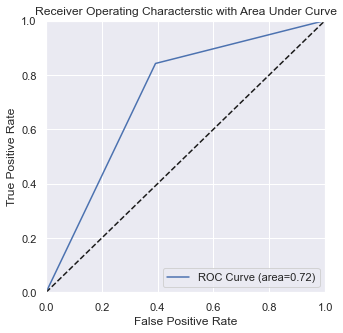

In [387]:
from sklearn.ensemble import AdaBoostClassifier


logit_model =  AdaBoostClassifier(RandomForestClassifier(oob_score=True,n_jobs=-1), learning_rate=1,algorithm="SAMME.R", random_state =101)

logit_model.fit(x_train_ohe_ord, y_train)

# Predict Result
y_predict_train = logit_model.predict(x_train_ohe_ord)
y_predict_test = logit_model.predict(x_test_ohe_ord)


# Evalution after hyperparameter tuning
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("********************************************************************")
print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("**********************************************************************")
print("Classification Report(train)")
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Classification Report(test)')
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
accuracy = cross_val_score(logit_model, x_test_ohe_ord, y_test, cv=20)
print(f"Accuracy : {accuracy}")
print("***********************************************************************")
print("Average accuracy after 20 splits", accuracy.mean())
print('***********************************************************************')
print('Highest accuracy', accuracy.max())
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")
print("***********************************************************************")
# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

## ML Model - 7  Gradient Boosting Decision Tree (GBDT)

### 1.  Explain the ML Model and it's performance using Evaluation metric Score Chart.

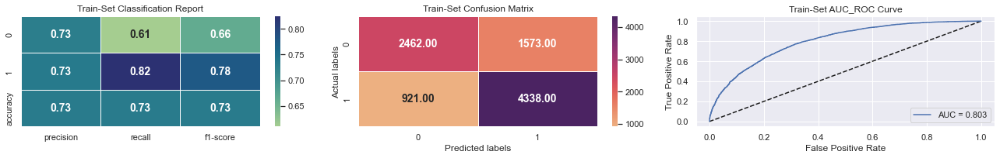

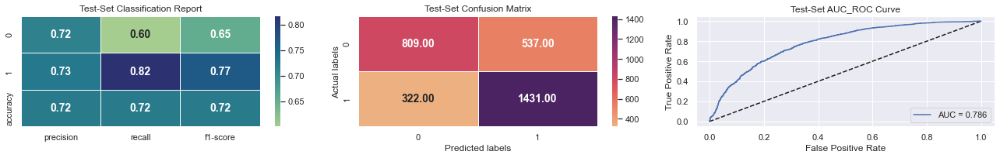

GradientBoostingClassifier(random_state=101)

In [364]:
# Importing GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingClassifier


# Fitting AdaBoostClassifier Model
gbdt_classifier_ohe = GradientBoostingClassifier(random_state =101)

# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(gbdt_classifier_ohe, x_train_ohe, x_test_ohe, y_train, y_test)

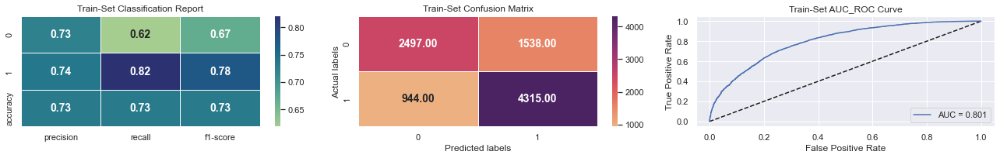

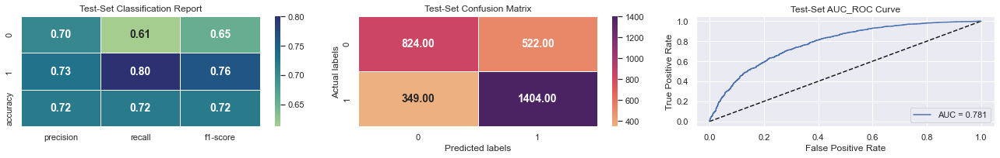

GradientBoostingClassifier(random_state=101)

In [365]:
# Importing GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingClassifier


# Fitting AdaBoostClassifier Model
gbdt_classifier_ordinal = GradientBoostingClassifier(random_state =101)

# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(gbdt_classifier_ordinal, x_train_ordinal, x_test_ordinal, y_train, y_test)


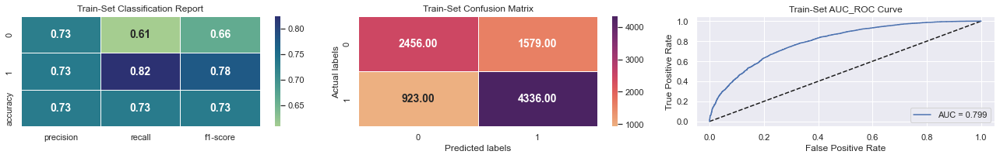

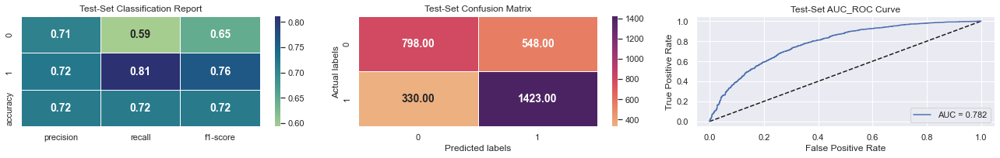

GradientBoostingClassifier(random_state=101)

In [366]:
# Importing GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingClassifier


# Fitting AdaBoostClassifier Model
gbdt_classifier_ohe_ord = GradientBoostingClassifier(random_state =101)

# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(gbdt_classifier_ohe_ord, x_train_ohe_ord, x_test_ohe_ord, y_train, y_test)

## ML Model - 8 XGboost

### 1.  Explain the ML Model and it's performance using Evaluation metric Score Chart.

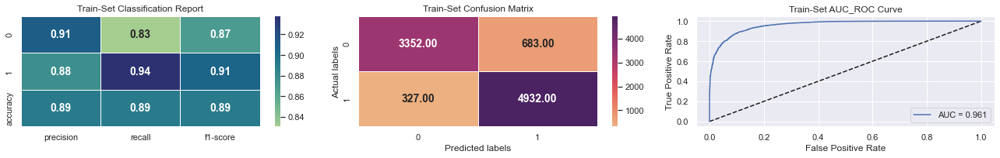

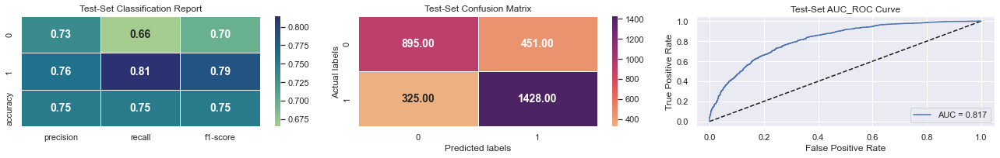

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [381]:
# Importing RandomForestClassifier
from xgboost import XGBClassifier

# Fitting XGBClassifier Model
XGB_classifier_ohe = XGBClassifier()

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(XGB_classifier_ohe, x_train_ohe.to_numpy(), x_test_ohe.to_numpy(), y_train.to_numpy(), y_test.to_numpy())
     


Confusion matrix (train)
[[3352  683]
 [ 327 4932]]
********************************************************************
Confusion matrix (test)
[[ 895  451]
 [ 325 1428]]
**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       0.91      0.83      0.87      4035
           1       0.88      0.94      0.91      5259

    accuracy                           0.89      9294
   macro avg       0.89      0.88      0.89      9294
weighted avg       0.89      0.89      0.89      9294

**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       0.73      0.66      0.70      1346
           1       0.76      0.81      0.79      1753

    accuracy                           0.75      3099
   macro avg       0.75      0.74      0.74      3099
weighted avg       0.75      0

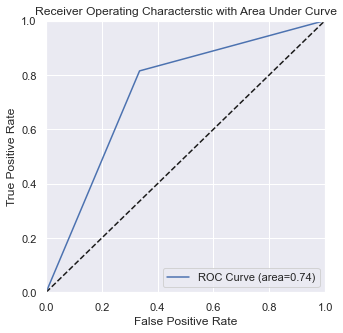

In [393]:
from sklearn.linear_model import LogisticRegression

logit_model = XGBClassifier()
logit_model.fit(x_train_ohe.to_numpy(), y_train)

# Predict Result
y_predict_train = logit_model.predict(x_train_ohe)
y_predict_test = logit_model.predict(x_test_ohe)


# Evalution after hyperparameter tuning
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("********************************************************************")
print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("**********************************************************************")
print("Classification Report(train)")
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Classification Report(test)')
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
accuracy = cross_val_score(logit_model, x_test_ohe.to_numpy(), y_test, cv=20)
print(f"Accuracy : {accuracy}")
print("***********************************************************************")
print("Average accuracy after 20 splits", accuracy.mean())
print('***********************************************************************')
print('Highest accuracy', accuracy.max())
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")
print("***********************************************************************")
# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

The best parameters are: {'subsample': 1.0, 'min_child_weight': 5, 'max_depth': 5, 'gamma': 1.5, 'colsample_bytree': 0.8}


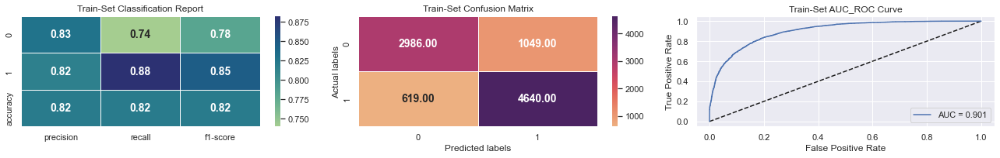

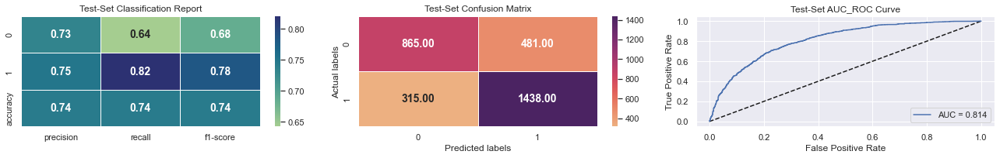

RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, gpu_id=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           max_delta_step=None, max_depth=None,
                                           max_leaves=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           n_estimators=100, n_jobs=None,
                                           num_parallel_tree=None,
                                           predictor=None, random_state=None, ...),
                   param_distributions={'colsample_bytree': [0.6, 0.8, 1.0],
                                        'gamma': [0.5, 1, 1.5, 2, 5],
                                        'max_depth': [3, 4, 5],
                                        'min_child_weight': [1, 5, 10],
                                        'subsample': [0.6, 0.8, 1.0]},
                   scoring='precision')

In [383]:
# Importing GridSearchCV from sklearn
from sklearn.model_selection import RandomizedSearchCV


# Defining parameters
parameters = {'min_child_weight': [1, 5, 10],'gamma': [0.5, 1, 1.5, 2, 5],
              'subsample': [0.6, 0.8, 1.0],'colsample_bytree': [0.6, 0.8, 1.0],
              'max_depth': [3, 4, 5]}

# Fitting LogisticRegression Model with GridSearchCV
DT_grid_classifier_ohe = RandomizedSearchCV(XGB_classifier_ohe, parameters, scoring="precision", cv=5)

# Analysing the model
analyse_model(DT_grid_classifier_ohe, x_train_ohe.to_numpy(), x_test_ohe.to_numpy(), y_train, y_test)


Confusion matrix (train)
[[2986 1049]
 [ 619 4640]]
********************************************************************
Confusion matrix (test)
[[ 865  481]
 [ 315 1438]]
**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       0.83      0.74      0.78      4035
           1       0.82      0.88      0.85      5259

    accuracy                           0.82      9294
   macro avg       0.82      0.81      0.81      9294
weighted avg       0.82      0.82      0.82      9294

**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       0.73      0.64      0.68      1346
           1       0.75      0.82      0.78      1753

    accuracy                           0.74      3099
   macro avg       0.74      0.73      0.73      3099
weighted avg       0.74      0

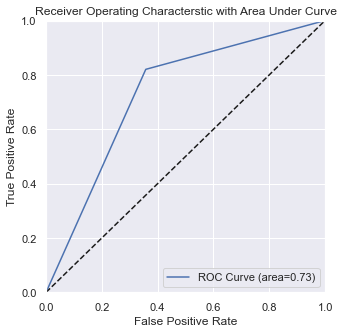

In [394]:
from sklearn.linear_model import LogisticRegression

logit_model = XGBClassifier(subsample=1.0, min_child_weight=5, max_depth=5, gamma=1.5, colsample_bytree=0.8)
logit_model.fit(x_train_ohe.to_numpy(), y_train)

# Predict Result
y_predict_train = logit_model.predict(x_train_ohe)
y_predict_test = logit_model.predict(x_test_ohe)


# Evalution after hyperparameter tuning
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("********************************************************************")
print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("**********************************************************************")
print("Classification Report(train)")
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Classification Report(test)')
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
accuracy = cross_val_score(logit_model, x_test_ohe.to_numpy(), y_test, cv=20)
print(f"Accuracy : {accuracy}")
print("***********************************************************************")
print("Average accuracy after 20 splits", accuracy.mean())
print('***********************************************************************')
print('Highest accuracy', accuracy.max())
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")
print("***********************************************************************")
# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

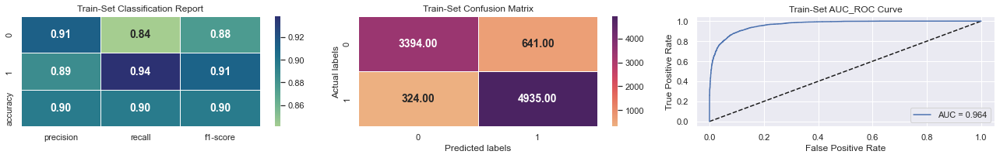

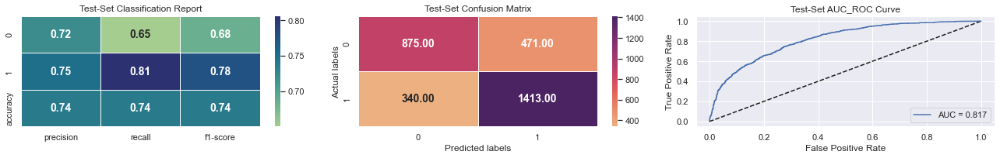

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [384]:
# Importing RandomForestClassifier
from xgboost import XGBClassifier

# Fitting XGBClassifier Model
XGB_classifier_ordinal = XGBClassifier()

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(XGB_classifier_ordinal, x_train_ordinal.to_numpy(), x_test_ordinal.to_numpy(), y_train.to_numpy(), y_test.to_numpy())
     


Confusion matrix (train)
[[3394  641]
 [ 324 4935]]
********************************************************************
Confusion matrix (test)
[[ 875  471]
 [ 340 1413]]
**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       0.91      0.84      0.88      4035
           1       0.89      0.94      0.91      5259

    accuracy                           0.90      9294
   macro avg       0.90      0.89      0.89      9294
weighted avg       0.90      0.90      0.90      9294

**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       0.72      0.65      0.68      1346
           1       0.75      0.81      0.78      1753

    accuracy                           0.74      3099
   macro avg       0.74      0.73      0.73      3099
weighted avg       0.74      0

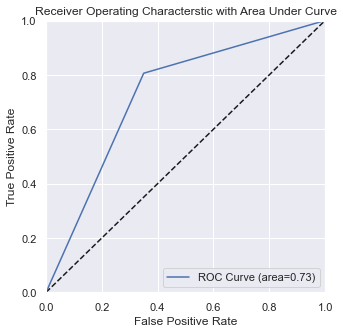

In [396]:
from sklearn.linear_model import LogisticRegression

logit_model = XGBClassifier()
logit_model.fit(x_train_ordinal.to_numpy(), y_train)

# Predict Result
y_predict_train = logit_model.predict(x_train_ordinal)
y_predict_test = logit_model.predict(x_test_ordinal)


# Evalution after hyperparameter tuning
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("********************************************************************")
print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("**********************************************************************")
print("Classification Report(train)")
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Classification Report(test)')
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
accuracy = cross_val_score(logit_model, x_test_ordinal.to_numpy(), y_test, cv=20)
print(f"Accuracy : {accuracy}")
print("***********************************************************************")
print("Average accuracy after 20 splits", accuracy.mean())
print('***********************************************************************')
print('Highest accuracy', accuracy.max())
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")
print("***********************************************************************")
# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

The best parameters are: {'subsample': 0.8, 'min_child_weight': 1, 'max_depth': 5, 'gamma': 2, 'colsample_bytree': 0.8}


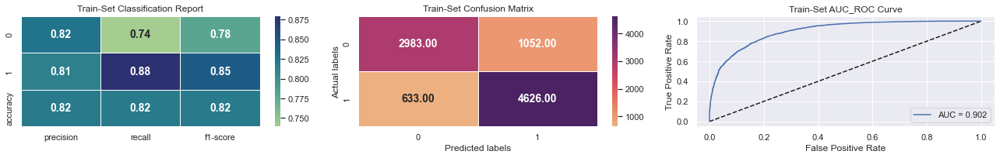

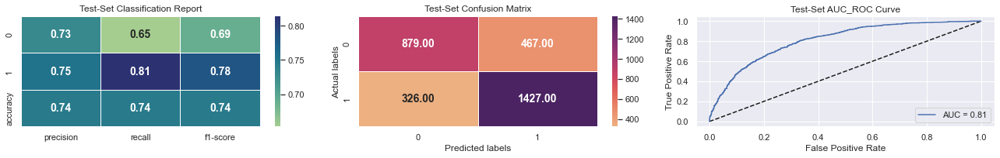

RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, gpu_id=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           max_delta_step=None, max_depth=None,
                                           max_leaves=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           n_estimators=100, n_jobs=None,
                                           num_parallel_tree=None,
                                           predictor=None, random_state=None, ...),
                   param_distributions={'colsample_bytree': [0.6, 0.8, 1.0],
                                        'gamma': [0.5, 1, 1.5, 2, 5],
                                        'max_depth': [3, 4, 5],
                                        'min_child_weight': [1, 5, 10],
                                        'subsample': [0.6, 0.8, 1.0]},
                   scoring='precision')

In [385]:
# Importing GridSearchCV from sklearn
from sklearn.model_selection import RandomizedSearchCV


# Defining parameters
parameters = {'min_child_weight': [1, 5, 10],'gamma': [0.5, 1, 1.5, 2, 5],
              'subsample': [0.6, 0.8, 1.0],'colsample_bytree': [0.6, 0.8, 1.0],
              'max_depth': [3, 4, 5]}

# Fitting LogisticRegression Model with GridSearchCV
DT_grid_classifier_ordinal = RandomizedSearchCV(XGB_classifier_ordinal, parameters, scoring="precision", cv=5)

# Analysing the model
analyse_model(DT_grid_classifier_ordinal, x_train_ordinal.to_numpy(), x_test_ordinal.to_numpy(), y_train, y_test)


Confusion matrix (train)
[[2983 1052]
 [ 633 4626]]
********************************************************************
Confusion matrix (test)
[[ 879  467]
 [ 326 1427]]
**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       0.82      0.74      0.78      4035
           1       0.81      0.88      0.85      5259

    accuracy                           0.82      9294
   macro avg       0.82      0.81      0.81      9294
weighted avg       0.82      0.82      0.82      9294

**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       0.73      0.65      0.69      1346
           1       0.75      0.81      0.78      1753

    accuracy                           0.74      3099
   macro avg       0.74      0.73      0.74      3099
weighted avg       0.74      0

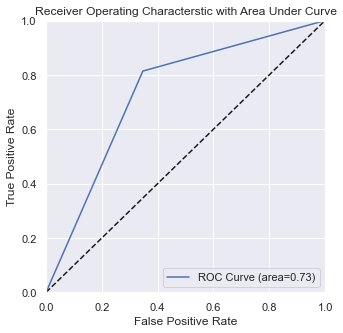

In [397]:
from sklearn.linear_model import LogisticRegression

logit_model = XGBClassifier(subsample=0.8, min_child_weight=1, max_depth=5, gamma=2, colsample_bytree=0.8)
logit_model.fit(x_train_ordinal.to_numpy(), y_train)

# Predict Result
y_predict_train = logit_model.predict(x_train_ordinal)
y_predict_test = logit_model.predict(x_test_ordinal)


# Evalution after hyperparameter tuning
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("********************************************************************")
print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("**********************************************************************")
print("Classification Report(train)")
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Classification Report(test)')
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
accuracy = cross_val_score(logit_model, x_test_ordinal.to_numpy(), y_test, cv=20)
print(f"Accuracy : {accuracy}")
print("***********************************************************************")
print("Average accuracy after 20 splits", accuracy.mean())
print('***********************************************************************')
print('Highest accuracy', accuracy.max())
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")
print("***********************************************************************")
# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

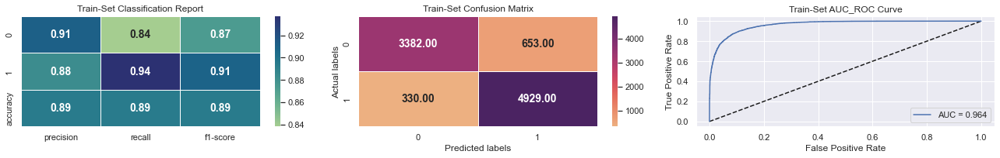

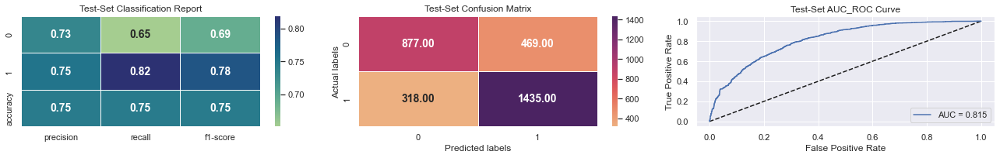

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [386]:
# Importing RandomForestClassifier
from xgboost import XGBClassifier

# Fitting XGBClassifier Model
XGB_classifier_ohe_ord = XGBClassifier()

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(XGB_classifier_ohe_ord, x_train_ohe_ord.to_numpy(), x_test_ohe_ord.to_numpy(), y_train.to_numpy(), y_test.to_numpy())
     


Confusion matrix (train)
[[3382  653]
 [ 330 4929]]
********************************************************************
Confusion matrix (test)
[[ 877  469]
 [ 318 1435]]
**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       0.91      0.84      0.87      4035
           1       0.88      0.94      0.91      5259

    accuracy                           0.89      9294
   macro avg       0.90      0.89      0.89      9294
weighted avg       0.90      0.89      0.89      9294

**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       0.73      0.65      0.69      1346
           1       0.75      0.82      0.78      1753

    accuracy                           0.75      3099
   macro avg       0.74      0.74      0.74      3099
weighted avg       0.75      0

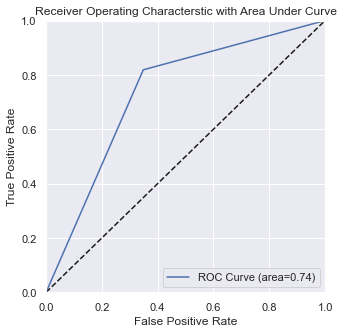

In [398]:
from sklearn.linear_model import LogisticRegression

logit_model = XGBClassifier()
logit_model.fit(x_train_ohe_ord.to_numpy(), y_train)

# Predict Result
y_predict_train = logit_model.predict(x_train_ohe_ord)
y_predict_test = logit_model.predict(x_test_ohe_ord)


# Evalution after hyperparameter tuning
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("********************************************************************")
print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("**********************************************************************")
print("Classification Report(train)")
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Classification Report(test)')
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
accuracy = cross_val_score(logit_model, x_test_ohe_ord.to_numpy(), y_test, cv=20)
print(f"Accuracy : {accuracy}")
print("***********************************************************************")
print("Average accuracy after 20 splits", accuracy.mean())
print('***********************************************************************')
print('Highest accuracy', accuracy.max())
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")
print("***********************************************************************")
# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

The best parameters are: {'subsample': 1.0, 'min_child_weight': 10, 'max_depth': 5, 'gamma': 0.5, 'colsample_bytree': 0.8}


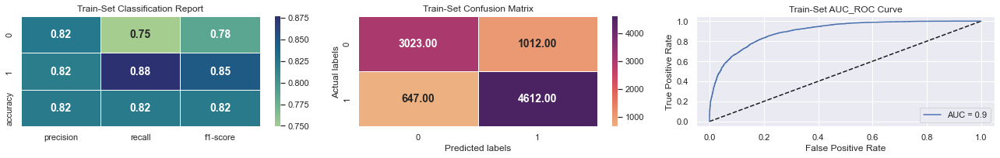

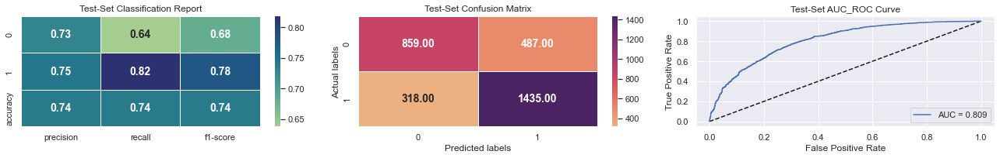

RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, gpu_id=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           max_delta_step=None, max_depth=None,
                                           max_leaves=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           n_estimators=100, n_jobs=None,
                                           num_parallel_tree=None,
                                           predictor=None, random_state=None, ...),
                   param_distributions={'colsample_bytree': [0.6, 0.8, 1.0],
                                        'gamma': [0.5, 1, 1.5, 2, 5],
                                        'max_depth': [3, 4, 5],
                                        'min_child_weight': [1, 5, 10],
                                        'subsample': [0.6, 0.8, 1.0]},
                   scoring='precision')

In [387]:
# Importing GridSearchCV from sklearn
from sklearn.model_selection import RandomizedSearchCV


# Defining parameters
parameters = {'min_child_weight': [1, 5, 10],'gamma': [0.5, 1, 1.5, 2, 5],
              'subsample': [0.6, 0.8, 1.0],'colsample_bytree': [0.6, 0.8, 1.0],
              'max_depth': [3, 4, 5]}

# Fitting LogisticRegression Model with GridSearchCV
DT_grid_classifier_ohe_ord = RandomizedSearchCV(XGB_classifier_ohe_ord, parameters, scoring="precision", cv=5)

# Analysing the model
analyse_model(DT_grid_classifier_ohe_ord, x_train_ohe_ord.to_numpy(), x_test_ohe_ord.to_numpy(), y_train, y_test)


Confusion matrix (train)
[[3023 1012]
 [ 647 4612]]
********************************************************************
Confusion matrix (test)
[[ 859  487]
 [ 318 1435]]
**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       0.82      0.75      0.78      4035
           1       0.82      0.88      0.85      5259

    accuracy                           0.82      9294
   macro avg       0.82      0.81      0.82      9294
weighted avg       0.82      0.82      0.82      9294

**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       0.73      0.64      0.68      1346
           1       0.75      0.82      0.78      1753

    accuracy                           0.74      3099
   macro avg       0.74      0.73      0.73      3099
weighted avg       0.74      0

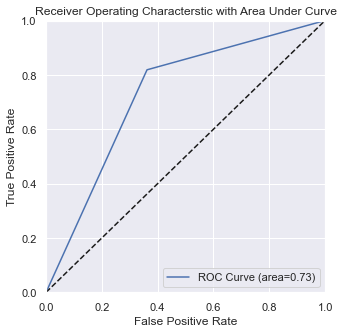

In [399]:
from sklearn.linear_model import XGBClassifier

logit_model = XGBClassifier(subsample=1.0, min_child_weight=10, max_depth=5, gamma=0.5, colsample_bytree=0.8)
logit_model.fit(x_train_ohe_ord.to_numpy(), y_train)

# Predict Result
y_predict_train = logit_model.predict(x_train_ohe_ord)
y_predict_test = logit_model.predict(x_test_ohe_ord)


# Evalution after hyperparameter tuning
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("********************************************************************")
print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("**********************************************************************")
print("Classification Report(train)")
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Classification Report(test)')
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
accuracy = cross_val_score(logit_model, x_test_ohe_ord.to_numpy(), y_test, cv=20)
print(f"Accuracy : {accuracy}")
print("***********************************************************************")
print("Average accuracy after 20 splits", accuracy.mean())
print('***********************************************************************')
print('Highest accuracy', accuracy.max())
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")
print("***********************************************************************")
# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

## ML Model - 9 Naive Bayes

### 1.  Explain the ML Model and it's performance using Evaluation metric Score Chart.

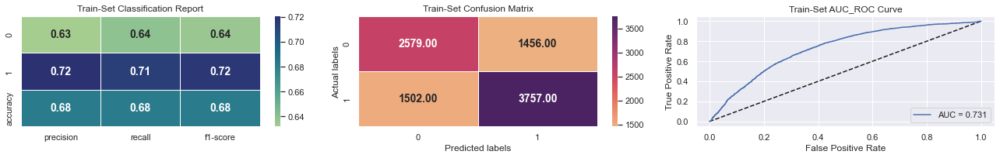

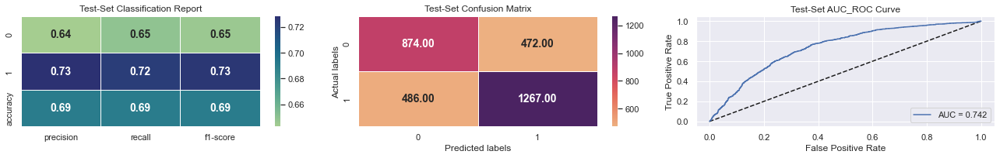

GaussianNB()

In [389]:
# Importing GaussianNB
from sklearn.naive_bayes import GaussianNB

# Fitting GaussianNB Model
NB_classifier_ohe = GaussianNB()

# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(NB_classifier_ohe, x_train_ohe, x_test_ohe, y_train, y_test)

The best parameters are: {'var_smoothing': 1e-10}


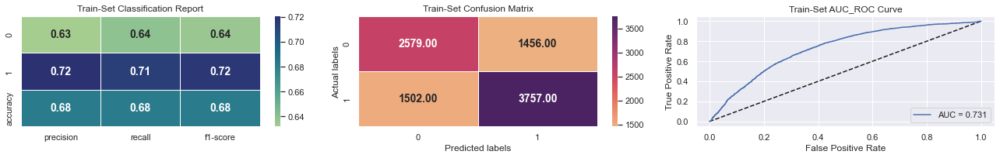

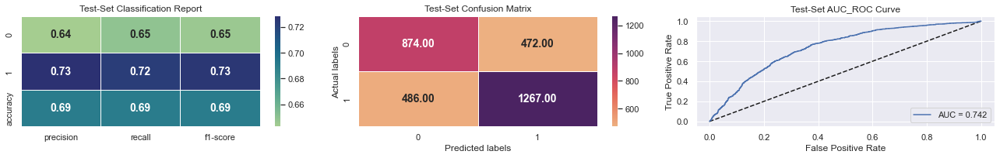

RandomizedSearchCV(cv=5, estimator=GaussianNB(),
                   param_distributions={'var_smoothing': [0.01, 0.001, 0.0001,
                                                          1e-05, 1e-06, 1e-07,
                                                          1e-08, 1e-09, 1e-10,
                                                          1e-11, 1e-12, 1e-13,
                                                          1e-14, 1e-15]},
                   scoring='precision')

In [390]:
# Importing GridSearchCV from sklearn
from sklearn.model_selection import RandomizedSearchCV


# Defining parameters
parameters = {'var_smoothing': [1e-2, 1e-3, 1e-4, 1e-5, 1e-6, 1e-7, 1e-8, 1e-9, 1e-10, 1e-11, 1e-12, 1e-13, 1e-14, 1e-15]}

# Fitting LogisticRegression Model with GridSearchCV
DT_grid_classifier_ohe = RandomizedSearchCV(NB_classifier_ohe, parameters, scoring="precision", cv=5)

# Analysing the model
analyse_model(DT_grid_classifier_ohe, x_train_ohe, x_test_ohe, y_train, y_test)


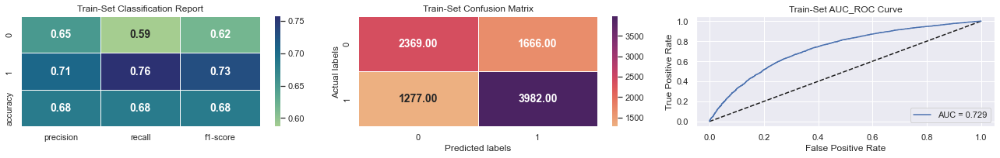

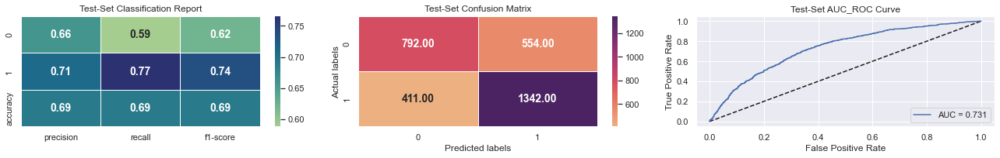

GaussianNB()

In [357]:
# Importing GaussianNB
from sklearn.naive_bayes import GaussianNB

# Fitting GaussianNB Model
NB_classifier_ordinal = GaussianNB()

# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(NB_classifier_ordinal, x_train_ordinal, x_test_ordinal, y_train, y_test)

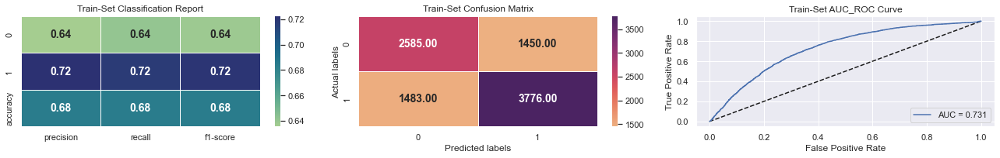

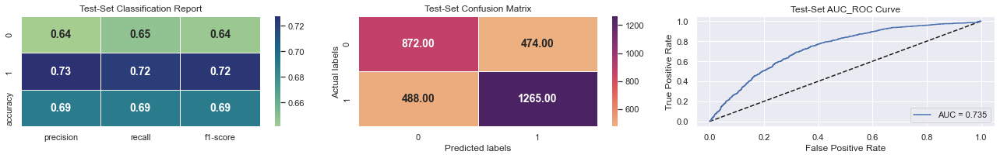

GaussianNB()

In [358]:
# Importing GaussianNB
from sklearn.naive_bayes import GaussianNB

# Fitting GaussianNB Model
NB_classifier_ohe_ord = GaussianNB()

# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(NB_classifier_ohe_ord, x_train_ohe_ord, x_test_ohe_ord, y_train, y_test)

## ML Model - 10 SVC

### 1.  Explain the ML Model and it's performance using Evaluation metric Score Chart.

In [ ]:
#### on ohe

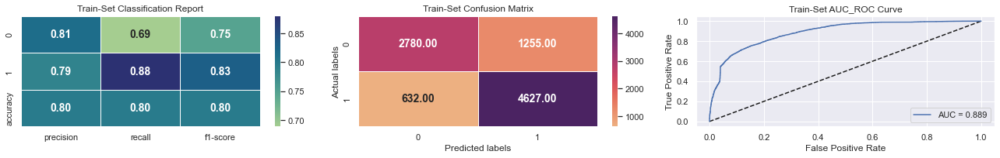

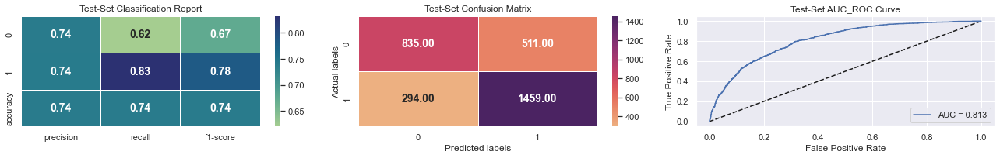

SVC(probability=True, random_state=0)

In [401]:
# Importing SVC
from sklearn.svm import SVC

# Fitting SVC Model
SVC_classifier_ohe = SVC(probability= True,random_state=0)

# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(SVC_classifier_ohe, x_train_ohe, x_test_ohe, y_train, y_test)

Confusion matrix (train)
[[2780 1255]
 [ 632 4627]]
********************************************************************
Confusion matrix (test)
[[ 835  511]
 [ 294 1459]]
**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       0.81      0.69      0.75      4035
           1       0.79      0.88      0.83      5259

    accuracy                           0.80      9294
   macro avg       0.80      0.78      0.79      9294
weighted avg       0.80      0.80      0.79      9294

**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       0.74      0.62      0.67      1346
           1       0.74      0.83      0.78      1753

    accuracy                           0.74      3099
   macro avg       0.74      0.73      0.73      3099
weighted avg       0.74      0

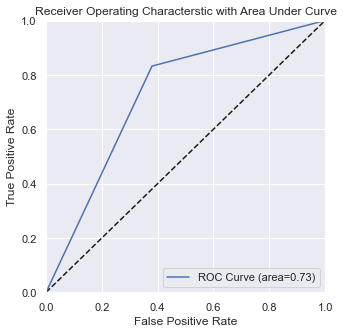

In [362]:
from sklearn.linear_model import LogisticRegression

logit_model = SVC(probability= True,random_state=0)
logit_model.fit(x_train_ohe, y_train)

# Predict Result
y_predict_train = logit_model.predict(x_train_ohe)
y_predict_test = logit_model.predict(x_test_ohe)


# Evalution after hyperparameter tuning
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("********************************************************************")
print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("**********************************************************************")
print("Classification Report(train)")
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Classification Report(test)')
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
accuracy = cross_val_score(logit_model, x_test_ohe, y_test, cv=20)
print(f"Accuracy : {accuracy}")
print("***********************************************************************")
print("Average accuracy after 20 splits", accuracy.mean())
print('***********************************************************************')
print('Highest accuracy', accuracy.max())
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")
print("***********************************************************************")
# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

In [ ]:
# Importing GridSearchCV from sklearn
from sklearn.model_selection import RandomizedSearchCV


# Defining parameters
parameters = {'C':[1,10,100,1000],'gamma':[1,0.1,0.001,0.0001], 'kernel':['linear','rbf']}

# Fitting LogisticRegression Model with GridSearchCV
DT_grid_classifier_ohe = RandomizedSearchCV(SVC_classifier_ohe, parameters, scoring="precision", cv=5)

# Analysing the model
analyse_model(DT_grid_classifier_ohe, x_train_ohe, x_test_ohe, y_train, y_test)


[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]The best parameters are: {'verbose': False, 'shrinking': True, 'probability': True, 'kernel': 'rbf', 'gamma': 'scale', 'degree': 2, 'decision_function_shape': 'ovo', 'break_ties': False, 'C': 50}


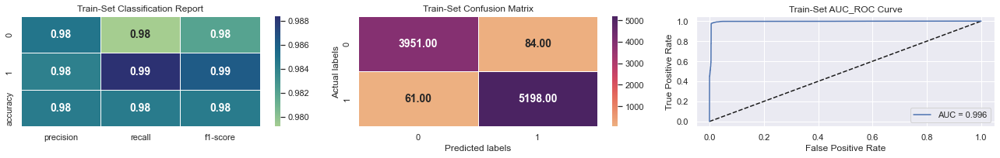

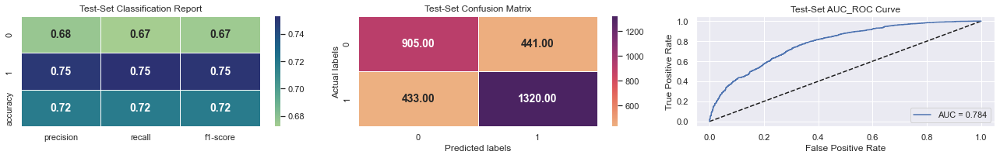

RandomizedSearchCV(cv=5, estimator=SVC(probability=True, random_state=0),
                   param_distributions={'C': [0.01, 0.1, 0.5, 1, 5, 10, 20, 25,
                                              40, 50],
                                        'break_ties': [True, False],
                                        'decision_function_shape': ['ovo',
                                                                    'ovr'],
                                        'degree': [1, 2, 3, 4],
                                        'gamma': ['scale', 'auto'],
                                        'kernel': ['linear', 'poly', 'rbf',
                                                   'sigmoid'],
                                        'probability': [True, False],
                                        'shrinking': [True, False],
                                        'verbose': [True, False]},
                   scoring='precision')

In [375]:
# Importing GridSearchCV from sklearn
from sklearn.model_selection import RandomizedSearchCV


# Defining parameters
parameters = {"C":[0.01,0.1,0.5,1,5,10,20,25,40,50],
             "kernel":['linear','poly', 'rbf', 'sigmoid'],
             "degree":[1,2,3,4], "gamma":['scale', 'auto'],
             "shrinking":[True, False], "probability":[True, False],
             "verbose":[True, False], "decision_function_shape":['ovo', 'ovr'],
             "break_ties":[True, False]}

# Fitting LogisticRegression Model with GridSearchCV
DT_grid_classifier_ohe = RandomizedSearchCV(SVC_classifier_ohe, parameters, scoring="precision", cv=5)

# Analysing the model
analyse_model(DT_grid_classifier_ohe, x_train_ohe, x_test_ohe, y_train, y_test)


Confusion matrix (train)
[[3951   84]
 [  61 5198]]
********************************************************************
Confusion matrix (test)
[[ 905  441]
 [ 433 1320]]
**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      4035
           1       0.98      0.99      0.99      5259

    accuracy                           0.98      9294
   macro avg       0.98      0.98      0.98      9294
weighted avg       0.98      0.98      0.98      9294

**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       0.68      0.67      0.67      1346
           1       0.75      0.75      0.75      1753

    accuracy                           0.72      3099
   macro avg       0.71      0.71      0.71      3099
weighted avg       0.72      0

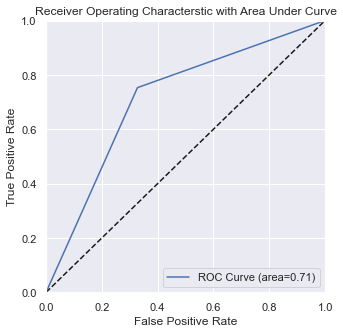

In [363]:
from sklearn.linear_model import LogisticRegression

logit_model = SVC(verbose=False, shrinking=True, probability=True, kernel='rbf', gamma='scale', degree=2, decision_function_shape='ovo', break_ties=False, C=50,random_state=0)
logit_model.fit(x_train_ohe, y_train)

# Predict Result
y_predict_train = logit_model.predict(x_train_ohe)
y_predict_test = logit_model.predict(x_test_ohe)


# Evalution after hyperparameter tuning
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("********************************************************************")
print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("**********************************************************************")
print("Classification Report(train)")
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Classification Report(test)')
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
accuracy = cross_val_score(logit_model, x_test_ohe, y_test, cv=20)
print(f"Accuracy : {accuracy}")
print("***********************************************************************")
print("Average accuracy after 20 splits", accuracy.mean())
print('***********************************************************************')
print('Highest accuracy', accuracy.max())
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")
print("***********************************************************************")
# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

In [ ]:
#### on ordinal

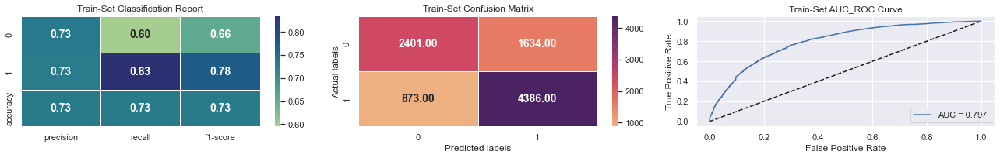

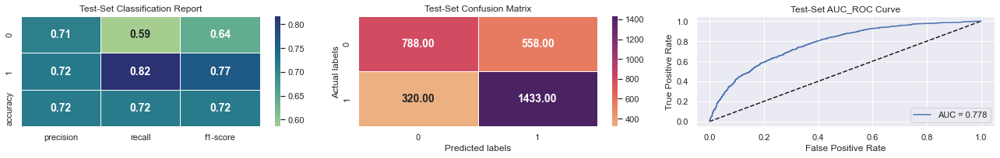

SVC(probability=True, random_state=0)

In [376]:
# Importing SVC
from sklearn.svm import SVC

# Fitting SVC Model
SVC_classifier_ordinal = SVC(probability= True,random_state=0)

# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(SVC_classifier_ordinal, x_train_ordinal, x_test_ordinal, y_train, y_test)

Confusion matrix (train)
[[2401 1634]
 [ 873 4386]]
********************************************************************
Confusion matrix (test)
[[ 788  558]
 [ 320 1433]]
**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       0.73      0.60      0.66      4035
           1       0.73      0.83      0.78      5259

    accuracy                           0.73      9294
   macro avg       0.73      0.71      0.72      9294
weighted avg       0.73      0.73      0.73      9294

**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       0.71      0.59      0.64      1346
           1       0.72      0.82      0.77      1753

    accuracy                           0.72      3099
   macro avg       0.72      0.70      0.70      3099
weighted avg       0.72      0

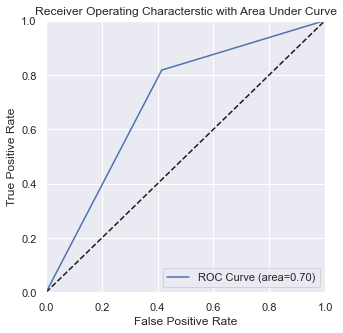

In [364]:
from sklearn.linear_model import LogisticRegression

logit_model = SVC(probability= True,random_state=0)
logit_model.fit(x_train_ordinal, y_train)

# Predict Result
y_predict_train = logit_model.predict(x_train_ordinal)
y_predict_test = logit_model.predict(x_test_ordinal)


# Evalution after hyperparameter tuning
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("********************************************************************")
print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("**********************************************************************")
print("Classification Report(train)")
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Classification Report(test)')
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
accuracy = cross_val_score(logit_model, x_test_ohe, y_test, cv=20)
print(f"Accuracy : {accuracy}")
print("***********************************************************************")
print("Average accuracy after 20 splits", accuracy.mean())
print('***********************************************************************')
print('Highest accuracy', accuracy.max())
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")
print("***********************************************************************")
# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

In [ ]:
# Importing GridSearchCV from sklearn
from sklearn.model_selection import RandomizedSearchCV


# Defining parameters
parameters = {"C":[0.01,0.1,0.5,1,5,10,20,25,40,50],
             "kernel":['linear', 'poly', 'rbf', 'sigmoid'],
             "degree":[1,2,3,4], "gamma":['scale', 'auto'],
             "shrinking":[True, False], "probability":[True, False],
             "verbose":[True, False], "decision_function_shape":['ovo', 'ovr'],
             "break_ties":[True, False]}

# Fitting LogisticRegression Model with GridSearchCV
DT_grid_classifier_ordinal = RandomizedSearchCV(SVC_classifier_ordinal, parameters, scoring="precision", cv=5)

# Analysing the model
analyse_model(DT_grid_classifier_ordinal, x_train_ordinal, x_test_ordinal, y_train, y_test)


[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]

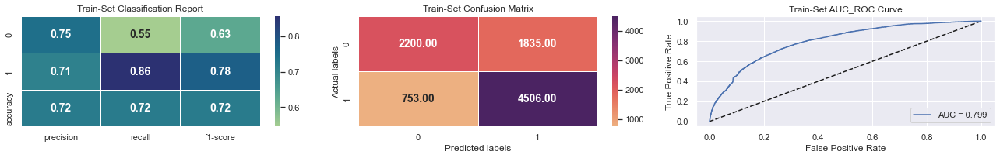

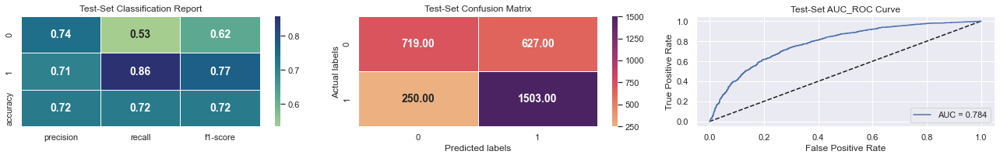

SVC(probability=True, random_state=0)

In [403]:
# Importing SVC
from sklearn.svm import SVC

# Fitting SVC Model
SVC_classifier_ohe_ord = SVC(probability= True,random_state=0)

# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(SVC_classifier_ohe_ord, x_train_ohe_ord, x_test_ohe_ord, y_train, y_test)

Confusion matrix (train)
[[2200 1835]
 [ 753 4506]]
********************************************************************
Confusion matrix (test)
[[ 719  627]
 [ 250 1503]]
**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       0.75      0.55      0.63      4035
           1       0.71      0.86      0.78      5259

    accuracy                           0.72      9294
   macro avg       0.73      0.70      0.70      9294
weighted avg       0.73      0.72      0.71      9294

**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       0.74      0.53      0.62      1346
           1       0.71      0.86      0.77      1753

    accuracy                           0.72      3099
   macro avg       0.72      0.70      0.70      3099
weighted avg       0.72      0

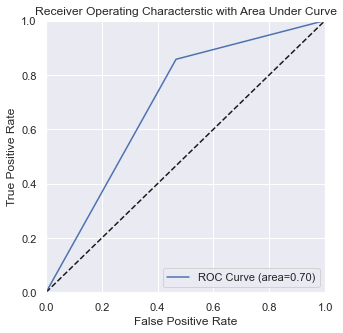

In [386]:
from sklearn.linear_model import LogisticRegression

logit_model = SVC(probability= True,random_state=0)
logit_model.fit(x_train_ohe_ord, y_train)

# Predict Result
y_predict_train = logit_model.predict(x_train_ohe_ord)
y_predict_test = logit_model.predict(x_test_ohe_ord)


# Evalution after hyperparameter tuning
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("********************************************************************")
print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("**********************************************************************")
print("Classification Report(train)")
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Classification Report(test)')
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
accuracy = cross_val_score(logit_model, x_test_ohe_ord, y_test, cv=20)
print(f"Accuracy : {accuracy}")
print("***********************************************************************")
print("Average accuracy after 20 splits", accuracy.mean())
print('***********************************************************************')
print('Highest accuracy', accuracy.max())
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")
print("***********************************************************************")
# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

In [ ]:
# Importing GridSearchCV from sklearn
from sklearn.model_selection import RandomizedSearchCV


# Defining parameters
parameters = {'C':[1,10,100,1000],'gamma':[1,0.1,0.001,0.0001], 'kernel':['linear','rbf']}

# Fitting LogisticRegression Model with GridSearchCV
DT_grid_classifier_ohe_ord = RandomizedSearchCV(SVC_classifier_ohe_ord, parameters, scoring="precision", cv=5)

# Analysing the model
analyse_model(DT_grid_classifier_ohe_ord, x_train_ohe_ord, x_test_ohe_ord, y_train, y_test)


In [393]:
# Storing different regression metrics in order to make dataframe and compare them
models = ["Logistic_regression","Decision_tree","Random_forest","AdaBoost","XGboost","SVM"]
Precision = [0.70,0.66,0.73,0.74,0.74,0.72] 
Recall = [0.69,66,0.72,0.72,0.73,0.70]
F1_Score= [0.69,0.66,0.72,0.73,0.73,0.70]
Accuracy = [0.70,0.66,0.73,0.74,0.74,0.72]
AUC = [0.764,0.665,0.789,0.768,0.809,0.784]

# Create dataframe from the lists
data = {'Models': models, 
        'Precision': Precision,
        'Recall': Recall,
        'F1_Score': F1_Score,
        'Accuracy': Accuracy,
        'AUC': AUC
       }
metric_df = pd.DataFrame(data)

# Printing dataframe
metric_df

,Models,Precision,Recall,F1_Score,Accuracy,AUC
0,Logistic_regression,0.70,0.69,0.69,0.70,0.764
1,Decision_tree,0.66,66.00,0.66,0.66,0.665
2,Random_forest,0.73,0.72,0.72,0.73,0.789
3,AdaBoost,0.74,0.72,0.73,0.74,0.768
4,XGboost,0.74,0.73,0.73,0.74,0.809
5,SVM,0.72,0.70,0.70,0.72,0.784
